<a href="https://colab.research.google.com/github/GUNAPILLCO/neural_profit/blob/main/stage_02_target_definition/stage_02_01_target_investigation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **stage_02_target_investigation**


## **Definición de targets a investigar (alineado con ML for Algorithmic Trading)**

El enfoque del libro establece que el objetivo del modelado no debe centrarse en predecir retornos o magnitudes exactas del precio, sino en construir **targets más estables, robustos y alineados con decisiones reales de trading**.

En este contexto, se define el siguiente conjunto de targets a investigar:

---

**T1. Dirección del movimiento (clasificación binaria)**

Se modela el problema como una clasificación simple:

* 1 → el precio sube en el horizonte H
* 0 → el precio no sube

Este enfoque reduce el ruido presente en los retornos y simplifica el problema a una decisión direccional.

---

**T2. Dirección con umbral (clasificación ternaria)**

Se introduce un umbral mínimo para filtrar movimientos poco relevantes:

* 1 → movimiento positivo significativo
* -1 → movimiento negativo significativo
* 0 → movimiento no significativo

Este target mejora la relación señal/ruido al ignorar variaciones pequeñas sin valor económico.

---

**T3. Outcome de trade (calidad de señal)**

El modelo no predice el mercado directamente, sino la calidad de una posible operación:

* 1 → trade exitoso
* 0 → trade no exitoso

Este enfoque permite evaluar si una señal tiene valor operativo, alineando el modelo con decisiones reales de trading.

---

**T4. Target basado en eventos (tipo barrera)**

Se define el target en función del resultado de un evento futuro:

* 1 → se alcanza take profit primero
* -1 → se alcanza stop loss primero
* 0 → no se alcanza ninguna condición dentro del horizonte

Este tipo de target está directamente alineado con la lógica de ejecución en trading.

---

**T5. Probabilidad de clase**

En todos los casos anteriores, el modelo puede formularse como un problema probabilístico:

* el modelo estima la probabilidad de cada clase
* las decisiones se toman en función de un umbral de confianza

Esto permite filtrar señales débiles y operar únicamente en escenarios de mayor certidumbre.



## **Estructura recomendada**

**Capítulo 1 — Construcción jerárquica de targets**

Acá defines TODOS los targets.

Desarrollas:

* qué es T1, T2, T3, T4, T5
* fórmulas
* relación entre ellos
* cómo evolucionan
* por qué cada uno mejora al anterior

Objetivo:
dejar toda la arquitectura conceptual cerrada.

---

**Capítulo 2 — Investigación estadística de targets**

Acá analizas TODOS los targets estadísticamente.

Por ejemplo:

* distribución de clases
* balance/desbalance
* frecuencia de trades
* cantidad de señales
* estabilidad temporal
* comportamiento por régimen

Objetivo:
entender si cada target es usable.

---

**Capítulo 3 — Relación targets-features**

Acá investigas:

* qué indicadores funcionan mejor para cada target
* mutual information
* IC
* correlaciones
* redundancia
* estabilidad OOS

Objetivo:
entender qué tipo de señales necesita cada target.

---

**Capítulo 4 — Modelado predictivo**

Acá entrenas modelos para TODOS los targets.

Por ejemplo:

* Logistic Regression
* Random Forest
* XGBoost
* GRU
* Transformer

Y comparas:

* accuracy
* f1
* balanced accuracy
* precision
* probabilidades

Objetivo:
ver qué targets son realmente predecibles.

---

**Capítulo 5 — Evaluación operativa final**

Acá conectas todo con trading real.

Analizas:

* pnl
* drawdown
* trade rate
* turnover
* Sharpe
* robustness
* thresholds de probabilidad

Y finalmente respondes:

* qué target sirve más
* qué modelo funciona mejor
* qué combinación es operable



## **Configuración del Entorno**


### **Acceso a Drive**

In [1]:
from google.colab import drive
drive.mount('/content/drive')
drive_path = "/content/drive/MyDrive/neural_profit"

Mounted at /content/drive


###**Importación de librerías**


In [2]:
import sys
import re
#Instalación de librería pandas_market_calendars
#!{sys.executable} -m pip install -q pandas_market_calendars
#print("Librería instalada: pandas_market_calendars")


from functools import reduce
# Utilidades generales
from datetime import datetime, timedelta
import os
import glob
import requests
import warnings
warnings.filterwarnings('ignore')

# Manejo y procesamiento de datos
#import ta
import pandas as pd
import numpy as np
from tabulate import tabulate
import matplotlib.pyplot as plt
# Calendario de mercados
#import pandas_market_calendars as mcal

#from ta.momentum import StochasticOscillator, ROCIndicator
#from ta.volatility import BollingerBands, AverageTrueRange

from scipy.stats import spearmanr
from __future__ import annotations  # permite type hints modernos (Python < 3.11)
import json                         # para guardar el summary como JSON
import os                           # para leer variables de entorno
from pathlib import Path            # manejo robusto de rutas
import pandas as pd

###**Definición de rutas**

In [3]:
DRIVE_DIR =   Path(os.environ.get("DRIVE_DIR", "/content/drive/MyDrive/neural_profit/"))

In [4]:
IN_PARQUET = Path(os.environ.get("IN_PARQUET", "data/02_processed/mnq_intraday.parquet"))
OUT_SUMMARY = Path(os.environ.get("OUT_SUMMARY", "reports/state_02_target_investigation_summary.json"))

In [5]:
# PARA EL NOTEBOOK:
IN_PARQUET = DRIVE_DIR / IN_PARQUET
OUT_SUMMARY = DRIVE_DIR / OUT_SUMMARY

### **Función para ver información de dataset**


In [6]:
from __future__ import annotations

from dataclasses import dataclass
from typing import Any, Dict, Optional, Tuple

import pandas as pd


def mnq_dataset_info(
    df: pd.DataFrame,
    *,
    name: str = "mnq_raw",
    tz_assume_if_naive: Optional[str] = None,  # ej: "UTC" o "America/New_York"
    day_def: str = "calendar",  # "calendar" (fecha calendario) o "trading" (días con datos)
) -> Dict[str, Any]:
    """
    Resume un dataset OHLCV con DatetimeIndex (ideal para mnq_raw).

    - Si el índice es tz-naive:
        - Si tz_assume_if_naive != None, lo localiza a esa tz.
        - Si no, reporta "tz-naive" (no se puede afirmar horario UTC).
    - Devuelve dict con métricas principales (y lo imprime bonito si se desea).
    """
    if not isinstance(df.index, pd.DatetimeIndex):
        raise TypeError(f"{name}: se requiere DatetimeIndex, recibido: {type(df.index)}")

    idx = df.index

    # --- timezone / UTC info ---
    tzinfo = idx.tz
    if tzinfo is None:
        tz_status = "tz-naive (sin zona horaria)"
        if tz_assume_if_naive:
            idx = idx.tz_localize(tz_assume_if_naive)
            tzinfo = idx.tz
            tz_status = f"localizado como {tzinfo}"
    else:
        tz_status = f"{tzinfo}"

    # --- rango temporal ---
    ts_min = idx.min()
    ts_max = idx.max()

    first_day = ts_min.date()
    last_day = ts_max.date()

    # --- días ---
    if day_def == "calendar":
        total_days = (pd.Timestamp(last_day) - pd.Timestamp(first_day)).days + 1
    elif day_def == "trading":
        total_days = idx.normalize().nunique()
    else:
        raise ValueError("day_def debe ser 'calendar' o 'trading'")

    # --- columnas ---
    columns = list(df.columns)

    # --- checks útiles ---
    n_rows = len(df)
    n_cols = df.shape[1]
    n_missing = int(df.isna().sum().sum())
    missing_by_col = df.isna().sum().to_dict()
    dup_index = int(idx.duplicated().sum())
    is_monotonic = bool(idx.is_monotonic_increasing)

    # Frecuencia estimada (puede fallar si hay huecos grandes)
    freq = pd.infer_freq(idx[: min(50000, len(idx))])  # muestra grande pero acotada

    # Cobertura por día (min/max de hora del día, en tz del índice)
    # (Útil para ver si es 24/7 o horario de sesión)
    tod = pd.Series(idx.time)
    # Convertimos time a minutos del día para resumen robusto
    tod_minutes = pd.Series([t.hour * 60 + t.minute for t in tod])
    typical_minute_min = int(tod_minutes.min())
    typical_minute_max = int(tod_minutes.max())

    # Rango promedio de filas por día (sólo días con datos)
    rows_per_day = df.groupby(idx.normalize()).size()
    rows_per_day_stats = {
        "days_with_data": int(rows_per_day.shape[0]),
        "rows_per_day_min": int(rows_per_day.min()),
        "rows_per_day_p50": float(rows_per_day.median()),
        "rows_per_day_max": int(rows_per_day.max()),
    }

    # Si hay tz, también mostramos rango en UTC
    if tzinfo is not None:
        ts_min_utc = ts_min.tz_convert("UTC")
        ts_max_utc = ts_max.tz_convert("UTC")
        utc_range = (str(ts_min_utc), str(ts_max_utc))
        utc_note = "El índice está tz-aware; el horario UTC es inequívoco."
    else:
        utc_range = None
        utc_note = "El índice es tz-naive; no se puede asegurar si está en UTC sin suposiciones."

    info: Dict[str, Any] = {
        "name": name,
        "shape": (n_rows, n_cols),
        "columns": columns,
        "index_type": type(df.index).__name__,
        "index_tz": tz_status,
        "utc_note": utc_note,
        "datetime_min": str(ts_min),
        "datetime_max": str(ts_max),
        "first_day": str(first_day),
        "last_day": str(last_day),
        "total_days": int(total_days),
        "day_definition": day_def,
        "utc_range_if_applicable": utc_range,
        "is_index_monotonic_increasing": is_monotonic,
        "duplicated_timestamps_in_index": dup_index,
        "inferred_freq_sample": freq,
        "missing_total_cells": n_missing,
        "missing_by_col": missing_by_col,
        "rows_per_day_stats": rows_per_day_stats,
        "time_of_day_minutes_range": {
            "min_minute_of_day": typical_minute_min,
            "max_minute_of_day": typical_minute_max,
        },
    }
    return info


def print_mnq_dataset_info(info: Dict[str, Any]) -> None:
    """Imprime el dict de mnq_dataset_info de forma ordenada."""
    print(f"Dataset: {info['name']}")
    print(f"Shape: {info['shape']}")
    print(f"Columns: {info['columns']}")
    print(f"Index: {info['index_type']} | TZ: {info['index_tz']}")
    print(f"Datetime min/max: {info['datetime_min']}  ->  {info['datetime_max']}")
    print(f"First/Last day: {info['first_day']}  ->  {info['last_day']}")
    print(f"Total days ({info['day_definition']}): {info['total_days']}")
    #print(f"Inferred freq (sample): {info['inferred_freq_sample']}")
    #print(f"Index monotonic increasing: {info['is_index_monotonic_increasing']}")
    #print(f"Duplicated timestamps in index: {info['duplicated_timestamps_in_index']}")
    #print(f"Missing total cells: {info['missing_total_cells']}")
    #print(f"Missing by col: {info['missing_by_col']}")
    #print(f"Rows/day stats: {info['rows_per_day_stats']}")
    print(f"Time-of-day range (minutes): {info['time_of_day_minutes_range']}")
    print(f"UTC note: {info['utc_note']}")
    if info["utc_range_if_applicable"] is not None:
        print(f"UTC range: {info['utc_range_if_applicable'][0]}  ->  {info['utc_range_if_applicable'][1]}")


### **Carga de dataset `intraday_mnq`**


In [7]:
def load_mnq_parquet():
    os.path.exists(IN_PARQUET)
    print("Archivo encontrado en disco. Cargando dataset local...")
    mnq_parquet = pd.read_parquet(IN_PARQUET)
    return mnq_parquet

In [8]:
mnq_intraday = load_mnq_parquet()

Archivo encontrado en disco. Cargando dataset local...


In [9]:
info = mnq_dataset_info(mnq_intraday, name="mnq_intraday", tz_assume_if_naive=None, day_def="trading")
print_mnq_dataset_info(info)

Dataset: mnq_intraday
Shape: (1024062, 8)
Columns: ['date', 'open', 'high', 'low', 'close', 'volume', 'minute_of_day', 'regime_id']
Index: DatetimeIndex | TZ: America/New_York
Datetime min/max: 2020-01-02 04:30:00-05:00  ->  2026-04-17 16:00:00-04:00
First/Last day: 2020-01-02  ->  2026-04-17
Total days (trading): 1482
Time-of-day range (minutes): {'min_minute_of_day': 270, 'max_minute_of_day': 960}
UTC note: El índice está tz-aware; el horario UTC es inequívoco.
UTC range: 2020-01-02 09:30:00+00:00  ->  2026-04-17 20:00:00+00:00


### **Validación temporal de dataset `mnq_intraday`**


Valida lo esencial para series temporales antes de construir targets: orden cronológico, duplicados, consistencia por día, monotonicidad de minute_of_day, gaps temporales y saltos sospechosos. Esto es importante porque en trading hay que validar cuidadosamente los timestamps para evitar look-ahead bias, y porque en series temporales el orden secuencial es parte central del problema.

In [10]:
import pandas as pd
import numpy as np

# ============================================================
# Validación temporal de mnq_intraday
# Ejecutar inmediatamente después de:
# mnq_intraday = load_mnq_parquet()
# ============================================================

def validate_mnq_intraday(df: pd.DataFrame, verbose: bool = True) -> dict:
    """
    Valida consistencia temporal básica para un dataset intradía.

    Chequeos:
    1) Índice datetime válido
    2) Orden cronológico global
    3) Duplicados de timestamp
    4) Consistencia de columna `date`
    5) Monotonía de `minute_of_day` dentro de cada día
    6) Duplicados de `minute_of_day` dentro de cada día
    7) Saltos temporales negativos o nulos
    8) Gaps intradía distintos de 1 minuto
    """

    result = {
        "ok": True,
        "checks": {},
        "summary": {},
        "artifacts": {}
    }

    df = df.copy()

    # ------------------------------------------------------------
    # 0) Verificaciones básicas de estructura
    # ------------------------------------------------------------
    required_cols = ["date", "minute_of_day", "open", "high", "low", "close", "volume"]
    missing_cols = [c for c in required_cols if c not in df.columns]
    if missing_cols:
        raise ValueError(f"Faltan columnas requeridas: {missing_cols}")

    if not isinstance(df.index, pd.DatetimeIndex):
        raise TypeError("El índice del DataFrame debe ser un pd.DatetimeIndex")

    if df.empty:
        raise ValueError("El DataFrame está vacío")

    # ------------------------------------------------------------
    # 1) Orden global del índice
    # ------------------------------------------------------------
    is_monotonic = df.index.is_monotonic_increasing
    has_unique_index = df.index.is_unique
    duplicated_index = df.index[df.index.duplicated()].unique()

    result["checks"]["index_is_monotonic_increasing"] = bool(is_monotonic)
    result["checks"]["index_is_unique"] = bool(has_unique_index)
    result["summary"]["n_duplicated_timestamps"] = int(len(duplicated_index))
    result["artifacts"]["duplicated_timestamps"] = duplicated_index

    # Si no está ordenado, mostramos evidencia pero no reordenamos silenciosamente
    if not is_monotonic:
        diffs_ns = pd.Series(df.index.view("i8")).diff()
        bad_order_pos = np.where(diffs_ns <= 0)[0]
        result["artifacts"]["bad_global_order_positions"] = bad_order_pos[:20]
        result["ok"] = False

    if not has_unique_index:
        result["ok"] = False

    # ------------------------------------------------------------
    # 2) Consistencia entre index.date y columna `date`
    # ------------------------------------------------------------
    # Normalizamos ambos a fecha sin hora
    index_dates = pd.Index(df.index.tz_localize(None).date if df.index.tz is not None else df.index.date)
    col_dates = pd.to_datetime(df["date"]).dt.date

    date_match = (index_dates == col_dates).all()
    result["checks"]["date_column_matches_index_date"] = bool(date_match)

    if not date_match:
        mismatch_mask = index_dates != col_dates
        mismatches = df.loc[mismatch_mask, ["date", "minute_of_day", "close"]].head(20)
        result["artifacts"]["date_mismatches_head"] = mismatches
        result["summary"]["n_date_mismatches"] = int(mismatch_mask.sum())
        result["ok"] = False
    else:
        result["summary"]["n_date_mismatches"] = 0

    # ------------------------------------------------------------
    # 3) Diferencias temporales globales
    # ------------------------------------------------------------
    # Trabajamos en segundos
    diffs_sec = pd.Series(df.index).diff().dt.total_seconds()

    n_non_positive_diffs = int((diffs_sec.iloc[1:] <= 0).sum())
    result["checks"]["all_global_time_diffs_positive"] = (n_non_positive_diffs == 0)
    result["summary"]["n_non_positive_global_diffs"] = n_non_positive_diffs

    if n_non_positive_diffs > 0:
        bad_diff_rows = df.iloc[np.where((diffs_sec <= 0).fillna(False))[0][:20]]
        result["artifacts"]["non_positive_global_diffs_head"] = bad_diff_rows
        result["ok"] = False

    # ------------------------------------------------------------
    # 4) Validación por día
    # ------------------------------------------------------------
    daily_stats = []
    bad_minute_order_days = []
    duplicate_minute_days = []
    intraday_gap_rows = []

    grouped = df.groupby("date", sort=False)

    for day, g in grouped:
        g = g.copy()

        # 4.1 orden del índice dentro del día
        idx_mono = g.index.is_monotonic_increasing

        # 4.2 minute_of_day creciente dentro del día
        mod_diff = g["minute_of_day"].diff()
        minute_order_ok = bool((mod_diff.iloc[1:] > 0).all())

        # 4.3 duplicados de minute_of_day dentro del día
        dup_mod = g["minute_of_day"].duplicated().sum()
        has_dup_mod = dup_mod > 0

        # 4.4 gaps intradía del índice
        idx_diff_sec = pd.Series(g.index).diff().dt.total_seconds()
        gap_mask = (~idx_diff_sec.isna()) & (idx_diff_sec != 60)

        n_intraday_gaps = int(gap_mask.sum())

        if not minute_order_ok:
            bad_minute_order_days.append(day)

        if has_dup_mod:
            duplicate_minute_days.append(day)

        if n_intraday_gaps > 0:
            gap_info = g.loc[gap_mask, ["date", "minute_of_day", "open", "high", "low", "close", "volume"]].copy()
            gap_info["gap_seconds"] = idx_diff_sec[gap_mask].values
            intraday_gap_rows.append(gap_info)

        daily_stats.append({
            "date": day,
            "n_rows": len(g),
            "index_monotonic": bool(idx_mono),
            "minute_of_day_monotonic": minute_order_ok,
            "n_duplicate_minute_of_day": int(dup_mod),
            "n_intraday_gaps_not_60s": n_intraday_gaps,
            "minute_min": int(g["minute_of_day"].min()),
            "minute_max": int(g["minute_of_day"].max()),
        })

        if not idx_mono or not minute_order_ok or has_dup_mod:
            result["ok"] = False

    daily_stats_df = pd.DataFrame(daily_stats)

    result["artifacts"]["daily_stats"] = daily_stats_df
    result["summary"]["n_days"] = int(daily_stats_df.shape[0])
    result["summary"]["days_with_bad_minute_order"] = int(len(bad_minute_order_days))
    result["summary"]["days_with_duplicate_minute_of_day"] = int(len(duplicate_minute_days))
    result["summary"]["days_with_intraday_gaps_not_60s"] = int((daily_stats_df["n_intraday_gaps_not_60s"] > 0).sum())

    result["checks"]["all_days_have_monotonic_minute_of_day"] = (len(bad_minute_order_days) == 0)
    result["checks"]["no_duplicate_minute_of_day_within_day"] = (len(duplicate_minute_days) == 0)
    result["checks"]["all_intraday_steps_are_60s_within_day"] = bool(
        (daily_stats_df["n_intraday_gaps_not_60s"] == 0).all()
    )

    result["artifacts"]["bad_minute_order_days"] = bad_minute_order_days
    result["artifacts"]["duplicate_minute_days"] = duplicate_minute_days

    if intraday_gap_rows:
        result["artifacts"]["intraday_gaps_head"] = pd.concat(intraday_gap_rows, axis=0).head(50)
    else:
        result["artifacts"]["intraday_gaps_head"] = pd.DataFrame()

    # ------------------------------------------------------------
    # 5) Resumen global
    # ------------------------------------------------------------
    result["summary"]["n_rows"] = int(len(df))
    result["summary"]["start"] = df.index.min()
    result["summary"]["end"] = df.index.max()

    # ------------------------------------------------------------
    # 6) Reporte por pantalla
    # ------------------------------------------------------------
    if verbose:
        print("=" * 70)
        print("VALIDACIÓN TEMPORAL DE mnq_intraday")
        print("=" * 70)
        print(f"Rows                     : {result['summary']['n_rows']}")
        print(f"Days                     : {result['summary']['n_days']}")
        print(f"Start                    : {result['summary']['start']}")
        print(f"End                      : {result['summary']['end']}")
        print("-" * 70)
        print(f"Index monotonic          : {result['checks']['index_is_monotonic_increasing']}")
        print(f"Index unique             : {result['checks']['index_is_unique']}")
        print(f"Date == index.date       : {result['checks']['date_column_matches_index_date']}")
        print(f"Global diffs > 0         : {result['checks']['all_global_time_diffs_positive']}")
        print(f"minute_of_day monotonic  : {result['checks']['all_days_have_monotonic_minute_of_day']}")
        print(f"No dup minute_of_day     : {result['checks']['no_duplicate_minute_of_day_within_day']}")
        print(f"Intraday steps = 60s     : {result['checks']['all_intraday_steps_are_60s_within_day']}")
        print("-" * 70)
        print(f"Duplicated timestamps    : {result['summary']['n_duplicated_timestamps']}")
        print(f"Date mismatches          : {result['summary']['n_date_mismatches']}")
        print(f"Non-positive global diffs: {result['summary']['n_non_positive_global_diffs']}")
        print(f"Bad minute order days    : {result['summary']['days_with_bad_minute_order']}")
        print(f"Dup minute_of_day days   : {result['summary']['days_with_duplicate_minute_of_day']}")
        print(f"Days with !=60s gaps     : {result['summary']['days_with_intraday_gaps_not_60s']}")
        print("-" * 70)
        print(f"DATASET OK               : {result['ok']}")
        print("=" * 70)

        if result["summary"]["n_duplicated_timestamps"] > 0:
            print("\nDuplicated timestamps (head):")
            print(pd.Index(result["artifacts"]["duplicated_timestamps"][:10]))

        if result["summary"]["n_date_mismatches"] > 0:
            print("\nDate mismatches (head):")
            print(result["artifacts"]["date_mismatches_head"])

        if result["summary"]["days_with_bad_minute_order"] > 0:
            print("\nDays with bad minute_of_day order (head):")
            print(result["artifacts"]["bad_minute_order_days"][:10])

        if result["summary"]["days_with_duplicate_minute_of_day"] > 0:
            print("\nDays with duplicate minute_of_day (head):")
            print(result["artifacts"]["duplicate_minute_days"][:10])

        if not result["artifacts"]["intraday_gaps_head"].empty:
            print("\nIntraday gaps != 60 seconds (head):")
            print(result["artifacts"]["intraday_gaps_head"])

    return result


# ============================================================
# Ejecución inmediata
# ============================================================
validation = validate_mnq_intraday(mnq_intraday, verbose=True)

# Si quiere abortar automáticamente cuando haya problemas críticos:
critical_checks = [
    "index_is_monotonic_increasing",
    "index_is_unique",
    "date_column_matches_index_date",
    "all_global_time_diffs_positive",
    "all_days_have_monotonic_minute_of_day",
    "no_duplicate_minute_of_day_within_day",
]

failed_critical = [k for k in critical_checks if not validation["checks"].get(k, False)]

if failed_critical:
    raise ValueError(
        "Validación temporal fallida. Checks críticos con error: "
        + ", ".join(failed_critical)
    )

VALIDACIÓN TEMPORAL DE mnq_intraday
Rows                     : 1024062
Days                     : 1482
Start                    : 2020-01-02 04:30:00-05:00
End                      : 2026-04-17 16:00:00-04:00
----------------------------------------------------------------------
Index monotonic          : True
Index unique             : True
Date == index.date       : True
Global diffs > 0         : True
minute_of_day monotonic  : True
No dup minute_of_day     : True
Intraday steps = 60s     : True
----------------------------------------------------------------------
Duplicated timestamps    : 0
Date mismatches          : 0
Non-positive global diffs: 0
Bad minute order days    : 0
Dup minute_of_day days   : 0
Days with !=60s gaps     : 0
----------------------------------------------------------------------
DATASET OK               : True


El dataset `mnq_intraday` se encuentra correctamente estructurado para la construcción de targets temporales.

En particular, se verificó que:

- el índice `datetime` está ordenado cronológicamente en forma ascendente,
- no existen timestamps duplicados,
- la columna `date` coincide con la fecha derivada del índice,
- no hay saltos temporales negativos ni diferencias no positivas,
- dentro de cada jornada, `minute_of_day` es estrictamente creciente,
- no existen duplicados de `minute_of_day` dentro de un mismo día,
- y todos los pasos intradía son consistentes con una frecuencia de 1 minuto.

Por lo tanto, el dataset queda validado como temporalmente consistente y apto para construir targets forward del tipo `delta_h` y `ret_h`, siempre que dichos horizontes se calculen respetando los límites de cada jornada y evitando cruces entre días.

# **Indicadores Técnicos**

Los indicadores técnicos calculados en cada jornada tienen como objetivo capturar dinámicas intradía relevantes del precio y el volumen, tales como momentum, sobrecompra/sobreventa, presión institucional o posibles reversiones. Cada uno aporta información complementaria sobre el comportamiento del mercado a corto plazo. En particular:

## **Código para cálculo de IT**

In [11]:
!{sys.executable} -m pip install -q ta
print("Librería instalada: technical-analysis")

  Preparing metadata (setup.py) ... done
Librería instalada: technical-analysis


In [12]:
import os
import glob
import numpy as np
import pandas as pd

import ta
from ta.momentum import RSIIndicator, StochasticOscillator, ROCIndicator
from ta.trend import MACD
from ta.volatility import BollingerBands, AverageTrueRange


# =============================================================================
# 1) CÁLCULO CENTRALIZADO DE INDICADORES TÉCNICOS
# =============================================================================

def calcular_indicadores_tecnicos(
    df,
    target="close",
    date_col="date",
    rsi_windows=(14, 7, 5, 3),
    momentum_windows=(10, 5, 3),
    volume_windows=(15, 20, 30, 60, 90),
    ema_windows=(15, 20, 30, 60),
    stoch_windows=(14, 20, 30),
    bollinger_windows=(15, 20, 30, 60),
    bollinger_devs=(1.5, 2.0, 2.5),
    atr_windows=(5, 10, 14, 20, 30),
    roc_windows=(5, 10, 20, 30, 60),
):
    df = df.copy()
    indicator_columns = []

    def aplicar_por_dia(grupo):
        grupo = grupo.copy()

        # RSI: fuerza relativa del precio. Sobrecompra/sobreventa.
        for w in rsi_windows:
            col = f"rsi_{w}"
            grupo[col] = RSIIndicator(close=grupo[target], window=w).rsi()
            indicator_columns.append(col)

        # Momentum: variación porcentual contra N velas atrás.
        for w in momentum_windows:
            col = f"mom_{w}"
            grupo[col] = grupo[target].pct_change(w)
            indicator_columns.append(col)

        # Volume Ratio: volumen actual vs media móvil de volumen.
        for w in volume_windows:
            col = f"volume_ratio_{w}"
            grupo[col] = grupo["volume"] / grupo["volume"].rolling(w).mean()
            indicator_columns.append(col)

        # MACD: cambio de momentum/tendencia.
        grupo["macd"] = MACD(close=grupo[target]).macd_diff()
        indicator_columns.append("macd")

        # EMA: distancia porcentual del precio contra su media exponencial.
        for w in ema_windows:
            col = f"ema_{w}"
            ema = grupo[target].ewm(span=w, adjust=False).mean()
            grupo[col] = grupo[target] / ema - 1
            indicator_columns.append(col)

        # Stochastic: posición del cierre dentro del rango high-low reciente.
        for w in stoch_windows:
            col = f"stoch_k_{w}"
            stoch = StochasticOscillator(
                high=grupo["high"],
                low=grupo["low"],
                close=grupo[target],
                window=w,
                smooth_window=3,
            )
            grupo[col] = stoch.stoch()
            indicator_columns.append(col)

        # Bollinger %B: posición del precio dentro de las bandas.
        for w in bollinger_windows:
            for dev in bollinger_devs:
                dev_label = str(dev).replace(".", "")
                col = f"bb_{w}_{dev_label}"
                bb = BollingerBands(
                    close=grupo[target],
                    window=w,
                    window_dev=dev,
                )
                grupo[col] = bb.bollinger_pband()
                indicator_columns.append(col)

        # ATR normalizado: volatilidad relativa al precio.
        for w in atr_windows:
            col = f"atr_norm_{w}"
            atr = AverageTrueRange(
                high=grupo["high"],
                low=grupo["low"],
                close=grupo[target],
                window=w,
            )
            grupo[col] = atr.average_true_range() / grupo[target]
            indicator_columns.append(col)

        # ROC: tasa de cambio porcentual del precio.
        for w in roc_windows:
            col = f"roc_{w}"
            grupo[col] = ROCIndicator(close=grupo[target], window=w).roc()
            indicator_columns.append(col)

        return grupo

    df = df.groupby(date_col, group_keys=False).apply(aplicar_por_dia)

    indicator_columns = list(dict.fromkeys(indicator_columns))

    return df, indicator_columns




## **Cálculo de IT**

In [13]:
# =============================================================================
# 2) CARGAR O CONSTRUIR DATASET CON INDICADORES
# =============================================================================

def load_or_build_mnq_intraday_with_indicators(
    mnq_intraday: pd.DataFrame,
    *,
    processed_dir: str = "/content/drive/MyDrive/neural_profit/data/02_processed",
    parquet_name: str = "mnq_intraday_tech_indicators.parquet",
    date_col: str = "date",
    minute_col: str = "minute_of_day",
    regime_col: str = "regime_id",
    valid_regime_ids: tuple[int, ...] = (0, 1, 2, 3, 4),
    dropna_after_indicators: bool = True,
    print_report: bool = True,
):
    processed_dir = os.path.abspath(processed_dir)
    parquet_path = os.path.join(processed_dir, parquet_name)
    os.makedirs(processed_dir, exist_ok=True)

    loaded_from = None

    # ============================================================
    # 1) Cargar parquet existente o calcular indicadores
    # ============================================================
    if os.path.exists(parquet_path):
        df = pd.read_parquet(parquet_path)
        loaded_from = parquet_path

        if print_report:
            print(f"[OK] Cargado: {parquet_path}")

    else:
        candidates = sorted(
            glob.glob(os.path.join(processed_dir, "*with_indicators*.parquet"))
        )

        if candidates:
            df = pd.read_parquet(candidates[-1])
            loaded_from = candidates[-1]

            if print_report:
                print(f"[OK] Cargado fallback: {candidates[-1]}")

        else:
            df = mnq_intraday.copy()
            loaded_from = "computed"

            if print_report:
                print("[OK] Calculando indicadores técnicos...")

            df, indicator_columns = calcular_indicadores_tecnicos(
                df=df,
                target="close",
                date_col=date_col,
            )

            if dropna_after_indicators:
                n_before_dropna = len(df)
                df = df.dropna(subset=indicator_columns).copy()
                n_after_dropna = len(df)
            else:
                n_before_dropna = len(df)
                n_after_dropna = len(df)

            df.to_parquet(parquet_path, index=True)

            if print_report:
                print(f"[OK] Calculado y guardado: {parquet_path}")

    # ============================================================
    # 2) Normalización temporal
    # ============================================================
    if not isinstance(df.index, pd.DatetimeIndex):
        df.index = pd.to_datetime(df.index)

    if date_col in df.columns:
        df[date_col] = pd.to_datetime(df[date_col])

    df = df.sort_index().copy()

    # ============================================================
    # 3) Reconstrucción de columnas de indicadores
    # ============================================================
    columns_to_remove = {
        date_col,
        minute_col,
        regime_col,
        "open",
        "high",
        "low",
        "close",
        "volume",
    }

    indicator_columns = [
        col for col in df.columns
        if col not in columns_to_remove
    ]

    # ============================================================
    # 4) Validaciones generales
    # ============================================================
    is_sorted = df.index.is_monotonic_increasing
    duplicated_timestamps = int(df.index.duplicated().sum())

    nan_counts_indicators = (
        df[indicator_columns]
        .isna()
        .sum()
        .sort_values(ascending=False)
    )

    indicators_with_nan = nan_counts_indicators[nan_counts_indicators > 0]

    if regime_col in df.columns:
        regime_summary = (
            df[regime_col]
            .value_counts(dropna=False)
            .sort_index()
            .rename_axis(regime_col)
            .reset_index(name="n_rows")
        )

        invalid_regime_rows = int(
            (~df[regime_col].isin(valid_regime_ids)).sum()
        )
    else:
        regime_summary = pd.DataFrame(columns=[regime_col, "n_rows"])
        invalid_regime_rows = np.nan

    # ============================================================
    # 5) Validación de rangos horarios por regime_id
    # ============================================================
    regime_map = {
        0: "overnight",
        1: "pre_market",
        2: "opening",
        3: "regular",
        4: "closing",
    }

    expected_regime_ranges = {
        0: ("overnight", "05:59", "16:00"),
        1: ("pre_market", "08:30", "09:29"),
        2: ("opening", "09:30", "10:29"),
        3: ("regular", "10:30", "15:29"),
        4: ("closing", "15:30", "15:59"),
    }

    def minute_to_time(minute):
        h = int(minute // 60)
        m = int(minute % 60)
        return f"{h:02d}:{m:02d}"

    if regime_col in df.columns and minute_col in df.columns:
        df["_regime_name_check"] = df[regime_col].map(regime_map)

        regime_ranges = (
            df
            .groupby([regime_col, "_regime_name_check"], dropna=False)
            .agg(
                min_minute=(minute_col, "min"),
                max_minute=(minute_col, "max"),
                n_rows=(minute_col, "count"),
            )
            .reset_index()
            .sort_values(regime_col)
        )

        regime_ranges["start_time"] = regime_ranges["min_minute"].apply(minute_to_time)
        regime_ranges["end_time"] = regime_ranges["max_minute"].apply(minute_to_time)

        regime_ranges["expected_name"] = regime_ranges[regime_col].map(
            lambda x: expected_regime_ranges.get(x, (None, None, None))[0]
        )

        regime_ranges["expected_start_time"] = regime_ranges[regime_col].map(
            lambda x: expected_regime_ranges.get(x, (None, None, None))[1]
        )

        regime_ranges["expected_end_time"] = regime_ranges[regime_col].map(
            lambda x: expected_regime_ranges.get(x, (None, None, None))[2]
        )

        regime_ranges["range_ok"] = (
            (regime_ranges["_regime_name_check"] == regime_ranges["expected_name"]) &
            (regime_ranges["start_time"] == regime_ranges["expected_start_time"]) &
            (regime_ranges["end_time"] == regime_ranges["expected_end_time"])
        )

        regime_ranges = (
            regime_ranges[
                [
                    regime_col,
                    "_regime_name_check",
                    "start_time",
                    "end_time",
                    "expected_start_time",
                    "expected_end_time",
                    "n_rows",
                    "range_ok",
                ]
            ]
            .rename(columns={"_regime_name_check": "regime_name"})
        )

        regime_ranges_ok = bool(regime_ranges["range_ok"].all())

        df = df.drop(columns=["_regime_name_check"])

    else:
        regime_ranges = pd.DataFrame()
        regime_ranges_ok = False

    # ============================================================
    # 6) Validación básica de cruce entre días
    # ============================================================
    if date_col in df.columns and minute_col in df.columns:
        day_minute_summary = (
            df.groupby(date_col)[minute_col]
            .agg(
                first_minute="min",
                last_minute="max",
                n_rows="count",
            )
            .reset_index()
        )

        suspicious_cross_day_days = day_minute_summary[
            day_minute_summary["first_minute"] < 60
        ].copy()

    else:
        day_minute_summary = pd.DataFrame()
        suspicious_cross_day_days = pd.DataFrame()

    # ============================================================
    # 7) Reporte
    # ============================================================
    report = {
        "loaded_from": loaded_from,
        "n_rows_final": int(len(df)),
        "n_cols_final": int(df.shape[1]),
        "n_indicator_columns": int(len(indicator_columns)),
        "is_sorted_chronologically": bool(is_sorted),
        "duplicated_timestamps": duplicated_timestamps,
        "n_indicators_with_nan": int(len(indicators_with_nan)),
        "invalid_regime_rows": invalid_regime_rows,
        "regime_ranges_ok": regime_ranges_ok,
        "n_suspicious_cross_day_days": int(len(suspicious_cross_day_days)),
    }

    if loaded_from == "computed":
        report["n_rows_before_dropna"] = int(n_before_dropna)
        report["n_rows_after_dropna"] = int(n_after_dropna)
        report["rows_removed_by_dropna"] = int(n_before_dropna - n_after_dropna)

    if print_report:
        print("=" * 100)
        print("DATASET FINAL CON INDICADORES TÉCNICOS")
        print("=" * 100)
        print(f"Origen: {report['loaded_from']}")
        print(f"Filas finales: {report['n_rows_final']}")
        print(f"Columnas finales: {report['n_cols_final']}")
        print(f"Cantidad de indicadores técnicos: {report['n_indicator_columns']}")

        if "n_rows_before_dropna" in report:
            print(f"Filas antes de dropna final: {report['n_rows_before_dropna']}")
            print(f"Filas después de dropna final: {report['n_rows_after_dropna']}")
            print(f"Filas eliminadas por NaNs: {report['rows_removed_by_dropna']}")

        print(f"Orden cronológico correcto: {report['is_sorted_chronologically']}")
        print(f"Timestamps duplicados: {report['duplicated_timestamps']}")
        print(f"Indicadores con NaNs remanentes: {report['n_indicators_with_nan']}")
        print(f"Filas con regime_id inválido: {report['invalid_regime_rows']}")
        print(f"Rangos horarios de regime_id correctos: {report['regime_ranges_ok']}")
        print(f"Días sospechosos de cruce entre días: {report['n_suspicious_cross_day_days']}")
        print()

        print("-" * 100)
        print("FILAS POR REGIME_ID")
        print("-" * 100)
        print(regime_summary.to_string(index=False))
        print()

        print("-" * 100)
        print("VALIDACIÓN DE RANGOS POR REGIME_ID")
        print("-" * 100)
        print(regime_ranges.to_string(index=False))
        print()

        print("-" * 100)
        print("LISTADO TOTAL DE INDICADORES TÉCNICOS")
        print("-" * 100)
        print(indicator_columns)
        print()

        if len(indicators_with_nan) == 0:
            print("[OK] No quedan NaNs en los indicadores técnicos.")
        else:
            print("[WARN] Quedan NaNs en algunos indicadores:")
            print(indicators_with_nan.to_string())
            print()

        if is_sorted:
            print("[OK] El dataset final está en orden cronológico.")
        else:
            print("[WARN] El dataset final NO está en orden cronológico.")

        if duplicated_timestamps == 0:
            print("[OK] No hay timestamps duplicados.")
        else:
            print(f"[WARN] Hay {duplicated_timestamps} timestamps duplicados.")

        if invalid_regime_rows == 0:
            print("[OK] Todos los valores de regime_id son válidos.")
        else:
            print(f"[WARN] Hay {invalid_regime_rows} filas con regime_id inválido.")

        if regime_ranges_ok:
            print("[OK] Los rangos horarios de regime_id coinciden con lo esperado.")
        else:
            print("[WARN] Hay diferencias entre los rangos reales y los esperados.")

    return df, indicator_columns, {
        "report": report,
        "regime_summary": regime_summary,
        "regime_ranges": regime_ranges,
        "indicator_columns": indicator_columns,
        "nan_counts_indicators": indicators_with_nan,
        "suspicious_cross_day_days": suspicious_cross_day_days,
        "day_minute_summary": day_minute_summary,
    }


In [14]:
# =============================================================================
# 3) USO FINAL
# =============================================================================

mnq_intraday, indicator_columns, info_indicators = load_or_build_mnq_intraday_with_indicators(
    mnq_intraday=mnq_intraday,
    processed_dir="/content/drive/MyDrive/neural_profit/data/02_processed",
    parquet_name="mnq_intraday_tech_indicators.parquet",
    date_col="date",
    minute_col="minute_of_day",
    regime_col="regime_id",
    dropna_after_indicators=True,
    print_report=True,
)

[OK] Cargado: /content/drive/MyDrive/neural_profit/data/02_processed/mnq_intraday_tech_indicators.parquet
DATASET FINAL CON INDICADORES TÉCNICOS
Origen: /content/drive/MyDrive/neural_profit/data/02_processed/mnq_intraday_tech_indicators.parquet
Filas finales: 892164
Columnas finales: 50
Cantidad de indicadores técnicos: 42
Orden cronológico correcto: True
Timestamps duplicados: 0
Indicadores con NaNs remanentes: 0
Filas con regime_id inválido: 0
Rangos horarios de regime_id correctos: True
Días sospechosos de cruce entre días: 0

----------------------------------------------------------------------------------------------------
FILAS POR REGIME_ID
----------------------------------------------------------------------------------------------------
 regime_id  n_rows
         0  225264
         1   88920
         2   88920
         3  444600
         4   44460

----------------------------------------------------------------------------------------------------
VALIDACIÓN DE RANGOS POR R

In [15]:
mnq_intraday

,date,open,high,low,close,volume,minute_of_day,regime_id,rsi_14,rsi_7,...,atr_norm_5,atr_norm_10,atr_norm_14,atr_norm_20,atr_norm_30,roc_5,roc_10,roc_20,roc_30,roc_60
datetime,,,,,,,,,,,,,,,,,,,,,
2020-01-02 05:59:00-05:00,2020-01-02,8819.50,8819.50,8818.50,8818.75,42,359,0,45.868327,37.935475,...,0.000101,0.000108,0.000110,0.000112,0.000117,-0.011338,-0.031174,-0.008504,-0.008504,0.042541
2020-01-02 06:00:00-05:00,2020-01-02,8818.50,8818.75,8818.00,8818.00,70,360,0,41.589146,31.183907,...,0.000098,0.000105,0.000108,0.000111,0.000116,-0.017008,-0.042509,-0.019842,-0.014174,0.025523
2020-01-02 06:01:00-05:00,2020-01-02,8818.00,8818.25,8817.75,8817.75,20,361,0,40.241471,29.165302,...,0.000090,0.000100,0.000104,0.000108,0.000114,-0.022676,-0.028344,-0.014174,-0.011339,0.022687
2020-01-02 06:02:00-05:00,2020-01-02,8817.50,8817.75,8816.50,8816.50,81,362,0,34.263058,21.171024,...,0.000100,0.000105,0.000107,0.000110,0.000115,-0.039683,-0.022680,-0.039683,-0.028348,-0.011341
2020-01-02 06:03:00-05:00,2020-01-02,8816.75,8817.50,8816.75,8817.50,28,363,0,41.722215,37.229525,...,0.000103,0.000105,0.000107,0.000110,0.000115,-0.019843,-0.017009,-0.028345,-0.008505,0.017015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2026-04-17 15:56:00-04:00,2026-04-17,26815.50,26829.00,26814.25,26820.00,4185,956,4,59.341041,62.903563,...,0.000518,0.000479,0.000461,0.000445,0.000436,0.052227,0.035434,0.073693,0.128801,0.109179
2026-04-17 15:57:00-04:00,2026-04-17,26819.75,26830.00,26815.00,26817.50,2536,957,4,57.443452,58.980019,...,0.000526,0.000487,0.000468,0.000451,0.000440,0.038236,0.014918,0.080236,0.118533,0.100782
2026-04-17 15:58:00-04:00,2026-04-17,26818.00,26824.50,26809.00,26823.75,2518,958,4,60.816875,65.293894,...,0.000537,0.000496,0.000475,0.000457,0.000444,0.092354,0.069016,0.086752,0.153084,0.121308


# **CAPÍTULO 1 - Construcción jerárquica de targets**

## **1. Introducción**


En el contexto de Machine Learning aplicado al trading algorítmico, la definición del target constituye una de las decisiones más importantes de todo el proceso de investigación. El target determina qué comportamiento del mercado intentará aprender el modelo y, en consecuencia, condiciona tanto la estructura de los datos como la interpretación y utilidad práctica de las predicciones obtenidas.

En problemas financieros, una aproximación natural consiste en intentar predecir retornos futuros de forma directa mediante modelos de regresión. Sin embargo, los retornos financieros presentan características que dificultan significativamente este enfoque, entre ellas:

* baja relación señal/ruido
* elevada volatilidad
* presencia de eventos extremos
* cambios de régimen de mercado
* baja estabilidad temporal de los patrones

Como resultado, pequeñas variaciones aleatorias pueden dominar el comportamiento de corto plazo del precio, dificultando el aprendizaje de relaciones robustas y generalizables.

Por este motivo, el enfoque moderno de Machine Learning for Trading tiende a reformular el problema hacia targets más estables y operativamente relevantes, priorizando problemas de clasificación y estructuras alineadas con decisiones reales de trading.  

Bajo esta perspectiva, el objetivo del modelo deja de ser únicamente anticipar movimientos exactos del mercado y pasa a centrarse en identificar escenarios con valor operativo, como movimientos direccionales relevantes, trades potencialmente exitosos o eventos asociados a reglas concretas de ejecución.

En este trabajo se propone una investigación jerárquica de distintos tipos de targets, comenzando desde formulaciones simples basadas en dirección del precio hasta estructuras más avanzadas orientadas a calidad de trade y eventos tipo barrera. Cada nuevo target busca corregir limitaciones del anterior, incrementando progresivamente el realismo operativo y la alineación con un sistema de trading real.

La investigación se estructura alrededor de cinco familias principales de targets:

* T1: dirección básica del movimiento
* T2: dirección con umbral de relevancia
* T3: outcome de trade
* T4: targets basados en eventos tipo barrera
* T5: formulaciones probabilísticas sobre los targets anteriores

El objetivo final no consiste únicamente en determinar cuál target presenta mejor capacidad predictiva, sino también evaluar cuál ofrece el mejor equilibrio entre robustez estadística, interpretabilidad y aplicabilidad operativa dentro de un sistema real de trading algorítmico.


## **2. Problema del retorno continuo**

Antes de definir targets de clasificación, resulta necesario analizar por qué no se utiliza directamente el retorno futuro continuo como variable objetivo del modelo. En términos generales, este enfoque consistiría en intentar predecir:

$$
r_{t,H} = \frac{P_{t+H} - P_t}{P_t}
$$

donde $P_t$ representa el precio en el instante actual y $P_{t+H}$ el precio luego de un horizonte futuro $H$.

A primera vista, esta formulación parece natural, ya que el retorno constituye la magnitud financiera de interés en cualquier estrategia de trading. Sin embargo, en la práctica, modelar retornos continuos presenta importantes dificultades estadísticas y operativas.

Uno de los principales problemas es la elevada relación señal/ruido presente en los mercados financieros. Gran parte de las variaciones de corto plazo del precio responden a fluctuaciones aleatorias, microestructura de mercado, noticias inesperadas o movimientos transitorios difíciles de modelar de manera consistente. Como consecuencia, el componente verdaderamente predecible suele ser pequeño en comparación con la variabilidad total observada.

Además, los retornos financieros rara vez siguen distribuciones normales estables. Es frecuente observar:

* colas pesadas
* eventos extremos
* volatilidad cambiante
* heterocedasticidad
* cambios de régimen de mercado

Estas características dificultan el aprendizaje de relaciones robustas y generan targets altamente inestables.

Otro problema importante es la baja persistencia temporal de muchas relaciones predictivas. Señales que parecen funcionar en determinados períodos pueden deteriorarse rápidamente fuera de muestra debido a cambios estructurales del mercado, comportamiento de participantes o condiciones de volatilidad. Esto provoca modelos con bajo poder de generalización y elevado riesgo de overfitting.

Desde el punto de vista operativo, predecir un retorno exacto tampoco necesariamente coincide con la lógica real de toma de decisiones en trading. En muchos casos, no resulta relevante estimar si el retorno futuro será exactamente (0.42%) o (0.57%), sino determinar si existe una oportunidad suficientemente favorable para justificar una operación.

Por este motivo, gran parte de los enfoques modernos de Machine Learning aplicado al trading reformulan el problema hacia estructuras de clasificación o eventos discretos, buscando targets más robustos, interpretables y alineados con decisiones reales de ejecución.

Bajo esta perspectiva, la evolución desde T1 hasta T4 puede interpretarse como una transición progresiva desde una representación simple del movimiento futuro del precio hacia formulaciones cada vez más cercanas a la lógica operativa de un sistema real de trading.


## **3. Construcción jerárquica de targets**

La construcción de targets en Machine Learning aplicado al trading puede entenderse como una evolución progresiva desde formulaciones simples y abstractas hacia representaciones más cercanas a la lógica operativa real de un sistema de trading.

Cada nuevo target surge como una respuesta a limitaciones detectadas en el anterior, buscando mejorar aspectos como:

- robustez estadística
- relación señal/ruido
- interpretabilidad
- alineación con decisiones reales de trading
- representación del riesgo y la ejecución

Bajo esta perspectiva, los targets utilizados en esta investigación no son independientes entre sí, sino que forman una estructura jerárquica donde cada nivel incorpora información adicional y una lógica operativa más compleja.

### **3.1 T1 — Dirección del movimiento**


**Definición conceptual**

El target T1 representa la formulación más simple del problema predictivo. El objetivo consiste únicamente en determinar si el precio futuro será mayor o no respecto al precio actual dentro de un horizonte temporal definido.

En este enfoque, el problema deja de formularse como una regresión sobre retornos continuos y pasa a convertirse en un problema de clasificación binaria.

---

**Fórmula**

El retorno *forward* para un horizonte \(H\) se define como:

$$
r_{t,H} = \frac{P_{t+H} - P_t}{P_t}
$$

donde:

- $P_t$: precio en el instante $t$
- $P_{t+H}$: precio futuro luego de un horizonte $H$

A partir de este retorno, el target binario $T1$ se define como:

$$
T1 =
\begin{cases}
1, & \text{si } r_{t,H} > 0 \\
0, & \text{si } r_{t,H} \leq 0
\end{cases}
$$

De esta forma:

- $T1 = 1$ indica un movimiento alcista.
- $T1 = 0$ indica un movimiento bajista o no alcista.
---

**Interpretación**

El modelo intenta responder únicamente:

> “¿El precio subirá dentro del horizonte definido?”

No importa la magnitud exacta del movimiento, sino únicamente su dirección.

---

**Ventajas**

* formulación simple
* fácil interpretación
* reducción parcial del ruido presente en retornos continuos
* baseline natural para modelos de clasificación
* entrenamiento relativamente estable

---

**Limitaciones**

* considera movimientos pequeños e irrelevantes como señales válidas
* mantiene elevada sensibilidad al ruido de mercado
* no incorpora criterios operativos
* ignora costos, volatilidad y calidad del movimiento
* puede generar señales con escaso valor económico

Estas limitaciones motivan la evolución hacia targets más selectivos.



### **3.2 T2 — Dirección con umbral**


**Definición conceptual**

El target T2 surge como una extensión natural de T1. Su objetivo consiste en eliminar movimientos pequeños o ambiguos que probablemente no posean valor operativo real.

En lugar de clasificar cualquier variación del precio como señal direccional, T2 incorpora un umbral mínimo de relevancia.

De esta manera, el modelo comienza a diferenciar entre:

* movimientos significativos
* movimientos insignificantes
* ausencia de señal clara

---

**Fórmula**

Sea $\theta$ un umbral mínimo de movimiento:

$$
T2 =
\begin{cases}
1, & \text{si } r_{t,H} > \theta \\
-1, & \text{si } r_{t,H} < -\theta \\
0, & \text{si } |r_{t,H}| \leq \theta
\end{cases}
$$

donde:

- $1$: movimiento alcista significativo
- $-1$: movimiento bajista significativo
- $0$: movimiento no significativo
---

**Relación con T1**

T2 reutiliza exactamente el mismo retorno futuro utilizado por T1, pero introduce una discretización más estricta mediante un filtro de relevancia.

Conceptualmente:

* T1 pregunta si el precio sube o baja
* T2 pregunta si el movimiento es suficientemente relevante para ser considerado una señal

---

**Ventajas**

* mejora la relación señal/ruido
* elimina movimientos marginales
* reduce ambigüedad del target
* genera señales potencialmente más operables
* introduce una noción inicial de valor económico

---

**Problemas que corrige**

Respecto a T1, T2 corrige principalmente:

* sobre-sensibilidad a fluctuaciones pequeñas
* exceso de señales débiles
* clasificación de ruido como información útil
* baja relevancia económica de ciertos movimientos

Sin embargo, todavía continúa modelando únicamente el resultado final del precio y no la calidad operativa de una operación real.


### **3.3 T3 — Outcome de trade**


**Definición conceptual**

Con T3 ocurre un cambio conceptual importante dentro de la investigación.

El objetivo deja de ser predecir el comportamiento del mercado de manera abstracta y pasa a centrarse directamente en evaluar la calidad de una posible operación.

En este enfoque, el modelo ya no intenta responder:

> “¿Subirá el precio?”

sino:

> “¿Este trade habría sido exitoso?”

El target comienza entonces a incorporar elementos propios de ejecución y gestión operativa.

---

**Componentes principales**

La construcción de T3 depende de:

* precio de entrada
* dirección del trade
* take profit (TP)
* stop loss (SL)
* horizonte temporal máximo

---

**Formulación conceptual**

El target $T3$ se define en función del resultado operativo de un trade:



$$
T3 =
\begin{cases}
1, & \text{trade exitoso} \\
0, & \text{trade no exitoso}
\end{cases}
$$

La definición exacta de éxito dependerá de las reglas operativas adoptadas para la estrategia.

---

**Interpretación**

T3 ya no modela únicamente movimientos del precio, sino escenarios operativos concretos.

Como consecuencia:

* el target se acerca significativamente a un sistema real de trading
* las predicciones se vuelven más interpretables desde el punto de vista operativo
* la evaluación del modelo comienza a alinearse con métricas reales de performance

### **3.4 T4 — Event-based target**


**Definición conceptual**

El target T4 representa una evolución adicional hacia una representación explícita de eventos de mercado y lógica de ejecución.

A diferencia de T1, T2 y parte de T3, T4 ya no depende únicamente del retorno final observado al final del horizonte.

Ahora importa el recorrido completo del precio dentro del horizonte futuro.

Este enfoque introduce el concepto de:

* triple barrier
* path dependency
* eventos de ejecución

---

**Formulación conceptual**

El target $T4$ se define en función del primer evento alcanzado por el precio:

$$
T4 =
\begin{cases}
1, & \text{TP alcanzado primero} \\
-1, & \text{SL alcanzado primero} \\
0, & \text{ninguna barrera alcanzada}
\end{cases}
$$

donde:

- $TP$: *Take Profit*
- $SL$: *Stop Loss*

---

**Interpretación**

El target ya no depende solamente de dónde termina el precio, sino de:

* qué evento ocurre primero
* cómo evoluciona el precio en el tiempo
* qué barrera se alcanza antes

Esto aproxima mucho más el problema a la lógica real de ejecución utilizada en trading algorítmico.

---

**Ventajas**

* modela explícitamente riesgo y recompensa
* incorpora dinámica temporal del precio
* reduce inconsistencias de targets basados solo en retorno final
* mejora alineación con backtesting y ejecución real

T4 constituye una de las representaciones más operativamente realistas dentro de targets supervisados para trading.

### **3.5 T5 — Probabilidades**


**Definición conceptual**

El target T5 no representa un target independiente como los anteriores.

En realidad, corresponde a una capa probabilística aplicada sobre cualquiera de los targets previos.

En lugar de producir únicamente una clase discreta, el modelo estima probabilidades condicionales:

$$
P(y=k|x)
$$

---

**Interpretación**

El objetivo pasa de:

> “predecir una clase”

a:

> “estimar el grado de confianza asociado a cada clase”

Esto permite:

* filtrar señales débiles
* controlar agresividad operativa
* operar únicamente escenarios de alta convicción
* optimizar precision vs trade frequency

---

**Relación con targets anteriores**

T5 no reemplaza:

* T1
* T2
* T3
* T4

sino que agrega una capa adicional de decisión sobre ellos.

Por ejemplo:

* T1 puede convertirse en clasificación probabilística binaria
* T2 en clasificación probabilística multiclase
* T4 en probabilidad de TP vs SL

---

**Importancia operativa**

Las probabilidades constituyen uno de los elementos más importantes dentro de sistemas reales de trading basados en ML, ya que permiten transformar señales predictivas en reglas de decisión adaptativas y controladas por nivel de confianza.


## **4. Relación jerárquica entre targets**

### **4.1 Evolución conceptual de los targets**


Los targets definidos en esta investigación no representan formulaciones aisladas, sino una evolución progresiva hacia representaciones cada vez más cercanas a la lógica operativa real del trading algorítmico.

Cada nuevo target surge como una extensión del anterior, incorporando nuevos elementos destinados a corregir limitaciones previamente identificadas. En consecuencia, la secuencia T1–T5 puede interpretarse como una construcción jerárquica donde aumenta progresivamente:

* la complejidad del problema
* el realismo operativo
* la incorporación explícita del riesgo
* la alineación con decisiones reales de ejecución

Bajo esta perspectiva, la investigación no busca únicamente comparar targets independientes, sino analizar cómo distintas formulaciones del problema modifican la capacidad predictiva y operativa de los modelos de Machine Learning.


### **4.2. Tabla jerárquica de targets**

| Target | Construido a partir de     | Objetivo principal                  |
| ------ | -------------------------- | ----------------------------------- |
| T1     | retorno futuro             | dirección del movimiento            |
| T2     | T1 + umbral                | filtrar ruido y movimientos débiles |
| T3     | T2 + lógica operativa      | evaluar calidad del trade           |
| T4     | T3 + barreras/eventos      | modelar ejecución real              |
| T5     | probabilidades sobre T1–T4 | estimar confianza de la señal       |


### **4.3 Interpretación jerárquica**


La transición desde T1 hacia T4 representa un desplazamiento progresivo desde targets puramente estadísticos hacia formulaciones explícitamente operativas.

En T1 y T2, el modelo todavía intenta anticipar movimientos futuros del mercado utilizando únicamente información derivada del retorno forward. En cambio, T3 y T4 incorporan directamente elementos asociados a la lógica de ejecución, gestión del riesgo y evaluación de operaciones concretas.

Finalmente, T5 introduce una capa probabilística transversal que permite transformar las predicciones discretas en estimaciones de confianza, facilitando la construcción de reglas de decisión adaptativas y sistemas de filtrado de señales.

Esta estructura jerárquica servirá como marco conceptual para toda la investigación posterior, organizando tanto el análisis estadístico de los targets como la evaluación predictiva y operativa de los distintos modelos de Machine Learning.

## **5. Comparación conceptual entre targets**

La evolución jerárquica presentada anteriormente también implica diferencias importantes entre los distintos targets en términos de complejidad, ruido estadístico y alineación operativa.

Mientras los primeros targets priorizan simplicidad y facilidad de modelado, los targets más avanzados incorporan progresivamente elementos asociados a ejecución, riesgo y comportamiento dinámico del mercado. Como consecuencia, aumenta tanto el realismo operativo como la complejidad del problema predictivo.

La siguiente tabla resume conceptualmente estas diferencias:

| Target | Complejidad | Nivel de ruido          | Realismo operativo |
| ------ | ----------- | ----------------------- | ------------------ |
| T1     | baja        | alto                    | bajo               |
| T2     | baja-media  | medio                   | medio              |
| T3     | media       | menor                   | alto               |
| T4     | alta        | menor                   | muy alto           |
| T5     | transversal | depende del target base | muy alto           |

Desde esta perspectiva, no existe un target universalmente superior. Cada formulación presenta ventajas y limitaciones dependiendo del objetivo del sistema de trading, el horizonte temporal, la frecuencia operativa y la capacidad predictiva del modelo utilizado.

Los targets más simples suelen facilitar el entrenamiento y la estabilidad estadística, pero pueden resultar insuficientes desde el punto de vista operativo. Por el contrario, los targets más avanzados ofrecen una representación más realista del proceso de trading, aunque introducen una mayor complejidad estructural y mayores exigencias de modelado.

En consecuencia, una parte central de esta investigación consistirá en analizar el equilibrio entre:

* predictibilidad
* robustez estadística
* interpretabilidad
* aplicabilidad operativa

para determinar qué formulaciones de target resultan más adecuadas dentro de un sistema real de Machine Learning aplicado al trading algorítmico.


## **6. Conclusión del capítulo**


La construcción de targets constituye uno de los elementos centrales dentro del proceso de diseño de modelos de Machine Learning aplicados al trading algorítmico. A lo largo de este capítulo se presentó una estructura jerárquica de targets que evoluciona progresivamente desde formulaciones simples basadas únicamente en dirección del precio hacia representaciones cada vez más cercanas a la lógica operativa real del trading.

En este contexto, cada nuevo target surge como una extensión del anterior, incorporando mecanismos destinados a reducir limitaciones asociadas al ruido financiero, la baja relevancia económica de ciertos movimientos y la desconexión entre predicción estadística y ejecución operativa.

La secuencia T1–T5 permite observar esta transición de manera gradual:

* T1 introduce una formulación direccional básica
* T2 incorpora filtros de relevancia
* T3 modela directamente la calidad de una operación
* T4 incorpora eventos y path dependency
* T5 agrega una capa probabilística orientada a la confianza de las señales

Sin embargo, esta evolución también implica un incremento progresivo en la complejidad del problema y en las exigencias del modelado predictivo. Como consecuencia, no existe un target universalmente superior, sino distintos compromisos entre simplicidad, robustez estadística y realismo operativo.

En consecuencia, la investigación posterior buscará determinar qué formulaciones ofrecen el mejor equilibrio entre:

* capacidad predictiva
* robustez estadística
* interpretabilidad
* aplicabilidad operativa

dentro de un sistema real de Machine Learning orientado al trading algorítmico.

A partir de este marco conceptual, el siguiente capítulo abordará la construcción práctica y el análisis estadístico de los distintos targets definidos en esta investigación.


# **CAPÍTULO 2 — Investigación estadística de targets**


1. Introducción
2. Construcción práctica de targets
3. Investigación estadística de T1
4. Investigación estadística de T2
5. Investigación estadística de T3
6. Investigación estadística de T4
7. Análisis por régimen intradiario
8. Comparación estadística entre targets
9. Conclusiones del capítulo

**4. Investigación estadística de T2**

Misma estructura.

Pero ahora agregas:

* análisis de clase neutra
* sparsity
* impacto del threshold
* trade frequency

Muy importante.

---

**5. Investigación estadística de T3**

Acá cambia bastante.

Analizas:

* cantidad real de trades
* win rate
* distribución TP/SL
* relación reward/risk
* frecuencia operativa
* trade duration

---

**6. Investigación estadística de T4**

Acá aparece:

* TP first vs SL first
* timeout frequency
* análisis path dependent
* duración hasta evento
* sensibilidad a barreras

---

**7. Comparación estadística entre targets**

Tabla MUY importante.

| Target | Balance | Trade frequency | Complejidad | Estabilidad |
| ------ | ------- | --------------- | ----------- | ----------- |

---

**8. Conclusiones del capítulo**

Acá responden:

* cuáles targets son más balanceados
* cuáles son más ruidosos
* cuáles parecen más operables
* cuáles podrían ser más difíciles de modelar
* cuáles merecen investigación posterior

---

Y recién en el Capítulo 3 empiezan:

> targets vs features

y luego:

> modelos predictivos.

Esa secuencia queda extremadamente ordenada y profesional.


## **1. Introducción**



Una vez definidas las distintas formulaciones de targets propuestas en esta investigación, resulta necesario analizar sus propiedades estadísticas antes de proceder al entrenamiento de modelos predictivos.

La calidad estadística de un target impacta directamente sobre diversos aspectos del proceso de Machine Learning, entre ellos:

* estabilidad del entrenamiento
* dificultad del problema predictivo
* balance o desbalance de clases
* frecuencia de señales operativas
* robustez fuera de muestra
* capacidad de generalización

En problemas financieros, estas características adquieren especial relevancia debido a la naturaleza altamente ruidosa y no estacionaria de los mercados. Un target estadísticamente inestable, excesivamente desbalanceado o fuertemente dependiente de determinados períodos de mercado puede dificultar significativamente el aprendizaje y deteriorar el desempeño operativo del sistema.

Por este motivo, antes de entrenar modelos predictivos, resulta fundamental estudiar el comportamiento estadístico de los distintos targets definidos en el capítulo anterior.

En este capítulo se analizarán aspectos como:

* distribución de clases
* frecuencia de trades y señales
* estabilidad temporal
* sensibilidad a horizontes y parámetros
* comportamiento bajo distintos regímenes intradiarios

El objetivo principal consiste en determinar si los distintos targets presentan propiedades suficientemente robustas y consistentes para ser utilizados dentro de un sistema de Machine Learning aplicado al trading algorítmico.

Asimismo, este análisis permitirá identificar posibles diferencias estructurales entre regímenes de mercado, evaluando si determinados targets muestran un comportamiento más favorable en ciertos períodos específicos del día. Esto resulta particularmente relevante en contextos intradiarios, donde la dinámica del mercado puede variar considerablemente entre sesiones de apertura, regular trading, pre-market o cierre.

A partir de este análisis estadístico inicial, los siguientes capítulos abordarán posteriormente la relación entre targets y features, así como la capacidad predictiva y operativa de distintos modelos de Machine Learning.


## **2. Construcción práctica de targets**

Una vez establecidas las definiciones conceptuales de los distintos targets, el siguiente paso consiste en describir su construcción práctica a partir de los datos de mercado utilizados en esta investigación.

Todos los targets fueron construidos utilizando información intradiaria OHLCV (Open, High, Low, Close, Volume), tomando como referencia precios futuros dentro de horizontes temporales predefinidos. La construcción se realizó respetando estrictamente el orden temporal de los datos, evitando la incorporación de información futura durante el proceso de etiquetado.

### **2.1 Dataset base**


La investigación utiliza datos intradiarios del contrato de futuros MNQ (Micro E-mini Nasdaq 100), almacenados en el dataset `mnq_intraday`.

Cada observación representa una vela temporal e incluye información OHLCV:

* `open`
* `high`
* `low`
* `close`
* `volume`

Además, el dataset incorpora variables auxiliares utilizadas posteriormente tanto para la construcción de targets como para el análisis estadístico y el modelado predictivo.

Entre ellas se incluyen:

**Variables temporales**

* `date`
* `minute_of_day`
* `regime_id`

**Indicadores de momentum**

* `mom_*`
* `roc_*`

**Indicadores de fuerza relativa**

* `rsi_*`
* `stoch_k_*`

**Indicadores de volumen**

* `volume_ratio_*`

**Indicadores de tendencia**

* `ema_*`
* `macd`

**Indicadores de volatilidad**

* `atr_norm_*`
* `bb_*`

La variable `regime_id` permite segmentar el comportamiento intradiario del mercado en distintos regímenes operativos, facilitando posteriormente el análisis estadístico y operativo de los distintos targets bajo diferentes condiciones de mercado.

### **2.2 Horizonte temporal**


La construcción de targets se basa en horizontes forward definidos en cantidad de velas futuras.

Sea $H$ el horizonte de predicción:

$$
P_{t+H}
$$

representa el precio observado luego de $H$ períodos futuros respecto al instante actual $t$.

En esta investigación se utilizarán distintos horizontes con el objetivo de analizar cómo cambia el comportamiento estadístico y predictivo de los targets según la escala temporal considerada.

Horizontes más cortos suelen capturar movimientos más locales y ruidosos, mientras que horizontes más amplios tienden a representar estructuras de mercado más estables, aunque potencialmente menos frecuentes.

### **2.3 Construcción del retorno forward**


El elemento base para la construcción inicial de targets corresponde al retorno forward:

$$
r_{t,H} = \frac{P_{t+H} - P_t}{P_t}
$$

donde:

* $P_t$: precio actual
* $P_{t+H}$: precio futuro luego del horizonte $H$

Este retorno constituye el punto de partida para la construcción jerárquica de T1 y T2.


### **2.4 Construcción de targets direccionales**


Los targets T1 y T2 se construyen directamente a partir del retorno forward mediante procesos de discretización.

En el caso de T1, únicamente se considera la dirección del movimiento futuro. En cambio, T2 incorpora umbrales mínimos de relevancia para eliminar fluctuaciones pequeñas y reducir ruido estadístico.

Los distintos thresholds evaluados permitirán posteriormente analizar:

* balance de clases
* frecuencia de señales
* sensibilidad al ruido
* estabilidad temporal


### **2.5 Construcción de targets operativos**


Los targets T3 y T4 incorporan reglas explícitas de trading y gestión de riesgo.

Su construcción requiere definir parámetros operativos como:

* dirección del trade
* take profit (TP)
* stop loss (SL)
* horizonte máximo de permanencia
* reglas de finalización del trade

En estos casos, el target ya no depende únicamente del retorno final observado, sino también de la secuencia temporal seguida por el precio dentro del horizonte futuro.

### **2.6 Regímenes intradiarios**


Adicionalmente, todos los targets serán analizados según distintos regímenes intradiarios definidos a partir de la dinámica horaria del mercado.

Estos regímenes permiten segmentar el comportamiento estadístico de los targets en distintos contextos operativos, tales como:

* overnight
* pre-market
* apertura
* sesión regular
* cierre

El objetivo de esta segmentación consiste en evaluar si determinadas formulaciones de targets presentan un comportamiento más robusto, estable o predecible en ciertos períodos específicos del día.


### **2.7 Objetivo de la construcción práctica**

La construcción práctica de targets no solo define las etiquetas utilizadas posteriormente por los modelos de Machine Learning, sino que también condiciona directamente:

* la complejidad del problema predictivo
* la frecuencia operativa del sistema
* el balance estadístico de las clases
* la estabilidad temporal del aprendizaje
* la alineación entre predicción y ejecución real

Por este motivo, el análisis estadístico desarrollado en las siguientes secciones se enfocará en estudiar cómo estas decisiones de construcción impactan sobre la viabilidad práctica de cada target dentro de un sistema de trading algorítmico.


## **3. T1 - Investigación estadística**

El target T1 representa la formulación más simple dentro de la estructura jerárquica propuesta en esta investigación. Su construcción se basa exclusivamente en la dirección futura del precio dentro de un horizonte temporal determinado, transformando el problema original de regresión sobre retornos continuos en un problema de clasificación binaria.

Debido a su simplicidad estructural, T1 constituye un baseline natural para evaluar posteriormente cómo distintos mecanismos de filtrado, discretización y lógica operativa modifican las propiedades estadísticas y predictivas de los targets más avanzados.

Sin embargo, a pesar de su simplicidad conceptual, resulta necesario analizar detalladamente sus características estadísticas antes de utilizarlo dentro de modelos de Machine Learning. Aspectos como el balance de clases, la estabilidad temporal, la sensibilidad al horizonte temporal y el comportamiento bajo distintos regímenes intradiarios pueden impactar significativamente sobre la capacidad de aprendizaje y generalización de los modelos predictivos.

En consecuencia, la investigación estadística de T1 se desarrollará utilizando la estructura metodológica común definida previamente:

* distribución de clases
* frecuencia operativa
* estabilidad temporal
* sensibilidad paramétrica
* análisis por régimen intradiario
* observaciones e interpretación

El objetivo principal consiste en determinar si T1 presenta propiedades suficientemente robustas y consistentes para ser utilizado como target predictivo dentro de un sistema de Machine Learning aplicado al trading intradiario.


### **3.1 Construcción práctica de T1**



El target T1 se construye a partir del retorno forward del precio de cierre para distintos horizontes temporales. En esta investigación se utilizarán tres horizontes:

* 30 minutos
* 60 minutos
* 90 minutos

Para cada horizonte (H), se calcula el retorno futuro:

$$
r_{t,H} = \frac{P_{t+H} - P_t}{P_t}
$$

Luego, el target binario se define como:

$$
T1 =
\begin{cases}
1 & r_{t,H} > 0 \
0 & r_{t,H} \leq 0
\end{cases}
$$

En este caso, la clase `1` representa un movimiento positivo del precio dentro del horizonte definido, mientras que la clase `0` representa que el precio no sube.


In [16]:
# =========================================================
# 3.1 Construcción práctica de T1
# =========================================================

import numpy as np
import pandas as pd

# Copia de trabajo
df_t1 = mnq_intraday.copy()

# Asegurar orden temporal
df_t1["date"] = pd.to_datetime(df_t1["date"])
df_t1 = df_t1.sort_values("date").reset_index(drop=True)

# Horizontes forward en minutos / velas
# Se asume que cada fila representa una vela de 1 minuto
horizons = [30, 60, 90]

for H in horizons:
    # Retorno forward
    df_t1[f"forward_return_h{H}"] = (
        df_t1["close"].shift(-H) - df_t1["close"]
    ) / df_t1["close"]

    # Target T1: dirección del movimiento
    df_t1[f"t1_direction_h{H}"] = np.where(
        df_t1[f"forward_return_h{H}"] > 0,
        1,
        0
    )

# Eliminar filas sin información futura suficiente
target_cols_t1 = [f"t1_direction_h{H}" for H in horizons]
forward_cols_t1 = [f"forward_return_h{H}" for H in horizons]

df_t1 = df_t1.dropna(subset=forward_cols_t1).reset_index(drop=True)

# Revisión inicial
df_t1[["date", "close"] + forward_cols_t1 + target_cols_t1].head()

,date,close,forward_return_h30,forward_return_h60,forward_return_h90,t1_direction_h30,t1_direction_h60,t1_direction_h90
0,2020-01-02,8818.75,0.001786,0.002863,-0.000624,1,1,0
1,2020-01-02,8837.50,-0.000424,0.000736,-0.001132,0,1,0
2,2020-01-02,8838.25,-0.000170,0.000679,-0.003225,0,1,0
3,2020-01-02,8841.50,-0.000481,0.000085,-0.001414,0,1,0
4,2020-01-02,8842.00,0.000000,-0.000085,-0.001074,0,0,0


Con este bloque quedan construidas las columnas necesarias para analizar estadísticamente T1 en los tres horizontes definidos.


### **3.2 Distribución de clases**

En esta sección se analiza la distribución de clases del target T1 para cada horizonte temporal definido. El objetivo es evaluar si el target presenta un balance razonable entre movimientos positivos y no positivos.

Este análisis es importante porque un target excesivamente desbalanceado puede dificultar el entrenamiento de modelos de clasificación y favorecer predicciones sesgadas hacia la clase mayoritaria.

Para T1, las clases se interpretan como:

* `1`: el precio sube en el horizonte $H$
* `0`: el precio no sube en el horizonte $H$

,target,horizon,class_0_count,class_1_count,class_0_ratio,class_1_ratio,balance_gap
0,t1_direction_h30,30,444457,447617,0.498229,0.501771,0.003542
1,t1_direction_h60,60,448509,443565,0.502771,0.497229,0.005542
2,t1_direction_h90,90,445638,446436,0.499553,0.500447,0.000895


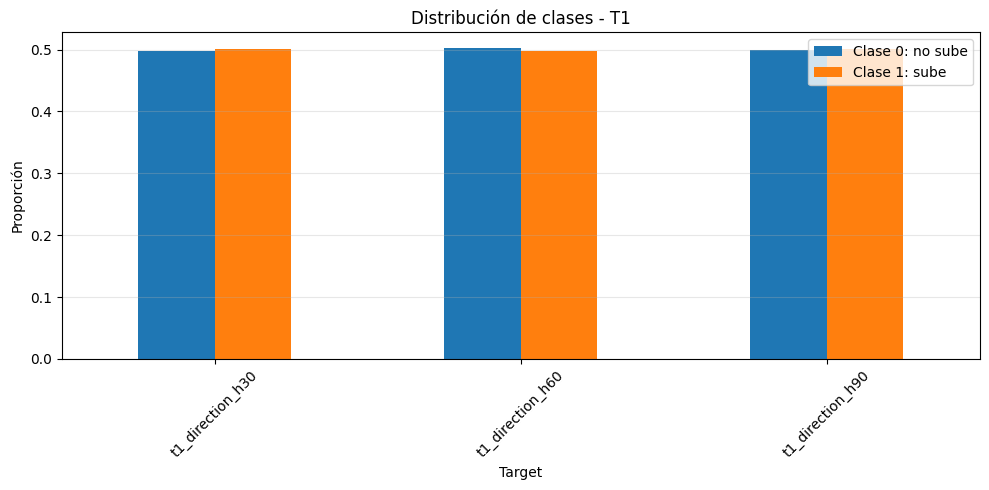

,target,horizon,class_0_count,class_1_count,class_0_ratio,class_1_ratio,balance_gap,balance_status
0,t1_direction_h30,30,444457,447617,0.498229,0.501771,0.003542,balanceado
1,t1_direction_h60,60,448509,443565,0.502771,0.497229,0.005542,balanceado
2,t1_direction_h90,90,445638,446436,0.499553,0.500447,0.000895,balanceado


In [17]:
# =========================================================
# 3.2 Distribución de clases - T1
# =========================================================

import pandas as pd
import matplotlib.pyplot as plt

summary_t1_classes = []

for H in horizons:
    target_col = f"t1_direction_h{H}"

    counts = df_t1[target_col].value_counts().sort_index()
    ratios = df_t1[target_col].value_counts(normalize=True).sort_index()

    summary_t1_classes.append({
        "target": target_col,
        "horizon": H,
        "class_0_count": counts.get(0, 0),
        "class_1_count": counts.get(1, 0),
        "class_0_ratio": ratios.get(0, 0),
        "class_1_ratio": ratios.get(1, 0),
        "balance_gap": abs(ratios.get(1, 0) - ratios.get(0, 0))
    })

df_t1_class_distribution = pd.DataFrame(summary_t1_classes)

display(df_t1_class_distribution)

# =========================================================
# Gráfico de distribución de clases - T1
# =========================================================

plot_df = df_t1_class_distribution.set_index("target")[
    ["class_0_ratio", "class_1_ratio"]
]

ax = plot_df.plot(
    kind="bar",
    figsize=(10, 5)
)

ax.set_title("Distribución de clases - T1")
ax.set_xlabel("Target")
ax.set_ylabel("Proporción")
ax.legend(["Clase 0: no sube", "Clase 1: sube"])
ax.grid(axis="y", alpha=0.3)

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# =========================================================
# Interpretación rápida del balance
# =========================================================

df_t1_class_distribution["balance_status"] = pd.cut(
    df_t1_class_distribution["balance_gap"],
    bins=[-0.01, 0.05, 0.15, 1.0],
    labels=["balanceado", "moderadamente desbalanceado", "desbalanceado"]
)

display(df_t1_class_distribution)



Este análisis permite identificar si T1 mantiene una distribución razonablemente equilibrada entre clases para los horizontes de 30, 60 y 90 minutos.
Un `balance_gap` bajo indica mayor equilibrio entre clases, mientras que valores elevados sugieren mayor predominancia de una clase sobre la otra.

**Observaciones rápidas:**

- Los tres horizontes presentan una distribución extremadamente balanceada entre clases, con proporciones muy cercanas al 50/50.
- El balance_gap es prácticamente nulo en todos los casos, indicando ausencia de desbalance estadístico significativo.
- El horizonte de 90 minutos presenta el mejor equilibrio entre clases (balance_gap = 0.000895).
- Desde el punto de vista estadístico, T1 constituye un target favorable para modelos de clasificación, ya que no requiere técnicas especiales de balanceo de clases.
- Sin embargo, este alto equilibrio también puede sugerir una elevada dificultad predictiva, consistente con la naturaleza ruidosa y eficiente de los mercados financieros.

### **3.3 Frecuencia operativa**

Aunque T1 no representa explícitamente trades reales como T3 o T4, sí permite analizar la frecuencia de señales direccionales generadas por el target.

En este contexto, la frecuencia operativa puede interpretarse como la densidad de oportunidades direccionales presentes en el dataset para cada horizonte temporal.

Debido a que T1 genera una etiqueta para prácticamente cada observación disponible, este análisis permite evaluar:

- densidad de señales
- persistencia direccional
- proporción efectiva de observaciones utilizables
- impacto del horizonte sobre la disponibilidad de datos

,target,horizon,total_rows,valid_signals,signal_rate,long_signals,short_signals,long_ratio,short_ratio
0,t1_direction_h30,30,892074,892074,1.0,447617,444457,0.501771,0.498229
1,t1_direction_h60,60,892074,892074,1.0,443565,448509,0.497229,0.502771
2,t1_direction_h90,90,892074,892074,1.0,446436,445638,0.500447,0.499553


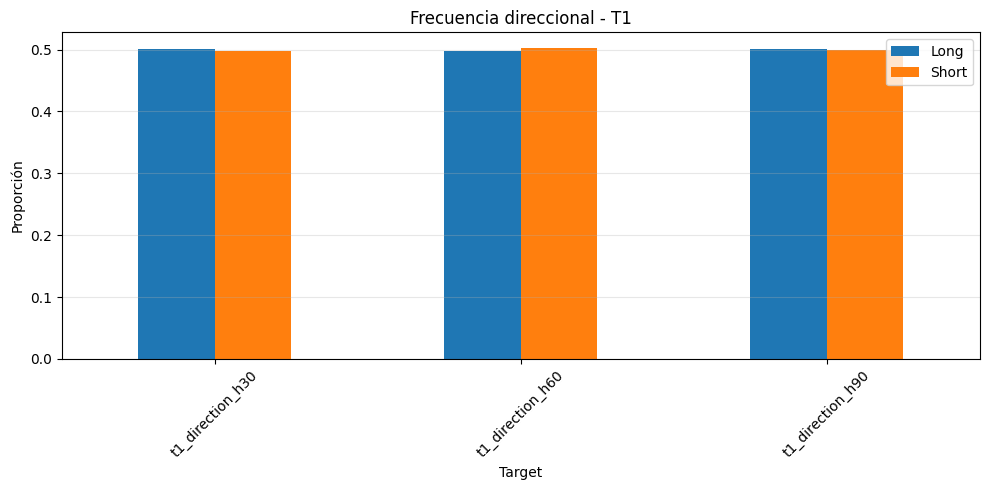

In [18]:
# =========================================================
# 3.3 Frecuencia operativa - T1
# =========================================================

summary_t1_frequency = []

total_rows = len(df_t1)

for H in horizons:

    target_col = f"t1_direction_h{H}"

    valid_signals = df_t1[target_col].notna().sum()

    long_signals = (df_t1[target_col] == 1).sum()
    short_signals = (df_t1[target_col] == 0).sum()

    signal_rate = valid_signals / total_rows

    long_ratio = long_signals / valid_signals
    short_ratio = short_signals / valid_signals

    summary_t1_frequency.append({
        "target": target_col,
        "horizon": H,
        "total_rows": total_rows,
        "valid_signals": valid_signals,
        "signal_rate": signal_rate,
        "long_signals": long_signals,
        "short_signals": short_signals,
        "long_ratio": long_ratio,
        "short_ratio": short_ratio
    })

df_t1_frequency = pd.DataFrame(summary_t1_frequency)

display(df_t1_frequency)

# =========================================================
# Visualización frecuencia direccional
# =========================================================

plot_df = df_t1_frequency.set_index("target")[
    ["long_ratio", "short_ratio"]
]

ax = plot_df.plot(
    kind="bar",
    figsize=(10, 5)
)

ax.set_title("Frecuencia direccional - T1")
ax.set_xlabel("Target")
ax.set_ylabel("Proporción")
ax.legend(["Long", "Short"])
ax.grid(axis="y", alpha=0.3)

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Este análisis permitirá comparar posteriormente la densidad operativa de T1 frente a targets más selectivos como T2, T3 y T4, donde la incorporación de thresholds, reglas operativas y barreras reducirá progresivamente la cantidad efectiva de señales disponibles.

**Observaciones rápidas:**

* T1 genera señales para prácticamente todas las observaciones disponibles (`signal_rate = 1.0`), lo que confirma su carácter altamente denso y no selectivo.

* La frecuencia direccional permanece extremadamente equilibrada entre señales long y short en los tres horizontes analizados.

* No se observa directional bias significativo en ninguno de los horizontes evaluados.

* El aumento del horizonte temporal no modifica sustancialmente la densidad operativa ni la distribución de señales.

* Desde el punto de vista operativo, T1 constituye un target de alta frecuencia y baja selectividad, consistente con una formulación direccional pura basada únicamente en el signo del retorno forward.


### **3.4. Estabilidad Temporal**

Uno de los aspectos más importantes en problemas de Machine Learning financiero consiste en evaluar si las propiedades estadísticas del target permanecen relativamente estables a lo largo del tiempo.

En mercados financieros, es frecuente observar cambios estructurales asociados a:

* volatilidad
* eventos macroeconómicos
* cambios de régimen
* comportamiento de participantes
* variaciones en liquidez

Como consecuencia, un target que parece adecuadamente balanceado en términos globales puede presentar períodos específicos con distribuciones significativamente distintas.

El objetivo de esta sección consiste en analizar la estabilidad temporal de T1 mediante:

* comportamiento mensual
* comportamiento trimestral
* estabilidad rolling
* drift temporal
* cambios de distribución en el tiempo


#### **3.4.1 Distribución mensual de clases**

In [19]:
# =========================================================
# 3.4.1 Distribución mensual de clases - T1
# =========================================================

df_t1["year_month"] = df_t1["date"].dt.to_period("M")

monthly_results_t1 = []

for H in horizons:

    target_col = f"t1_direction_h{H}"

    monthly_stats = (
        df_t1
        .groupby("year_month")[target_col]
        .value_counts(normalize=True)
        .unstack(fill_value=0)
        .reset_index()
    )

    monthly_stats.columns = [
        "year_month",
        "class_0_ratio",
        "class_1_ratio"
    ]

    monthly_stats["target"] = target_col
    monthly_stats["horizon"] = H

    monthly_stats["balance_gap"] = (
        monthly_stats["class_1_ratio"] -
        monthly_stats["class_0_ratio"]
    ).abs()

    monthly_results_t1.append(monthly_stats)

df_t1_monthly = pd.concat(monthly_results_t1, ignore_index=True)

display(df_t1_monthly.head())

,year_month,class_0_ratio,class_1_ratio,target,horizon,balance_gap
0,2020-01,0.494779,0.505221,t1_direction_h30,30,0.010441
1,2020-02,0.513551,0.486449,t1_direction_h30,30,0.027103
2,2020-03,0.496203,0.503797,t1_direction_h30,30,0.007594
3,2020-04,0.486213,0.513787,t1_direction_h30,30,0.027575
4,2020-05,0.488787,0.511213,t1_direction_h30,30,0.022425


#### **3.4.2 Evolución temporal del balance**


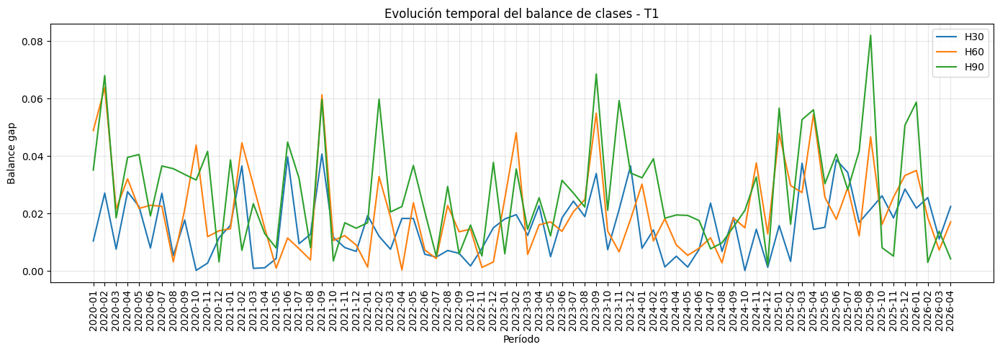

In [20]:
# =========================================================
# Evolución temporal del balance
# =========================================================

import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(14, 5))

for H in horizons:

    temp = df_t1_monthly[
        df_t1_monthly["horizon"] == H
    ]

    ax.plot(
        temp["year_month"].astype(str),
        temp["balance_gap"],
        label=f"H{H}"
    )

ax.set_title("Evolución temporal del balance de clases - T1")
ax.set_xlabel("Período")
ax.set_ylabel("Balance gap")
ax.legend()
ax.grid(alpha=0.3)

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

#### **3.4.3 Estadísticas de estabilidad temporal**


In [21]:
# =========================================================
# Estadísticas resumen de estabilidad temporal
# =========================================================

stability_summary_t1 = (
    df_t1_monthly
    .groupby("horizon")["balance_gap"]
    .agg([
        "mean",
        "std",
        "min",
        "max"
    ])
    .reset_index()
)

stability_summary_t1.columns = [
    "horizon",
    "mean_balance_gap",
    "std_balance_gap",
    "min_balance_gap",
    "max_balance_gap"
]

display(stability_summary_t1)

,horizon,mean_balance_gap,std_balance_gap,min_balance_gap,max_balance_gap
0,30,0.015433,0.010768,0.000144,0.040698
1,60,0.020808,0.015070,0.000332,0.063822
2,90,0.027507,0.018353,0.002030,0.082007


#### **3.4.4 Rolling balance stability**

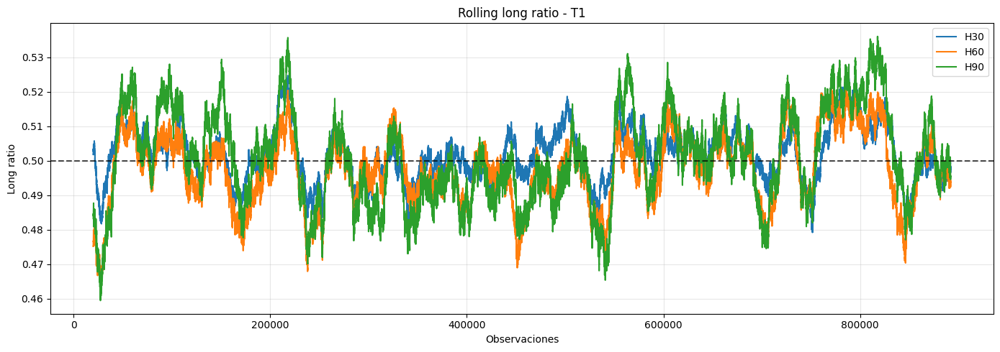

In [22]:
# =========================================================
# Rolling stability del balance
# =========================================================

rolling_window = 20000

fig, ax = plt.subplots(figsize=(14, 5))

for H in horizons:

    target_col = f"t1_direction_h{H}"

    rolling_long_ratio = (
        df_t1[target_col]
        .rolling(rolling_window)
        .mean()
    )

    ax.plot(
        rolling_long_ratio,
        label=f"H{H}"
    )

ax.axhline(0.5, color="black", linestyle="--", alpha=0.7)

ax.set_title("Rolling long ratio - T1")
ax.set_xlabel("Observaciones")
ax.set_ylabel("Long ratio")
ax.legend()
ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

Este análisis permitirá detectar posibles períodos de:

* directional bias
* desbalance temporal
* drift estadístico
* cambios estructurales del mercado

aspectos especialmente relevantes en contextos de Machine Learning aplicado a series financieras no estacionarias.

**Observaciones rápidas:**

* T1 mantiene una estabilidad temporal relativamente alta en los tres horizontes analizados, con balances mensuales generalmente cercanos al 50/50.

* No se observan períodos prolongados de directional bias persistente, lo que sugiere ausencia de drift estructural severo en la distribución de clases.

* El horizonte de 30 minutos presenta la mayor estabilidad temporal, con el menor `mean_balance_gap` y menor volatilidad en el balance mensual.

* A medida que aumenta el horizonte temporal, también aumenta la variabilidad del balance de clases, especialmente en H90.

* El análisis rolling confirma que las proporciones long/short oscilan alrededor de 0.50 durante todo el período analizado, aunque con desviaciones transitorias asociadas probablemente a cambios de régimen o condiciones específicas de mercado.

* En términos generales, T1 presenta una distribución temporal robusta y estable, favorable para procesos de entrenamiento y validación temporal en modelos de Machine Learning financiero.



### **3.5. Sensibilidad paramétrica - T1**


**Sensibilidad al horizonte temporal**

En el caso de T1, el principal parámetro de construcción corresponde al horizonte temporal (H) utilizado para calcular el retorno forward.

Modificar el horizonte implica alterar directamente la escala temporal del problema predictivo, afectando potencialmente:

* balance estadístico de clases
* estabilidad temporal
* frecuencia de señales
* nivel de ruido presente en el target
* persistencia de movimientos direccionales

Con el objetivo de evaluar esta sensibilidad, se analizaron tres horizontes distintos:

* (H = 30) minutos
* (H = 60) minutos
* (H = 90) minutos

Los resultados obtenidos muestran que el target T1 mantiene una distribución altamente balanceada en los tres horizontes evaluados. Sin embargo, se observan diferencias relevantes en términos de estabilidad temporal.

A medida que aumenta el horizonte temporal:

* aumenta ligeramente la variabilidad del balance de clases
* crece el `mean_balance_gap`
* se incrementa la volatilidad temporal de las proporciones direccionales

En particular:

* H30 presenta la mayor estabilidad estadística
* H60 muestra un incremento moderado de variabilidad
* H90 exhibe mayores oscilaciones temporales y directional bias transitorios

El análisis rolling confirma que los tres horizontes permanecen relativamente cercanos al equilibrio teórico del 50/50, aunque los horizontes más amplios presentan desviaciones más pronunciadas durante ciertos períodos específicos de mercado.

Estos resultados sugieren que horizontes más largos podrían incorporar estructuras direccionales más persistentes, pero también una mayor sensibilidad a cambios de régimen y condiciones de mercado no estacionarias.

En consecuencia, existe un compromiso natural entre:

* estabilidad estadística
* persistencia direccional
* sensibilidad al ruido
* complejidad temporal del problema predictivo

aspecto que será especialmente relevante en las etapas posteriores de modelado y evaluación operativa.


### **3.6. Análisis por régimen intradiario**


Además del análisis global del target T1, resulta relevante estudiar cómo cambia su comportamiento estadístico según distintos regímenes intradiarios representados por la variable `regime_id`.

En mercados intradiarios, las condiciones de negociación pueden variar significativamente a lo largo del día debido a factores como:

* apertura de mercado
* aumento o disminución de liquidez
* volatilidad asociada a noticias
* participación institucional
* solapamiento entre sesiones

Como consecuencia, un target que parece estable de manera global podría presentar comportamientos distintos dependiendo del régimen operativo considerado.

El objetivo de esta sección consiste en evaluar si T1 presenta diferencias relevantes entre regímenes intradiarios en términos de:

* distribución de clases
* directional bias
* frecuencia de señales
* estabilidad estadística
* comportamiento direccional


#### **3.6.1 Distribución de clases por `regime_id`**


In [23]:
# =========================================================
# 3.6.1 Distribución de clases por régimen - T1
# =========================================================

regime_results_t1 = []

for H in horizons:

    target_col = f"t1_direction_h{H}"

    temp = (
        df_t1
        .groupby("regime_id")[target_col]
        .value_counts(normalize=True)
        .unstack(fill_value=0)
        .reset_index()
    )

    temp.columns = [
        "regime_id",
        "class_0_ratio",
        "class_1_ratio"
    ]

    temp["target"] = target_col
    temp["horizon"] = H

    temp["balance_gap"] = (
        temp["class_1_ratio"] -
        temp["class_0_ratio"]
    ).abs()

    regime_results_t1.append(temp)

df_t1_regime = pd.concat(regime_results_t1, ignore_index=True)

display(df_t1_regime)

,regime_id,class_0_ratio,class_1_ratio,target,horizon,balance_gap
0,0,0.504892,0.495108,t1_direction_h30,30,0.009784
1,1,0.479878,0.520122,t1_direction_h30,30,0.040243
2,2,0.477756,0.522244,t1_direction_h30,30,0.044488
3,3,0.498602,0.501398,t1_direction_h30,30,0.002796
4,4,0.538349,0.461651,t1_direction_h30,30,0.076698
5,0,0.508910,0.491090,t1_direction_h60,60,0.017819
6,1,0.451733,0.548267,t1_direction_h60,60,0.096534
7,2,0.490726,0.509274,t1_direction_h60,60,0.018549
8,3,0.508841,0.491159,t1_direction_h60,60,0.017681
9,4,0.537067,0.462933,t1_direction_h60,60,0.074134


#### **3.6.2 Visualización del balance por régimen**


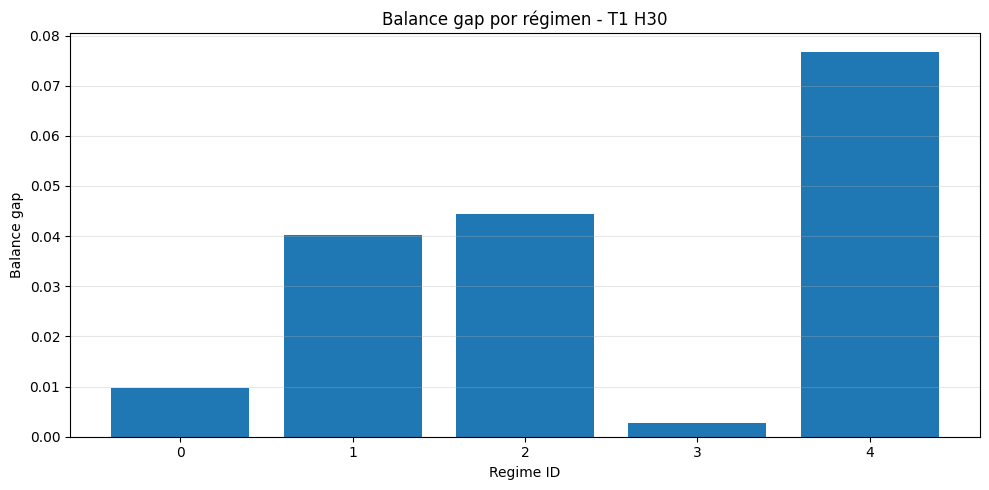

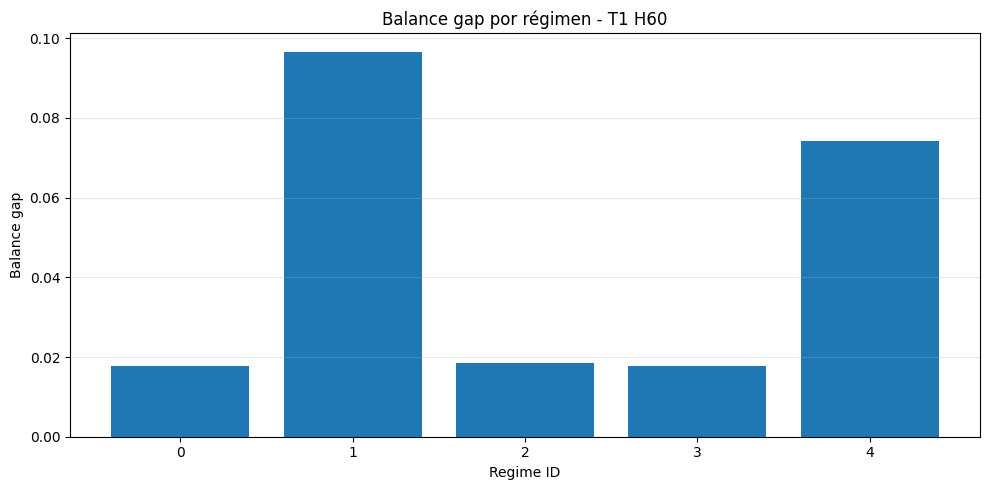

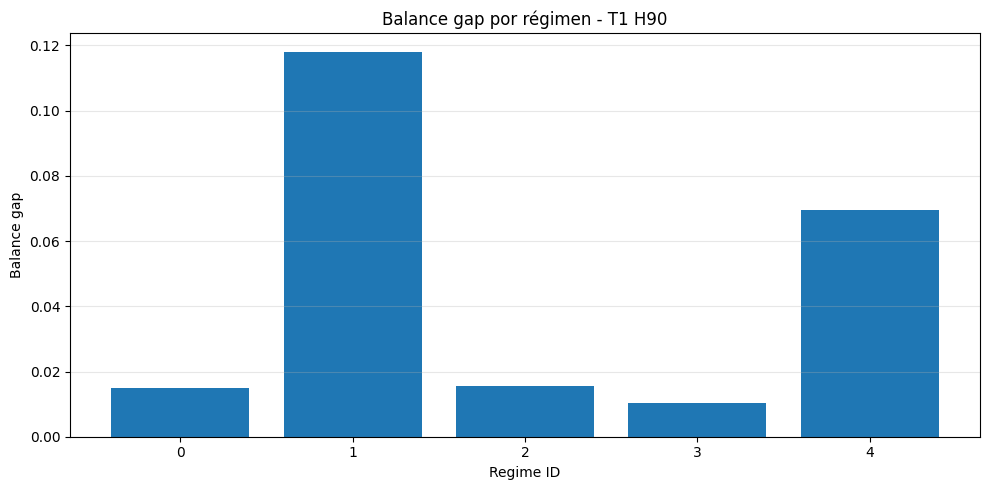

In [24]:
# =========================================================
# Balance gap por régimen
# =========================================================

import matplotlib.pyplot as plt

for H in horizons:

    temp = df_t1_regime[
        df_t1_regime["horizon"] == H
    ]

    fig, ax = plt.subplots(figsize=(10, 5))

    ax.bar(
        temp["regime_id"].astype(str),
        temp["balance_gap"]
    )

    ax.set_title(f"Balance gap por régimen - T1 H{H}")
    ax.set_xlabel("Regime ID")
    ax.set_ylabel("Balance gap")
    ax.grid(axis="y", alpha=0.3)

    plt.tight_layout()
    plt.show()

#### **3.6.3 Frecuencia de observaciones por régimen**

In [25]:
# =========================================================
# Cantidad de observaciones por régimen
# =========================================================

regime_frequency_t1 = (
    df_t1["regime_id"]
    .value_counts()
    .sort_index()
    .reset_index()
)

regime_frequency_t1.columns = [
    "regime_id",
    "n_observations"
]

regime_frequency_t1["ratio"] = (
    regime_frequency_t1["n_observations"] /
    regime_frequency_t1["n_observations"].sum()
)

display(regime_frequency_t1)

,regime_id,n_observations,ratio
0,0,225262,0.252515
1,1,88860,0.099611
2,2,88901,0.099657
3,3,444591,0.498379
4,4,44460,0.049839


#### **3.6.4 Directional bias por régimen**


In [26]:
# =========================================================
# Directional bias por régimen
# =========================================================

directional_bias_t1 = []

for H in horizons:

    target_col = f"t1_direction_h{H}"

    temp = (
        df_t1
        .groupby("regime_id")[target_col]
        .mean()
        .reset_index()
    )

    temp.columns = [
        "regime_id",
        "long_ratio"
    ]

    temp["target"] = target_col
    temp["horizon"] = H

    temp["directional_bias"] = (
        temp["long_ratio"] - 0.5
    )

    directional_bias_t1.append(temp)

df_directional_bias_t1 = pd.concat(
    directional_bias_t1,
    ignore_index=True
)

display(df_directional_bias_t1)

,regime_id,long_ratio,target,horizon,directional_bias
0,0,0.495108,t1_direction_h30,30,-0.004892
1,1,0.520122,t1_direction_h30,30,0.020122
2,2,0.522244,t1_direction_h30,30,0.022244
3,3,0.501398,t1_direction_h30,30,0.001398
4,4,0.461651,t1_direction_h30,30,-0.038349
5,0,0.491090,t1_direction_h60,60,-0.008910
6,1,0.548267,t1_direction_h60,60,0.048267
7,2,0.509274,t1_direction_h60,60,0.009274
8,3,0.491159,t1_direction_h60,60,-0.008841
9,4,0.462933,t1_direction_h60,60,-0.037067


#### **3.6.5 Interpretación del análisis por régimen**


Este análisis permitirá identificar:

* regímenes con mayor directional bias
* períodos intradiarios más balanceados
* regímenes potencialmente más estables
* segmentos temporales con mayor ruido estadístico
* posibles diferencias estructurales entre horizontes

Estos resultados serán especialmente relevantes en etapas posteriores de modelado, ya que podrían justificar:

* modelos específicos por régimen
* filtrado de determinados períodos del día
* selección de targets según contexto intradiario
* restricciones operativas basadas en estabilidad estadística

En consecuencia, el análisis por `regime_id` constituye una herramienta importante para evaluar no solo la robustez global de T1, sino también su comportamiento bajo distintos contextos operativos intradiarios.

**Observaciones rápidas:**

* El análisis por `regime_id` muestra que el comportamiento de T1 no es homogéneo entre regímenes intradiarios, a pesar del fuerte balance global observado previamente.

* Los regímenes `0` y `3` presentan los balances más estables y cercanos al 50/50 en los tres horizontes evaluados.

* El régimen `1` exhibe un directional bias positivo persistente, especialmente en H60 y H90, donde predominan señales long.

* El régimen `4` presenta el directional bias negativo más fuerte, con predominancia consistente de señales short en todos los horizontes.

* A medida que aumenta el horizonte temporal, los directional bias por régimen se vuelven más pronunciados, especialmente en los regímenes `1` y `4`.

* El régimen `3` concentra aproximadamente el 50% de todas las observaciones del dataset, convirtiéndose en el contexto operativo dominante.

* Los resultados sugieren que ciertas dinámicas direccionales podrían estar asociadas a períodos intradiarios específicos, lo que potencialmente justificaría estrategias o modelos diferenciados por régimen en etapas posteriores de la investigación.

* En términos generales, aunque T1 presenta estabilidad global, el análisis segmentado revela estructuras intradiarias relevantes que no son visibles en el análisis agregado del dataset.


### **3.7. Observaciones e interpretación**

El análisis estadístico realizado sobre T1 muestra que el target presenta propiedades globales relativamente robustas desde el punto de vista del balance de clases y estabilidad temporal.

En los tres horizontes evaluados, la distribución entre señales long y short permanece extremadamente cercana al equilibrio teórico del 50/50, sin evidencia de desbalances estructurales severos. Esta característica resulta favorable para el entrenamiento de modelos de clasificación, ya que reduce la necesidad de técnicas específicas de balanceo de clases.

Asimismo, T1 exhibe una elevada estabilidad temporal a nivel agregado, manteniendo proporciones direccionales relativamente consistentes a lo largo del período analizado. El análisis rolling confirma que las oscilaciones del balance permanecen acotadas alrededor del equilibrio esperado, aunque con variaciones transitorias asociadas probablemente a cambios de régimen y condiciones específicas de mercado.

Sin embargo, el análisis por horizonte temporal muestra que horizontes más amplios introducen una mayor variabilidad estadística y directional bias transitorio. En particular, H90 presenta mayores desviaciones temporales respecto al equilibrio observado en H30, sugiriendo una mayor sensibilidad a dinámicas estructurales del mercado.

Por otro lado, el análisis segmentado por `regime_id` revela que la aparente estabilidad global de T1 oculta diferencias relevantes entre distintos contextos intradiarios. Algunos regímenes presentan directional bias persistentes, especialmente en horizontes más amplios, lo que sugiere que ciertas dinámicas direccionales podrían estar asociadas a períodos específicos del día.

Desde el punto de vista operativo, T1 constituye un target altamente denso y poco selectivo, ya que genera señales para prácticamente todas las observaciones disponibles. Esta característica simplifica el problema de clasificación, pero también implica una elevada exposición al ruido financiero y una limitada capacidad de filtrado de movimientos poco relevantes.

En consecuencia, aunque T1 presenta propiedades estadísticas favorables en términos de balance y estabilidad, su formulación puramente direccional continúa siendo relativamente abstracta desde el punto de vista operativo.

Esta limitación motiva naturalmente la transición hacia targets más selectivos y estructurados, comenzando por T2, donde se introducen umbrales mínimos de relevancia con el objetivo de reducir ruido y mejorar la calidad económica de las señales generadas.


## **4. T2 - Investigación estadística**

### **4.1 Construcción práctica de T2**


T2 redefine el problema como una clasificación ternaria, incorporando un umbral mínimo para separar movimientos relevantes de movimientos poco significativos.

Las clases se definen como:

* `1`: movimiento positivo significativo
* `-1`: movimiento negativo significativo
* `0`: movimiento no significativo

A diferencia de T1, que clasifica cualquier variación positiva o negativa, T2 busca filtrar fluctuaciones pequeñas que probablemente correspondan a ruido de mercado.

Para cada horizonte temporal $H$, se calcula primero el movimiento futuro en puntos:

$$
\Delta_{t,H} = P_{t+H} - P_t
$$

Luego se define un threshold empírico a partir del percentil $p$ del valor absoluto del movimiento futuro:

$$
threshold_{H,p} = percentile_p(|\Delta_{t,H}|)
$$

Finalmente, el target T2 se construye como:

$$
T2 =
\begin{cases}
1, & \Delta_{t,H} > threshold_{H,p} \\
-1, & \Delta_{t,H} < -threshold_{H,p} \\
0, & |\Delta_{t,H}| \leq threshold_{H,p}
\end{cases}
$$

donde:

- $\Delta_{t,H}$: variación del precio en el horizonte $H$
- $threshold_{H,p}$: umbral calculado para el horizonte $H$ utilizando el percentil $p$

En esta investigación se evaluarán los horizontes de 30, 60 y 90 minutos, utilizando distintos percentiles para analizar cómo cambia el balance de clases, la frecuencia de señales y la estabilidad del target.

In [27]:
# =========================================================
# 4.1 Construcción práctica de T2
# =========================================================

import numpy as np
import pandas as pd
from IPython.display import display, Markdown

# Copia de trabajo
df_t2 = mnq_intraday.copy()

# Asegurar orden temporal
df_t2["date"] = pd.to_datetime(df_t2["date"])
df_t2 = df_t2.sort_values("date").reset_index(drop=True)

# Horizontes y percentiles a evaluar
horizons = [30, 60, 90]
percentiles = [30, 40, 50, 55, 60, 65, 70]

# =========================================================
# 1) Calcular movimientos futuros en puntos
# =========================================================

for H in horizons:
    df_t2[f"delta_h{H}"] = df_t2["close"].shift(-H) - df_t2["close"]

# =========================================================
# 2) Calcular thresholds empíricos por horizonte y percentil
# =========================================================

threshold_rows = []

for H in horizons:

    delta_col = f"delta_h{H}"
    abs_delta = df_t2[delta_col].abs().dropna()

    for p in percentiles:

        threshold = np.percentile(abs_delta, p)

        threshold_rows.append({
            "horizon": H,
            "percentile": p,
            "threshold_pts": threshold,
            "threshold_usd": threshold * 2  # MNQ: 1 punto = 2 USD
        })

df_t2_thresholds = pd.DataFrame(threshold_rows)

# =========================================================
# Mostrar tabla de thresholds
# =========================================================

display(Markdown("## Grid de thresholds empíricos - T2"))
display(df_t2_thresholds)

# =========================================================
# 3) Construir targets T2 para cada horizonte y percentil
# =========================================================

for _, row in df_t2_thresholds.iterrows():

    H = int(row["horizon"])
    p = int(row["percentile"])
    threshold = row["threshold_pts"]

    delta_col = f"delta_h{H}"
    target_col = f"t2_p{p}_h{H}"

    df_t2[target_col] = np.select(
        [
            df_t2[delta_col] > threshold,
            df_t2[delta_col] < -threshold
        ],
        [
            1,
            -1
        ],
        default=0
    )

# =========================================================
# Eliminar filas sin información futura suficiente
# =========================================================

delta_cols_t2 = [f"delta_h{H}" for H in horizons]

df_t2 = df_t2.dropna(subset=delta_cols_t2).reset_index(drop=True)

# =========================================================
# Revisión inicial de targets construidos
# =========================================================

target_cols_t2 = [
    f"t2_p{p}_h{H}"
    for H in horizons
    for p in percentiles
]

display(Markdown("## Revisión inicial de targets T2"))

display(
    df_t2[
        ["date", "close"] +
        delta_cols_t2 +
        target_cols_t2[:6]
    ].head()
)

## Grid de thresholds empíricos - T2

,horizon,percentile,threshold_pts,threshold_usd
0,30,30,11.00,22.0
1,30,40,16.25,32.5
2,30,50,23.00,46.0
3,30,55,27.25,54.5
4,30,60,32.25,64.5
5,30,65,38.50,77.0
6,30,70,46.25,92.5
7,60,30,17.25,34.5
8,60,40,25.50,51.0
9,60,50,36.00,72.0


## Revisión inicial de targets T2

,date,close,delta_h30,delta_h60,delta_h90,t2_p30_h30,t2_p40_h30,t2_p50_h30,t2_p55_h30,t2_p60_h30,t2_p65_h30
0,2020-01-02,8818.75,15.75,25.25,-5.5,1,0,0,0,0,0
1,2020-01-02,8837.50,-3.75,6.50,-10.0,0,0,0,0,0,0
2,2020-01-02,8838.25,-1.50,6.00,-28.5,0,0,0,0,0,0
3,2020-01-02,8841.50,-4.25,0.75,-12.5,0,0,0,0,0,0
4,2020-01-02,8842.00,0.00,-0.75,-9.5,0,0,0,0,0,0


Con esto quedan construidas múltiples variantes de T2, combinando horizontes y percentiles. Luego evaluamos cuál configuración produce mejor balance, frecuencia operativa y estabilidad.



### **4.2 Distribución de clases**

A diferencia de T1, el target T2 introduce una tercera clase asociada a movimientos no significativos. Como consecuencia, la distribución de clases pasa a depender directamente de:

- horizonte temporal
- threshold utilizado
- magnitud de los movimientos del mercado

En general, thresholds más bajos producen targets más densos y con menor proporción de clase neutra, mientras que thresholds más altos generan targets más selectivos y con mayor cantidad de observaciones clasificadas como 0.

El objetivo de esta sección consiste en analizar cómo distintas configuraciones de T2 afectan:

- balance entre clases
- frecuencia de señales significativas
- proporción de clase neutra
- selectividad del target
- dificultad potencial del problema de clasificación

## Distribución de clases - T2

,target,horizon,percentile,class_-1_count,class_0_count,class_1_count,class_-1_ratio,class_0_ratio,class_1_ratio,signal_ratio,neutral_ratio,long_short_gap
0,t2_p30_h30,30,30,307999,270104,313971,0.345262,0.302782,0.351956,0.697218,0.302782,0.006695
1,t2_p40_h30,30,40,263714,358950,269410,0.295619,0.402377,0.302004,0.597623,0.402377,0.006385
2,t2_p50_h30,30,50,220430,446882,224762,0.247098,0.500947,0.251954,0.499053,0.500947,0.004856
3,t2_p55_h30,30,55,198716,491368,201990,0.222757,0.550815,0.226427,0.449185,0.550815,0.003670
4,t2_p60_h30,30,60,176916,535374,179784,0.198320,0.600145,0.201535,0.399855,0.600145,0.003215
5,t2_p65_h30,30,65,154423,580527,157124,0.173106,0.650761,0.176133,0.349239,0.650761,0.003028
6,t2_p70_h30,30,70,131912,625437,134725,0.147871,0.701104,0.151024,0.298896,0.701104,0.003153
7,t2_p30_h60,60,30,310525,269486,312063,0.348093,0.302089,0.349817,0.697911,0.302089,0.001724
8,t2_p40_h60,60,40,264432,358575,269067,0.296424,0.401957,0.301620,0.598043,0.401957,0.005196
9,t2_p50_h60,60,50,218486,446805,226783,0.244919,0.500861,0.254220,0.499139,0.500861,0.009301


## Resumen compacto de distribución - T2

,target,horizon,percentile,class_-1_ratio,class_0_ratio,class_1_ratio,signal_ratio,neutral_ratio,long_short_gap
0,t2_p30_h30,30,30,0.345262,0.302782,0.351956,0.697218,0.302782,0.006695
1,t2_p40_h30,30,40,0.295619,0.402377,0.302004,0.597623,0.402377,0.006385
2,t2_p50_h30,30,50,0.247098,0.500947,0.251954,0.499053,0.500947,0.004856
3,t2_p55_h30,30,55,0.222757,0.550815,0.226427,0.449185,0.550815,0.003670
4,t2_p60_h30,30,60,0.198320,0.600145,0.201535,0.399855,0.600145,0.003215
5,t2_p65_h30,30,65,0.173106,0.650761,0.176133,0.349239,0.650761,0.003028
6,t2_p70_h30,30,70,0.147871,0.701104,0.151024,0.298896,0.701104,0.003153
7,t2_p30_h60,60,30,0.348093,0.302089,0.349817,0.697911,0.302089,0.001724
8,t2_p40_h60,60,40,0.296424,0.401957,0.301620,0.598043,0.401957,0.005196
9,t2_p50_h60,60,50,0.244919,0.500861,0.254220,0.499139,0.500861,0.009301


## Señales vs clase neutra - T2

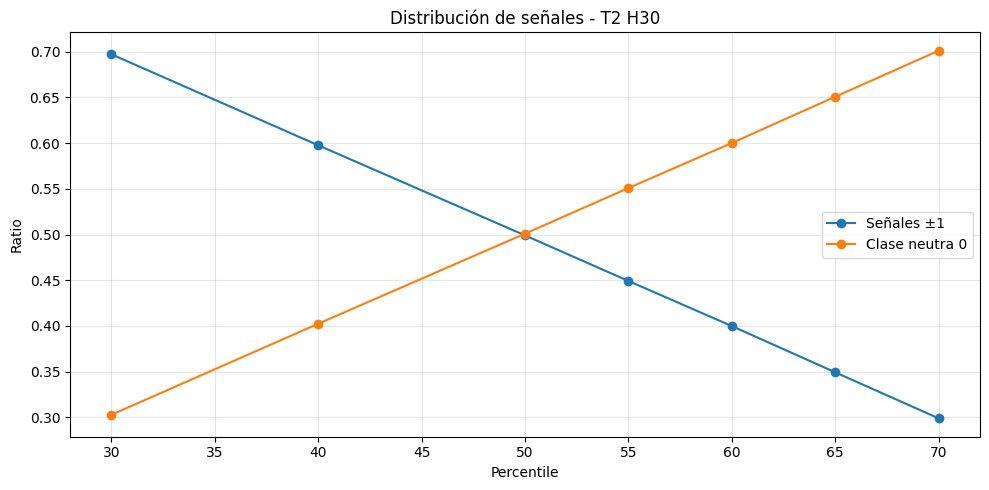

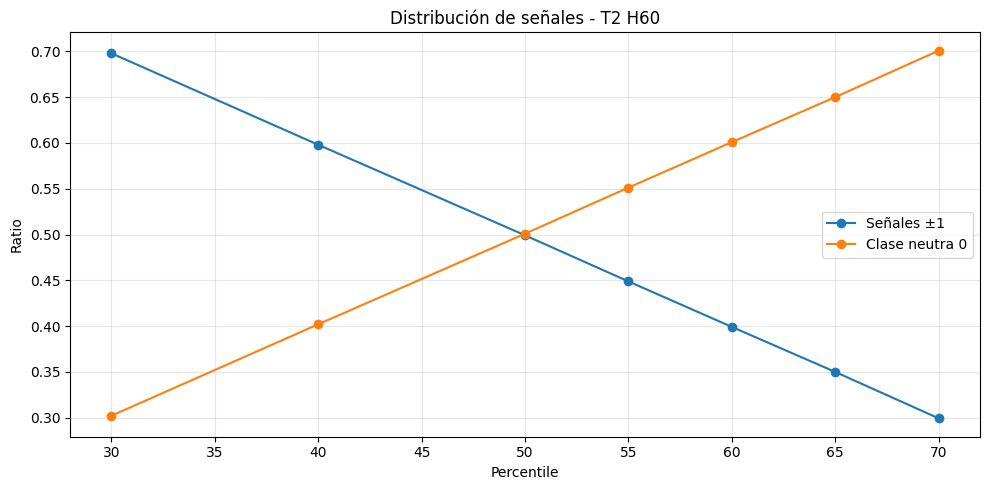

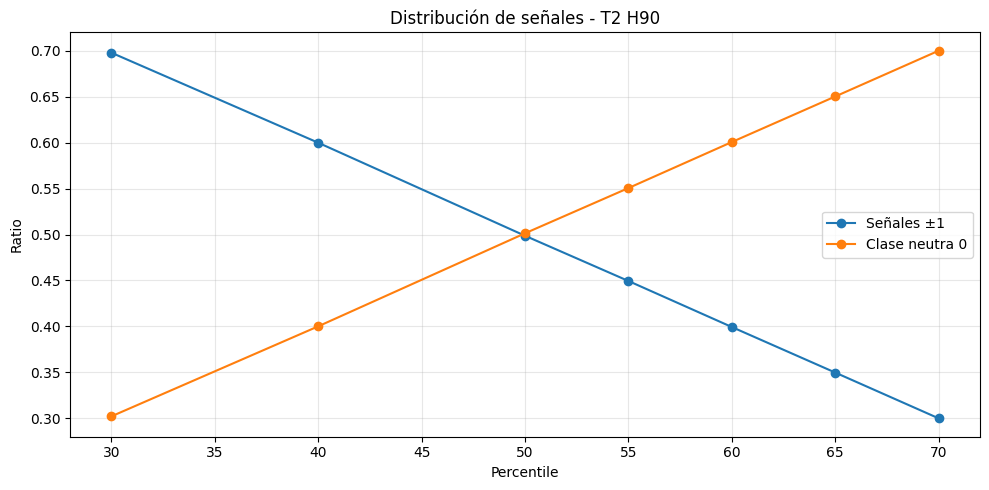

## Balance long vs short - T2

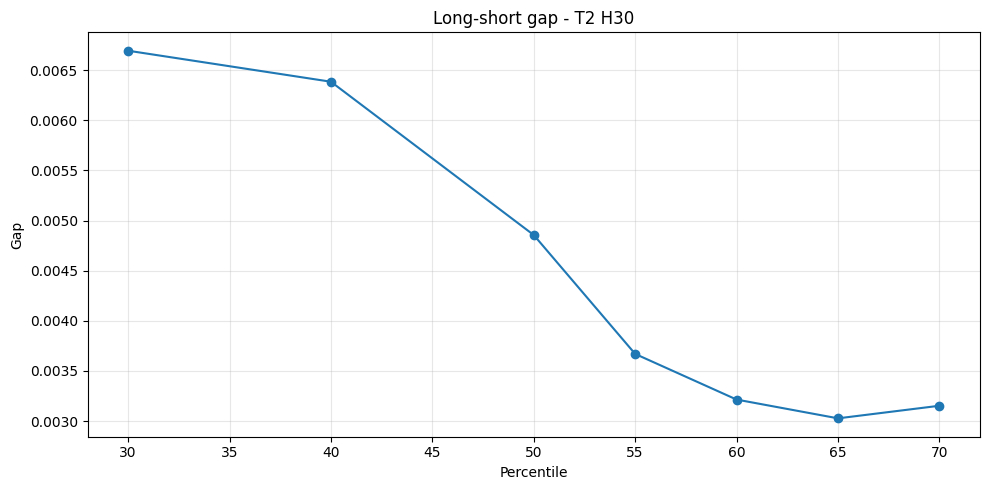

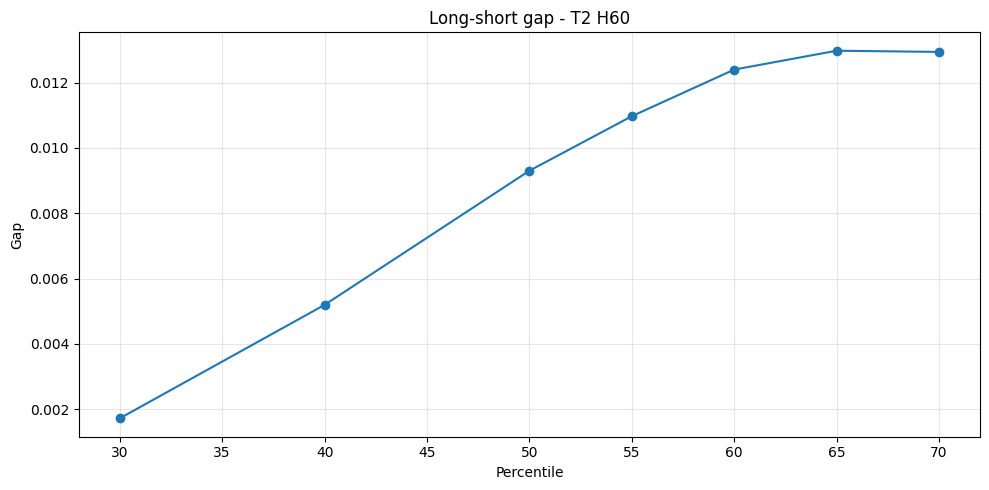

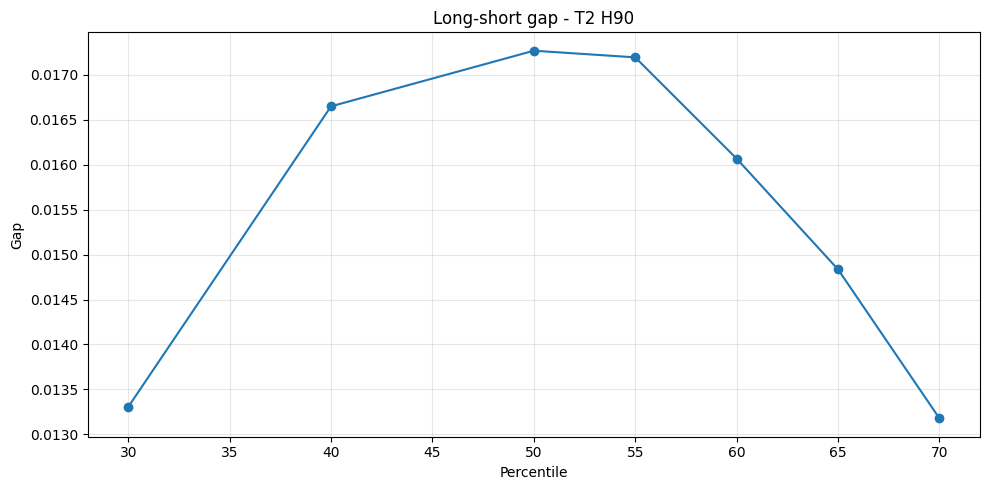

In [28]:
# =========================================================
# 4.2 Distribución de clases - T2
# =========================================================

import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

summary_t2_classes = []

for H in horizons:

    for p in percentiles:

        target_col = f"t2_p{p}_h{H}"

        counts = (
            df_t2[target_col]
            .value_counts()
            .sort_index()
        )

        ratios = (
            df_t2[target_col]
            .value_counts(normalize=True)
            .sort_index()
        )

        summary_t2_classes.append({
            "target": target_col,
            "horizon": H,
            "percentile": p,

            "class_-1_count": counts.get(-1, 0),
            "class_0_count": counts.get(0, 0),
            "class_1_count": counts.get(1, 0),

            "class_-1_ratio": ratios.get(-1, 0),
            "class_0_ratio": ratios.get(0, 0),
            "class_1_ratio": ratios.get(1, 0),

            "signal_ratio": (
                ratios.get(-1, 0) +
                ratios.get(1, 0)
            ),

            "neutral_ratio": ratios.get(0, 0),

            "long_short_gap": abs(
                ratios.get(1, 0) -
                ratios.get(-1, 0)
            )
        })

df_t2_class_distribution = pd.DataFrame(summary_t2_classes)

# =========================================================
# Mostrar distribución completa
# =========================================================

display(Markdown("## Distribución de clases - T2"))
display(df_t2_class_distribution)

# =========================================================
# Resumen compacto
# =========================================================

summary_view_t2 = df_t2_class_distribution[
    [
        "target",
        "horizon",
        "percentile",
        "class_-1_ratio",
        "class_0_ratio",
        "class_1_ratio",
        "signal_ratio",
        "neutral_ratio",
        "long_short_gap"
    ]
]

display(Markdown("## Resumen compacto de distribución - T2"))
display(summary_view_t2)

# =========================================================
# Visualización señal vs clase neutra
# =========================================================

display(Markdown("## Señales vs clase neutra - T2"))

for H in horizons:

    temp = summary_view_t2[
        summary_view_t2["horizon"] == H
    ]

    fig, ax = plt.subplots(figsize=(10, 5))

    ax.plot(
        temp["percentile"],
        temp["signal_ratio"],
        marker="o",
        label="Señales ±1"
    )

    ax.plot(
        temp["percentile"],
        temp["neutral_ratio"],
        marker="o",
        label="Clase neutra 0"
    )

    ax.set_title(f"Distribución de señales - T2 H{H}")
    ax.set_xlabel("Percentile")
    ax.set_ylabel("Ratio")
    ax.legend()
    ax.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

# =========================================================
# Balance long vs short
# =========================================================

display(Markdown("## Balance long vs short - T2"))

for H in horizons:

    temp = summary_view_t2[
        summary_view_t2["horizon"] == H
    ]

    fig, ax = plt.subplots(figsize=(10, 5))

    ax.plot(
        temp["percentile"],
        temp["long_short_gap"],
        marker="o"
    )

    ax.set_title(f"Long-short gap - T2 H{H}")
    ax.set_xlabel("Percentile")
    ax.set_ylabel("Gap")
    ax.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

Este análisis permitirá estudiar cómo la incorporación de thresholds modifica progresivamente la estructura estadística del target respecto a T1, especialmente en términos de:

- reducción de ruido
- disminución de frecuencia operativa
- aumento de selectividad
- aparición de clase neutra
- cambios en balance estadístico

aspectos centrales para evaluar posteriormente la capacidad predictiva y operativa de T2.

**Observaciones rápidas:**

* La incorporación de thresholds modifica drásticamente la estructura estadística del target respecto a T1, introduciendo una clase neutra dominante a medida que aumenta el percentil.

* Existe una relación prácticamente lineal entre el percentil utilizado y la selectividad del target:

  * percentiles bajos → mayor cantidad de señales
  * percentiles altos → mayor proporción de clase neutra

* Los percentiles 30–40 generan targets relativamente densos, con aproximadamente 60–70% de señales operativas (`±1`).

* A partir de percentiles 60–70, la clase neutra supera ampliamente el 60–70% del dataset, reduciendo significativamente la frecuencia operativa.

* El percentil 50 produce una estructura casi perfectamente equilibrada:

  * ~50% señales
  * ~50% clase neutra

* El balance entre señales long y short permanece relativamente estable en H30, pero comienza a deteriorarse levemente en H60 y especialmente en H90.

* El horizonte H90 presenta el mayor `long_short_gap`, indicando aparición progresiva de directional bias en horizontes más amplios.

* A pesar del filtrado introducido por T2, el desbalance entre clases direccionales (`-1` vs `+1`) continúa siendo relativamente bajo en todas las configuraciones evaluadas.

* El comportamiento observado confirma que T2 introduce un mecanismo efectivo de reducción de ruido, permitiendo controlar explícitamente el tradeoff entre:

  * frecuencia operativa
  * selectividad
  * densidad de señales
  * estabilidad estadística

* En términos prácticos:

  * percentiles bajos → targets más frecuentes pero potencialmente más ruidosos
  * percentiles altos → targets más selectivos pero menos operables

* Estos resultados sugieren que percentiles intermedios (40–55) podrían representar un compromiso razonable entre densidad operativa y filtrado de ruido para etapas posteriores de modelado.


### **4.3 Frecuencia operativa**

Uno de los principales efectos introducidos por T2 corresponde a la reducción explícita de la frecuencia operativa mediante la incorporación de thresholds de relevancia.

A diferencia de T1, donde prácticamente todas las observaciones generan una señal direccional, T2 clasifica una parte importante del dataset como movimientos no significativos (0), filtrando fluctuaciones pequeñas potencialmente asociadas a ruido de mercado.

El objetivo de esta sección consiste en analizar cómo distintas configuraciones de horizonte y percentil afectan:

- cantidad de señales operativas
- frecuencia efectiva de trades potenciales
- densidad del target
- selectividad estadística
- balance entre señales y períodos neutrales

In [29]:
# =========================================================
# 4.3 Frecuencia operativa - T2
# =========================================================

from IPython.display import display, Markdown
import pandas as pd
import matplotlib.pyplot as plt

frequency_rows_t2 = []

for H in horizons:

    for p in percentiles:

        target_col = f"t2_p{p}_h{H}"

        total_rows = len(df_t2)

        n_long = (df_t2[target_col] == 1).sum()
        n_short = (df_t2[target_col] == -1).sum()
        n_neutral = (df_t2[target_col] == 0).sum()

        n_signals = n_long + n_short

        signal_rate = n_signals / total_rows
        neutral_rate = n_neutral / total_rows

        long_ratio_signals = (
            n_long / n_signals
            if n_signals > 0 else 0
        )

        short_ratio_signals = (
            n_short / n_signals
            if n_signals > 0 else 0
        )

        frequency_rows_t2.append({
            "target": target_col,
            "horizon": H,
            "percentile": p,

            "total_rows": total_rows,

            "n_long": n_long,
            "n_short": n_short,
            "n_neutral": n_neutral,

            "n_signals": n_signals,

            "signal_rate": signal_rate,
            "neutral_rate": neutral_rate,

            "long_ratio_signals": long_ratio_signals,
            "short_ratio_signals": short_ratio_signals
        })

df_t2_frequency = pd.DataFrame(frequency_rows_t2)

display(Markdown("## Frecuencia operativa - T2"))
display(df_t2_frequency)

## Frecuencia operativa - T2

,target,horizon,percentile,total_rows,n_long,n_short,n_neutral,n_signals,signal_rate,neutral_rate,long_ratio_signals,short_ratio_signals
0,t2_p30_h30,30,30,892074,313971,307999,270104,621970,0.697218,0.302782,0.504801,0.495199
1,t2_p40_h30,30,40,892074,269410,263714,358950,533124,0.597623,0.402377,0.505342,0.494658
2,t2_p50_h30,30,50,892074,224762,220430,446882,445192,0.499053,0.500947,0.504865,0.495135
3,t2_p55_h30,30,55,892074,201990,198716,491368,400706,0.449185,0.550815,0.504085,0.495915
4,t2_p60_h30,30,60,892074,179784,176916,535374,356700,0.399855,0.600145,0.504020,0.495980
5,t2_p65_h30,30,65,892074,157124,154423,580527,311547,0.349239,0.650761,0.504335,0.495665
6,t2_p70_h30,30,70,892074,134725,131912,625437,266637,0.298896,0.701104,0.505275,0.494725
7,t2_p30_h60,60,30,892074,312063,310525,269486,622588,0.697911,0.302089,0.501235,0.498765
8,t2_p40_h60,60,40,892074,269067,264432,358575,533499,0.598043,0.401957,0.504344,0.495656
9,t2_p50_h60,60,50,892074,226783,218486,446805,445269,0.499139,0.500861,0.509317,0.490683


In [30]:
# =========================================================
# Resumen compacto frecuencia operativa
# =========================================================

summary_frequency_t2 = df_t2_frequency[
    [
        "target",
        "horizon",
        "percentile",
        "n_signals",
        "signal_rate",
        "neutral_rate",
        "long_ratio_signals",
        "short_ratio_signals"
    ]
]

display(Markdown("## Resumen compacto de frecuencia operativa - T2"))
display(summary_frequency_t2)

## Resumen compacto de frecuencia operativa - T2

,target,horizon,percentile,n_signals,signal_rate,neutral_rate,long_ratio_signals,short_ratio_signals
0,t2_p30_h30,30,30,621970,0.697218,0.302782,0.504801,0.495199
1,t2_p40_h30,30,40,533124,0.597623,0.402377,0.505342,0.494658
2,t2_p50_h30,30,50,445192,0.499053,0.500947,0.504865,0.495135
3,t2_p55_h30,30,55,400706,0.449185,0.550815,0.504085,0.495915
4,t2_p60_h30,30,60,356700,0.399855,0.600145,0.504020,0.495980
5,t2_p65_h30,30,65,311547,0.349239,0.650761,0.504335,0.495665
6,t2_p70_h30,30,70,266637,0.298896,0.701104,0.505275,0.494725
7,t2_p30_h60,60,30,622588,0.697911,0.302089,0.501235,0.498765
8,t2_p40_h60,60,40,533499,0.598043,0.401957,0.504344,0.495656
9,t2_p50_h60,60,50,445269,0.499139,0.500861,0.509317,0.490683


## Evolución de frecuencia operativa - T2

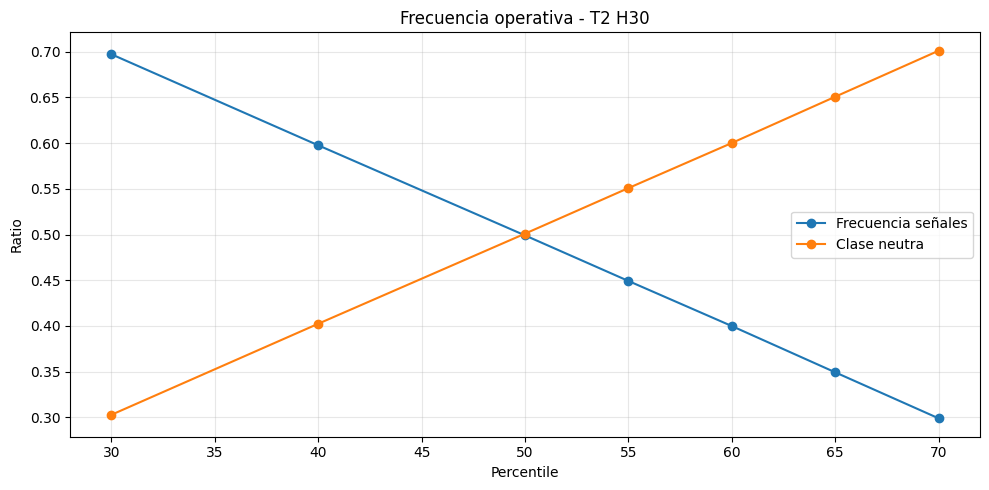

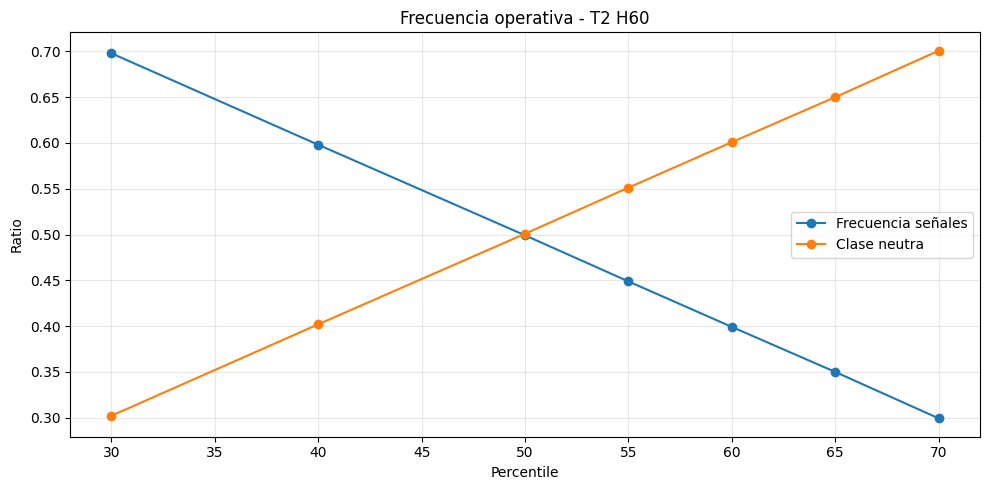

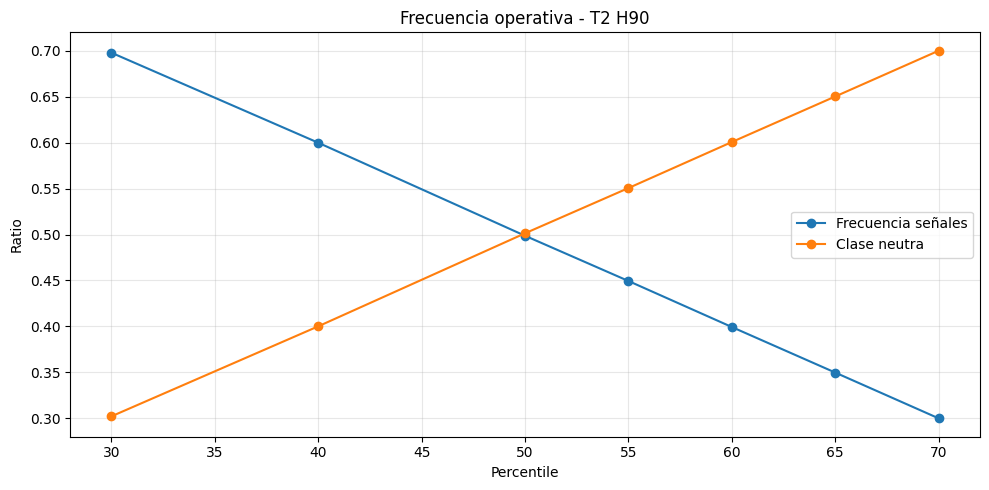

In [31]:
# =========================================================
# Evolución de frecuencia operativa
# =========================================================

display(Markdown("## Evolución de frecuencia operativa - T2"))

for H in horizons:

    temp = summary_frequency_t2[
        summary_frequency_t2["horizon"] == H
    ]

    fig, ax = plt.subplots(figsize=(10, 5))

    ax.plot(
        temp["percentile"],
        temp["signal_rate"],
        marker="o",
        label="Frecuencia señales"
    )

    ax.plot(
        temp["percentile"],
        temp["neutral_rate"],
        marker="o",
        label="Clase neutra"
    )

    ax.set_title(f"Frecuencia operativa - T2 H{H}")
    ax.set_xlabel("Percentile")
    ax.set_ylabel("Ratio")
    ax.legend()
    ax.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

## Balance operativo long vs short - T2

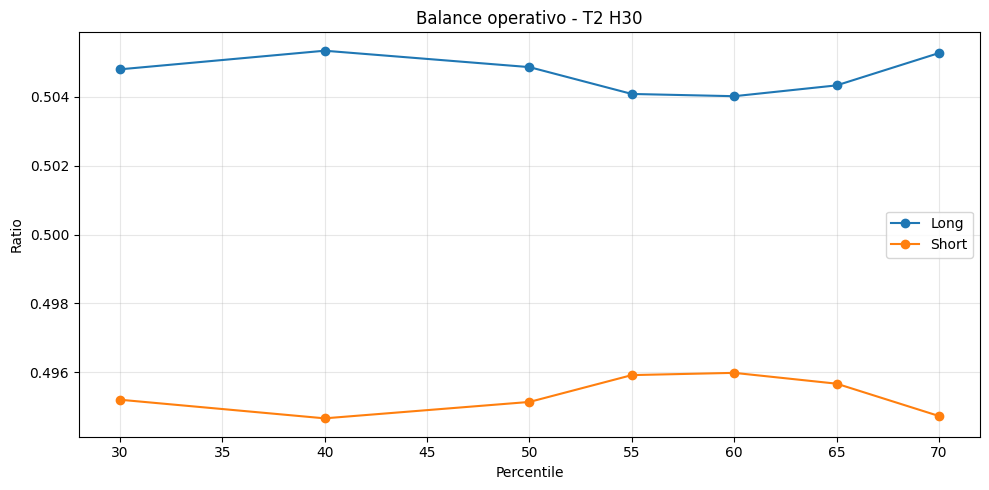

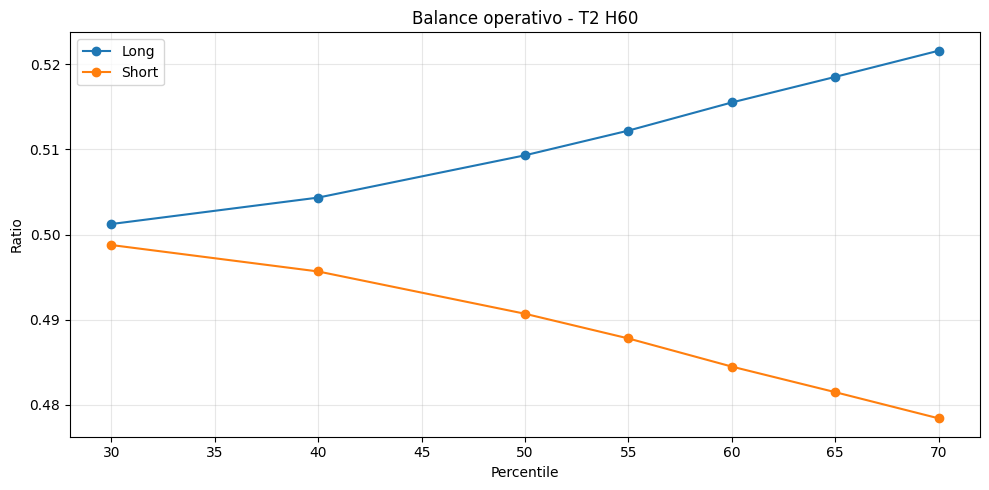

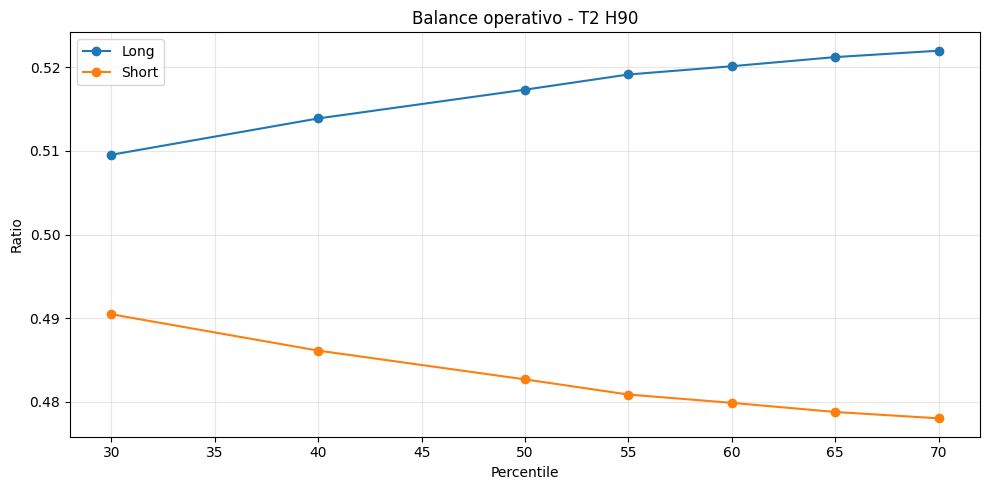

In [32]:
# =========================================================
# Balance operativo long vs short
# =========================================================

display(Markdown("## Balance operativo long vs short - T2"))

for H in horizons:

    temp = summary_frequency_t2[
        summary_frequency_t2["horizon"] == H
    ]

    fig, ax = plt.subplots(figsize=(10, 5))

    ax.plot(
        temp["percentile"],
        temp["long_ratio_signals"],
        marker="o",
        label="Long"
    )

    ax.plot(
        temp["percentile"],
        temp["short_ratio_signals"],
        marker="o",
        label="Short"
    )

    ax.set_title(f"Balance operativo - T2 H{H}")
    ax.set_xlabel("Percentile")
    ax.set_ylabel("Ratio")
    ax.legend()
    ax.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

Este análisis permitirá estudiar cómo T2 transforma progresivamente un target altamente denso y no selectivo (T1) en una estructura más filtrada y operativa, controlando explícitamente la frecuencia de señales mediante la elección del threshold.

**Observaciones rápidas:**

* La frecuencia operativa de T2 disminuye de forma prácticamente lineal a medida que aumenta el percentil utilizado para definir el threshold.

* Los percentiles bajos (`p30–p40`) generan targets relativamente densos, manteniendo aproximadamente entre 60% y 70% de señales operativas.

* Los percentiles intermedios (`p50`) producen una estructura casi perfectamente equilibrada entre:

  * observaciones operativas (`±1`)
  * observaciones neutrales (`0`)

* Los percentiles altos (`p65–p70`) transforman T2 en un target altamente selectivo, donde aproximadamente el 70% de las observaciones quedan clasificadas como neutras.

* La reducción de frecuencia operativa es prácticamente idéntica en H30, H60 y H90, lo que indica una relación muy estable entre percentil y densidad de señales.

* En H30, el balance operativo entre señales long y short permanece extremadamente cercano al equilibrio en todos los percentiles evaluados.

* A medida que aumenta el horizonte temporal, comienza a observarse una predominancia progresiva de señales long, especialmente en H60 y H90.

* El directional bias operativo se vuelve más visible en percentiles altos y horizontes amplios, donde las señales long alcanzan aproximadamente 52% del total de señales operativas.

* Esto sugiere que movimientos extremos de mayor duración presentan una ligera asimetría alcista dentro del dataset analizado.

* Desde el punto de vista operativo, T2 permite controlar explícitamente el tradeoff entre:

  * frecuencia de señales
  * selectividad
  * densidad operativa
  * reducción de ruido

* En términos prácticos:

  * percentiles bajos → mayor cantidad de oportunidades pero potencialmente más ruido
  * percentiles altos → menor frecuencia pero señales potencialmente más relevantes

* Los resultados sugieren nuevamente que configuraciones intermedias (`p40–p55`) podrían representar un equilibrio razonable entre operabilidad y filtrado estadístico para etapas posteriores de modelado.


### **4.4. Estabilidad Temporal**

Uno de los principales objetivos de T2 consiste en reducir el ruido estadístico presente en T1 mediante la incorporación de thresholds de relevancia. Sin embargo, este filtrado también puede modificar la estabilidad temporal del target, especialmente en configuraciones más selectivas.

El objetivo de esta sección consiste en analizar cómo distintos horizontes y percentiles afectan:

- estabilidad del balance de clases
- drift temporal
- persistencia de directional bias
- robustez estadística
- comportamiento rolling del target

En particular, resulta importante evaluar si los movimientos considerados “significativos” mantienen propiedades relativamente consistentes a lo largo del tiempo o si presentan cambios estructurales relevantes según las condiciones del mercado.


In [33]:
# =========================================================
# 4.4 Estabilidad temporal - T2
# =========================================================

import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

# =========================================================
# Crear columna mensual
# =========================================================

df_t2["year_month"] = df_t2["date"].dt.to_period("M")

monthly_stability_t2 = []

for H in horizons:

    for p in percentiles:

        target_col = f"t2_p{p}_h{H}"

        temp = (
            df_t2
            .groupby("year_month")[target_col]
            .value_counts(normalize=True)
            .unstack(fill_value=0)
            .reset_index()
        )

        temp.columns = [
            "year_month",
            "class_-1_ratio",
            "class_0_ratio",
            "class_1_ratio"
        ]

        temp["target"] = target_col
        temp["horizon"] = H
        temp["percentile"] = p

        temp["signal_ratio"] = (
            temp["class_-1_ratio"] +
            temp["class_1_ratio"]
        )

        temp["long_short_gap"] = (
            temp["class_1_ratio"] -
            temp["class_-1_ratio"]
        ).abs()

        monthly_stability_t2.append(temp)

df_t2_monthly_stability = pd.concat(
    monthly_stability_t2,
    ignore_index=True
)

display(Markdown("## Distribución temporal mensual - T2"))
display(df_t2_monthly_stability.head())

## Distribución temporal mensual - T2

,year_month,class_-1_ratio,class_0_ratio,class_1_ratio,target,horizon,percentile,signal_ratio,long_short_gap
0,2020-01,0.217371,0.565733,0.216896,t2_p30_h30,30,30,0.434267,0.000475
1,2020-02,0.296206,0.428309,0.275485,t2_p30_h30,30,30,0.571691,0.020720
2,2020-03,0.411841,0.169435,0.418723,t2_p30_h30,30,30,0.830565,0.006882
3,2020-04,0.338621,0.287625,0.373754,t2_p30_h30,30,30,0.712375,0.035133
4,2020-05,0.313953,0.340781,0.345266,t2_p30_h30,30,30,0.659219,0.031312


In [34]:
# =========================================================
# Estadísticas resumen de estabilidad
# =========================================================

stability_summary_t2 = (
    df_t2_monthly_stability
    .groupby(["horizon", "percentile"])
    .agg({
        "signal_ratio": ["mean", "std"],
        "long_short_gap": ["mean", "std"]
    })
)

stability_summary_t2.columns = [
    "mean_signal_ratio",
    "std_signal_ratio",
    "mean_long_short_gap",
    "std_long_short_gap"
]

stability_summary_t2 = (
    stability_summary_t2
    .reset_index()
)

display(Markdown("## Resumen estadístico de estabilidad temporal - T2"))
display(stability_summary_t2)

## Resumen estadístico de estabilidad temporal - T2

,horizon,percentile,mean_signal_ratio,std_signal_ratio,mean_long_short_gap,std_long_short_gap
0,30,30,0.698961,0.082266,0.015804,0.010237
1,30,40,0.599823,0.096338,0.014806,0.009118
2,30,50,0.501496,0.103186,0.013600,0.008101
3,30,55,0.451650,0.104527,0.012426,0.007504
4,30,60,0.402308,0.103709,0.011422,0.007465
5,30,65,0.351632,0.101382,0.010163,0.006910
6,30,70,0.301243,0.096952,0.009318,0.006839
7,60,30,0.699608,0.083364,0.018547,0.012294
8,60,40,0.600131,0.097677,0.017253,0.012621
9,60,50,0.501498,0.105718,0.016546,0.013894


## Evolución temporal de frecuencia operativa - T2

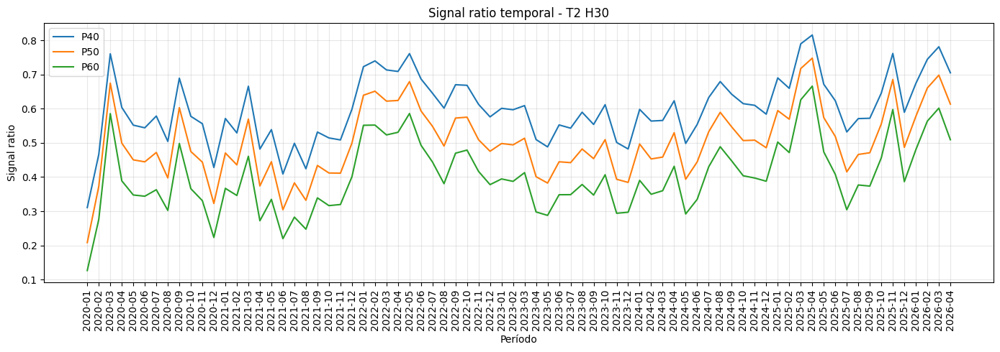

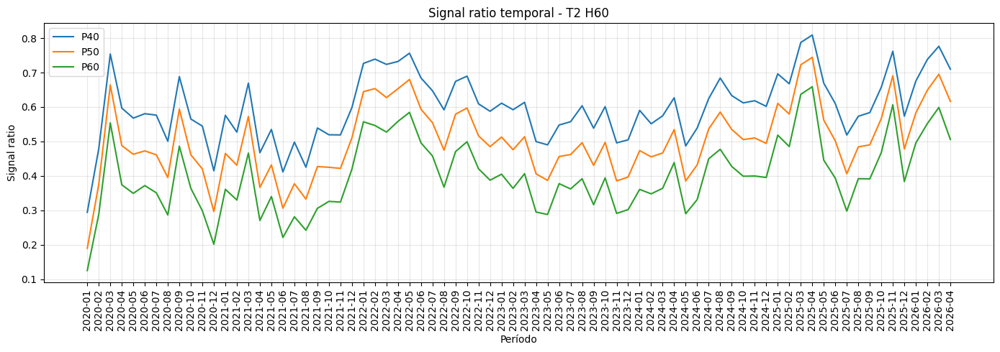

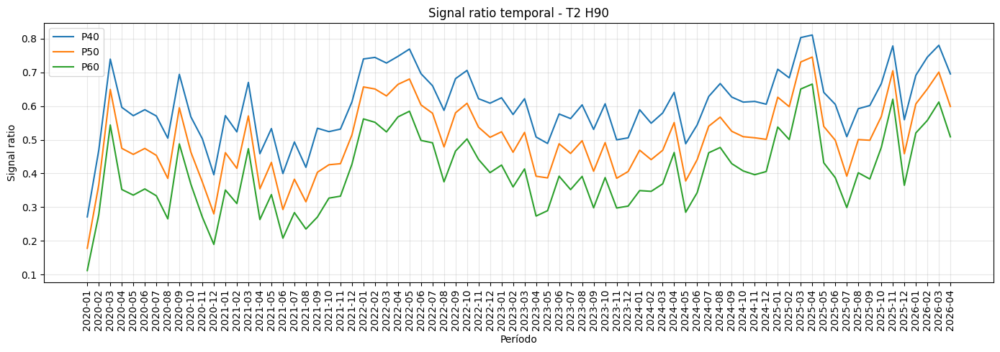

In [35]:
# =========================================================
# Evolución temporal de frecuencia operativa
# =========================================================

display(Markdown("## Evolución temporal de frecuencia operativa - T2"))

selected_percentiles = [40, 50, 60]

for H in horizons:

    fig, ax = plt.subplots(figsize=(14, 5))

    for p in selected_percentiles:

        temp = df_t2_monthly_stability[
            (df_t2_monthly_stability["horizon"] == H) &
            (df_t2_monthly_stability["percentile"] == p)
        ]

        ax.plot(
            temp["year_month"].astype(str),
            temp["signal_ratio"],
            label=f"P{p}"
        )

    ax.set_title(f"Signal ratio temporal - T2 H{H}")
    ax.set_xlabel("Período")
    ax.set_ylabel("Signal ratio")
    ax.legend()
    ax.grid(alpha=0.3)

    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

## Evolución temporal del directional bias - T2

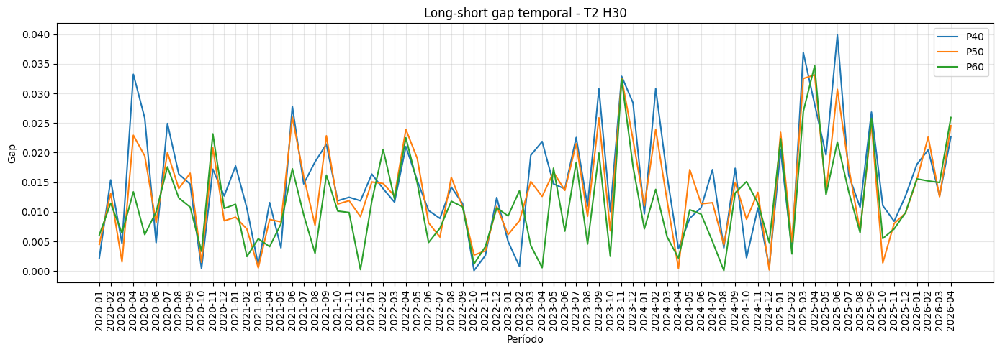

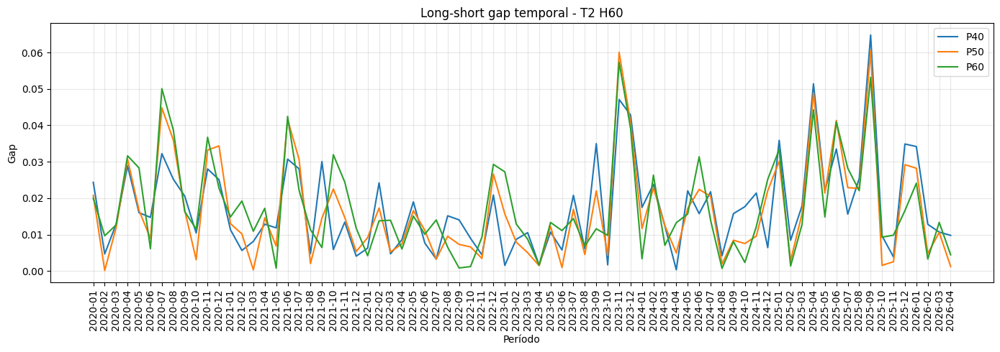

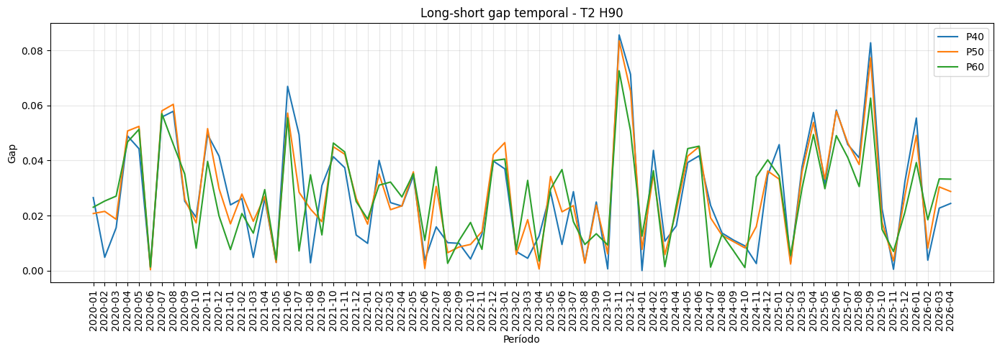

In [36]:
# =========================================================
# Evolución temporal del directional bias
# =========================================================

display(Markdown("## Evolución temporal del directional bias - T2"))

for H in horizons:

    fig, ax = plt.subplots(figsize=(14, 5))

    for p in selected_percentiles:

        temp = df_t2_monthly_stability[
            (df_t2_monthly_stability["horizon"] == H) &
            (df_t2_monthly_stability["percentile"] == p)
        ]

        ax.plot(
            temp["year_month"].astype(str),
            temp["long_short_gap"],
            label=f"P{p}"
        )

    ax.set_title(f"Long-short gap temporal - T2 H{H}")
    ax.set_xlabel("Período")
    ax.set_ylabel("Gap")
    ax.legend()
    ax.grid(alpha=0.3)

    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

## Rolling signal ratio - T2

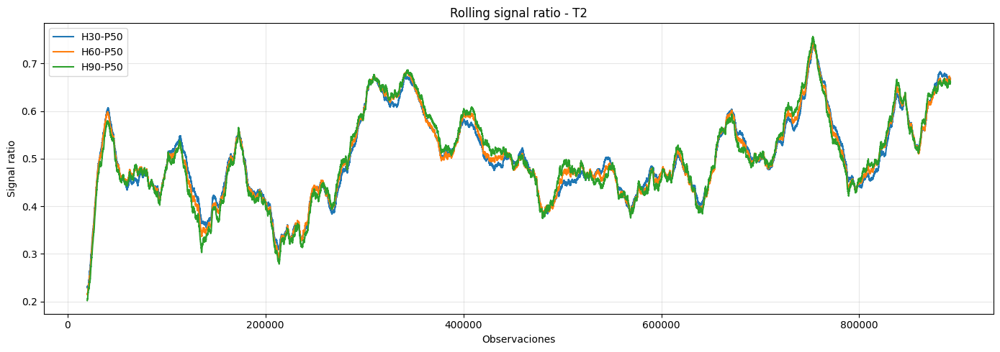

In [37]:
# =========================================================
# Rolling signal ratio
# =========================================================

display(Markdown("## Rolling signal ratio - T2"))

rolling_window = 20000

selected_configs = [
    (30, 50),
    (60, 50),
    (90, 50)
]

fig, ax = plt.subplots(figsize=(14, 5))

for H, p in selected_configs:

    target_col = f"t2_p{p}_h{H}"

    signal_series = (
        (df_t2[target_col] != 0)
        .astype(int)
    )

    rolling_signal_ratio = (
        signal_series
        .rolling(rolling_window)
        .mean()
    )

    ax.plot(
        rolling_signal_ratio,
        label=f"H{H}-P{p}"
    )

ax.set_title("Rolling signal ratio - T2")
ax.set_xlabel("Observaciones")
ax.set_ylabel("Signal ratio")

ax.legend()
ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

Este análisis permitirá evaluar si el filtrado introducido por T2 no solo reduce ruido, sino también si mantiene propiedades suficientemente estables y robustas para ser utilizadas posteriormente en modelos de Machine Learning y sistemas operativos de trading.

**Observaciones rápidas:**

* La frecuencia operativa de T2 presenta variaciones temporales importantes a lo largo de todo el período analizado, evidenciando que la densidad de señales depende fuertemente del régimen de volatilidad del mercado.

* Durante períodos de alta volatilidad, especialmente en 2020, 2022 y ciertos tramos de 2025–2026, el `signal_ratio` aumenta considerablemente incluso para thresholds altos.

* En escenarios de baja volatilidad, la clase neutra domina gran parte del dataset, reduciendo significativamente la cantidad de señales operativas disponibles.

* El comportamiento temporal de los distintos percentiles mantiene una estructura muy consistente:

  * P40 siempre genera más señales
  * P50 ocupa una posición intermedia
  * P60 produce targets mucho más selectivos

* El rolling signal ratio confirma que T2 no posee una frecuencia operativa estacionaria, sino que responde dinámicamente a cambios estructurales del mercado y volatilidad intrínseca del activo.

* A pesar de estas fluctuaciones, las tres configuraciones evaluadas (H30, H60 y H90) muestran trayectorias rolling muy similares, indicando coherencia estructural entre horizontes.

* La desviación estándar del `signal_ratio` aumenta levemente en horizontes más largos, especialmente en H90, sugiriendo menor estabilidad temporal en targets de mayor duración.

* El directional bias temporal permanece relativamente bajo en H30, pero aumenta progresivamente en H60 y especialmente en H90.

* Los mayores spikes de `long_short_gap` aparecen durante períodos de fuerte tendencia direccional del mercado, donde predominan movimientos alcistas prolongados.

* Incluso en los peores casos, el desbalance long-short sigue siendo moderado comparado con problemas clásicos de clasificación financiera extremadamente desbalanceados.

* Los thresholds altos no necesariamente mejoran la estabilidad temporal; en muchos casos continúan mostrando variaciones importantes asociadas a cambios de volatilidad del mercado.

* En términos generales, T2 logra:

  * reducir ruido respecto a T1
  * controlar explícitamente la frecuencia operativa
  * mantener un balance razonable entre clases
  * conservar estabilidad estructural aceptable

* Sin embargo, los resultados también muestran que la dinámica temporal del mercado continúa impactando significativamente la distribución estadística del target, especialmente en horizontes amplios y movimientos extremos.


### **4.5. Sensibilidad paramétrica - T2**


El target T2 depende directamente de dos parámetros fundamentales:

* horizonte temporal (`H`)
* threshold de discretización (`percentile`)

Ambos parámetros determinan la estructura estadística del target y modifican directamente:

* frecuencia operativa
* balance entre clases
* densidad de señales
* directional bias
* estabilidad temporal
* nivel de ruido incorporado

El objetivo de esta sección consiste en estudiar cómo distintas configuraciones de parámetros alteran las propiedades estadísticas y operativas de T2, permitiendo identificar regiones potencialmente más robustas para etapas posteriores de modelado.

En términos conceptuales:

* horizontes cortos tienden a generar targets más sensibles al ruido de microestructura
* horizontes largos capturan movimientos más amplios, aunque pueden introducir mayor directional bias y menor estabilidad

Por otro lado:

* thresholds bajos generan targets densos y frecuentes
* thresholds altos producen targets más selectivos y conservadores

En consecuencia, T2 puede interpretarse como una familia de targets parametrizados, donde distintas combinaciones de horizonte y percentil representan distintos compromisos entre:

* operabilidad
* estabilidad
* frecuencia de señales
* selectividad
* dificultad predictiva


## Resumen de sensibilidad paramétrica - T2

,target,horizon,percentile,signal_ratio,neutral_ratio,long_short_gap
0,t2_p30_h30,30,30,0.697218,0.302782,0.006695
1,t2_p40_h30,30,40,0.597623,0.402377,0.006385
2,t2_p50_h30,30,50,0.499053,0.500947,0.004856
3,t2_p55_h30,30,55,0.449185,0.550815,0.003670
4,t2_p60_h30,30,60,0.399855,0.600145,0.003215
5,t2_p65_h30,30,65,0.349239,0.650761,0.003028
6,t2_p70_h30,30,70,0.298896,0.701104,0.003153
7,t2_p30_h60,60,30,0.697911,0.302089,0.001724
8,t2_p40_h60,60,40,0.598043,0.401957,0.005196
9,t2_p50_h60,60,50,0.499139,0.500861,0.009301


## Heatmap de frecuencia operativa - T2

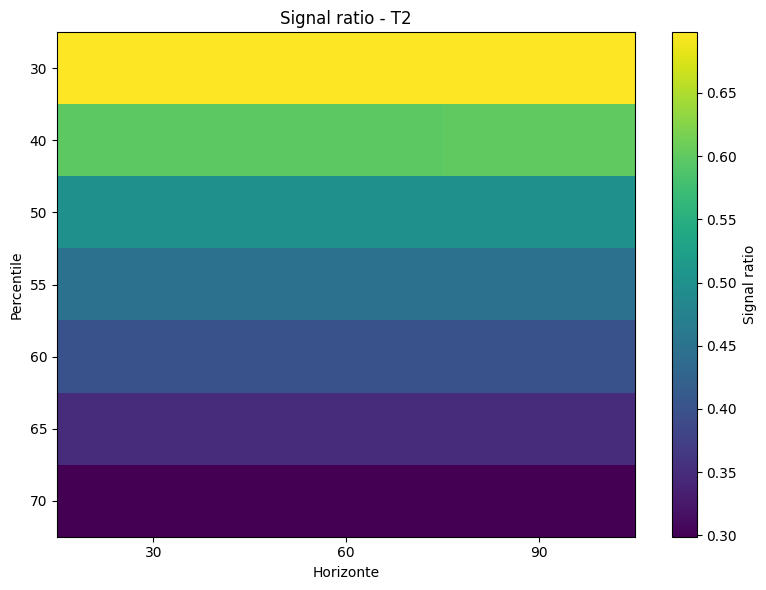

## Heatmap directional bias - T2

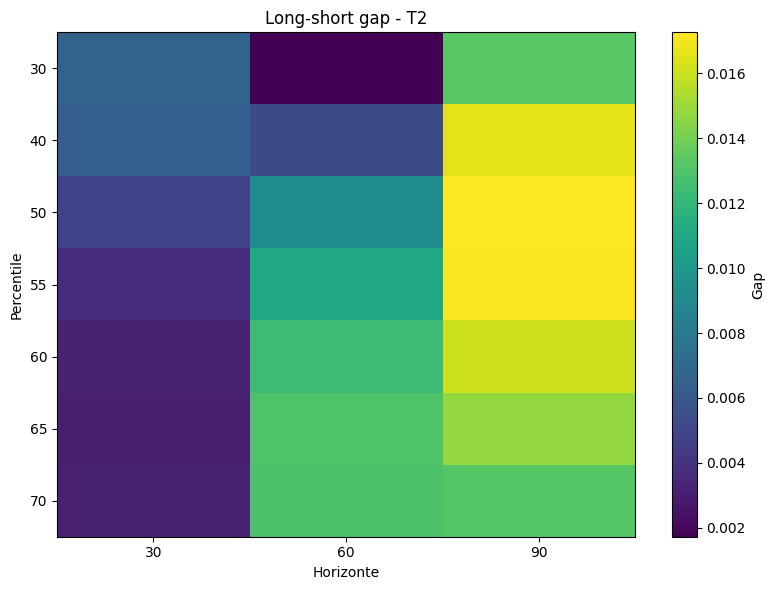

## Evolución paramétrica de frecuencia operativa - T2

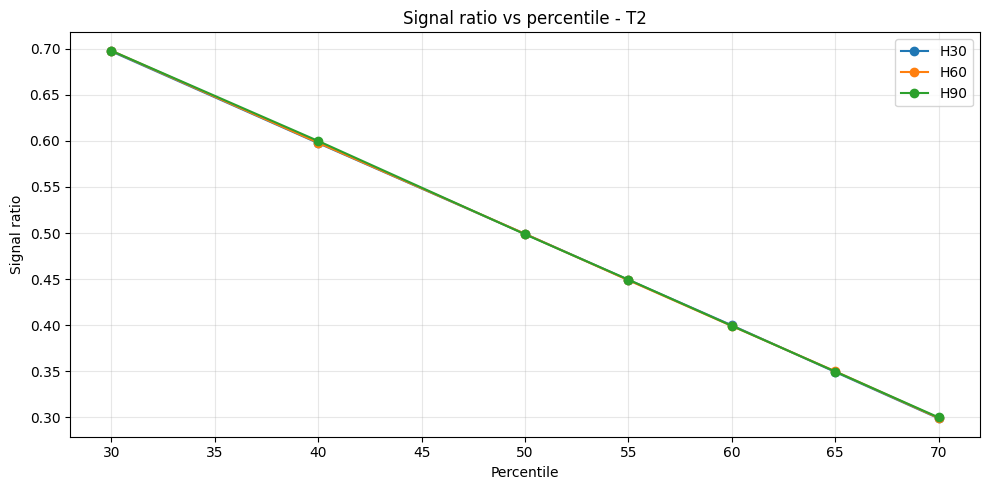

## Evolución paramétrica del directional bias - T2

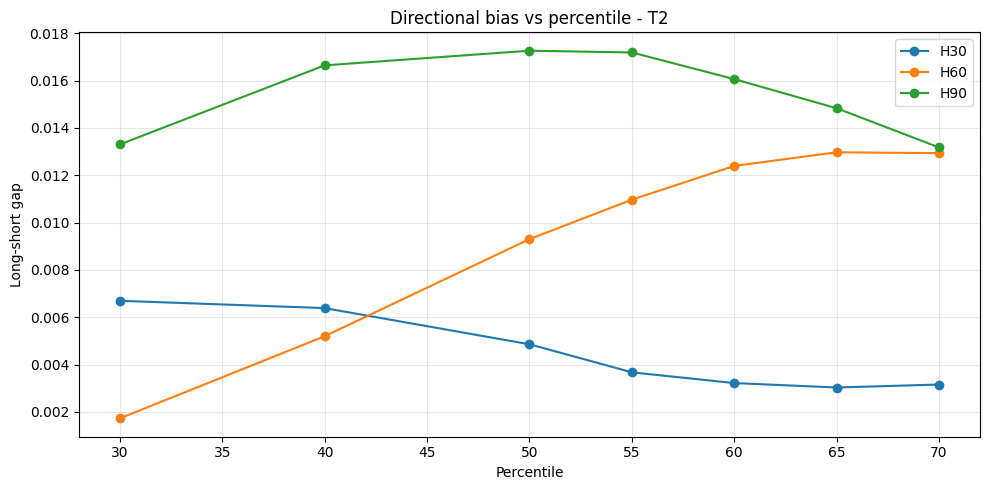

In [38]:
# =========================================================
# 4.5 Sensibilidad paramétrica - T2
# =========================================================

import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

# =========================================================
# Construir resumen paramétrico
# =========================================================

parametric_rows_t2 = []

for H in horizons:

    for p in percentiles:

        target_col = f"t2_p{p}_h{H}"

        counts = (
            df_t2[target_col]
            .value_counts(normalize=True)
            .sort_index()
        )

        signal_ratio = (
            counts.get(-1, 0) +
            counts.get(1, 0)
        )

        neutral_ratio = counts.get(0, 0)

        long_short_gap = abs(
            counts.get(1, 0) -
            counts.get(-1, 0)
        )

        parametric_rows_t2.append({
            "target": target_col,
            "horizon": H,
            "percentile": p,

            "signal_ratio": signal_ratio,
            "neutral_ratio": neutral_ratio,
            "long_short_gap": long_short_gap
        })

df_t2_parametric = pd.DataFrame(parametric_rows_t2)

display(Markdown("## Resumen de sensibilidad paramétrica - T2"))
display(df_t2_parametric)

# =========================================================
# Heatmap frecuencia operativa
# =========================================================

display(Markdown("## Heatmap de frecuencia operativa - T2"))

pivot_signal = df_t2_parametric.pivot(
    index="percentile",
    columns="horizon",
    values="signal_ratio"
)

fig, ax = plt.subplots(figsize=(8, 6))

im = ax.imshow(
    pivot_signal,
    aspect="auto"
)

ax.set_xticks(range(len(pivot_signal.columns)))
ax.set_xticklabels(pivot_signal.columns)

ax.set_yticks(range(len(pivot_signal.index)))
ax.set_yticklabels(pivot_signal.index)

ax.set_xlabel("Horizonte")
ax.set_ylabel("Percentile")
ax.set_title("Signal ratio - T2")

cbar = plt.colorbar(im)
cbar.set_label("Signal ratio")

plt.tight_layout()
plt.show()

# =========================================================
# Heatmap directional bias
# =========================================================

display(Markdown("## Heatmap directional bias - T2"))

pivot_gap = df_t2_parametric.pivot(
    index="percentile",
    columns="horizon",
    values="long_short_gap"
)

fig, ax = plt.subplots(figsize=(8, 6))

im = ax.imshow(
    pivot_gap,
    aspect="auto"
)

ax.set_xticks(range(len(pivot_gap.columns)))
ax.set_xticklabels(pivot_gap.columns)

ax.set_yticks(range(len(pivot_gap.index)))
ax.set_yticklabels(pivot_gap.index)

ax.set_xlabel("Horizonte")
ax.set_ylabel("Percentile")
ax.set_title("Long-short gap - T2")

cbar = plt.colorbar(im)
cbar.set_label("Gap")

plt.tight_layout()
plt.show()

# =========================================================
# Evolución paramétrica de frecuencia operativa
# =========================================================

display(Markdown("## Evolución paramétrica de frecuencia operativa - T2"))

fig, ax = plt.subplots(figsize=(10, 5))

for H in horizons:

    temp = df_t2_parametric[
        df_t2_parametric["horizon"] == H
    ]

    ax.plot(
        temp["percentile"],
        temp["signal_ratio"],
        marker="o",
        label=f"H{H}"
    )

ax.set_title("Signal ratio vs percentile - T2")
ax.set_xlabel("Percentile")
ax.set_ylabel("Signal ratio")

ax.legend()
ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

# =========================================================
# Evolución paramétrica del directional bias
# =========================================================

display(Markdown("## Evolución paramétrica del directional bias - T2"))

fig, ax = plt.subplots(figsize=(10, 5))

for H in horizons:

    temp = df_t2_parametric[
        df_t2_parametric["horizon"] == H
    ]

    ax.plot(
        temp["percentile"],
        temp["long_short_gap"],
        marker="o",
        label=f"H{H}"
    )

ax.set_title("Directional bias vs percentile - T2")
ax.set_xlabel("Percentile")
ax.set_ylabel("Long-short gap")

ax.legend()
ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()



Este análisis permitirá identificar configuraciones de T2 potencialmente más robustas, equilibradas y operables, proporcionando una base objetiva para seleccionar targets candidatos en las etapas posteriores de entrenamiento y evaluación de modelos de Machine Learning.

**Observaciones rápidas:**

* La sensibilidad paramétrica de T2 está dominada principalmente por el percentil utilizado, mientras que el horizonte temporal tiene un impacto mucho menor sobre la frecuencia operativa.

* El `signal_ratio` disminuye de forma casi perfectamente lineal al aumentar el percentil:

  * ~70% señales en P30
  * ~50% señales en P50
  * ~30% señales en P70

* Los heatmaps muestran que la frecuencia operativa es prácticamente idéntica entre H30, H60 y H90 para un mismo percentil, indicando una estructura extremadamente estable respecto al horizonte.

* Esto sugiere que el parámetro más influyente de T2 no es el horizonte temporal, sino el nivel de filtrado impuesto por el threshold.

* El directional bias presenta un comportamiento mucho más sensible al horizonte:

  * H30 mantiene un gap muy bajo y estable
  * H60 introduce un sesgo progresivo hacia señales long
  * H90 muestra el mayor desbalance estructural

* El aumento del directional bias en H60 y H90 sugiere que movimientos amplios y prolongados tienden a presentar una asimetría alcista dentro del dataset analizado.

* En H30, el directional bias incluso disminuye levemente al aumentar el percentil, indicando un target relativamente robusto y equilibrado.

* En contraste, H60 y H90 muestran un incremento importante del long-short gap en percentiles intermedios (`P50–P65`).

* Los percentiles intermedios (`P40–P55`) aparecen nuevamente como una región de compromiso razonable:

  * frecuencia operativa moderada
  * directional bias relativamente controlado
  * equilibrio entre densidad y selectividad

* Los thresholds altos (`P65–P70`) producen targets altamente filtrados, pero no necesariamente más balanceados ni más estables desde el punto de vista direccional.

* El comportamiento observado confirma que T2 permite controlar explícitamente el tradeoff entre:

  * ruido
  * frecuencia operativa
  * balance estadístico
  * directional bias
  * selectividad del target

* En términos prácticos:

  * percentiles bajos → targets densos y más operables
  * percentiles altos → targets más conservadores y selectivos
  * horizontes largos → mayor directional bias y menor neutralidad estadística

* Estos resultados proporcionan una base objetiva para seleccionar configuraciones candidatas de T2 en las etapas posteriores de modelado y evaluación predictiva.



### **4.6. Análisis por régimen intradiario**


Además del análisis global de T2, resulta relevante estudiar cómo cambia su comportamiento estadístico según distintos regímenes intradiarios representados por la variable `regime_id`.

En el caso de T2, este análisis adquiere especial importancia debido a que el target incorpora thresholds de relevancia y, por lo tanto, depende directamente de la intensidad de los movimientos del mercado en cada período del día.

Las condiciones intradiarias pueden modificar significativamente:

* frecuencia de movimientos significativos
* volatilidad
* directional bias
* densidad de señales
* balance estadístico entre clases

Como consecuencia, ciertas configuraciones de T2 podrían resultar más operables o más estables en determinados regímenes específicos.

El objetivo de esta sección consiste en evaluar cómo cambia T2 entre distintos regímenes intradiarios en términos de:

* distribución de clases
* frecuencia operativa
* directional bias
* estabilidad estadística
* densidad de señales significativas

## Distribución por régimen intradiario - T2

,regime_id,class_-1_ratio,class_0_ratio,class_1_ratio,target,horizon,percentile,signal_ratio,long_short_gap
0,0,0.290040,0.424000,0.285960,t2_p30_h30,30,30,0.576000,0.004080
1,1,0.324972,0.309419,0.365609,t2_p30_h30,30,30,0.690581,0.040637
2,2,0.387645,0.180988,0.431367,t2_p30_h30,30,30,0.819012,0.043723
3,3,0.362781,0.269805,0.367414,t2_p30_h30,30,30,0.730195,0.004633
4,4,0.405668,0.248650,0.345682,t2_p30_h30,30,30,0.751350,0.059987


## Resumen compacto por régimen - T2

,regime_id,target,horizon,percentile,signal_ratio,class_0_ratio,long_short_gap
0,0,t2_p30_h30,30,30,0.576000,0.424000,0.004080
1,1,t2_p30_h30,30,30,0.690581,0.309419,0.040637
2,2,t2_p30_h30,30,30,0.819012,0.180988,0.043723
3,3,t2_p30_h30,30,30,0.730195,0.269805,0.004633
4,4,t2_p30_h30,30,30,0.751350,0.248650,0.059987
...,...,...,...,...,...,...,...
100,0,t2_p70_h90,90,70,0.179626,0.820374,0.003210
101,1,t2_p70_h90,90,70,0.671191,0.328809,0.101868
102,2,t2_p70_h90,90,70,0.345834,0.654166,0.031597
103,3,t2_p70_h90,90,70,0.277637,0.722363,0.000830


## Frecuencia operativa por régimen - T2

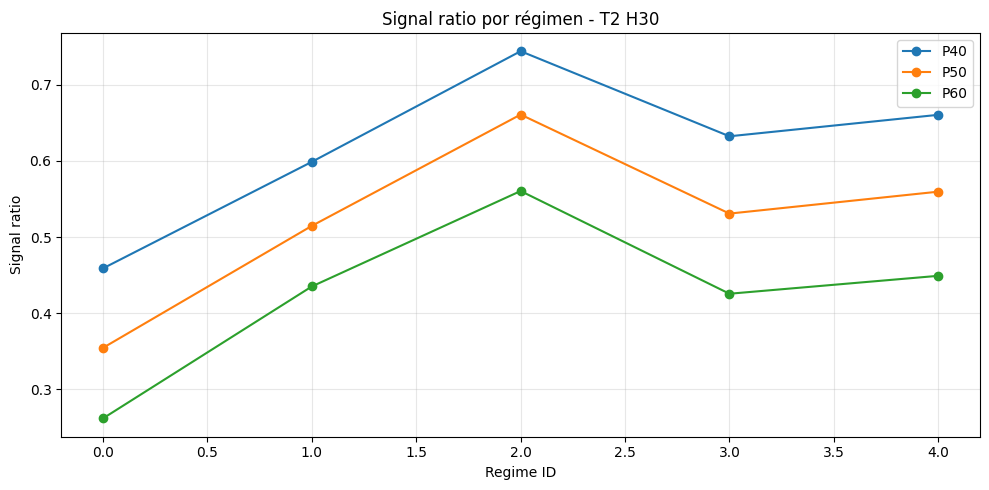

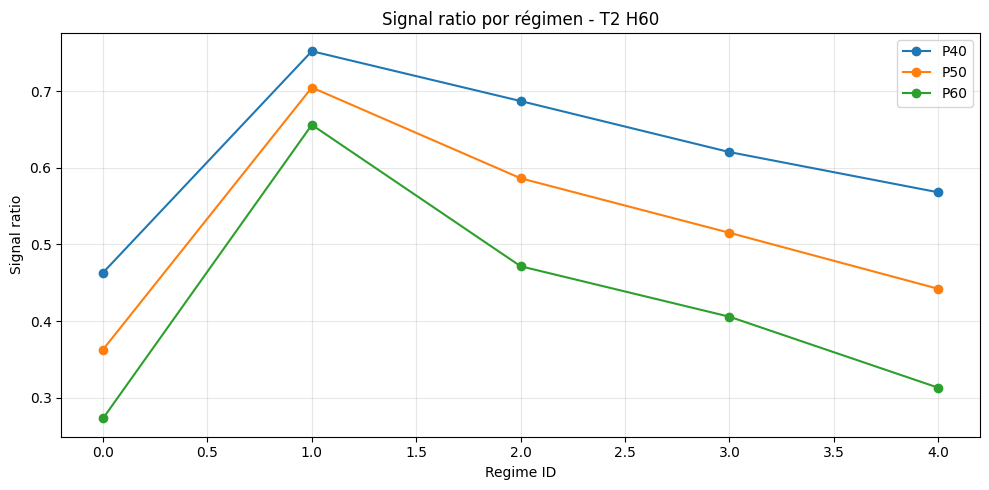

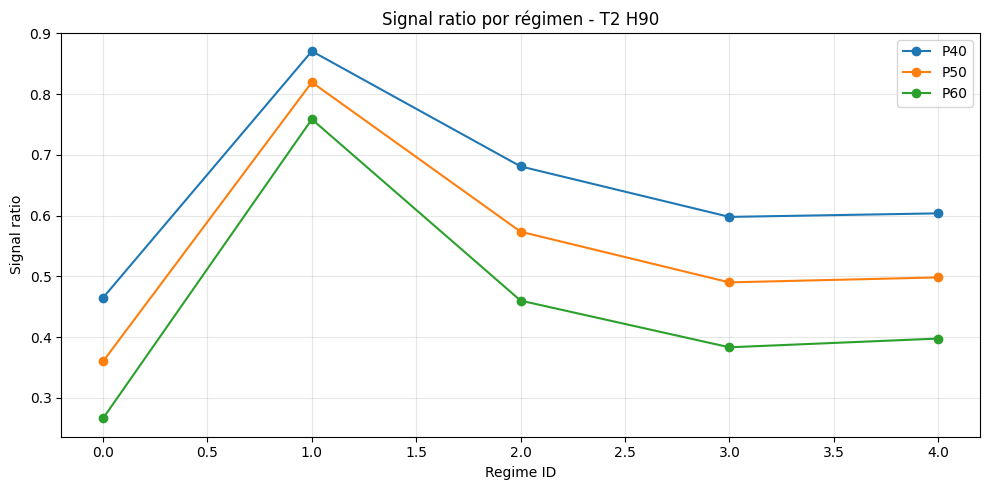

## Directional bias por régimen - T2

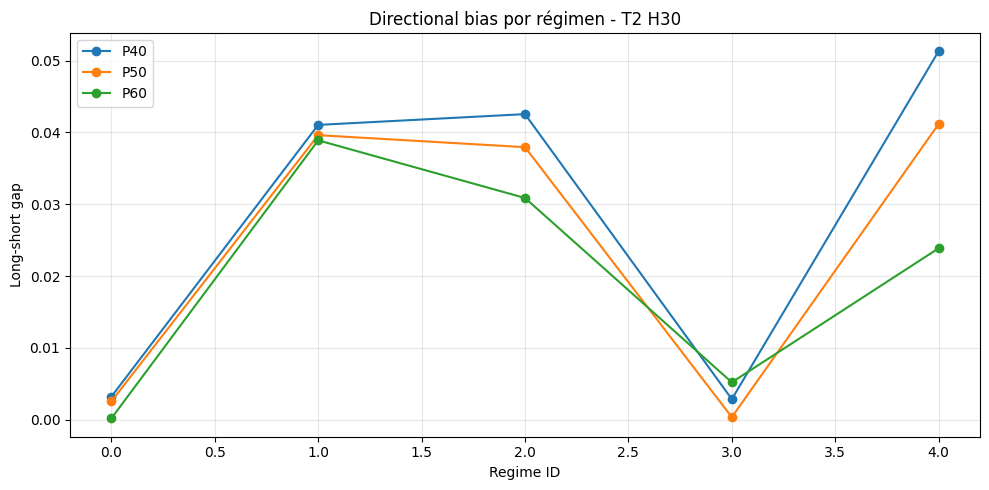

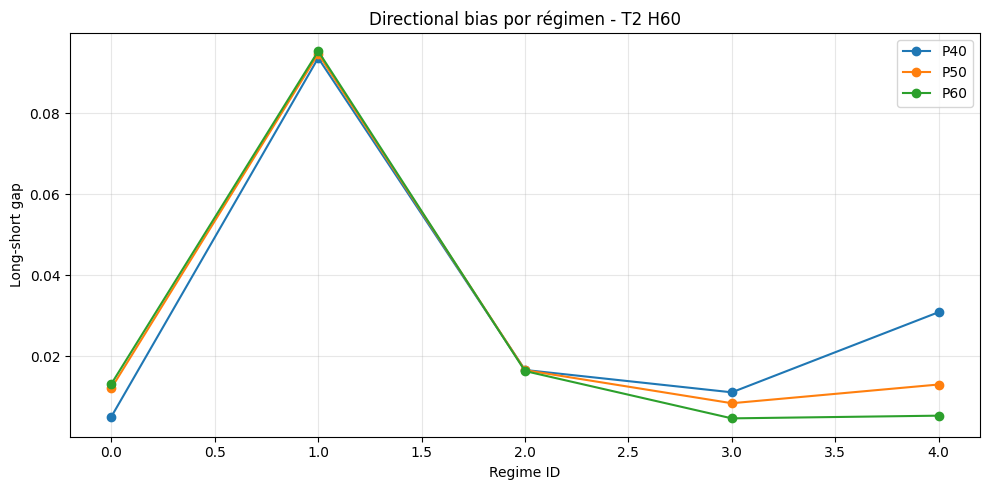

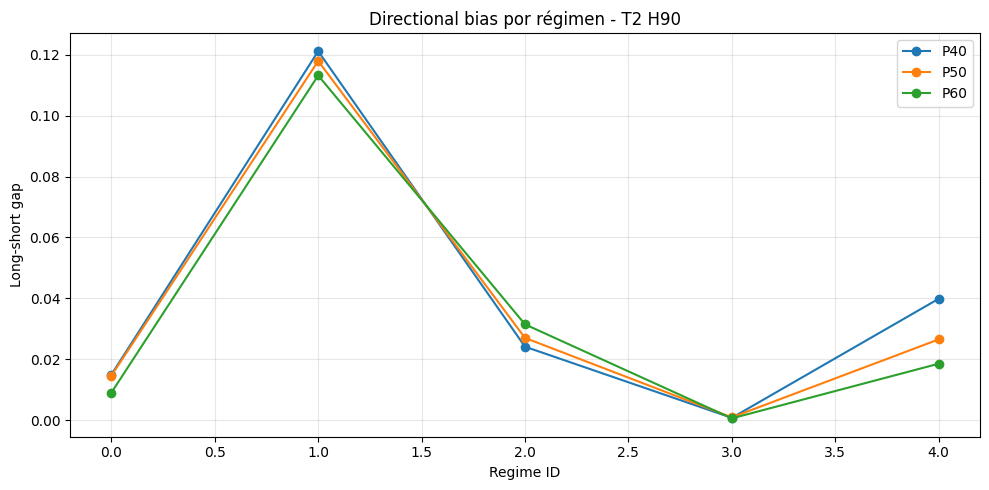

## Heatmap frecuencia operativa por régimen - T2

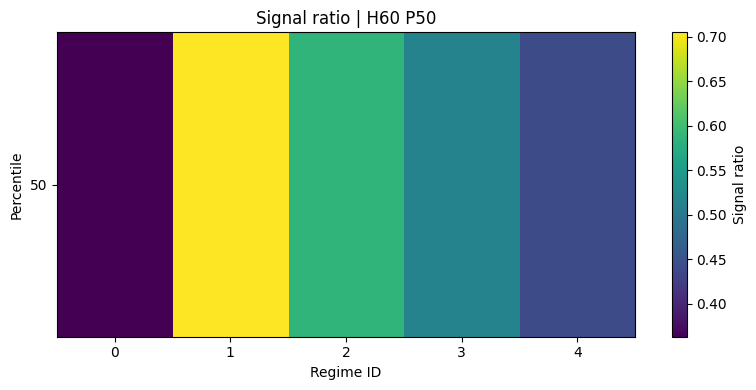

In [39]:
# =========================================================
# 4.6 Análisis por régimen intradiario - T2
# =========================================================

import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

regime_rows_t2 = []

for H in horizons:

    for p in percentiles:

        target_col = f"t2_p{p}_h{H}"

        grouped = (
            df_t2
            .groupby("regime_id")[target_col]
            .value_counts(normalize=True)
            .unstack(fill_value=0)
            .reset_index()
        )

        grouped.columns = [
            "regime_id",
            "class_-1_ratio",
            "class_0_ratio",
            "class_1_ratio"
        ]

        grouped["target"] = target_col
        grouped["horizon"] = H
        grouped["percentile"] = p

        grouped["signal_ratio"] = (
            grouped["class_-1_ratio"] +
            grouped["class_1_ratio"]
        )

        grouped["long_short_gap"] = abs(
            grouped["class_1_ratio"] -
            grouped["class_-1_ratio"]
        )

        regime_rows_t2.append(grouped)

df_t2_regime_analysis = pd.concat(
    regime_rows_t2,
    ignore_index=True
)

display(Markdown("## Distribución por régimen intradiario - T2"))
display(df_t2_regime_analysis.head())

# =========================================================
# Resumen compacto por régimen
# =========================================================

summary_regime_t2 = df_t2_regime_analysis[
    [
        "regime_id",
        "target",
        "horizon",
        "percentile",
        "signal_ratio",
        "class_0_ratio",
        "long_short_gap"
    ]
]

display(Markdown("## Resumen compacto por régimen - T2"))
display(summary_regime_t2)

# =========================================================
# Frecuencia operativa por régimen
# =========================================================

display(Markdown("## Frecuencia operativa por régimen - T2"))

selected_percentiles = [40, 50, 60]

for H in horizons:

    fig, ax = plt.subplots(figsize=(10, 5))

    for p in selected_percentiles:

        temp = summary_regime_t2[
            (summary_regime_t2["horizon"] == H) &
            (summary_regime_t2["percentile"] == p)
        ]

        ax.plot(
            temp["regime_id"],
            temp["signal_ratio"],
            marker="o",
            label=f"P{p}"
        )

    ax.set_title(f"Signal ratio por régimen - T2 H{H}")
    ax.set_xlabel("Regime ID")
    ax.set_ylabel("Signal ratio")

    ax.legend()
    ax.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

# =========================================================
# Directional bias por régimen
# =========================================================

display(Markdown("## Directional bias por régimen - T2"))

for H in horizons:

    fig, ax = plt.subplots(figsize=(10, 5))

    for p in selected_percentiles:

        temp = summary_regime_t2[
            (summary_regime_t2["horizon"] == H) &
            (summary_regime_t2["percentile"] == p)
        ]

        ax.plot(
            temp["regime_id"],
            temp["long_short_gap"],
            marker="o",
            label=f"P{p}"
        )

    ax.set_title(f"Directional bias por régimen - T2 H{H}")
    ax.set_xlabel("Regime ID")
    ax.set_ylabel("Long-short gap")

    ax.legend()
    ax.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

# =========================================================
# Heatmap frecuencia operativa por régimen
# =========================================================

display(Markdown("## Heatmap frecuencia operativa por régimen - T2"))

selected_horizon = 60
selected_percentile = 50

temp = summary_regime_t2[
    (summary_regime_t2["horizon"] == selected_horizon) &
    (summary_regime_t2["percentile"] == selected_percentile)
]

pivot_regime_signal = temp.pivot_table(
    index="percentile",
    columns="regime_id",
    values="signal_ratio"
)

fig, ax = plt.subplots(figsize=(8, 4))

im = ax.imshow(
    pivot_regime_signal,
    aspect="auto"
)

ax.set_xticks(range(len(pivot_regime_signal.columns)))
ax.set_xticklabels(pivot_regime_signal.columns)

ax.set_yticks(range(len(pivot_regime_signal.index)))
ax.set_yticklabels(pivot_regime_signal.index)

ax.set_xlabel("Regime ID")
ax.set_ylabel("Percentile")

ax.set_title(
    f"Signal ratio | H{selected_horizon} P{selected_percentile}"
)

cbar = plt.colorbar(im)
cbar.set_label("Signal ratio")

plt.tight_layout()
plt.show()


Este análisis permitirá determinar si ciertas configuraciones de T2 presentan un comportamiento más robusto, equilibrado u operable en determinados regímenes intradiarios, proporcionando información relevante para posibles filtros operativos o segmentaciones posteriores del modelado.

**Observaciones rápidas:**

* El comportamiento de T2 cambia fuertemente según el régimen intradiario, confirmando que la señal no está distribuida de manera homogénea a lo largo del día.

* Los regímenes 1 y 2 son claramente los más activos:

  * presentan la mayor frecuencia de señales
  * menor proporción de clase neutra
  * movimientos más intensos y frecuentes

* El régimen 2 aparece como el más “operable” de todos:

  * alcanza los mayores `signal_ratio`
  * especialmente en H30 y percentiles bajos/intermedios
  * refleja períodos de alta volatilidad y fuerte movimiento direccional

* El régimen 0 es el más neutro y conservador:

  * alta presencia de clase `0`
  * menor frecuencia operativa
  * menor intensidad de movimientos

* Los regímenes 3 y 4 muestran comportamientos intermedios:

  * todavía generan señales relevantes
  * pero con menor consistencia que 1 y 2

* El directional bias cambia mucho según el régimen:

  * algunos regímenes permanecen muy balanceados
  * otros muestran fuertes sesgos long

* En H60 y especialmente H90, el régimen 1 presenta un directional bias extremadamente alto, indicando predominancia clara de movimientos alcistas prolongados.

* El régimen 3 es el más equilibrado estadísticamente:

  * directional bias cercano a cero
  * comportamiento relativamente estable entre horizontes y percentiles

* El heatmap confirma que la frecuencia operativa depende más del régimen intradiario que del horizonte temporal.

* Los resultados sugieren que la señal predictiva potencial podría estar concentrada principalmente en ciertos períodos específicos del día y no distribuida uniformemente sobre todo el dataset.

* En términos prácticos:

  * regímenes 1–2 → mayor densidad de oportunidades
  * régimen 0 → mercado más neutro y menos operativo
  * régimen 3 → comportamiento más estable y balanceado
  * régimen 4 → más variable y con directional bias más inestable

* Esto refuerza la idea de que futuras etapas de modelado podrían beneficiarse de:

  * filtros por régimen
  * modelos especializados por contexto intradiario
  * selección de targets condicionada al régimen operativo.


### **4.7. Observaciones e interpretación**

El análisis estadístico de T2 muestra que la incorporación de thresholds modifica profundamente la estructura del problema respecto a T1, permitiendo controlar explícitamente la relación entre frecuencia operativa y filtrado de ruido.

A diferencia de T1, donde todas las observaciones generan una señal direccional, T2 introduce una clase neutra (`0`) que actúa como mecanismo de selección estadística, eliminando movimientos de baja magnitud potencialmente asociados a ruido de mercado.

Los resultados muestran que el parámetro más influyente de T2 corresponde al percentil utilizado para definir el threshold. A medida que aumenta el percentil:

* disminuye la frecuencia operativa
* aumenta la proporción de clase neutra
* el target se vuelve más selectivo
* se reducen los movimientos considerados explotables

En términos generales:

* percentiles bajos producen targets densos y frecuentes
* percentiles altos generan targets más conservadores y filtrados

Los percentiles intermedios (`P40–P55`) aparecen consistentemente como la región de mejor compromiso entre:

* cantidad de señales
* reducción de ruido
* balance estadístico
* estabilidad temporal
* operabilidad práctica

Desde el punto de vista estadístico, T2 mantiene un balance razonable entre señales long y short, especialmente en horizontes cortos (`H30`). Sin embargo, en horizontes más amplios (`H60` y `H90`) comienza a observarse un directional bias progresivo hacia movimientos alcistas, particularmente en configuraciones más selectivas.

El análisis temporal evidencia que T2 no es estacionario. La frecuencia operativa cambia significativamente según las condiciones de volatilidad del mercado, mostrando períodos donde predominan señales frecuentes y otros donde domina ampliamente la clase neutra.

No obstante, incluso bajo estas variaciones, T2 conserva una estructura relativamente robusta y coherente entre horizontes y configuraciones paramétricas.

El análisis por régimen intradiario revela uno de los hallazgos más importantes de toda la investigación estadística:

la señal no se distribuye homogéneamente a lo largo del día.

Los regímenes 1 y 2 concentran la mayor cantidad de movimientos significativos y presentan la mayor frecuencia operativa, mientras que otros regímenes muestran dinámicas mucho más neutras o balanceadas.

Esto sugiere que la predictibilidad potencial del mercado podría estar fuertemente condicionada por el contexto intradiario y no únicamente por la formulación del target.

En conjunto, los resultados obtenidos muestran que T2 logra:

* reducir ruido respecto a T1
* controlar explícitamente la densidad de señales
* mantener balance estadístico aceptable
* introducir selectividad operativa
* capturar diferencias estructurales entre regímenes de mercado

Como consecuencia, T2 representa una formulación significativamente más cercana a escenarios reales de trading algorítmico, proporcionando una base más operativa y potencialmente más explotable para las siguientes etapas de modelado y evaluación predictiva.



## **5. T3 - Investigación estadística**

### **5.1. Construcción práctica de T3**

Mientras que T1 y T2 se construyen directamente a partir del movimiento futuro del precio, T3 introduce una lógica explícitamente operativa.

El objetivo deja de ser predecir la dirección del mercado y pasa a determinar si una operación hipotética habría resultado exitosa bajo un conjunto de reglas previamente definidas.

De esta forma, T3 transforma el problema en una clasificación binaria:

* **1:** trade exitoso
* **0:** trade no exitoso

La definición de éxito depende de parámetros operativos específicos, tales como:

* dirección de la operación (long o short)
* take profit (TP)
* horizonte máximo de permanencia
* criterio de cierre al finalizar el horizonte

A diferencia de T1 y T2, donde la etiqueta depende exclusivamente del movimiento futuro del precio, en T3 la etiqueta está asociada al resultado económico de una operación simulada.

En esta investigación, la construcción de T3 se realizará utilizando como señal de entrada las configuraciones previamente definidas en T2. Para cada observación:

* una señal long genera una operación compradora
* una señal short genera una operación vendedora
* las observaciones sin señal no generan operación

Posteriormente se evaluará si la operación alcanza las condiciones definidas para considerarse exitosa.

El objetivo de T3 consiste en responder la siguiente pregunta:

> ¿Las señales generadas por T2 poseen valor operativo real cuando se transforman en operaciones concretas de trading?

Esta formulación acerca significativamente el target al problema real de toma de decisiones, ya que el modelo deja de predecir movimientos de mercado y pasa a predecir directamente la calidad potencial de una operación.

#### **5.1.1 Definición de parámetros operativos**

La construcción de T3 parte de las señales generadas por T2. En este sentido, los thresholds definidos previamente no representan directamente el take profit o stop loss de la operación, sino que funcionan como filtros de entrada para determinar cuándo existe un movimiento suficientemente relevante como para generar una señal operativa.

Por lo tanto, T3 utiliza dos tipos de parámetros:

| Parámetro       | Función                                       |
| --------------- | --------------------------------------------- |
| Horizonte (H)   | define la ventana futura de evaluación        |
| Percentil T2    | define la exigencia mínima para generar señal |
| Señal T2        | define dirección long o short                 |
| TP              | define objetivo de ganancia                   |
| SL              | define pérdida máxima permitida               |
| Regla de cierre | define qué ocurre si no se alcanza TP/SL      |
| Dirección       | long o short según la señal T2                |

Para mantener consistencia con el análisis previo de T2, se utilizarán los siguientes horizontes:

* (H = 30)
* (H = 60)
* (H = 90)

Y como configuraciones candidatas de T2, se utilizarán percentiles intermedios:

* (P40)
* (P50)
* (P60)

Estos percentiles representan un compromiso razonable entre frecuencia operativa y filtrado de ruido, evitando tanto targets excesivamente densos como targets demasiado selectivos.

En esta etapa, T3 se construirá evaluando si una señal generada por T2 habría alcanzado un resultado operativo favorable dentro del horizonte definido. La lógica general será:

* si T2 = `1`, se evalúa una operación long
* si T2 = `-1`, se evalúa una operación short
* si T2 = `0`, no se genera trade

La definición exacta de trade exitoso dependerá de las reglas operativas adoptadas, principalmente TP, SL y cierre por horizonte.


#### **5.1.2 Construcción de los trades**


La construcción de trades consiste en transformar las señales generadas por T2 en operaciones hipotéticas.

Para cada configuración de T2:

* `1` genera un trade long
* `-1` genera un trade short
* `0` no genera trade

En esta etapa todavía no se evalúa si el trade fue exitoso o no. Solo se construyen las condiciones de entrada, dirección y ventana futura de evaluación.

In [40]:
# =========================================================
# 5.1.2 Construcción de trades desde señales T2
# =========================================================

import numpy as np
import pandas as pd
from IPython.display import display, Markdown

# Copia de trabajo desde df_t2
df_t3 = df_t2.copy()

# Configuraciones candidatas provenientes de T2
horizons_t3 = [30, 60, 90]
percentiles_t3 = [40, 50, 60]

# =========================================================
# Construir columnas de dirección de trade
# =========================================================

trade_cols_t3 = []

for H in horizons_t3:

    for p in percentiles_t3:

        signal_col = f"t2_p{p}_h{H}"
        trade_col = f"trade_direction_t2_p{p}_h{H}"

        df_t3[trade_col] = np.select(
            [
                df_t3[signal_col] == 1,
                df_t3[signal_col] == -1
            ],
            [
                1,   # Long
                -1   # Short
            ],
            default=0  # No trade
        )

        trade_cols_t3.append(trade_col)

# =========================================================
# Resumen de trades generados
# =========================================================

trade_summary_t3 = []

for col in trade_cols_t3:

    counts = df_t3[col].value_counts().sort_index()
    ratios = df_t3[col].value_counts(normalize=True).sort_index()

    trade_summary_t3.append({
        "trade_col": col,
        "n_no_trade": counts.get(0, 0),
        "n_long": counts.get(1, 0),
        "n_short": counts.get(-1, 0),
        "ratio_no_trade": ratios.get(0, 0),
        "ratio_long": ratios.get(1, 0),
        "ratio_short": ratios.get(-1, 0),
        "trade_rate": ratios.get(1, 0) + ratios.get(-1, 0)
    })

df_t3_trade_summary = pd.DataFrame(trade_summary_t3)

display(Markdown("## Resumen de trades generados desde T2"))
display(df_t3_trade_summary)

## Resumen de trades generados desde T2

,trade_col,n_no_trade,n_long,n_short,ratio_no_trade,ratio_long,ratio_short,trade_rate
0,trade_direction_t2_p40_h30,358950,269410,263714,0.402377,0.302004,0.295619,0.597623
1,trade_direction_t2_p50_h30,446882,224762,220430,0.500947,0.251954,0.247098,0.499053
2,trade_direction_t2_p60_h30,535374,179784,176916,0.600145,0.201535,0.198320,0.399855
3,trade_direction_t2_p40_h60,358575,269067,264432,0.401957,0.301620,0.296424,0.598043
4,trade_direction_t2_p50_h60,446805,226783,218486,0.500861,0.254220,0.244919,0.499139
5,trade_direction_t2_p60_h60,536026,183553,172495,0.600876,0.205760,0.193364,0.399124
6,trade_direction_t2_p40_h90,356886,275020,260168,0.400063,0.308293,0.291644,0.599937
7,trade_direction_t2_p50_h90,447224,230127,214723,0.501331,0.257969,0.240701,0.498669
8,trade_direction_t2_p60_h90,535849,185279,170946,0.600678,0.207695,0.191628,0.399322


Con este bloque, T3 queda preparado para la siguiente etapa: evaluar el resultado operativo de cada trade dentro del horizonte correspondiente.


#### **5.1.3 Construcción de los targets T3**


T3 evalúa si una señal operativa generada por T2 habría resultado exitosa. Para cada trade:

* señal `1` → operación long
* señal `-1` → operación short
* señal `0` → no trade

Se define:

* `1` → trade exitoso, alcanza TP
* `0` → trade no exitoso, alcanza SL o no alcanza TP dentro del horizonte
* `NaN` → no hubo trade

In [41]:
# =========================================================
# 5.1.3 Construcción de targets T3
# =========================================================

import numpy as np
import pandas as pd
from IPython.display import display, Markdown

# Copia de trabajo
df_t3 = df_t2.copy()

# Configuraciones candidatas desde T2
horizons_t3 = [30, 60, 90]
percentiles_t3 = [40, 50, 60]

# Parámetros operativos iniciales
# Ajustar estos valores según la estrategia
tp_sl_configs = [
    {"tp_pts": 30, "sl_pts": 30}
]

# =========================================================
# Función para evaluar outcome de trades
# =========================================================

def build_t3_outcome(df, signal_col, horizon, tp_pts, sl_pts):
    """
    Construye target T3:
    1 = trade exitoso
    0 = trade no exitoso
    NaN = no trade
    """

    close = df["close"].to_numpy()
    high = df["high"].to_numpy()
    low = df["low"].to_numpy()
    signal = df[signal_col].to_numpy()

    outcome = np.full(len(df), np.nan)

    for i in range(len(df) - horizon):

        direction = signal[i]

        if direction == 0:
            continue

        entry = close[i]
        future_high = high[i + 1:i + horizon + 1]
        future_low = low[i + 1:i + horizon + 1]

        if direction == 1:
            tp_level = entry + tp_pts
            sl_level = entry - sl_pts

            hit_tp = np.where(future_high >= tp_level)[0]
            hit_sl = np.where(future_low <= sl_level)[0]

        elif direction == -1:
            tp_level = entry - tp_pts
            sl_level = entry + sl_pts

            hit_tp = np.where(future_low <= tp_level)[0]
            hit_sl = np.where(future_high >= sl_level)[0]

        else:
            continue

        first_tp = hit_tp[0] if len(hit_tp) > 0 else np.inf
        first_sl = hit_sl[0] if len(hit_sl) > 0 else np.inf

        if first_tp < first_sl:
            outcome[i] = 1
        else:
            outcome[i] = 0

    return outcome

# =========================================================
# Construir targets T3
# =========================================================

t3_cols = []

for H in horizons_t3:

    for p in percentiles_t3:

        signal_col = f"t2_p{p}_h{H}"

        for cfg in tp_sl_configs:

            tp = cfg["tp_pts"]
            sl = cfg["sl_pts"]

            target_col = f"t3_t2_p{p}_h{H}_tp{tp}_sl{sl}"

            df_t3[target_col] = build_t3_outcome(
                df=df_t3,
                signal_col=signal_col,
                horizon=H,
                tp_pts=tp,
                sl_pts=sl
            )

            t3_cols.append(target_col)

# =========================================================
# Resumen inicial de targets T3 construidos
# =========================================================

summary_t3_targets = []

for col in t3_cols:

    valid_trades = df_t3[col].notna().sum()
    successful_trades = (df_t3[col] == 1).sum()
    failed_trades = (df_t3[col] == 0).sum()

    success_rate = successful_trades / valid_trades if valid_trades > 0 else np.nan

    summary_t3_targets.append({
        "target": col,
        "valid_trades": valid_trades,
        "successful_trades": successful_trades,
        "failed_trades": failed_trades,
        "success_rate": success_rate
    })

df_t3_target_summary = pd.DataFrame(summary_t3_targets)

display(Markdown("## Resumen inicial de targets T3 construidos"))
display(df_t3_target_summary)

display(Markdown("## Revisión inicial del dataset T3"))
display(df_t3[["date", "close"] + t3_cols].head())

## Resumen inicial de targets T3 construidos

,target,valid_trades,successful_trades,failed_trades,success_rate
0,t3_t2_p40_h30_tp30_sl30,533100,394780,138320,0.740536
1,t3_t2_p50_h30_tp30_sl30,445170,346840,98330,0.779118
2,t3_t2_p60_h30_tp30_sl30,356682,282255,74427,0.791335
3,t3_t2_p40_h60_tp30_sl30,533460,387639,145821,0.726651
4,t3_t2_p50_h60_tp30_sl30,445234,323903,121331,0.727489
5,t3_t2_p60_h60_tp30_sl30,356019,258806,97213,0.726944
6,t3_t2_p40_h90_tp30_sl30,535111,371235,163876,0.693753
7,t3_t2_p50_h90_tp30_sl30,444782,308941,135841,0.694590
8,t3_t2_p60_h90_tp30_sl30,356166,247673,108493,0.695386


## Revisión inicial del dataset T3

,date,close,t3_t2_p40_h30_tp30_sl30,t3_t2_p50_h30_tp30_sl30,t3_t2_p60_h30_tp30_sl30,t3_t2_p40_h60_tp30_sl30,t3_t2_p50_h60_tp30_sl30,t3_t2_p60_h60_tp30_sl30,t3_t2_p40_h90_tp30_sl30,t3_t2_p50_h90_tp30_sl30,t3_t2_p60_h90_tp30_sl30
0,2020-01-02,8818.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2020-01-02,8837.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2020-01-02,8838.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2020-01-02,8841.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2020-01-02,8842.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


##### **Observaciones preliminares sobre la construcción de T3**



Los resultados obtenidos sugieren que la construcción inicial de T3 se ha realizado correctamente. En primer lugar, la cantidad de trades válidos generados para cada configuración coincide prácticamente con la cantidad de señales observadas previamente en T2, lo que confirma la consistencia entre ambas etapas de construcción. Las pequeñas diferencias observadas se explican por la pérdida natural de algunas observaciones al acercarse al final de la serie temporal, donde ya no existe suficiente información futura para completar el horizonte de evaluación.

Adicionalmente, los resultados muestran patrones operativos que resultan intuitivos desde el punto de vista del trading. Se observa que, para un mismo horizonte, la tasa de éxito aumenta a medida que se incrementa el percentil utilizado en T2. Esto es coherente con la lógica de construcción del target, ya que thresholds más exigentes filtran movimientos más relevantes y generan señales potencialmente de mayor calidad.

Asimismo, se aprecia una disminución gradual de la tasa de éxito al aumentar el horizonte temporal. Este comportamiento también resulta razonable, dado que horizontes más amplios exponen a las operaciones a una mayor cantidad de fluctuaciones y posibles reversiones del mercado antes de alcanzar el objetivo planteado.

Sin embargo, antes de avanzar hacia el análisis estadístico completo de T3, resulta necesario realizar una validación específica de la lógica de construcción del target. Las tasas de éxito observadas son relativamente elevadas para una configuración simétrica de TP = 30 puntos y SL = 30 puntos, por lo que conviene verificar detalladamente cómo se están clasificando los distintos resultados posibles de una operación.

En particular, es importante confirmar:

* cantidad de trades que alcanzan TP
* cantidad de trades que alcanzan SL
* cantidad de trades que finalizan por vencimiento del horizonte (timeout)
* criterio exacto utilizado para clasificar un trade como exitoso o no exitoso

Esta validación permitirá asegurar que la implementación práctica de T3 coincide con la definición conceptual adoptada para la investigación y proporcionará una base sólida antes de continuar con el análisis estadístico del target.


#### **5.1.4 Validación de la construcción de T3**

Antes de iniciar el análisis estadístico de T3, resulta necesario verificar que la lógica de construcción implementada represente correctamente el comportamiento operativo que se desea modelar.

A diferencia de T1 y T2, donde las etiquetas dependen únicamente del comportamiento futuro del precio, T3 incorpora reglas explícitas de trading. Como consecuencia, la calidad del target depende directamente de cómo se clasifican los distintos resultados posibles de una operación.

El objetivo de esta etapa consiste en validar que la construcción de T3 refleje correctamente:

* cantidad total de trades generados
* trades exitosos (TP alcanzado primero)
* trades fallidos (SL alcanzado primero)
* trades finalizados por vencimiento del horizonte (timeout)
* tasa de éxito resultante (win rate)

Esta validación permite confirmar que la implementación práctica coincide con la definición conceptual del target antes de proceder al análisis estadístico.

---

**Validación de resultados operativos**

Para cada configuración evaluada se analizarán los distintos desenlaces posibles de una operación:

| Resultado | Interpretación                               |
| --------- | -------------------------------------------- |
| TP        | el trade alcanza el objetivo de ganancia     |
| SL        | el trade alcanza la pérdida máxima permitida |
| Timeout   | finaliza el horizonte sin alcanzar TP ni SL  |
| No Trade  | no existió señal operativa en T2             |

El objetivo consiste en verificar la proporción relativa de cada uno de estos escenarios y evaluar si la distribución resultante es coherente con la lógica de construcción adoptada.

In [42]:
# =========================================================
# 5.1.4 Validación de la construcción de T3
# =========================================================

import numpy as np
import pandas as pd
from IPython.display import display, Markdown

validation_rows = []

for H in horizons_t3:

    for p in percentiles_t3:

        signal_col = f"t2_p{p}_h{H}"

        tp = 30
        sl = 30

        n_tp = 0
        n_sl = 0
        n_timeout = 0
        n_no_trade = 0

        close = df_t3["close"].to_numpy()
        high = df_t3["high"].to_numpy()
        low = df_t3["low"].to_numpy()
        signal = df_t3[signal_col].to_numpy()

        for i in range(len(df_t3) - H):

            direction = signal[i]

            if direction == 0:
                n_no_trade += 1
                continue

            entry = close[i]

            future_high = high[i+1:i+H+1]
            future_low = low[i+1:i+H+1]

            if direction == 1:

                tp_level = entry + tp
                sl_level = entry - sl

                hit_tp = np.where(future_high >= tp_level)[0]
                hit_sl = np.where(future_low <= sl_level)[0]

            else:

                tp_level = entry - tp
                sl_level = entry + sl

                hit_tp = np.where(future_low <= tp_level)[0]
                hit_sl = np.where(future_high >= sl_level)[0]

            first_tp = hit_tp[0] if len(hit_tp) > 0 else np.inf
            first_sl = hit_sl[0] if len(hit_sl) > 0 else np.inf

            if first_tp < first_sl:
                n_tp += 1

            elif first_sl < first_tp:
                n_sl += 1

            else:
                n_timeout += 1

        total_trades = n_tp + n_sl + n_timeout

        validation_rows.append({
            "target": f"t3_t2_p{p}_h{H}",
            "horizon": H,
            "percentile": p,

            "n_trades": total_trades,
            "n_tp": n_tp,
            "n_sl": n_sl,
            "n_timeout": n_timeout,
            "n_no_trade": n_no_trade,

            "tp_ratio": n_tp / total_trades if total_trades else np.nan,
            "sl_ratio": n_sl / total_trades if total_trades else np.nan,
            "timeout_ratio": n_timeout / total_trades if total_trades else np.nan,

            "win_rate": n_tp / total_trades if total_trades else np.nan
        })

df_t3_validation = pd.DataFrame(validation_rows)

display(Markdown("## Validación de la construcción de T3"))
display(df_t3_validation)

## Validación de la construcción de T3

,target,horizon,percentile,n_trades,n_tp,n_sl,n_timeout,n_no_trade,tp_ratio,sl_ratio,timeout_ratio,win_rate
0,t3_t2_p40_h30,30,40,533100,394780,110471,27849,358944,0.740536,0.207224,0.052240,0.740536
1,t3_t2_p50_h30,30,50,445170,346840,92038,6292,446874,0.779118,0.206748,0.014134,0.779118
2,t3_t2_p60_h30,30,60,356682,282255,74142,285,535362,0.791335,0.207866,0.000799,0.791335
3,t3_t2_p40_h60,60,40,533460,387639,144501,1320,358554,0.726651,0.270875,0.002474,0.726651
4,t3_t2_p50_h60,60,50,445234,323903,120968,363,446780,0.727489,0.271695,0.000815,0.727489
5,t3_t2_p60_h60,60,60,356019,258806,96880,333,535995,0.726944,0.272120,0.000935,0.726944
6,t3_t2_p40_h90,90,40,535111,371235,163452,424,356873,0.693753,0.305454,0.000792,0.693753
7,t3_t2_p50_h90,90,50,444782,308941,135453,388,447202,0.694590,0.304538,0.000872,0.694590
8,t3_t2_p60_h90,90,60,356166,247673,108147,346,535818,0.695386,0.303642,0.000971,0.695386


##### **Observaciones de validación de T3**





* La construcción del target es consistente y no presenta comportamientos anómalos evidentes.

* La tasa de éxito observada coincide exactamente con la proporción de trades que alcanzan TP antes que SL, confirmando que la implementación está funcionando según lo esperado.

* Los trades finalizados por timeout son prácticamente inexistentes en la mayoría de las configuraciones:

  * H30 P40: 5.2%
  * H30 P50: 1.4%
  * H30 P60: 0.08%
  * H60 y H90: inferiores al 0.3%

* Esto indica que la gran mayoría de las operaciones alcanzan alguna de las barreras antes de finalizar el horizonte.

* A medida que aumenta el percentil de T2:

  * disminuye la cantidad de trades generados
  * aumenta la probabilidad de alcanzar TP
  * desaparecen casi completamente los timeouts

* Este comportamiento es coherente con la lógica de T2: señales más exigentes corresponden a movimientos más fuertes y direccionales.

* Para H30 se observa una mejora progresiva del win rate:

  * P40 → 74.1%
  * P50 → 77.9%
  * P60 → 79.1%

* Sin embargo, esta mejora se estabiliza para horizontes más largos:

  * H60 → aproximadamente 72.7%
  * H90 → aproximadamente 69.5%

* El efecto del percentil parece ser mucho más importante en H30 que en H60 y H90.

* A medida que aumenta el horizonte, el porcentaje de trades que terminan en SL también aumenta:

  * ~21% en H30
  * ~27% en H60
  * ~30% en H90

* Esto sugiere que la ventaja direccional inicial de la señal se deteriora progresivamente conforme se amplía la ventana temporal de evaluación.

**Hallazgo importante**

Un resultado particularmente relevante es que los timeouts prácticamente desaparecen en casi todas las configuraciones.

Esto implica que, para un TP/SL de ±30 puntos, el mercado suele alcanzar alguna de las barreras mucho antes de que expire el horizonte.

Como consecuencia:

* T3 se comporta en la práctica como un problema binario casi puro:

  * TP
  * SL

* La influencia del vencimiento por tiempo es mínima.

Este hallazgo es importante porque anticipa algo que probablemente veremos en T4: las barreras están capturando la mayor parte de la dinámica operativa del mercado y los eventos de timeout tienen un peso muy reducido bajo esta configuración de TP y SL.

En resumen, la validación confirma que T3 está correctamente construido, que las etiquetas son coherentes con la lógica operativa definida y que el target se encuentra listo para iniciar su análisis estadístico formal.


#### **5.1.5 Resumen de targets generados**

Como resultado del proceso de construcción, se generaron distintas variantes del target T3 combinando:

* horizontes temporales
* configuraciones de T2 utilizadas como señal de entrada
* reglas operativas definidas para la evaluación del trade

La Tabla siguiente resume los targets construidos para la investigación estadística posterior.

| Target                  | Horizonte | Percentil T2 | TP | SL |
| ----------------------- | --------- | ------------ | -- | -- |
| t3_t2_p40_h30_tp30_sl30 | 30        | 40           | 30 | 30 |
| t3_t2_p50_h30_tp30_sl30 | 30        | 50           | 30 | 30 |
| t3_t2_p60_h30_tp30_sl30 | 30        | 60           | 30 | 30 |
| t3_t2_p40_h60_tp30_sl30 | 60        | 40           | 30 | 30 |
| t3_t2_p50_h60_tp30_sl30 | 60        | 50           | 30 | 30 |
| t3_t2_p60_h60_tp30_sl30 | 60        | 60           | 30 | 30 |
| t3_t2_p40_h90_tp30_sl30 | 90        | 40           | 30 | 30 |
| t3_t2_p50_h90_tp30_sl30 | 90        | 50           | 30 | 30 |
| t3_t2_p60_h90_tp30_sl30 | 90        | 60           | 30 | 30 |

Los targets generados constituyen la base para la investigación estadística desarrollada en las siguientes secciones, donde se analizarán aspectos como distribución de clases, frecuencia operativa, estabilidad temporal, sensibilidad paramétrica y comportamiento por régimen intradiario.


### **5.2. Distribución de clases**

A diferencia de T2, donde el objetivo consiste en identificar movimientos significativos del mercado, T3 transforma el problema en la evaluación del resultado de una operación concreta.

Como consecuencia, las clases dejan de representar movimientos de precio y pasan a representar resultados operativos:

* `1` → trade exitoso
* `0` → trade no exitoso

Además, las observaciones sin señal previa en T2 no generan operaciones y, por lo tanto, quedan excluidas del target mediante valores nulos (`NaN`).

El objetivo de esta sección consiste en analizar:

* balance entre trades exitosos y no exitosos
* proporción de operaciones válidas
* efecto del horizonte temporal
* efecto de los thresholds heredados de T2
* dificultad estadística del problema de clasificación

A diferencia de T1 y T2, donde el balance de clases estaba asociado al comportamiento del mercado, en T3 el balance refleja directamente la calidad operativa de las señales generadas.

## Distribución de clases - T3

,target,horizon,percentile,tp_pts,sl_pts,valid_trades,class_0_count,class_1_count,class_0_ratio,class_1_ratio,balance_gap
0,t3_t2_p40_h30_tp30_sl30,30,40,30,30,533100,138320,394780,0.259464,0.740536,0.481073
1,t3_t2_p50_h30_tp30_sl30,30,50,30,30,445170,98330,346840,0.220882,0.779118,0.558236
2,t3_t2_p60_h30_tp30_sl30,30,60,30,30,356682,74427,282255,0.208665,0.791335,0.582670
3,t3_t2_p40_h60_tp30_sl30,60,40,30,30,533460,145821,387639,0.273349,0.726651,0.453301
4,t3_t2_p50_h60_tp30_sl30,60,50,30,30,445234,121331,323903,0.272511,0.727489,0.454979
5,t3_t2_p60_h60_tp30_sl30,60,60,30,30,356019,97213,258806,0.273056,0.726944,0.453889
6,t3_t2_p40_h90_tp30_sl30,90,40,30,30,535111,163876,371235,0.306247,0.693753,0.387507
7,t3_t2_p50_h90_tp30_sl30,90,50,30,30,444782,135841,308941,0.305410,0.694590,0.389179
8,t3_t2_p60_h90_tp30_sl30,90,60,30,30,356166,108493,247673,0.304614,0.695386,0.390773


## Resumen compacto de distribución - T3

,target,horizon,percentile,tp_pts,sl_pts,valid_trades,class_0_ratio,class_1_ratio,balance_gap
0,t3_t2_p40_h30_tp30_sl30,30,40,30,30,533100,0.259464,0.740536,0.481073
1,t3_t2_p50_h30_tp30_sl30,30,50,30,30,445170,0.220882,0.779118,0.558236
2,t3_t2_p60_h30_tp30_sl30,30,60,30,30,356682,0.208665,0.791335,0.582670
3,t3_t2_p40_h60_tp30_sl30,60,40,30,30,533460,0.273349,0.726651,0.453301
4,t3_t2_p50_h60_tp30_sl30,60,50,30,30,445234,0.272511,0.727489,0.454979
5,t3_t2_p60_h60_tp30_sl30,60,60,30,30,356019,0.273056,0.726944,0.453889
6,t3_t2_p40_h90_tp30_sl30,90,40,30,30,535111,0.306247,0.693753,0.387507
7,t3_t2_p50_h90_tp30_sl30,90,50,30,30,444782,0.305410,0.694590,0.389179
8,t3_t2_p60_h90_tp30_sl30,90,60,30,30,356166,0.304614,0.695386,0.390773


## Distribución de clases según percentil - T3

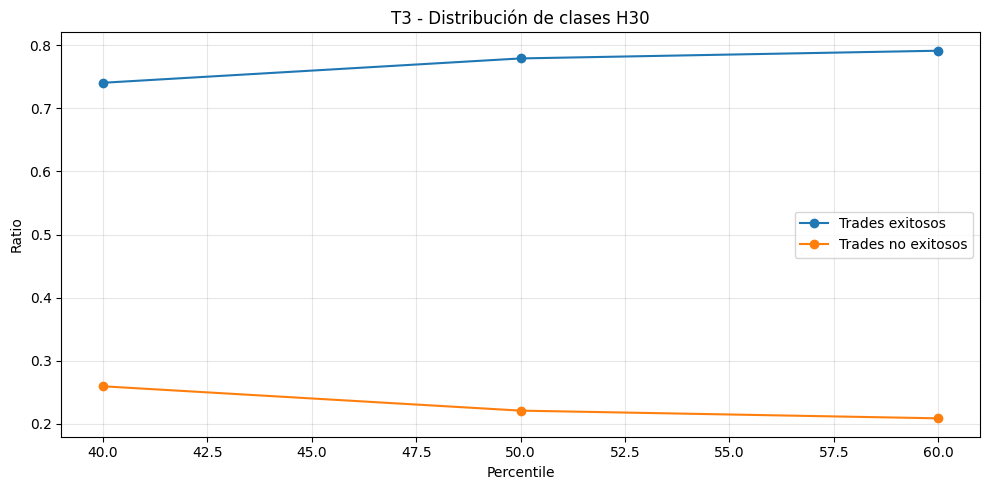

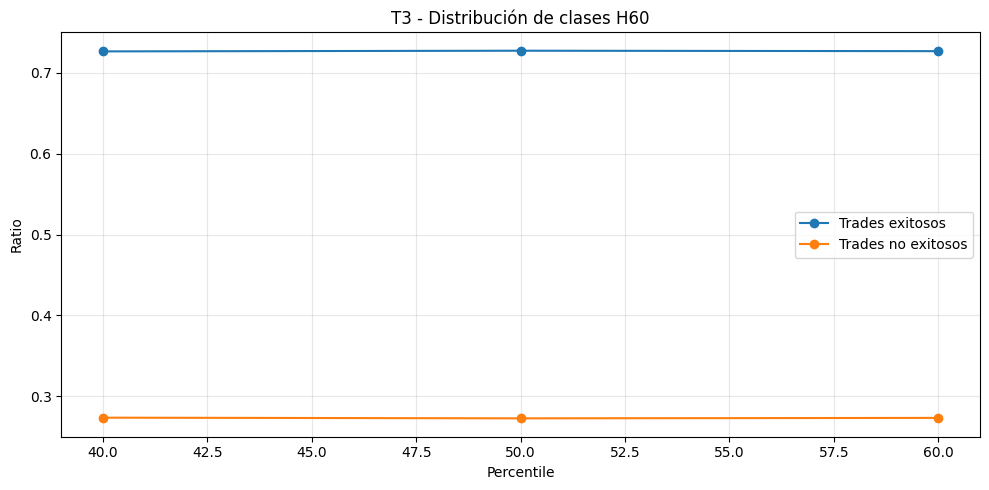

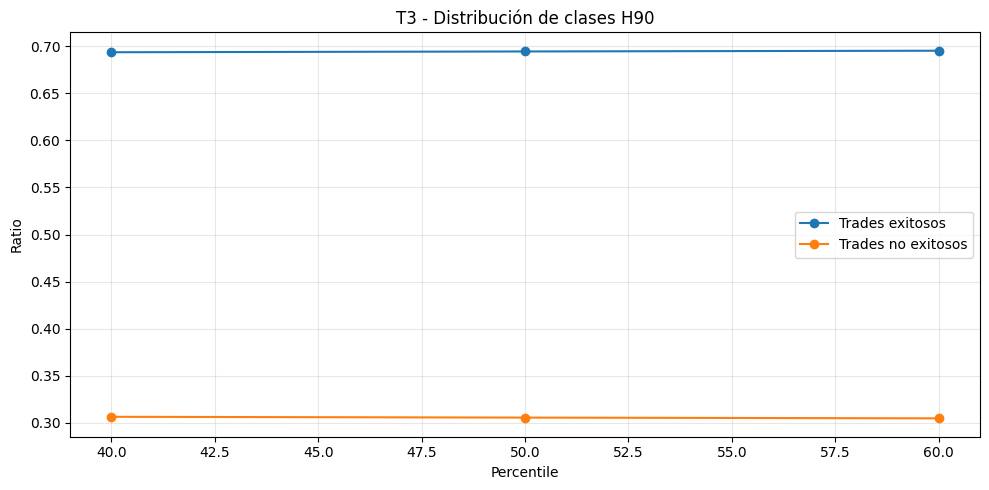

## Balance de clases - T3

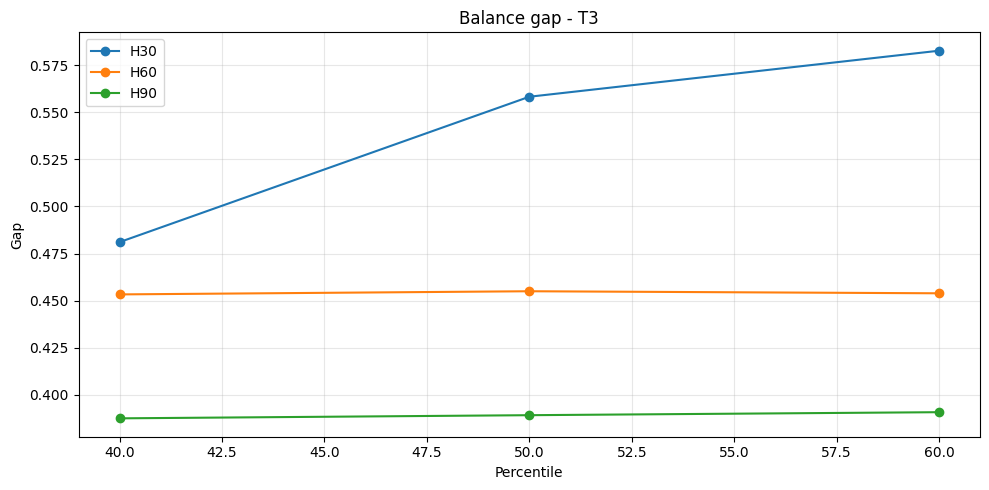

In [43]:
# =========================================================
# 5.2 Distribución de clases - T3
# =========================================================

import re
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

t3_distribution_rows = []

for col in t3_cols:

    valid_data = df_t3[col].dropna()

    counts = (
        valid_data
        .value_counts()
        .sort_index()
    )

    ratios = (
        valid_data
        .value_counts(normalize=True)
        .sort_index()
    )

    # Extraer metadata desde el nombre del target
    # Ejemplo esperado: t3_t2_p40_h30_tp30_sl30
    match = re.search(r"p(\d+)_h(\d+)_tp(\d+)_sl(\d+)", col)

    if match is None:
        raise ValueError(f"No se pudo extraer metadata desde el nombre: {col}")

    percentile = int(match.group(1))
    horizon = int(match.group(2))
    tp_pts = int(match.group(3))
    sl_pts = int(match.group(4))

    t3_distribution_rows.append({
        "target": col,
        "horizon": horizon,
        "percentile": percentile,
        "tp_pts": tp_pts,
        "sl_pts": sl_pts,

        "valid_trades": len(valid_data),

        "class_0_count": counts.get(0, 0),
        "class_1_count": counts.get(1, 0),

        "class_0_ratio": ratios.get(0, 0),
        "class_1_ratio": ratios.get(1, 0),

        "balance_gap": abs(
            ratios.get(1, 0) -
            ratios.get(0, 0)
        )
    })

df_t3_class_distribution = pd.DataFrame(t3_distribution_rows)

display(Markdown("## Distribución de clases - T3"))
display(df_t3_class_distribution)

# =========================================================
# Resumen compacto
# =========================================================

summary_t3_distribution = df_t3_class_distribution[
    [
        "target",
        "horizon",
        "percentile",
        "tp_pts",
        "sl_pts",
        "valid_trades",
        "class_0_ratio",
        "class_1_ratio",
        "balance_gap"
    ]
]

display(Markdown("## Resumen compacto de distribución - T3"))
display(summary_t3_distribution)

# =========================================================
# Evolución por percentil
# =========================================================

display(Markdown("## Distribución de clases según percentil - T3"))

for H in horizons_t3:

    temp = (
        summary_t3_distribution[
            summary_t3_distribution["horizon"] == H
        ]
        .sort_values("percentile")
    )

    fig, ax = plt.subplots(figsize=(10, 5))

    ax.plot(
        temp["percentile"],
        temp["class_1_ratio"],
        marker="o",
        label="Trades exitosos"
    )

    ax.plot(
        temp["percentile"],
        temp["class_0_ratio"],
        marker="o",
        label="Trades no exitosos"
    )

    ax.set_title(f"T3 - Distribución de clases H{H}")
    ax.set_xlabel("Percentile")
    ax.set_ylabel("Ratio")

    ax.legend()
    ax.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

# =========================================================
# Balance de clases
# =========================================================

display(Markdown("## Balance de clases - T3"))

fig, ax = plt.subplots(figsize=(10, 5))

for H in horizons_t3:

    temp = (
        summary_t3_distribution[
            summary_t3_distribution["horizon"] == H
        ]
        .sort_values("percentile")
    )

    ax.plot(
        temp["percentile"],
        temp["balance_gap"],
        marker="o",
        label=f"H{H}"
    )

ax.set_title("Balance gap - T3")
ax.set_xlabel("Percentile")
ax.set_ylabel("Gap")

ax.legend()
ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

##### **Observaciones sobre la distribución de clases**


**1. T3 presenta un fuerte desbalance a favor de la clase positiva**

En todas las configuraciones analizadas, la proporción de trades exitosos es claramente superior a la de trades no exitosos.

| Target     | Win Rate |
| ---------- | -------: |
| T3 P40 H30 |    74.1% |
| T3 P50 H30 |    77.9% |
| T3 P60 H30 |    79.1% |
| T3 P40 H60 |    72.7% |
| T3 P50 H60 |    72.7% |
| T3 P60 H60 |    72.7% |
| T3 P40 H90 |    69.4% |
| T3 P50 H90 |    69.5% |
| T3 P60 H90 |    69.5% |

Esto implica que la mayoría de los trades generados por T2 terminan alcanzando el TP antes que el SL.

---

**2. El horizonte H30 genera los targets más favorables**

Al aumentar el percentil en H30:

* disminuye la cantidad de trades
* aumenta el porcentaje de éxito

| Percentil | Win Rate |
| --------- | -------: |
| P40       |    74.1% |
| P50       |    77.9% |
| P60       |    79.1% |

Esto sugiere que los movimientos más extremos de T2-H30 tienen mayor probabilidad de convertirse en trades exitosos.

---

**3. En H60 el comportamiento es extremadamente estable**

Los tres percentiles producen prácticamente el mismo resultado:

* 72.7% de trades exitosos
* 27.3% de trades fallidos

Los gráficos muestran líneas prácticamente horizontales.

Esto indica que la selección del percentil tiene muy poca influencia sobre la calidad del trade cuando el horizonte es 60 barras.

---

**4. En H90 también aparece una gran estabilidad**

Ocurre algo similar a H60:

* win rate cercano al 69.5%
* cambios mínimos entre percentiles

La calidad de los trades queda determinada principalmente por el horizonte temporal y no por el threshold utilizado para construir T2.

---

**Observaciones sobre el balance gap**

El balance gap mide la diferencia entre ambas clases.

**H30**

El gap aumenta claramente:

* 0.48 → 0.56 → 0.58

A medida que se exige un movimiento más fuerte (P40 → P60), los trades exitosos dominan cada vez más el dataset.

---

**H60**

El gap permanece prácticamente constante:

* ~0.45

No existe sensibilidad relevante al percentil.

---

**H90**

También permanece muy estable:

* ~0.39

Los tres targets generan distribuciones muy similares.

---

**Interpretación general**

T3 no se comporta como T1 ni como T2.

Mientras que en T1 y T2 el objetivo era encontrar equilibrio entre clases y presencia de señal, en T3 el propio diseño del target genera una predominancia natural de la clase positiva.

Los resultados muestran que:

* H30 genera los trades de mayor calidad estadística.
* H60 y H90 producen targets muy estables frente a cambios de percentil.
* El percentil tiene impacto importante únicamente en H30.
* Todos los targets presentan una proporción elevada de trades exitosos (≈69%–79%).

Desde el punto de vista operativo, esto sugiere que los candidatos más interesantes para continuar la investigación son:

* **t3_t2_p40_h30_tp30_sl30**
* **t3_t2_p50_h30_tp30_sl30**
* **t3_t2_p60_h30_tp30_sl30**

porque combinan:

* alta tasa de éxito,
* lógica operativa consistente,
* y una sensibilidad clara al filtrado de señales, algo que puede resultar útil durante el entrenamiento de modelos predictivos.


### **5.3 Frecuencia operativa**


Uno de los principales efectos introducidos por T3 corresponde a la reducción adicional del universo de observaciones mediante la incorporación de reglas operativas explícitas basadas en take profit y stop loss.

Mientras que T2 identifica movimientos potencialmente relevantes del mercado mediante thresholds estadísticos, T3 transforma esas señales en oportunidades operativas concretas y evalúa si dichas operaciones hubieran resultado exitosas o no bajo un conjunto definido de reglas de ejecución.

Como consecuencia, no todas las observaciones del dataset generan un trade válido. Una parte importante de los registros permanece fuera del análisis debido a la ausencia de señal operativa previa o por no cumplir las condiciones requeridas para la evaluación del trade.

El objetivo de esta sección consiste en analizar cómo distintas configuraciones de horizonte y percentil afectan:

* cantidad de trades válidos
* frecuencia efectiva de oportunidades operativas
* densidad del target T3
* selectividad introducida por los filtros de T2
* relación entre trades válidos y observaciones descartadas

Este análisis permite comprender el costo operativo asociado a cada configuración y evaluar el compromiso existente entre frecuencia de oportunidades y calidad estadística de los trades generados.

##### **5.3.1 Frecuencia de trades válidos**


* valid_trades
* no_trade
* trade_rate
* no_trade_rate

In [44]:
# =========================================================
# 5.3.1 Frecuencia de trades válidos - T3
# =========================================================

import pandas as pd
from IPython.display import display, Markdown

t3_frequency_rows = []

total_rows = len(df_t3)

for col in t3_cols:

    valid_trades = df_t3[col].notna().sum()
    no_trade = df_t3[col].isna().sum()

    trade_rate = valid_trades / total_rows
    no_trade_rate = no_trade / total_rows

    # Extraer metadata desde nombre:
    # t3_t2_p40_h30_tp30_sl30
    parts = col.split("_")

    percentile = int(parts[2][1:])  # p40 -> 40
    horizon = int(parts[3][1:])     # h30 -> 30
    tp_pts = int(parts[4][2:])      # tp30 -> 30
    sl_pts = int(parts[5][2:])      # sl30 -> 30

    t3_frequency_rows.append({
        "target": col,
        "horizon": horizon,
        "percentile": percentile,
        "tp_pts": tp_pts,
        "sl_pts": sl_pts,
        "total_rows": total_rows,
        "valid_trades": valid_trades,
        "no_trade": no_trade,
        "trade_rate": trade_rate,
        "no_trade_rate": no_trade_rate,
    })

df_t3_frequency = pd.DataFrame(t3_frequency_rows)

display(Markdown("## Frecuencia de trades válidos - T3"))
display(df_t3_frequency)

# =========================================================
# Resumen compacto
# =========================================================

summary_t3_frequency = df_t3_frequency[
    [
        "target",
        "horizon",
        "percentile",
        "tp_pts",
        "sl_pts",
        "valid_trades",
        "no_trade",
        "trade_rate",
        "no_trade_rate",
    ]
]

display(Markdown("## Resumen compacto de frecuencia operativa - T3"))
display(summary_t3_frequency)

## Frecuencia de trades válidos - T3

,target,horizon,percentile,tp_pts,sl_pts,total_rows,valid_trades,no_trade,trade_rate,no_trade_rate
0,t3_t2_p40_h30_tp30_sl30,30,40,30,30,892074,533100,358974,0.597596,0.402404
1,t3_t2_p50_h30_tp30_sl30,30,50,30,30,892074,445170,446904,0.499028,0.500972
2,t3_t2_p60_h30_tp30_sl30,30,60,30,30,892074,356682,535392,0.399835,0.600165
3,t3_t2_p40_h60_tp30_sl30,60,40,30,30,892074,533460,358614,0.598000,0.402000
4,t3_t2_p50_h60_tp30_sl30,60,50,30,30,892074,445234,446840,0.499100,0.500900
5,t3_t2_p60_h60_tp30_sl30,60,60,30,30,892074,356019,536055,0.399091,0.600909
6,t3_t2_p40_h90_tp30_sl30,90,40,30,30,892074,535111,356963,0.599850,0.400150
7,t3_t2_p50_h90_tp30_sl30,90,50,30,30,892074,444782,447292,0.498593,0.501407
8,t3_t2_p60_h90_tp30_sl30,90,60,30,30,892074,356166,535908,0.399256,0.600744


## Resumen compacto de frecuencia operativa - T3

,target,horizon,percentile,tp_pts,sl_pts,valid_trades,no_trade,trade_rate,no_trade_rate
0,t3_t2_p40_h30_tp30_sl30,30,40,30,30,533100,358974,0.597596,0.402404
1,t3_t2_p50_h30_tp30_sl30,30,50,30,30,445170,446904,0.499028,0.500972
2,t3_t2_p60_h30_tp30_sl30,30,60,30,30,356682,535392,0.399835,0.600165
3,t3_t2_p40_h60_tp30_sl30,60,40,30,30,533460,358614,0.598000,0.402000
4,t3_t2_p50_h60_tp30_sl30,60,50,30,30,445234,446840,0.499100,0.500900
5,t3_t2_p60_h60_tp30_sl30,60,60,30,30,356019,536055,0.399091,0.600909
6,t3_t2_p40_h90_tp30_sl30,90,40,30,30,535111,356963,0.599850,0.400150
7,t3_t2_p50_h90_tp30_sl30,90,50,30,30,444782,447292,0.498593,0.501407
8,t3_t2_p60_h90_tp30_sl30,90,60,30,30,356166,535908,0.399256,0.600744


* La frecuencia operativa de T3 es prácticamente idéntica a la observada previamente en T2.

* Esto es esperable, ya que T3 no genera nuevas señales, sino que evalúa el resultado de las señales heredadas de T2.

* El parámetro que más impacta sobre la frecuencia operativa continúa siendo el percentil utilizado en T2.

* A medida que aumenta el percentil:

  * disminuye la cantidad de trades válidos
  * aumenta la cantidad de observaciones sin trade
  * el target se vuelve más selectivo

* Para todos los horizontes se observa un comportamiento muy consistente:

  * P40 → aproximadamente 60% de trades válidos
  * P50 → aproximadamente 50% de trades válidos
  * P60 → aproximadamente 40% de trades válidos

* El horizonte temporal tiene una influencia prácticamente nula sobre la frecuencia operativa.

* Las diferencias entre H30, H60 y H90 son inferiores al 0.2%, lo que indica una gran estabilidad de la construcción del target.

* En consecuencia, la densidad del dataset queda determinada casi exclusivamente por el threshold utilizado para generar las señales de T2.

* Desde una perspectiva operativa:

  * P40 genera la mayor cantidad de oportunidades de trading.
  * P50 representa un punto de equilibrio entre frecuencia y selectividad.
  * P60 produce un target considerablemente más filtrado, sacrificando frecuencia operativa a cambio de señales potencialmente más robustas.

* Los resultados confirman que T3 conserva la capacidad de controlar la frecuencia operativa heredada de T2 sin introducir distorsiones adicionales durante la evaluación de los trades.

* En términos prácticos, la elección del percentil seguirá siendo la principal herramienta para regular el compromiso entre cantidad de operaciones disponibles y nivel de exigencia de las señales utilizadas para construir el target.


##### **5.3.2 Sensibilidad por horizonte y percentil**


El objetivo de esta sección consiste en analizar cómo las distintas configuraciones de horizonte y percentil afectan la frecuencia efectiva de trades válidos dentro de T3.

En particular, se estudiará la evolución de:

* `trade_rate`
* `no_trade_rate`

Esto permitirá evaluar cómo cambia la densidad operativa del target a medida que aumentan los filtros heredados de T2.


## Evolución del trade rate - T3

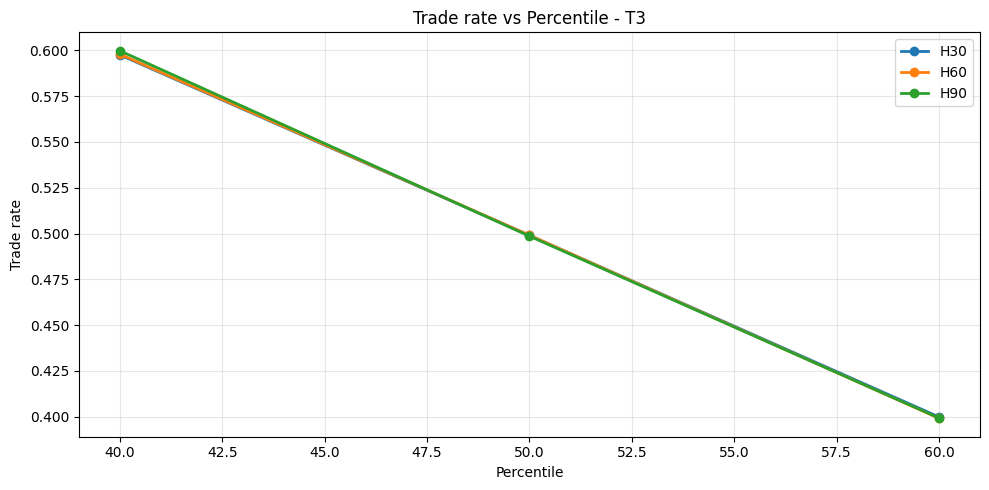

## Evolución del no-trade rate - T3

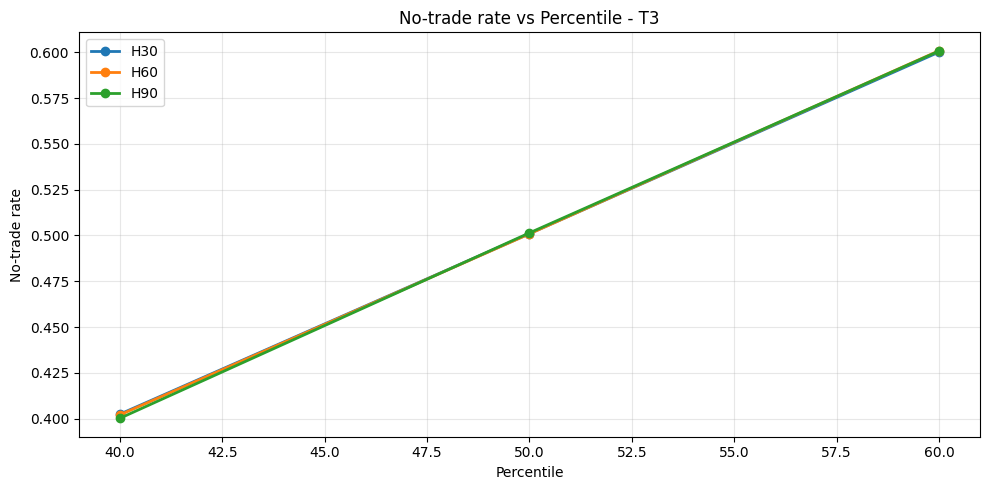

## Sensibilidad operativa - T3

,target,horizon,percentile,trade_rate,no_trade_rate
0,t3_t2_p40_h30_tp30_sl30,30,40,0.597596,0.402404
1,t3_t2_p50_h30_tp30_sl30,30,50,0.499028,0.500972
2,t3_t2_p60_h30_tp30_sl30,30,60,0.399835,0.600165
3,t3_t2_p40_h60_tp30_sl30,60,40,0.598000,0.402000
4,t3_t2_p50_h60_tp30_sl30,60,50,0.499100,0.500900
5,t3_t2_p60_h60_tp30_sl30,60,60,0.399091,0.600909
6,t3_t2_p40_h90_tp30_sl30,90,40,0.599850,0.400150
7,t3_t2_p50_h90_tp30_sl30,90,50,0.498593,0.501407
8,t3_t2_p60_h90_tp30_sl30,90,60,0.399256,0.600744


In [45]:
# =========================================================
# Evolución del trade_rate - T3
# =========================================================

import matplotlib.pyplot as plt
from IPython.display import display, Markdown

display(Markdown("## Evolución del trade rate - T3"))

fig, ax = plt.subplots(figsize=(10, 5))

for H in horizons_t3:

    temp = (
        summary_t3_frequency[
            summary_t3_frequency["horizon"] == H
        ]
        .sort_values("percentile")
    )

    ax.plot(
        temp["percentile"],
        temp["trade_rate"],
        marker="o",
        linewidth=2,
        label=f"H{H}"
    )

ax.set_title("Trade rate vs Percentile - T3")
ax.set_xlabel("Percentile")
ax.set_ylabel("Trade rate")

ax.legend()
ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

# =========================================================
# Evolución del no_trade_rate - T3
# =========================================================

display(Markdown("## Evolución del no-trade rate - T3"))

fig, ax = plt.subplots(figsize=(10, 5))

for H in horizons_t3:

    temp = (
        summary_t3_frequency[
            summary_t3_frequency["horizon"] == H
        ]
        .sort_values("percentile")
    )

    ax.plot(
        temp["percentile"],
        temp["no_trade_rate"],
        marker="o",
        linewidth=2,
        label=f"H{H}"
    )

ax.set_title("No-trade rate vs Percentile - T3")
ax.set_xlabel("Percentile")
ax.set_ylabel("No-trade rate")

ax.legend()
ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

# =========================================================
# Resumen de sensibilidad operativa
# =========================================================

display(Markdown("## Sensibilidad operativa - T3"))

sensitivity_t3 = (
    summary_t3_frequency[
        [
            "target",
            "horizon",
            "percentile",
            "trade_rate",
            "no_trade_rate",
        ]
    ]
    .sort_values(
        ["horizon", "percentile"]
    )
)

display(sensitivity_t3)


**Observaciones — 5.3.2 Sensibilidad por horizonte y percentil**



* La frecuencia operativa de T3 está completamente dominada por el percentil heredado de T2.

* Se observa una reducción prácticamente lineal del `trade_rate` al aumentar el percentil:

  * P40 → ~60% de trades válidos.
  * P50 → ~50% de trades válidos.
  * P60 → ~40% de trades válidos.

* De forma complementaria, el `no_trade_rate` aumenta de manera simétrica:

  * P40 → ~40% sin operación.
  * P50 → ~50% sin operación.
  * P60 → ~60% sin operación.

* Los tres horizontes (H30, H60 y H90) presentan curvas prácticamente idénticas. Las diferencias observadas son inferiores al 0.2%, por lo que el horizonte tiene un impacto despreciable sobre la frecuencia operativa.

* Esto confirma que la densidad de observaciones disponibles para T3 no depende del resultado del trade (TP o SL), sino únicamente de la cantidad de señales generadas previamente por T2.

* A medida que aumenta el percentil, el target se vuelve más selectivo:

  * disminuye el número de oportunidades de trading,
  * aumenta el filtrado de movimientos pequeños,
  * se reduce el tamaño efectivo del dataset de entrenamiento.

* Desde el punto de vista operativo:

  * P40 genera aproximadamente 533 mil trades válidos.
  * P50 genera aproximadamente 445 mil trades válidos.
  * P60 genera aproximadamente 356 mil trades válidos.

* Incluso en la configuración más restrictiva (P60), el volumen de observaciones continúa siendo muy elevado para entrenar modelos de machine learning, por lo que la reducción de frecuencia no representa un problema estadístico.

**Conclusión**

La sensibilidad operativa de T3 es prácticamente una réplica de la observada en T2. El percentil actúa como el único regulador relevante de la frecuencia de trading, mientras que el horizonte tiene un efecto marginal. En consecuencia, la selección entre P40, P50 y P60 representa principalmente un trade-off entre cantidad de señales disponibles y nivel de selectividad del sistema, manteniéndose un tamaño de muestra suficientemente grande en todos los casos para el desarrollo posterior de modelos predictivos sobre T3.



##### **5.3.3 Observaciones e interpretación**


La frecuencia operativa de T3 está determinada por la cantidad de señales generadas previamente por T2. Como consecuencia, los patrones observados en esta sección son consistentes con los resultados obtenidos durante el análisis de frecuencia operativa del target anterior.

El principal factor que controla la cantidad de trades válidos es el percentil utilizado para construir T2. A medida que el percentil aumenta, el sistema exige movimientos futuros cada vez más relevantes para generar una señal, reduciendo progresivamente la cantidad de oportunidades operativas disponibles.

Para los tres horizontes analizados se observa un comportamiento prácticamente idéntico:

- P40 genera aproximadamente un 60% de trades válidos.
- P50 genera aproximadamente un 50% de trades válidos.
- P60 genera aproximadamente un 40% de trades válidos.

De forma complementaria, el no_trade_rate aumenta de manera simétrica:

- P40 produce cerca de un 40% de observaciones sin operación.
- P50 produce cerca de un 50% de observaciones sin operación.
- P60 produce cerca de un 60% de observaciones sin operación.

Los gráficos muestran además que las curvas correspondientes a H30, H60 y H90 prácticamente se superponen. Las diferencias observadas son mínimas y se encuentran por debajo de unas pocas décimas porcentuales, indicando que el horizonte temporal tiene una influencia marginal sobre la frecuencia operativa del target.

Esto resulta consistente con la lógica de construcción de T3. La decisión de si existe o no un trade válido se toma previamente en T2 mediante los thresholds estadísticos, mientras que T3 únicamente evalúa el resultado posterior de dicha operación. Por lo tanto, la frecuencia operativa queda determinada casi exclusivamente por el mecanismo de filtrado aplicado en T2.

Desde una perspectiva práctica, todas las configuraciones mantienen una cantidad muy elevada de observaciones disponibles para entrenamiento:

- P40 conserva aproximadamente 533 mil trades válidos.
- P50 conserva aproximadamente 445 mil trades válidos.
- P60 conserva aproximadamente 356 mil trades válidos.

Incluso la configuración más restrictiva continúa proporcionando un volumen de datos ampliamente suficiente para entrenar modelos de machine learning, evitando problemas asociados a escasez de muestras.

Interpretación

Los resultados muestran que T3 hereda directamente la estructura operativa definida por T2. El percentil funciona como un mecanismo explícito de control de frecuencia, permitiendo regular la cantidad de oportunidades de trading que ingresan al sistema sin comprometer la disponibilidad estadística de datos.

A medida que el percentil aumenta, el target se vuelve más selectivo, reduciendo el número de operaciones potenciales y concentrándose en movimientos de mayor magnitud. Sin embargo, esta reducción de frecuencia no implica una pérdida crítica de tamaño muestral, ya que incluso las configuraciones más exigentes conservan cientos de miles de observaciones válidas.

En consecuencia, la elección entre P40, P50 y P60 no debe interpretarse como una decisión sobre disponibilidad de datos, sino como una decisión estratégica respecto al nivel de selectividad que se desea imponer sobre las oportunidades de trading que serán posteriormente evaluadas por los modelos predictivos.

### **5.4. Estabilidad Temporal**



La estabilidad temporal constituye una propiedad fundamental de cualquier target utilizado para entrenamiento de modelos predictivos.

Un target estadísticamente estable tiende a mantener una distribución de clases relativamente consistente a lo largo del tiempo, permitiendo que los patrones aprendidos durante el entrenamiento continúen siendo relevantes en períodos futuros.

En el caso de T3, resulta especialmente importante analizar si la proporción de trades exitosos y trades no exitosos permanece estable entre distintos períodos de mercado.

El objetivo de esta sección consiste en evaluar:

- estabilidad temporal de la tasa de éxito
- estabilidad temporal de la tasa de fracaso
- posibles cambios estructurales en la distribución de clases
- robustez estadística del target a lo largo del tiempo

Para ello se analizará la evolución mensual de las principales métricas de distribución para las configuraciones seleccionadas de T3.

#### **5.4.1 Distribución temporal mensual**

In [46]:
# =========================================================
# 5.4.1 Distribución temporal mensual - T3
# =========================================================

import pandas as pd
from IPython.display import display, Markdown

df_t3_time = df_t3.copy()

df_t3_time["date"] = pd.to_datetime(df_t3_time["date"])
df_t3_time["year_month"] = (
    df_t3_time["date"]
    .dt.to_period("M")
    .astype(str)
)

temporal_rows = []

for col in t3_cols:

    parts = col.split("_")

    percentile = int(parts[2].replace("p", ""))
    horizon = int(parts[3].replace("h", ""))

    monthly_stats = (
        df_t3_time
        .groupby("year_month")[col]
        .apply(
            lambda x: pd.Series({
                "class_0_ratio":
                    (x == 0).mean(),

                "class_1_ratio":
                    (x == 1).mean(),

                "valid_ratio":
                    x.notna().mean()
            })
        )
        .unstack()
        .reset_index()
    )

    monthly_stats["target"] = col
    monthly_stats["horizon"] = horizon
    monthly_stats["percentile"] = percentile

    temporal_rows.append(monthly_stats)

df_t3_temporal = pd.concat(
    temporal_rows,
    ignore_index=True
)

display(Markdown("# Distribución temporal mensual - T3"))
display(df_t3_temporal)

# Distribución temporal mensual - T3

,year_month,class_0_ratio,class_1_ratio,valid_ratio,target,horizon,percentile
0,2020-01,0.089622,0.221088,0.310710,t3_t2_p40_h30_tp30_sl30,30,40
1,2020-02,0.116279,0.349886,0.466165,t3_t2_p40_h30_tp30_sl30,30,40
2,2020-03,0.236118,0.524561,0.760679,t3_t2_p40_h30_tp30_sl30,30,40
3,2020-04,0.129734,0.474086,0.603821,t3_t2_p40_h30_tp30_sl30,30,40
4,2020-05,0.117940,0.433970,0.551910,t3_t2_p40_h30_tp30_sl30,30,40
...,...,...,...,...,...,...,...
679,2025-12,0.115317,0.249519,0.364837,t3_t2_p60_h90_tp30_sl30,90,60
680,2026-01,0.189019,0.331089,0.520108,t3_t2_p60_h90_tp30_sl30,90,60
681,2026-02,0.200385,0.356968,0.557353,t3_t2_p60_h90_tp30_sl30,90,60
682,2026-03,0.236711,0.375166,0.611877,t3_t2_p60_h90_tp30_sl30,90,60


#### **5.4.2 Resumen estadístico de estabilidad**

In [47]:
# =========================================================
# Resumen estadístico de estabilidad
# =========================================================

stability_rows = []

for col in t3_cols:

    temp = df_t3_temporal[
        df_t3_temporal["target"] == col
    ]

    stability_rows.append({
        "target": col,
        "horizon":
            temp["horizon"].iloc[0],

        "percentile":
            temp["percentile"].iloc[0],

        "mean_success_rate":
            temp["class_1_ratio"].mean(),

        "std_success_rate":
            temp["class_1_ratio"].std(),

        "mean_failure_rate":
            temp["class_0_ratio"].mean(),

        "std_failure_rate":
            temp["class_0_ratio"].std(),

        "mean_trade_rate":
            temp["valid_ratio"].mean(),

        "std_trade_rate":
            temp["valid_ratio"].std(),
    })

df_t3_stability = pd.DataFrame(
    stability_rows
)

display(Markdown(
    "# Resumen estadístico de estabilidad temporal - T3"
))
display(df_t3_stability)

# Resumen estadístico de estabilidad temporal - T3

,target,horizon,percentile,mean_success_rate,std_success_rate,mean_failure_rate,std_failure_rate,mean_trade_rate,std_trade_rate
0,t3_t2_p40_h30_tp30_sl30,30,40,0.443711,0.058381,0.156068,0.042773,0.599779,0.096289
1,t3_t2_p50_h30_tp30_sl30,30,50,0.390028,0.057246,0.111427,0.049466,0.501455,0.103142
2,t3_t2_p60_h30_tp30_sl30,30,60,0.317716,0.059210,0.084559,0.047076,0.402275,0.103675
3,t3_t2_p40_h60_tp30_sl30,60,40,0.435473,0.041772,0.164586,0.060171,0.600059,0.097598
4,t3_t2_p50_h60_tp30_sl30,60,50,0.364283,0.051108,0.137150,0.057523,0.501433,0.105649
5,t3_t2_p60_h60_tp30_sl30,60,60,0.291297,0.055833,0.110040,0.051901,0.401338,0.105691
6,t3_t2_p40_h90_tp30_sl30,90,40,0.416898,0.043099,0.184850,0.062753,0.601748,0.102376
7,t3_t2_p50_h90_tp30_sl30,90,50,0.347255,0.053833,0.153390,0.059433,0.500645,0.110880
8,t3_t2_p60_h90_tp30_sl30,90,60,0.278618,0.059720,0.122717,0.054461,0.401335,0.112453


#### **5.4.3 Evolución temporal de la tasa de éxito**

# Evolución temporal de success rate - T3

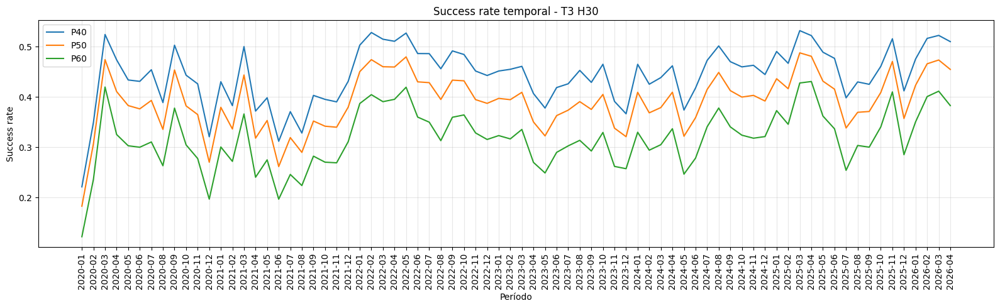

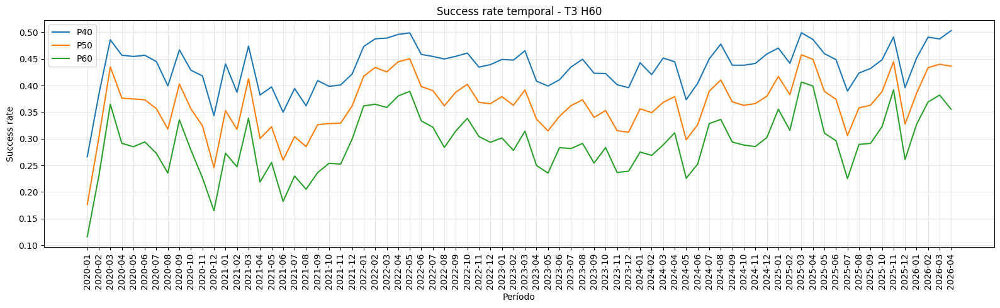

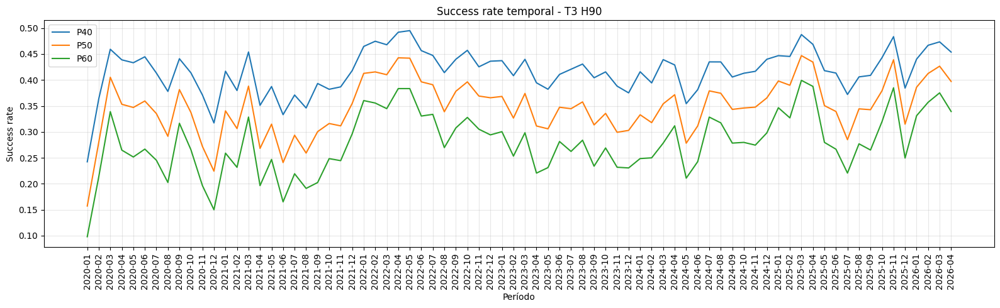

In [48]:
# =========================================================
# Evolución temporal de success rate
# =========================================================

import matplotlib.pyplot as plt

display(Markdown(
    "# Evolución temporal de success rate - T3"
))

selected_percentiles = [40, 50, 60]

for H in horizons_t3:

    fig, ax = plt.subplots(
        figsize=(16, 5)
    )

    for p in selected_percentiles:

        target = (
            f"t3_t2_p{p}_h{H}_tp30_sl30"
        )

        temp = df_t3_temporal[
            df_t3_temporal["target"] == target
        ]

        ax.plot(
            temp["year_month"],
            temp["class_1_ratio"],
            label=f"P{p}"
        )

    ax.set_title(
        f"Success rate temporal - T3 H{H}"
    )

    ax.set_xlabel("Período")
    ax.set_ylabel("Success rate")

    ax.tick_params(
        axis="x",
        rotation=90
    )

    ax.legend()
    ax.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

#### **5.4.4 Evolución temporal de frecuencia operativa**

# Evolución temporal de trade rate - T3

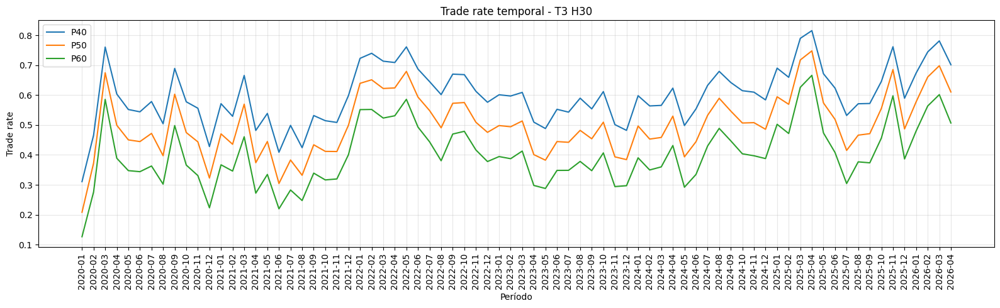

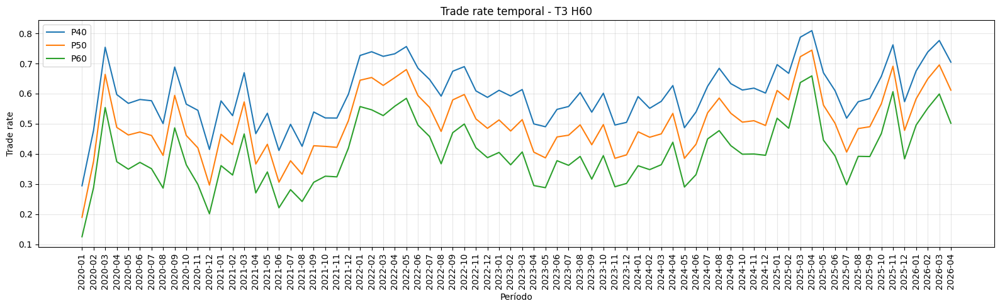

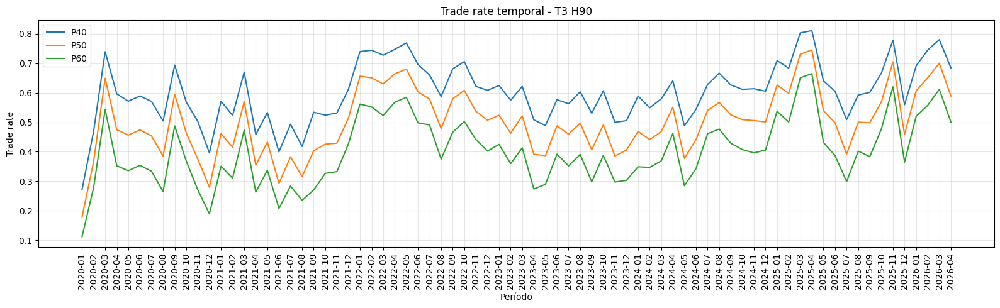

In [49]:
# =========================================================
# Evolución temporal de trade rate
# =========================================================

display(Markdown(
    "# Evolución temporal de trade rate - T3"
))

for H in horizons_t3:

    fig, ax = plt.subplots(
        figsize=(16, 5)
    )

    for p in selected_percentiles:

        target = (
            f"t3_t2_p{p}_h{H}_tp30_sl30"
        )

        temp = df_t3_temporal[
            df_t3_temporal["target"] == target
        ]

        ax.plot(
            temp["year_month"],
            temp["valid_ratio"],
            label=f"P{p}"
        )

    ax.set_title(
        f"Trade rate temporal - T3 H{H}"
    )

    ax.set_xlabel("Período")
    ax.set_ylabel("Trade rate")

    ax.tick_params(
        axis="x",
        rotation=90
    )

    ax.legend()
    ax.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

#### **Observaciones**



La estabilidad temporal de T3 muestra un comportamiento consistente a lo largo de todo el período analizado, aunque con variaciones cíclicas asociadas a cambios en las condiciones del mercado.

La primera observación relevante es que las curvas de success rate presentan una estructura temporal muy similar para todas las configuraciones. Los períodos donde aumenta la tasa de éxito son prácticamente los mismos para H30, H60 y H90, lo que sugiere que los cambios observados están más relacionados con el régimen de mercado que con la parametrización específica del target.

En términos generales, el success rate se mantiene dentro de rangos relativamente acotados durante todo el histórico:

- H30 presenta los mayores niveles de éxito.
- H60 ocupa una posición intermedia.
- H90 presenta los menores niveles de éxito.

Esta relación es consistente con los resultados observados previamente durante la construcción y validación de T3, donde los horizontes más cortos mostraban mayores probabilidades de alcanzar el take profit antes que el stop loss.

Los desvíos estándar del success rate permanecen moderados:

- H30: aproximadamente 0.057–0.059.
- H60: aproximadamente 0.042–0.056.
- H90: aproximadamente 0.043–0.060.

Estos valores indican que, aunque existen fluctuaciones temporales, no se observan cambios estructurales bruscos ni períodos donde el comportamiento del target se vuelva radicalmente diferente.

Respecto al trade rate, se observa una dinámica prácticamente idéntica a la encontrada previamente en T2. Los períodos donde aumenta la frecuencia operativa coinciden entre todos los horizontes y percentiles, confirmando nuevamente que T3 hereda gran parte de su estructura operativa del target T2.

Las diferencias entre percentiles se mantienen estables durante todo el período:

- P40 conserva aproximadamente un 60% de trades válidos.
- P50 conserva aproximadamente un 50% de trades válidos.
- P60 conserva aproximadamente un 40% de trades válidos.

La separación entre las curvas permanece prácticamente constante en todo el histórico, lo que indica que la selectividad introducida mediante los thresholds de T2 se mantiene estable a lo largo del tiempo.

**Interpretación**

Los resultados muestran que T3 posee una estabilidad temporal adecuada para el desarrollo de modelos predictivos.

Si bien existen variaciones asociadas a diferentes condiciones de mercado, estas fluctuaciones aparecen de forma gradual y consistente entre todas las configuraciones analizadas. No se observan cambios abruptos de distribución ni períodos prolongados donde el target altere significativamente su comportamiento estadístico.

La evolución temporal del success rate sugiere que la calidad de las oportunidades de trading varía con el contexto de mercado, pero lo hace dentro de rangos relativamente controlados. Esto constituye una característica esperable en un sistema financiero real y no representa una fuente evidente de inestabilidad.

Por otra parte, la frecuencia operativa mantiene una estructura muy estable a lo largo del tiempo, reforzando la idea de que el mecanismo de filtrado definido en T2 produce targets consistentes y reproducibles.

En conjunto, la evidencia obtenida indica que T3 presenta una estabilidad temporal suficiente para continuar con el análisis estadístico y el posterior entrenamiento de modelos de machine learning, sin señales de degradación estructural ni cambios de régimen que comprometan su utilidad predictiva.

### **5.5. Sensibilidad paramétrica - T3**


La construcción de T3 depende directamente de los parámetros utilizados para generar las señales operativas heredadas de T2.

Como consecuencia, resulta necesario analizar cómo distintas combinaciones de horizonte y percentil afectan las propiedades estadísticas del target resultante.

El objetivo de esta sección consiste en evaluar la sensibilidad de T3 frente a cambios en sus parámetros de construcción, estudiando especialmente:

- frecuencia operativa
- tasa de éxito
- tasa de fracaso
- balance entre clases
- robustez estadística del target

Un target robusto debería conservar comportamientos consistentes ante modificaciones moderadas de sus parámetros, evitando cambios abruptos en su estructura estadística.

#### **5.5.1 Resumen paramétrico**

In [50]:
# =========================================================
# 5.5.1 Resumen paramétrico - T3
# =========================================================

from IPython.display import display, Markdown

df_t3_sensitivity = (
    df_t3_class_distribution[
        [
            "target",
            "horizon",
            "percentile",
            "class_0_ratio",
            "class_1_ratio",
            "balance_gap",
        ]
    ]
    .merge(
        summary_t3_frequency[
            [
                "target",
                "trade_rate",
                "no_trade_rate",
            ]
        ],
        on="target",
        how="left"
    )
)

display(Markdown(
    "# Resumen de sensibilidad paramétrica - T3"
))
display(df_t3_sensitivity)

# Resumen de sensibilidad paramétrica - T3

,target,horizon,percentile,class_0_ratio,class_1_ratio,balance_gap,trade_rate,no_trade_rate
0,t3_t2_p40_h30_tp30_sl30,30,40,0.259464,0.740536,0.481073,0.597596,0.402404
1,t3_t2_p50_h30_tp30_sl30,30,50,0.220882,0.779118,0.558236,0.499028,0.500972
2,t3_t2_p60_h30_tp30_sl30,30,60,0.208665,0.791335,0.582670,0.399835,0.600165
3,t3_t2_p40_h60_tp30_sl30,60,40,0.273349,0.726651,0.453301,0.598000,0.402000
4,t3_t2_p50_h60_tp30_sl30,60,50,0.272511,0.727489,0.454979,0.499100,0.500900
5,t3_t2_p60_h60_tp30_sl30,60,60,0.273056,0.726944,0.453889,0.399091,0.600909
6,t3_t2_p40_h90_tp30_sl30,90,40,0.306247,0.693753,0.387507,0.599850,0.400150
7,t3_t2_p50_h90_tp30_sl30,90,50,0.305410,0.694590,0.389179,0.498593,0.501407
8,t3_t2_p60_h90_tp30_sl30,90,60,0.304614,0.695386,0.390773,0.399256,0.600744


#### **5.5.2 Heatmap de success rate**

# Heatmap success rate - T3

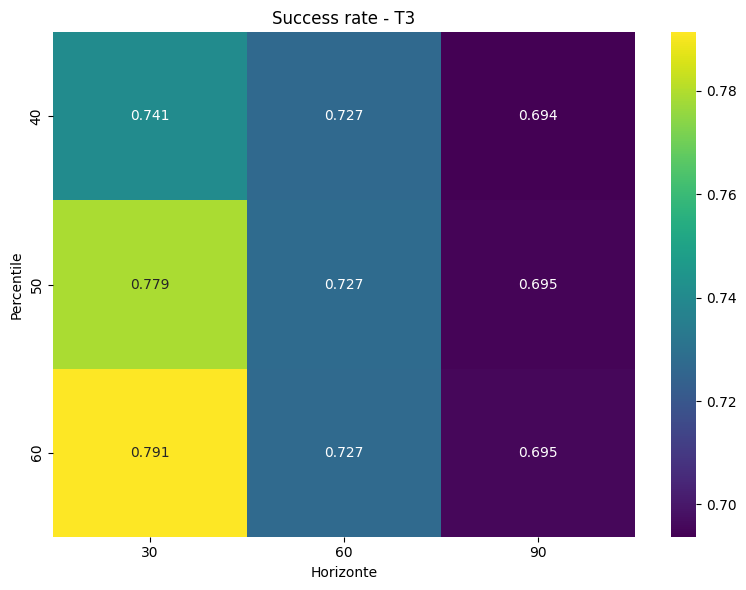

In [51]:
# =========================================================
# Heatmap success rate
# =========================================================

import seaborn as sns
import matplotlib.pyplot as plt

heat_success = (
    df_t3_sensitivity
    .pivot(
        index="percentile",
        columns="horizon",
        values="class_1_ratio"
    )
)

display(Markdown(
    "# Heatmap success rate - T3"
))

plt.figure(figsize=(8,6))

sns.heatmap(
    heat_success,
    annot=True,
    fmt=".3f",
    cmap="viridis"
)

plt.title("Success rate - T3")
plt.xlabel("Horizonte")
plt.ylabel("Percentile")

plt.tight_layout()
plt.show()

#### **5.5.3 Heatmap de balance de clases**

# Heatmap balance de clases - T3

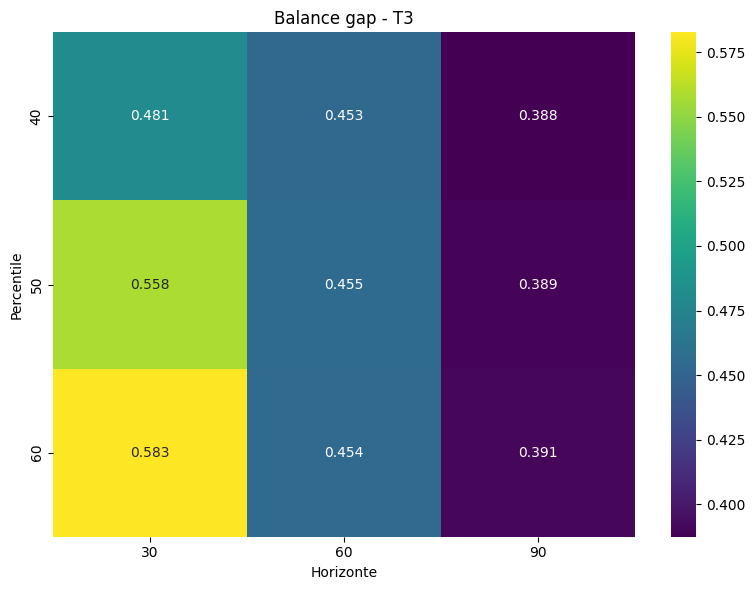

In [52]:
# =========================================================
# Heatmap balance gap
# =========================================================

heat_balance = (
    df_t3_sensitivity
    .pivot(
        index="percentile",
        columns="horizon",
        values="balance_gap"
    )
)

display(Markdown(
    "# Heatmap balance de clases - T3"
))

plt.figure(figsize=(8,6))

sns.heatmap(
    heat_balance,
    annot=True,
    fmt=".3f",
    cmap="viridis"
)

plt.title("Balance gap - T3")
plt.xlabel("Horizonte")
plt.ylabel("Percentile")

plt.tight_layout()
plt.show()

#### **5.5.4 Evolución del success rate**

# Evolución paramétrica del success rate - T3

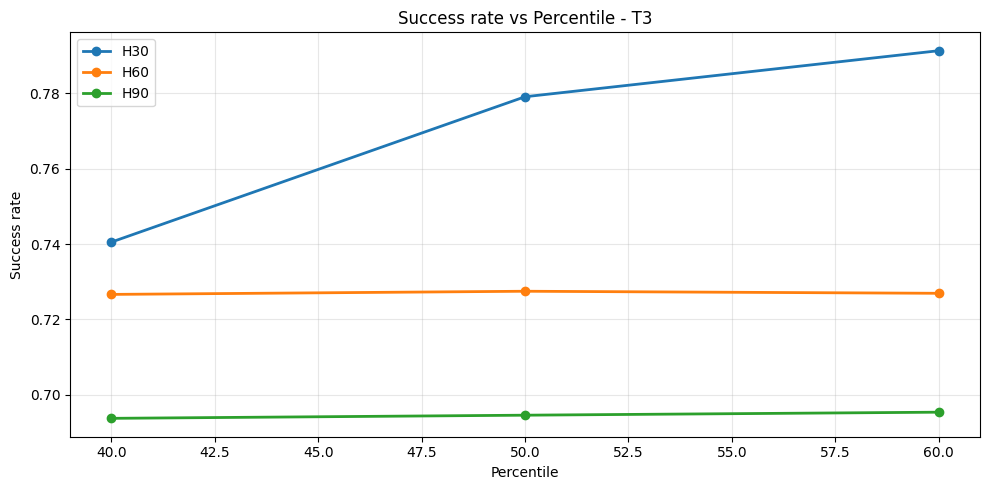

In [53]:
# =========================================================
# Success rate vs percentile
# =========================================================

display(Markdown(
    "# Evolución paramétrica del success rate - T3"
))

fig, ax = plt.subplots(figsize=(10,5))

for H in horizons_t3:

    temp = (
        df_t3_sensitivity[
            df_t3_sensitivity["horizon"] == H
        ]
        .sort_values("percentile")
    )

    ax.plot(
        temp["percentile"],
        temp["class_1_ratio"],
        marker="o",
        linewidth=2,
        label=f"H{H}"
    )

ax.set_title("Success rate vs Percentile - T3")
ax.set_xlabel("Percentile")
ax.set_ylabel("Success rate")

ax.legend()
ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

#### **5.5.5 Evolución del balance de clases**

# Evolución paramétrica del balance de clases - T3

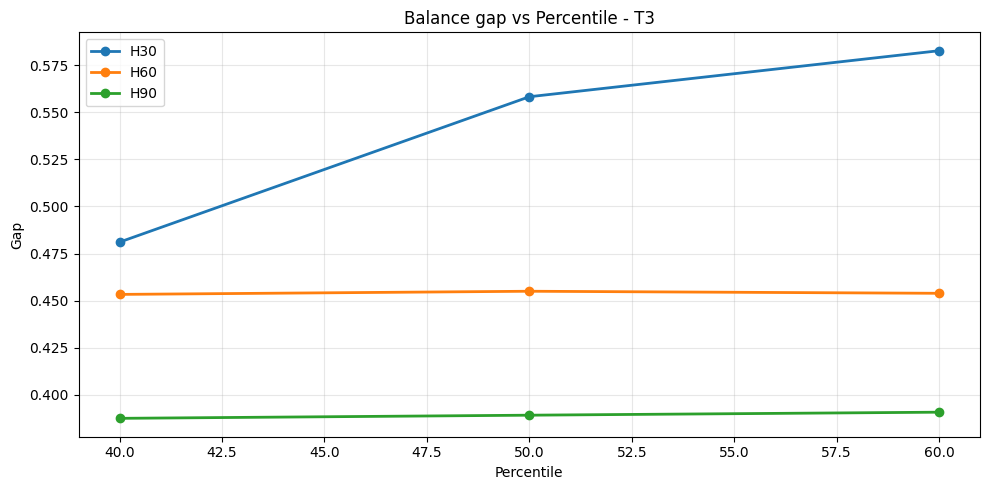

In [54]:
# =========================================================
# Balance gap vs percentile
# =========================================================

display(Markdown(
    "# Evolución paramétrica del balance de clases - T3"
))

fig, ax = plt.subplots(figsize=(10,5))

for H in horizons_t3:

    temp = (
        df_t3_sensitivity[
            df_t3_sensitivity["horizon"] == H
        ]
        .sort_values("percentile")
    )

    ax.plot(
        temp["percentile"],
        temp["balance_gap"],
        marker="o",
        linewidth=2,
        label=f"H{H}"
    )

ax.set_title("Balance gap vs Percentile - T3")
ax.set_xlabel("Percentile")
ax.set_ylabel("Gap")

ax.legend()
ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

#### **5.5.6 Observaciones — 5.5 Sensibilidad paramétrica de T3**

Los resultados muestran que T3 presenta una sensibilidad paramétrica muy distinta a la observada en T2. Mientras que en T2 el comportamiento estaba dominado principalmente por la frecuencia operativa, en T3 aparece un compromiso directo entre cantidad de trades disponibles y probabilidad de éxito de dichos trades.

**Efecto del percentil**

El percentil es el parámetro que genera el mayor impacto sobre la estructura del target.

Al aumentar el percentil desde P40 hasta P60:

* la frecuencia operativa disminuye desde aproximadamente 60% hasta 40%;
* el número de trades válidos se reduce significativamente;
* la tasa de éxito aumenta de forma consistente.

Este comportamiento es especialmente visible en H30:

| Configuración | Success Rate |
| ------------- | ------------ |
| P40           | 74.1%        |
| P50           | 77.9%        |
| P60           | 79.1%        |

Esto indica que los percentiles más altos seleccionan únicamente los movimientos más extremos del mercado, eliminando señales marginales y reteniendo operaciones con mayor probabilidad de alcanzar el TP antes que el SL.

---

**Efecto del horizonte**

El horizonte produce un efecto inverso al observado en T2.

A medida que el horizonte aumenta:

* la tasa de éxito disminuye;
* la proporción de operaciones fallidas aumenta;
* el balance de clases se vuelve menos extremo.

Los valores medios observados son:

| Horizonte | Success Rate aproximado |
| --------- | ----------------------- |
| H30       | 74%–79%                 |
| H60       | 72.7%                   |
| H90       | 69.4%–69.5%             |

Esto sugiere que las señales identificadas por T2 pierden parte de su ventaja estadística cuando se permite un horizonte temporal más amplio para que el precio evolucione.

---

**Balance de clases**

El desbalance de clases depende simultáneamente del horizonte y del percentil.

Para H30:

* el success rate aumenta al incrementar el percentil;
* el balance gap crece desde 0.48 hasta 0.58;
* el dataset se vuelve cada vez más dominado por trades exitosos.

Para H60:

* el balance gap permanece prácticamente constante alrededor de 0.45.

Para H90:

* el balance gap es el menor de todos los escenarios (~0.39);
* las clases son relativamente más equilibradas.

Desde la perspectiva de Machine Learning, H90 genera datasets más balanceados, mientras que H30 genera datasets con mayor tasa de éxito pero más desbalanceados.

---

**Robustez paramétrica**

Los heatmaps muestran que la transición entre configuraciones es suave y ordenada.

No aparecen:

* saltos bruscos,
* cambios de régimen inesperados,
* comportamientos erráticos.

La evolución del success rate y del balance gap sigue patrones monotónicos y coherentes con la lógica económica del target.

Esto constituye una señal positiva de robustez metodológica, ya que pequeñas modificaciones de los parámetros producen cambios graduales y explicables en las propiedades estadísticas de T3.

---

**Conclusión**

La sensibilidad paramétrica de T3 revela un trade-off muy claro entre frecuencia operativa y calidad de las operaciones.

* Percentiles más altos reducen la cantidad de trades disponibles pero aumentan la probabilidad de éxito.
* Horizontes más cortos generan mayores tasas de éxito, aunque también producen datasets más desbalanceados.
* Horizontes más largos reducen la tasa de éxito, pero mejoran el balance entre clases.

En conjunto, las configuraciones basadas en **H30-P50** y **H30-P60** aparecen como las alternativas más atractivas desde el punto de vista operativo, mientras que **H90** ofrece targets estadísticamente más balanceados para el entrenamiento de modelos predictivos.


### **5.6. Análisis por régimen intradiario**


Además del análisis global realizado sobre T3, resulta relevante estudiar cómo varía la calidad de las operaciones según los distintos regímenes intradiarios representados por la variable `regime_id`.

La dinámica del mercado cambia a lo largo de la sesión debido a diferencias en liquidez, volatilidad, participación institucional y flujo de órdenes. Como consecuencia, una misma señal operativa puede presentar probabilidades de éxito significativamente distintas dependiendo del momento del día en que se genera.

Dado que T3 mide directamente el resultado operativo de una señal mediante la clasificación entre trades exitosos y no exitosos, el análisis por régimen permite identificar en qué contextos intradiarios las oportunidades generadas por T2 presentan mayor calidad estadística.

El objetivo de esta sección consiste en evaluar si T3 presenta diferencias relevantes entre regímenes intradiarios en términos de:

* frecuencia de trades válidos
* success rate
* proporción de trades fallidos
* balance de clases
* estabilidad operativa
* comportamiento estadístico de las señales

Este análisis permitirá determinar si existen ventanas intradiarias donde las señales poseen una ventaja operativa superior y, en consecuencia, si la variable `regime_id` puede constituir un factor relevante para futuros modelos predictivos basados en T3.


**5.6.3. Success rate por régimen**

* success_rate
* failure_rate

**5.6.4. Comparación entre horizontes y percentiles**

* heatmaps
* ranking de regímenes

**5.6.5. Observaciones e interpretación**

Para T3, el punto más importante pasa a ser el **Success Rate por régimen**, porque es donde realmente aparecerá la información operativa útil. En T2 nos interesaba principalmente la frecuencia de señales; en T3 nos interesa descubrir **en qué régimen los trades funcionan mejor**.


#### **5.6.1. Distribución de clases por régimen**

La distribución global de T3 permite evaluar la proporción total de trades exitosos y no exitosos. Sin embargo, esta visión agregada puede ocultar diferencias relevantes entre distintos momentos de la sesión.

Dado que la volatilidad, la liquidez y la estructura del flujo de órdenes cambian a lo largo del día, resulta razonable esperar que la probabilidad de éxito de una señal también dependa del régimen intradiario donde se genera.

El objetivo de esta sección consiste en analizar cómo se distribuyen las clases de T3 dentro de cada régimen operativo, evaluando:

- proporción de trades exitosos
- proporción de trades no exitosos
- balance de clases
- diferencias de comportamiento entre regímenes

Este análisis permitirá identificar si existen ventanas intradiarias donde las señales generadas por T2 presentan una calidad operativa superior.

## Distribución de clases por régimen - T3

,regime_id,target,horizon,percentile,tp_pts,sl_pts,valid_trades,class_0_ratio,class_1_ratio,balance_gap
0,0,t3_t2_p40_h30_tp30_sl30,30,40,30,30,103374,0.263674,0.736326,0.472653
1,1,t3_t2_p40_h30_tp30_sl30,30,40,30,30,53197,0.159614,0.840386,0.680771
2,2,t3_t2_p40_h30_tp30_sl30,30,40,30,30,66122,0.346390,0.653610,0.307220
3,3,t3_t2_p40_h30_tp30_sl30,30,40,30,30,281048,0.259034,0.740966,0.481932
4,4,t3_t2_p40_h30_tp30_sl30,30,40,30,30,29359,0.233898,0.766102,0.532205
5,0,t3_t2_p50_h30_tp30_sl30,30,50,30,30,79883,0.184708,0.815292,0.630585
6,1,t3_t2_p50_h30_tp30_sl30,30,50,30,30,45732,0.126323,0.873677,0.747354
7,2,t3_t2_p50_h30_tp30_sl30,30,50,30,30,58731,0.336126,0.663874,0.327749
8,3,t3_t2_p50_h30_tp30_sl30,30,50,30,30,235948,0.225109,0.774891,0.549782
9,4,t3_t2_p50_h30_tp30_sl30,30,50,30,30,24876,0.198706,0.801294,0.602589


## Resumen compacto por régimen - T3

,regime_id,target,horizon,percentile,valid_trades,class_0_ratio,class_1_ratio,balance_gap
0,0,t3_t2_p40_h30_tp30_sl30,30,40,103374,0.263674,0.736326,0.472653
1,1,t3_t2_p40_h30_tp30_sl30,30,40,53197,0.159614,0.840386,0.680771
2,2,t3_t2_p40_h30_tp30_sl30,30,40,66122,0.346390,0.653610,0.307220
3,3,t3_t2_p40_h30_tp30_sl30,30,40,281048,0.259034,0.740966,0.481932
4,4,t3_t2_p40_h30_tp30_sl30,30,40,29359,0.233898,0.766102,0.532205
5,0,t3_t2_p50_h30_tp30_sl30,30,50,79883,0.184708,0.815292,0.630585
6,1,t3_t2_p50_h30_tp30_sl30,30,50,45732,0.126323,0.873677,0.747354
7,2,t3_t2_p50_h30_tp30_sl30,30,50,58731,0.336126,0.663874,0.327749
8,3,t3_t2_p50_h30_tp30_sl30,30,50,235948,0.225109,0.774891,0.549782
9,4,t3_t2_p50_h30_tp30_sl30,30,50,24876,0.198706,0.801294,0.602589


## Distribución de clases por régimen - T3

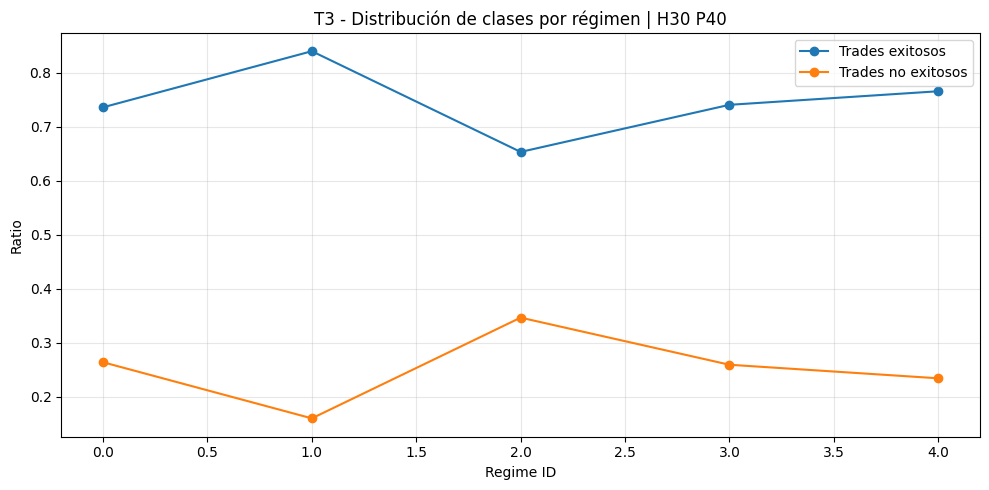

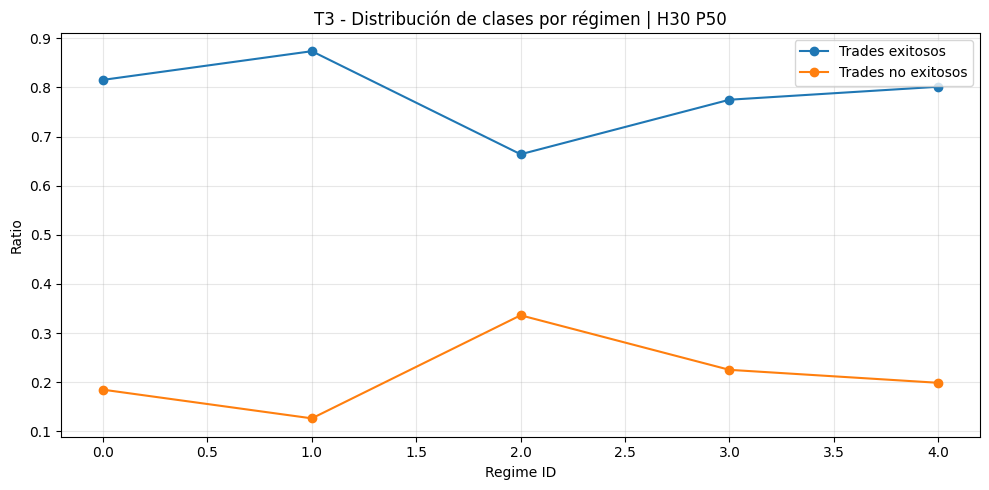

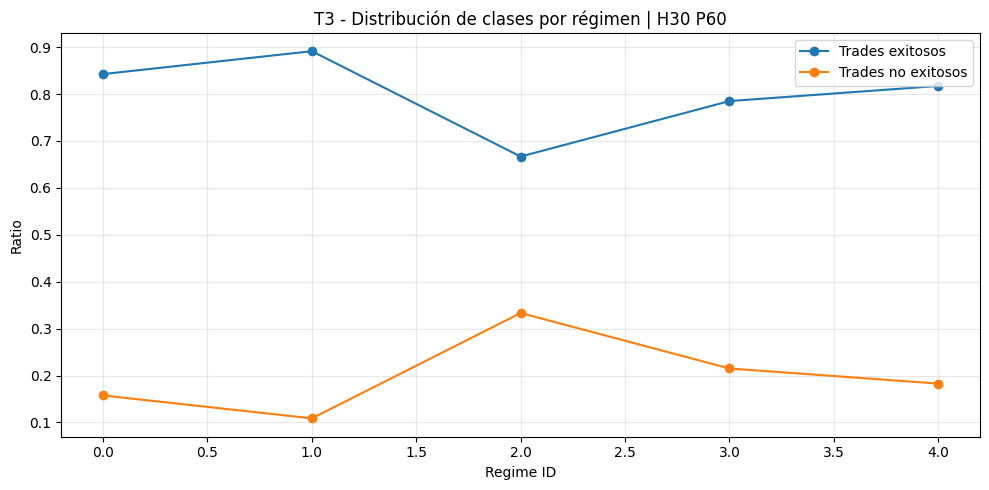

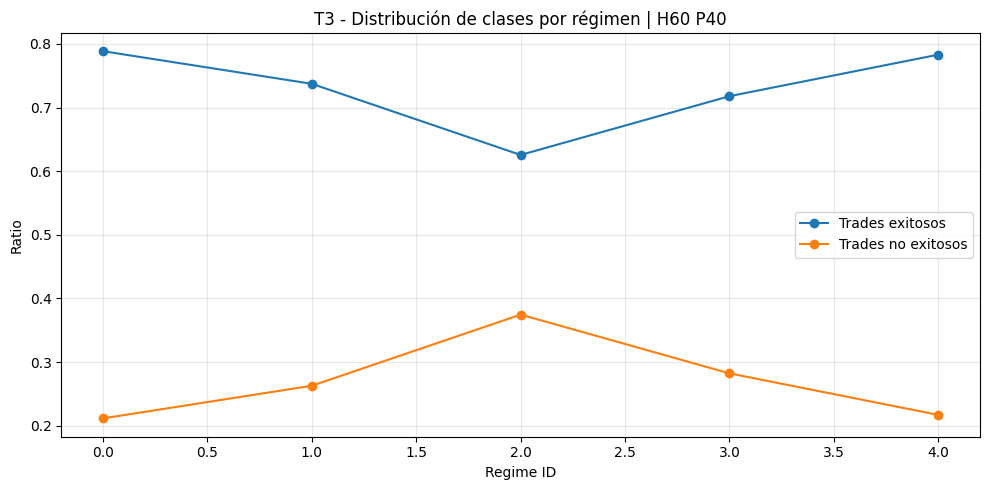

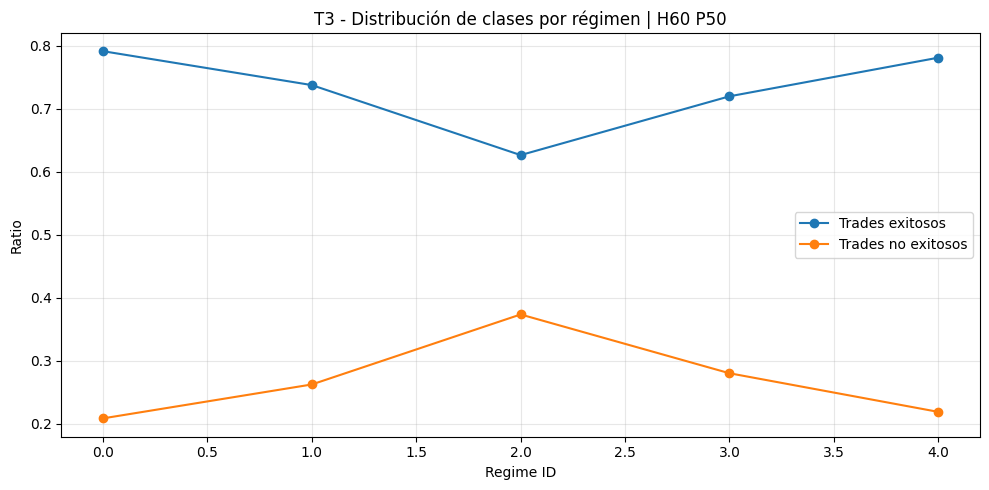

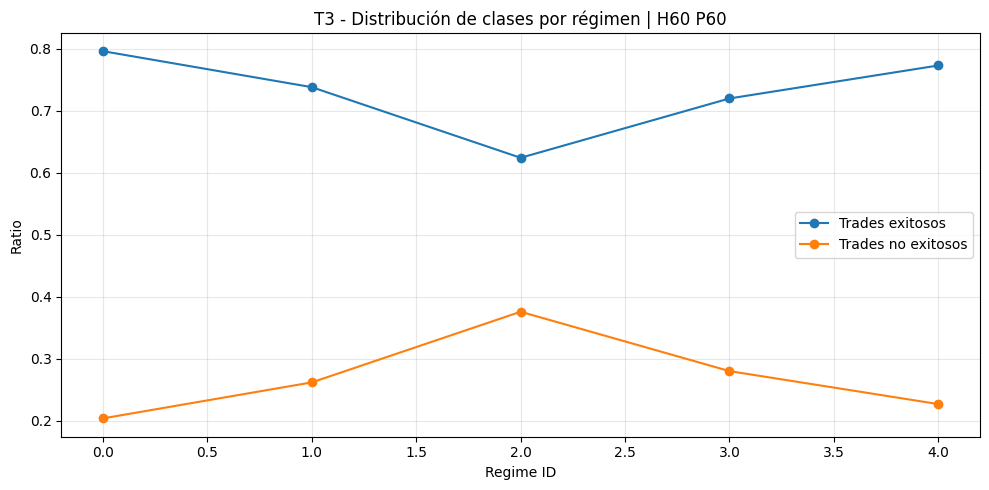

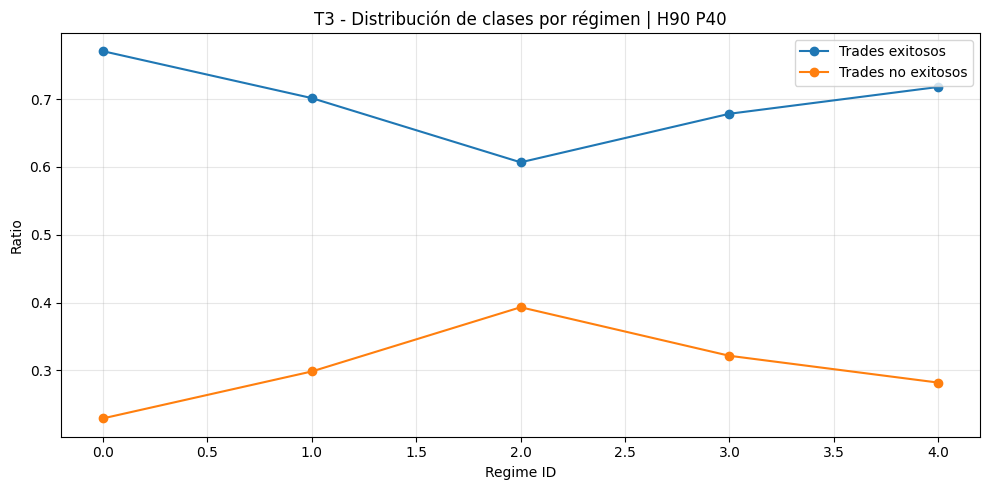

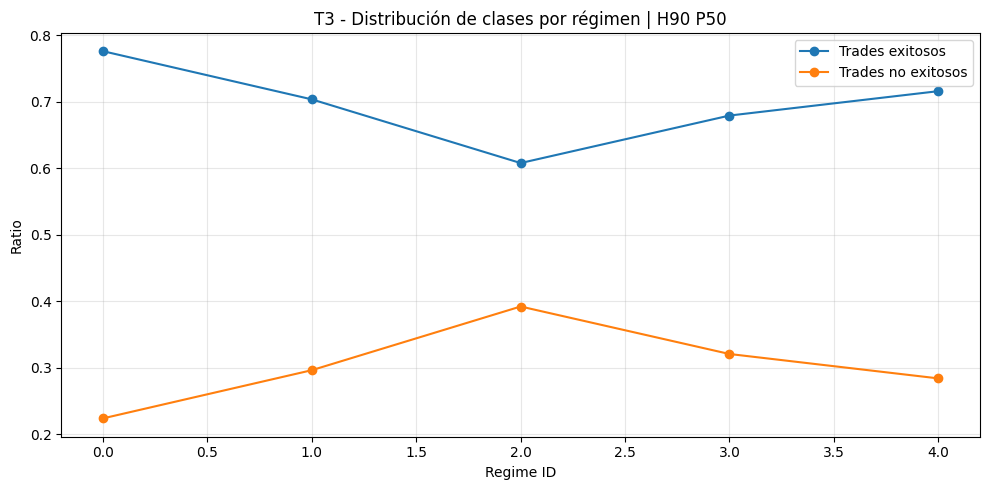

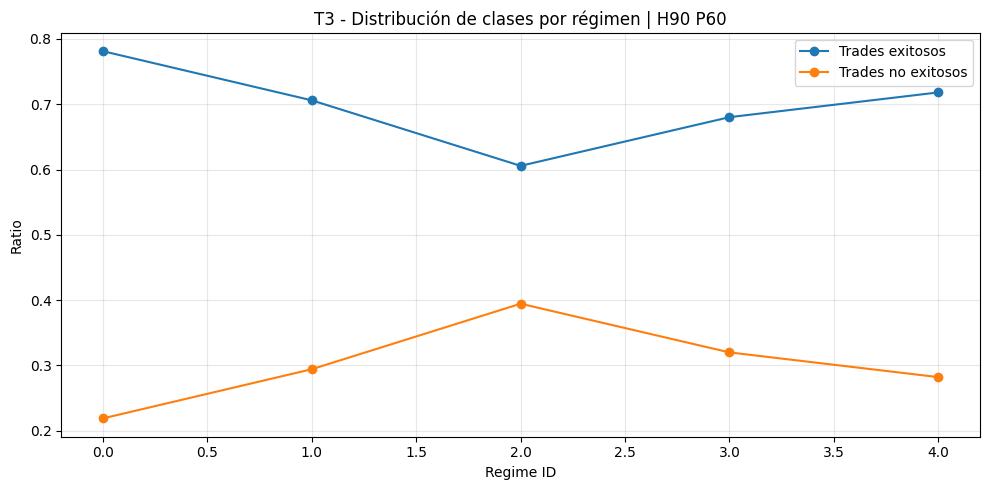

## Balance de clases por régimen - T3

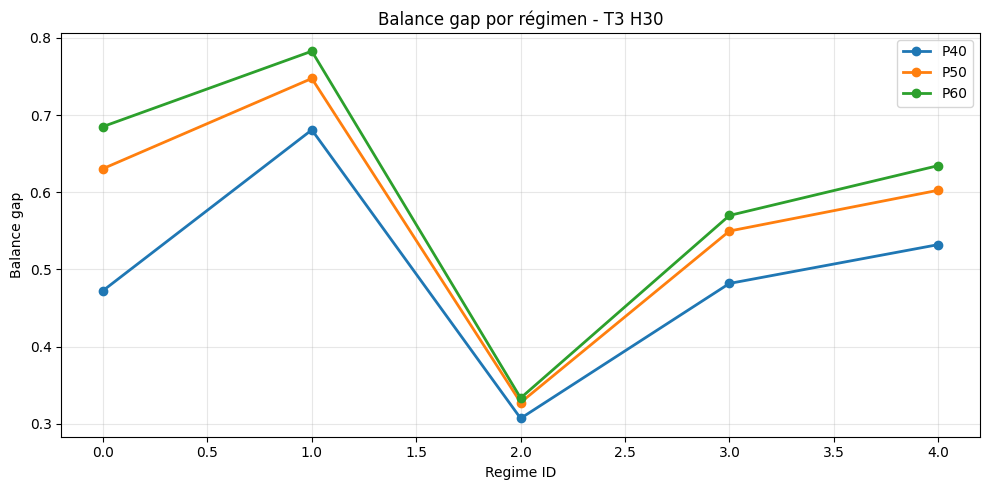

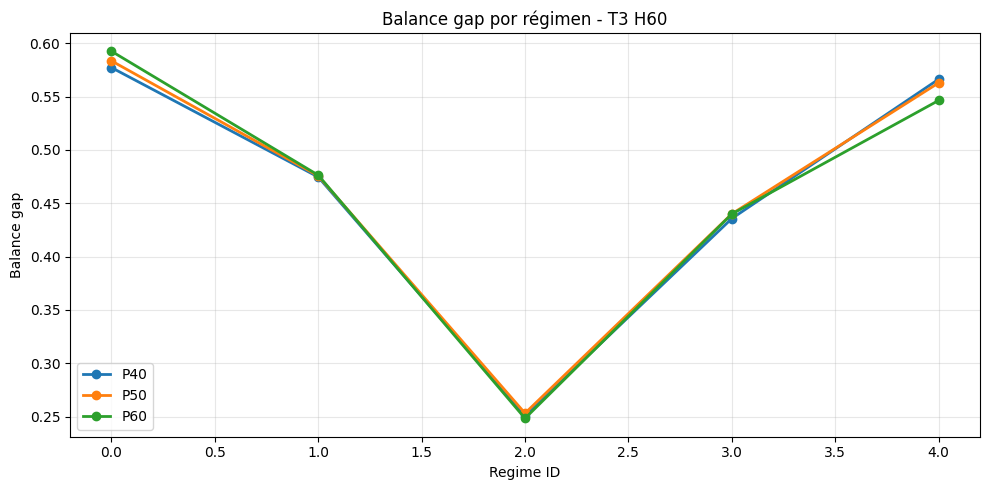

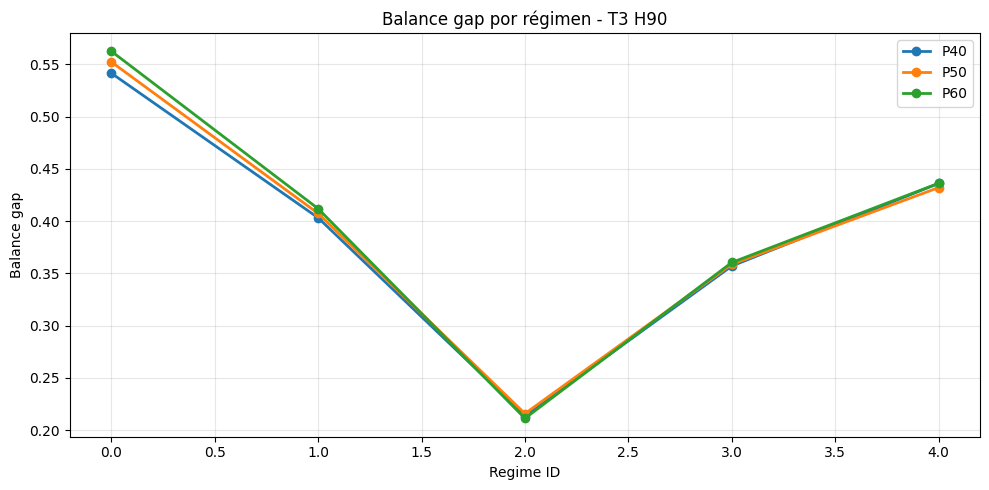

In [55]:
# =========================================================
# 5.6.1 Distribución de clases por régimen - T3
# =========================================================

import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

# =========================================================
# Construcción de tabla por régimen
# =========================================================

t3_regime_distribution_rows = []

for col in t3_cols:

    # Extraer metadata desde nombre:
    # t3_t2_p40_h30_tp30_sl30
    parts = col.split("_")

    percentile = int(parts[2][1:])  # p40 -> 40
    horizon = int(parts[3][1:])     # h30 -> 30
    tp_pts = int(parts[4][2:])      # tp30 -> 30
    sl_pts = int(parts[5][2:])      # sl30 -> 30

    for regime in sorted(df_t3["regime_id"].dropna().unique()):

        temp = df_t3[df_t3["regime_id"] == regime][col]
        valid_data = temp.dropna()

        valid_trades = len(valid_data)

        if valid_trades > 0:
            class_0_ratio = (valid_data == 0).mean()
            class_1_ratio = (valid_data == 1).mean()
        else:
            class_0_ratio = 0
            class_1_ratio = 0

        balance_gap = abs(class_1_ratio - class_0_ratio)

        t3_regime_distribution_rows.append({
            "regime_id": regime,
            "target": col,
            "horizon": horizon,
            "percentile": percentile,
            "tp_pts": tp_pts,
            "sl_pts": sl_pts,
            "valid_trades": valid_trades,
            "class_0_ratio": class_0_ratio,
            "class_1_ratio": class_1_ratio,
            "balance_gap": balance_gap,
        })

df_t3_regime_distribution = pd.DataFrame(
    t3_regime_distribution_rows
)

display(Markdown("## Distribución de clases por régimen - T3"))
display(df_t3_regime_distribution)

# =========================================================
# Resumen compacto
# =========================================================

summary_t3_regime_distribution = df_t3_regime_distribution[
    [
        "regime_id",
        "target",
        "horizon",
        "percentile",
        "valid_trades",
        "class_0_ratio",
        "class_1_ratio",
        "balance_gap",
    ]
]

display(Markdown("## Resumen compacto por régimen - T3"))
display(summary_t3_regime_distribution)

# =========================================================
# Gráfico: Distribución de clases por régimen
# =========================================================

display(Markdown("## Distribución de clases por régimen - T3"))

selected_percentiles = [40, 50, 60]

for H in horizons_t3:

    for p in selected_percentiles:

        temp = (
            summary_t3_regime_distribution[
                (summary_t3_regime_distribution["horizon"] == H) &
                (summary_t3_regime_distribution["percentile"] == p)
            ]
            .sort_values("regime_id")
        )

        fig, ax = plt.subplots(figsize=(10, 5))

        ax.plot(
            temp["regime_id"],
            temp["class_1_ratio"],
            marker="o",
            label="Trades exitosos"
        )

        ax.plot(
            temp["regime_id"],
            temp["class_0_ratio"],
            marker="o",
            label="Trades no exitosos"
        )

        ax.set_title(f"T3 - Distribución de clases por régimen | H{H} P{p}")
        ax.set_xlabel("Regime ID")
        ax.set_ylabel("Ratio")

        ax.legend()
        ax.grid(alpha=0.3)

        plt.tight_layout()
        plt.show()

# =========================================================
# Gráfico: Balance gap por régimen
# =========================================================

display(Markdown("## Balance de clases por régimen - T3"))

for H in horizons_t3:

    fig, ax = plt.subplots(figsize=(10, 5))

    for p in selected_percentiles:

        temp = (
            summary_t3_regime_distribution[
                (summary_t3_regime_distribution["horizon"] == H) &
                (summary_t3_regime_distribution["percentile"] == p)
            ]
            .sort_values("regime_id")
        )

        ax.plot(
            temp["regime_id"],
            temp["balance_gap"],
            marker="o",
            linewidth=2,
            label=f"P{p}"
        )

    ax.set_title(f"Balance gap por régimen - T3 H{H}")
    ax.set_xlabel("Regime ID")
    ax.set_ylabel("Balance gap")

    ax.legend()
    ax.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

**Observaciones rápidas – 5.6.1 Distribución de clases por régimen (T3)**

* Todos los regímenes presentan predominio de trades exitosos (clase 1), lo que confirma que T3 mantiene una tasa de éxito elevada independientemente del momento del día.

* El **régimen 2** es sistemáticamente el menos favorable para T3. En prácticamente todas las configuraciones muestra los menores ratios de éxito (entre 60% y 67%) y los menores balance gaps.

* Para **H30**, el **régimen 1** destaca claramente como el mejor entorno operativo, alcanzando ratios de éxito cercanos al 85%-89% cuando aumenta el percentil.

* Los **regímenes 0, 3 y 4** presentan comportamientos relativamente similares, con tasas de éxito elevadas y bastante estables entre configuraciones.

* A medida que aumenta el percentil (P40 → P60) en H30, la calidad de los trades mejora especialmente en los regímenes 0, 1, 3 y 4. Esto sugiere que filtrar señales más fuertes aumenta la probabilidad de éxito.

* En horizontes más largos (H60 y H90), las diferencias entre percentiles se vuelven mucho menores. Las curvas prácticamente se superponen, indicando que el horizonte pasa a ser más importante que el threshold utilizado.

* Los gráficos de balance de clases muestran exactamente el mismo patrón: el régimen 2 es el más equilibrado (menor diferencia entre éxitos y fracasos), mientras que los regímenes 0, 1 y 4 presentan los mayores desequilibrios a favor de trades exitosos.

* El mayor balance gap observado aparece en **H30-P60-Regime 1**, donde casi 9 de cada 10 trades resultan exitosos.

* El comportamiento por régimen es mucho más marcado en T3 que en T2. Mientras T2 mostraba diferencias moderadas entre regímenes, T3 evidencia que la calidad operativa de las señales depende significativamente del contexto intradiario.

**Conclusión**

T3 no es homogéneo a lo largo de la sesión. Existen regímenes claramente más favorables para la generación de trades exitosos, especialmente el régimen 1, mientras que el régimen 2 aparece consistentemente como el entorno más difícil. Esto sugiere que la incorporación futura del régimen intradiario como feature o como filtro operativo podría aportar valor adicional al proceso de modelado y ejecución.

#### **5.6.2. Frecuencia operativa por régimen**

Además de analizar la distribución de trades exitosos y no exitosos, resulta importante estudiar cómo se distribuye la actividad operativa entre los distintos regímenes intradiarios.

En T3, la frecuencia operativa representa la proporción de observaciones que generan un trade válido respecto del total de observaciones disponibles dentro de cada régimen.

Este análisis permite determinar si determinados períodos del día concentran una mayor cantidad de oportunidades operativas, así como identificar posibles diferencias entre regímenes en términos de:

- cantidad de trades generados
- frecuencia efectiva de operación
- concentración de señales
- selectividad del target
- estabilidad operativa entre configuraciones

De esta forma es posible evaluar si la actividad operativa de T3 se distribuye de manera homogénea a lo largo de la sesión o si ciertos regímenes aportan una mayor proporción de oportunidades de trading.

## Frecuencia operativa por régimen - T3

,regime_id,target,horizon,percentile,total_rows,valid_trades,no_trade,trade_rate,no_trade_rate
0,0,t3_t2_p40_h30_tp30_sl30,30,40,225262,103374,121888,0.458906,0.541094
1,1,t3_t2_p40_h30_tp30_sl30,30,40,88860,53197,35663,0.598661,0.401339
2,2,t3_t2_p40_h30_tp30_sl30,30,40,88901,66122,22779,0.743771,0.256229
3,3,t3_t2_p40_h30_tp30_sl30,30,40,444591,281048,163543,0.632150,0.367850
4,4,t3_t2_p40_h30_tp30_sl30,30,40,44460,29359,15101,0.660346,0.339654
5,0,t3_t2_p50_h30_tp30_sl30,30,50,225262,79883,145379,0.354623,0.645377
6,1,t3_t2_p50_h30_tp30_sl30,30,50,88860,45732,43128,0.514652,0.485348
7,2,t3_t2_p50_h30_tp30_sl30,30,50,88901,58731,30170,0.660634,0.339366
8,3,t3_t2_p50_h30_tp30_sl30,30,50,444591,235948,208643,0.530708,0.469292
9,4,t3_t2_p50_h30_tp30_sl30,30,50,44460,24876,19584,0.559514,0.440486


## Resumen compacto por régimen - T3

,regime_id,target,horizon,percentile,valid_trades,trade_rate,no_trade_rate
0,0,t3_t2_p40_h30_tp30_sl30,30,40,103374,0.458906,0.541094
1,1,t3_t2_p40_h30_tp30_sl30,30,40,53197,0.598661,0.401339
2,2,t3_t2_p40_h30_tp30_sl30,30,40,66122,0.743771,0.256229
3,3,t3_t2_p40_h30_tp30_sl30,30,40,281048,0.632150,0.367850
4,4,t3_t2_p40_h30_tp30_sl30,30,40,29359,0.660346,0.339654
5,0,t3_t2_p50_h30_tp30_sl30,30,50,79883,0.354623,0.645377
6,1,t3_t2_p50_h30_tp30_sl30,30,50,45732,0.514652,0.485348
7,2,t3_t2_p50_h30_tp30_sl30,30,50,58731,0.660634,0.339366
8,3,t3_t2_p50_h30_tp30_sl30,30,50,235948,0.530708,0.469292
9,4,t3_t2_p50_h30_tp30_sl30,30,50,24876,0.559514,0.440486


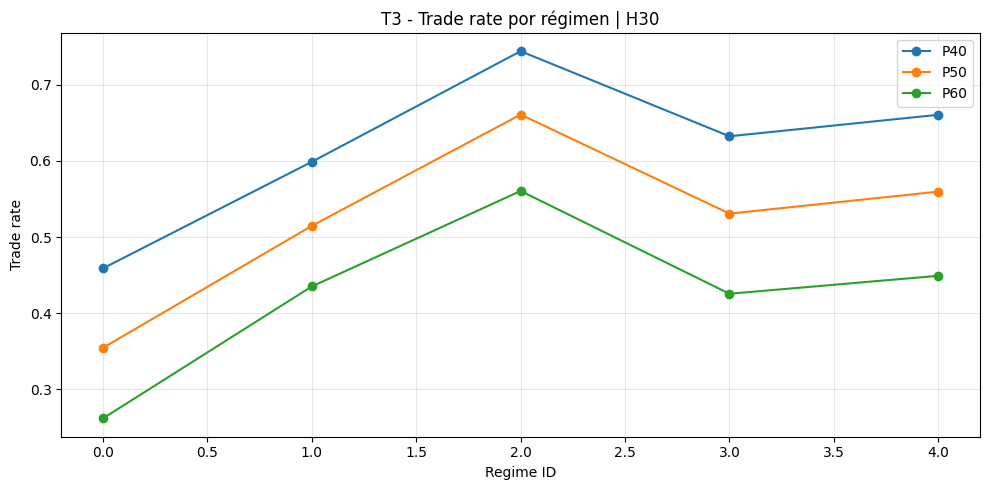

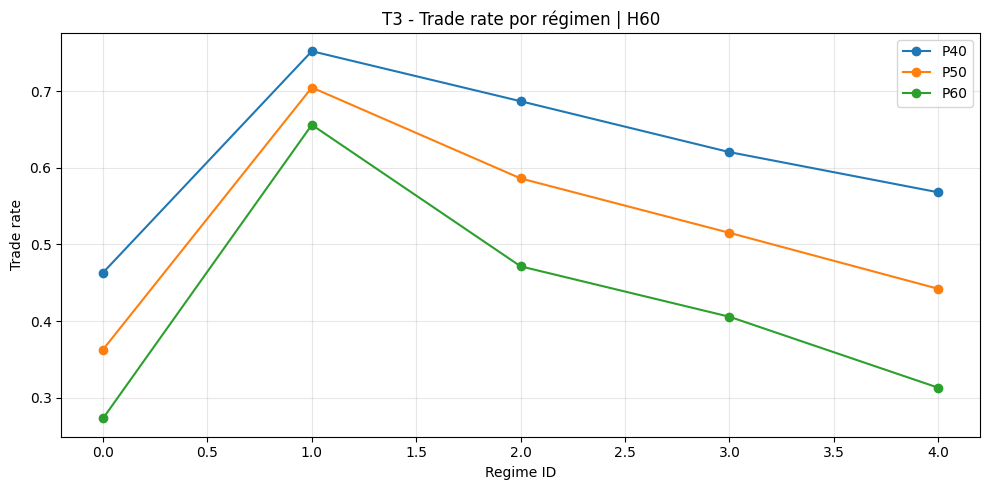

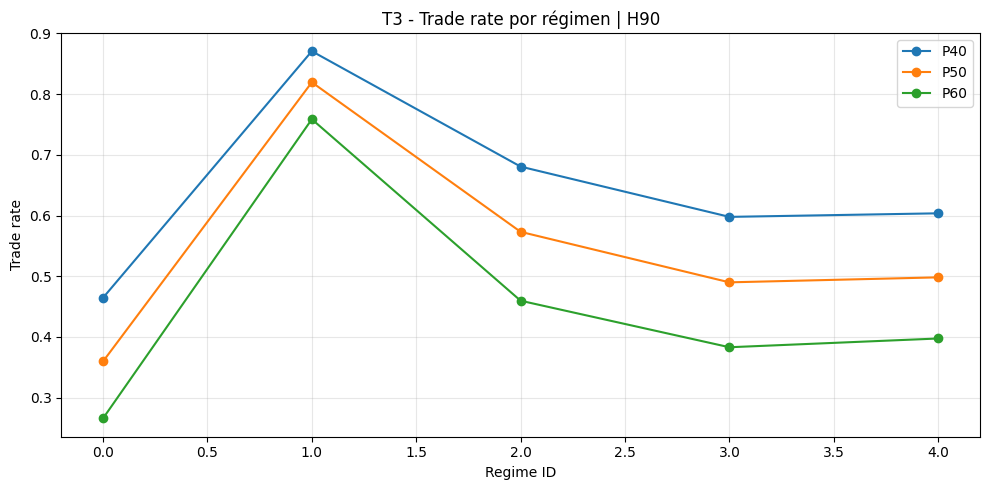

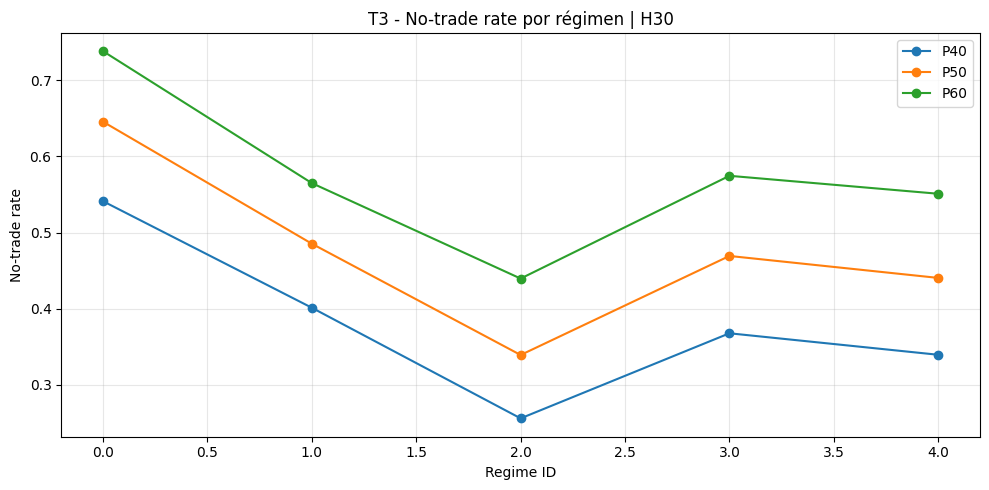

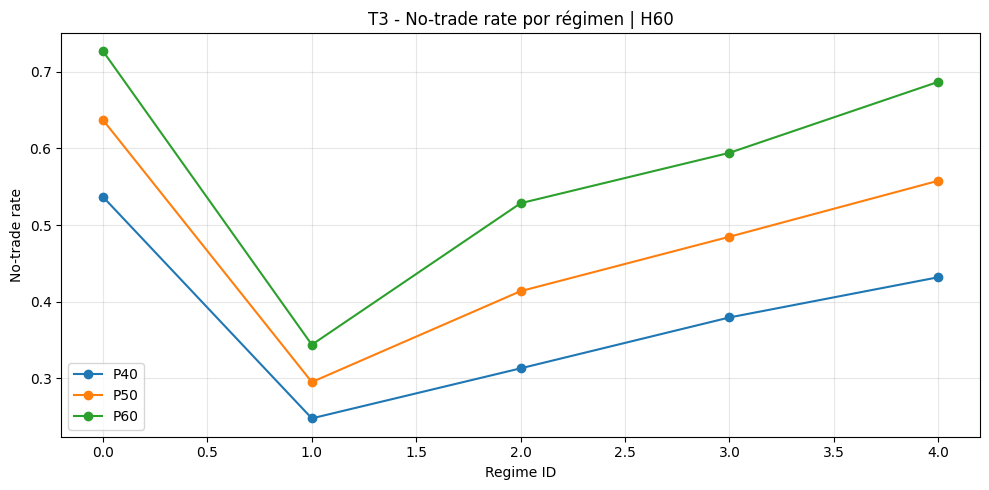

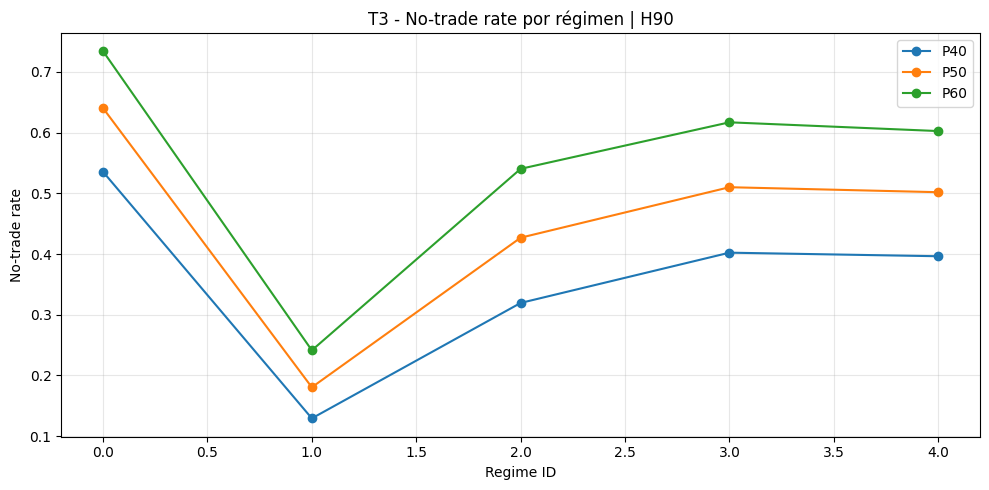

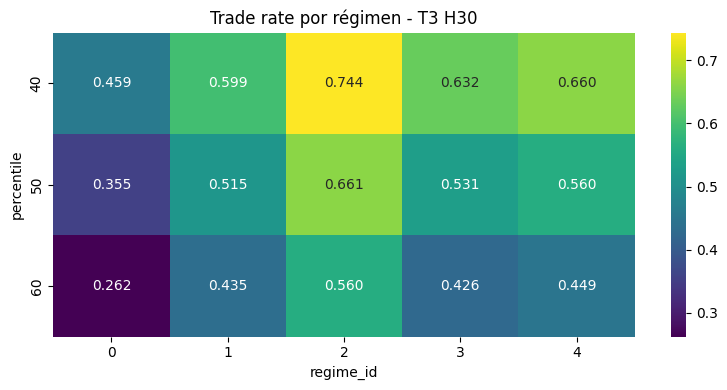

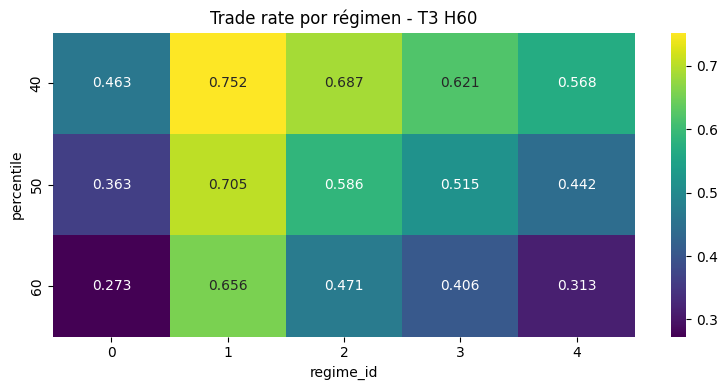

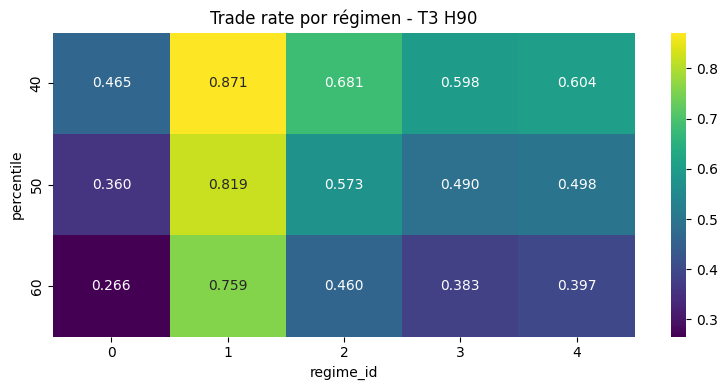

In [56]:
# =========================================================
# 5.6.2 Frecuencia operativa por régimen - T3
# =========================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

t3_regime_frequency_rows = []

total_rows_by_regime = (
    df_t3
    .groupby("regime_id")
    .size()
)

for col in t3_cols:

    parts = col.split("_")

    percentile = int(parts[2].replace("p", ""))
    horizon = int(parts[3].replace("h", ""))

    for regime_id in sorted(df_t3["regime_id"].dropna().unique()):

        temp = df_t3.loc[
            df_t3["regime_id"] == regime_id,
            col
        ]

        total_rows = len(temp)

        valid_trades = temp.notna().sum()

        no_trade = total_rows - valid_trades

        trade_rate = valid_trades / total_rows
        no_trade_rate = no_trade / total_rows

        t3_regime_frequency_rows.append({
            "regime_id": regime_id,
            "target": col,
            "horizon": horizon,
            "percentile": percentile,

            "total_rows": total_rows,
            "valid_trades": valid_trades,
            "no_trade": no_trade,

            "trade_rate": trade_rate,
            "no_trade_rate": no_trade_rate
        })

df_t3_regime_frequency = pd.DataFrame(
    t3_regime_frequency_rows
)

display(Markdown("## Frecuencia operativa por régimen - T3"))
display(df_t3_regime_frequency)

# =========================================================
# Resumen compacto
# =========================================================

summary_regime_frequency_t3 = (
    df_t3_regime_frequency[
        [
            "regime_id",
            "target",
            "horizon",
            "percentile",
            "valid_trades",
            "trade_rate",
            "no_trade_rate"
        ]
    ]
)

display(Markdown("## Resumen compacto por régimen - T3"))
display(summary_regime_frequency_t3)

# =========================================================
# Trade rate por régimen
# =========================================================

for H in sorted(summary_regime_frequency_t3["horizon"].unique()):

    fig, ax = plt.subplots(figsize=(10, 5))

    temp_h = summary_regime_frequency_t3[
        summary_regime_frequency_t3["horizon"] == H
    ]

    for P in sorted(temp_h["percentile"].unique()):

        temp = temp_h[
            temp_h["percentile"] == P
        ]

        ax.plot(
            temp["regime_id"],
            temp["trade_rate"],
            marker="o",
            label=f"P{P}"
        )

    ax.set_title(
        f"T3 - Trade rate por régimen | H{H}"
    )

    ax.set_xlabel("Regime ID")
    ax.set_ylabel("Trade rate")

    ax.legend()
    ax.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

# =========================================================
# No-trade rate por régimen
# =========================================================

for H in sorted(summary_regime_frequency_t3["horizon"].unique()):

    fig, ax = plt.subplots(figsize=(10, 5))

    temp_h = summary_regime_frequency_t3[
        summary_regime_frequency_t3["horizon"] == H
    ]

    for P in sorted(temp_h["percentile"].unique()):

        temp = temp_h[
            temp_h["percentile"] == P
        ]

        ax.plot(
            temp["regime_id"],
            temp["no_trade_rate"],
            marker="o",
            label=f"P{P}"
        )

    ax.set_title(
        f"T3 - No-trade rate por régimen | H{H}"
    )

    ax.set_xlabel("Regime ID")
    ax.set_ylabel("No-trade rate")

    ax.legend()
    ax.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

# =========================================================
# Heatmap trade rate
# =========================================================

import seaborn as sns

for H in sorted(summary_regime_frequency_t3["horizon"].unique()):

    temp = summary_regime_frequency_t3[
        summary_regime_frequency_t3["horizon"] == H
    ]

    pivot_table = temp.pivot(
        index="percentile",
        columns="regime_id",
        values="trade_rate"
    )

    plt.figure(figsize=(8, 4))

    sns.heatmap(
        pivot_table,
        annot=True,
        fmt=".3f",
        cmap="viridis"
    )

    plt.title(
        f"Trade rate por régimen - T3 H{H}"
    )

    plt.tight_layout()
    plt.show()

**Observaciones**

La frecuencia operativa muestra diferencias importantes entre los distintos regímenes intradiarios, indicando que las oportunidades de trading no se distribuyen uniformemente a lo largo de la sesión.

* El **régimen 1 (pre-market)** presenta sistemáticamente los mayores niveles de actividad operativa para los horizontes H60 y H90. En algunos casos alcanza trade rates cercanos al 87%, indicando que la mayoría de las observaciones generan una señal válida.

* El **régimen 2 (opening)** domina la frecuencia operativa en H30, donde alcanza valores entre 56% y 74% según el percentil utilizado. Esto sugiere una fuerte concentración de movimientos significativos durante la apertura del mercado.

* El **régimen 0 (overnight)** es consistentemente el régimen con menor actividad operativa. Los trade rates oscilan entre aproximadamente 26% y 46%, reflejando una mayor proporción de observaciones filtradas como no operables.

* Los regímenes **3 (regular)** y **4 (closing)** presentan un comportamiento intermedio. Generan una cantidad importante de trades, aunque claramente inferior a los regímenes más activos.

* A medida que aumenta el percentil de T2 (P40 → P50 → P60), el trade rate disminuye en todos los regímenes. Este comportamiento es consistente con lo observado anteriormente: thresholds más exigentes generan menos oportunidades operativas.

* El impacto del percentil no es uniforme. Los mayores descensos suelen observarse en los regímenes 0, 3 y 4, mientras que el régimen 1 conserva una frecuencia operativa relativamente elevada incluso bajo configuraciones más selectivas.

* Los gráficos de no-trade rate muestran exactamente el comportamiento inverso, confirmando la coherencia interna de la construcción del target.

* Los heatmaps permiten identificar con claridad las combinaciones más activas:

  * H30 → máximo en régimen 2 (≈74%)
  * H60 → máximo en régimen 1 (≈75%)
  * H90 → máximo en régimen 1 (≈87%)

* Las configuraciones más restrictivas (P60) continúan generando actividad significativa en los regímenes 1 y 2, mientras que los restantes regímenes experimentan reducciones mucho más pronunciadas.

**Conclusión**

La frecuencia operativa de T3 depende fuertemente del régimen intradiario.

Los resultados muestran que las oportunidades de trading se concentran principalmente en los regímenes de **pre-market (1)** y **opening (2)**, mientras que el período overnight presenta la menor densidad de señales. Asimismo, el aumento del percentil reduce la actividad operativa en todos los regímenes, aunque dicha reducción es mucho más moderada en los períodos de mayor volatilidad y movimiento direccional.

Esto constituye evidencia adicional de que T3 no sólo captura diferencias entre configuraciones de horizonte y threshold, sino también diferencias estructurales asociadas al comportamiento intradiario del mercado.


#### **5.6.3. Success rate por régimen**






El objetivo de esta sección consiste en analizar cómo varía la probabilidad de éxito de los trades según el régimen intradiario.

Mientras que la sección anterior estudió la frecuencia con que aparecen oportunidades operativas, aquí se evalúa la calidad de dichas oportunidades mediante el porcentaje de trades exitosos observado en cada régimen.

Este análisis permite identificar si determinados períodos de mercado no sólo generan más señales, sino también señales de mejor calidad.

En particular, se busca responder las siguientes preguntas:

- ¿Qué régimen presenta la mayor probabilidad de éxito?
- ¿Existen diferencias significativas entre apertura, sesión regular y cierre?
- ¿Cómo afectan horizonte y percentil al success rate?
- ¿Qué combinaciones producen las señales operativamente más robustas?

Para cada target se calcularán:

- successful_trades
- failed_trades
- success_rate
- failure_rate

Posteriormente se analizará la evolución del success rate entre regímenes mediante tablas resumen, gráficos comparativos y heatmaps.



Success rate por régimen - T3


,regime_id,target,horizon,percentile,successful_trades,failed_trades,success_rate,failure_rate
0,0,t3_t2_p40_h30_tp30_sl30,30,40,76117,27257,0.736326,0.263674
1,1,t3_t2_p40_h30_tp30_sl30,30,40,44706,8491,0.840386,0.159614
2,2,t3_t2_p40_h30_tp30_sl30,30,40,43218,22904,0.653610,0.346390
3,3,t3_t2_p40_h30_tp30_sl30,30,40,208247,72801,0.740966,0.259034
4,4,t3_t2_p40_h30_tp30_sl30,30,40,22492,6867,0.766102,0.233898
5,0,t3_t2_p50_h30_tp30_sl30,30,50,65128,14755,0.815292,0.184708
6,1,t3_t2_p50_h30_tp30_sl30,30,50,39955,5777,0.873677,0.126323
7,2,t3_t2_p50_h30_tp30_sl30,30,50,38990,19741,0.663874,0.336126
8,3,t3_t2_p50_h30_tp30_sl30,30,50,182834,53114,0.774891,0.225109
9,4,t3_t2_p50_h30_tp30_sl30,30,50,19933,4943,0.801294,0.198706



Resumen compacto - Success rate por régimen


,regime_id,target,horizon,percentile,success_rate,failure_rate
0,0,t3_t2_p40_h30_tp30_sl30,30,40,0.736326,0.263674
1,1,t3_t2_p40_h30_tp30_sl30,30,40,0.840386,0.159614
2,2,t3_t2_p40_h30_tp30_sl30,30,40,0.653610,0.346390
3,3,t3_t2_p40_h30_tp30_sl30,30,40,0.740966,0.259034
4,4,t3_t2_p40_h30_tp30_sl30,30,40,0.766102,0.233898
5,0,t3_t2_p50_h30_tp30_sl30,30,50,0.815292,0.184708
6,1,t3_t2_p50_h30_tp30_sl30,30,50,0.873677,0.126323
7,2,t3_t2_p50_h30_tp30_sl30,30,50,0.663874,0.336126
8,3,t3_t2_p50_h30_tp30_sl30,30,50,0.774891,0.225109
9,4,t3_t2_p50_h30_tp30_sl30,30,50,0.801294,0.198706


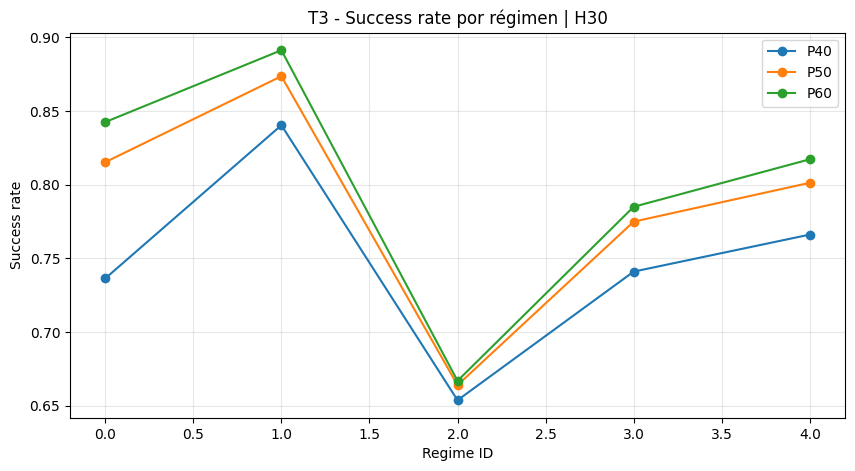

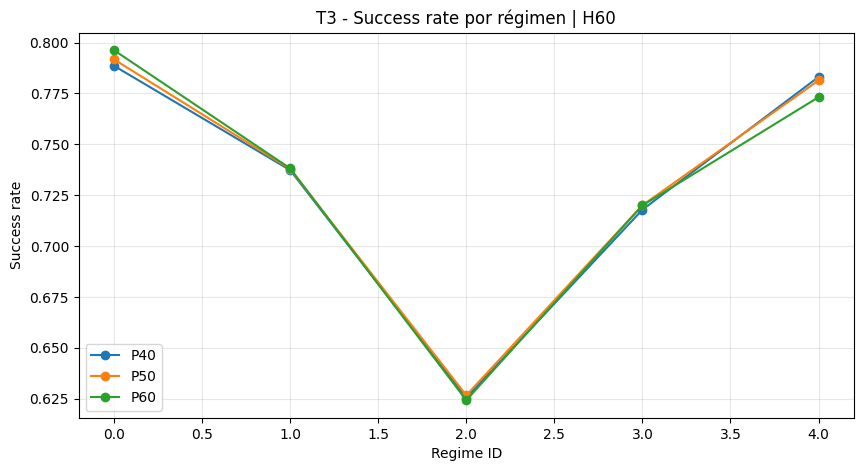

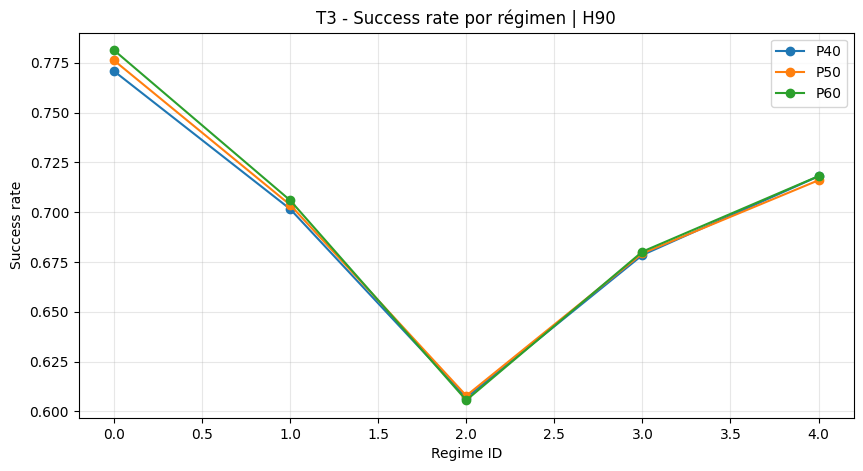

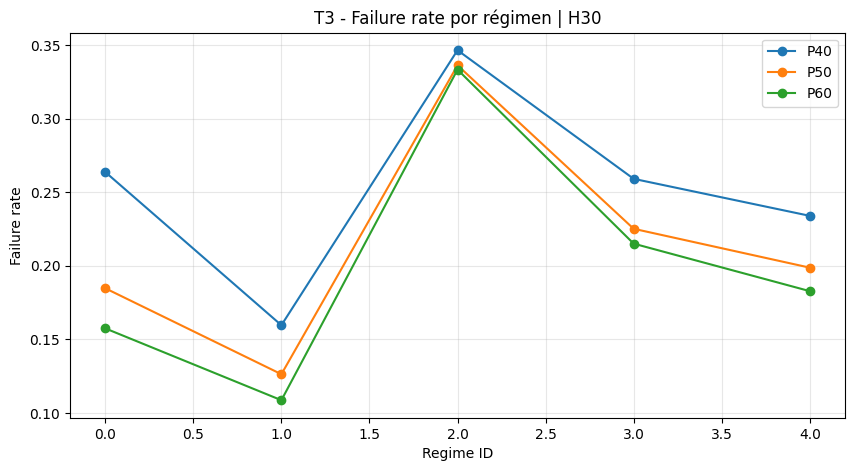

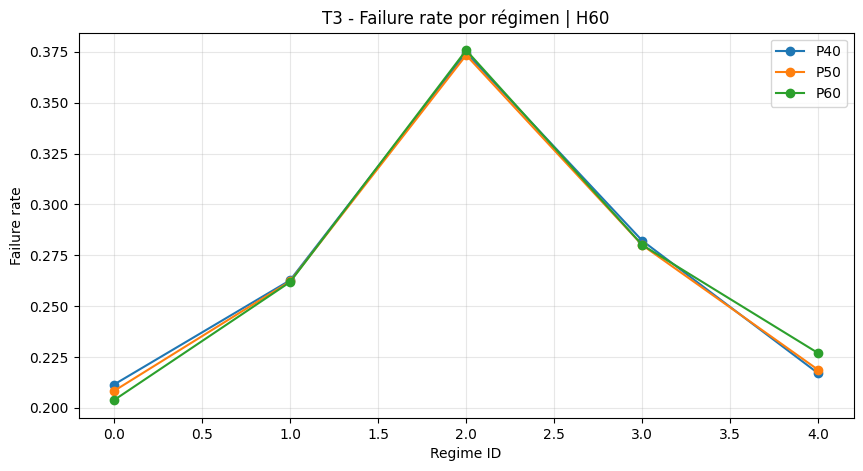

...

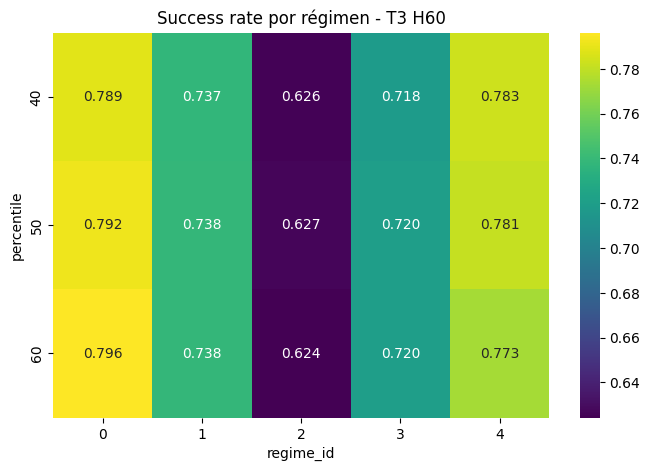

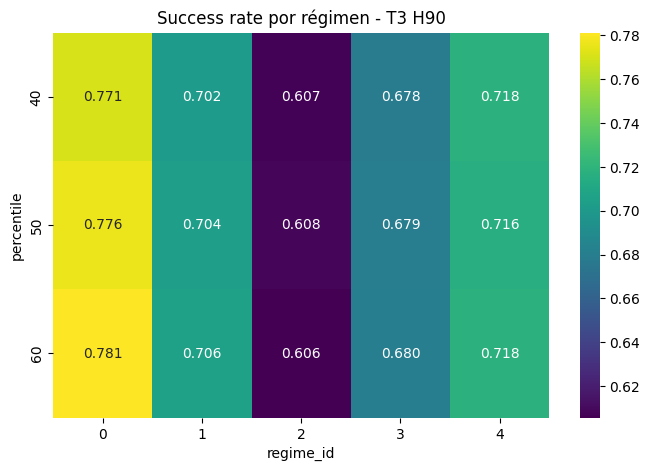

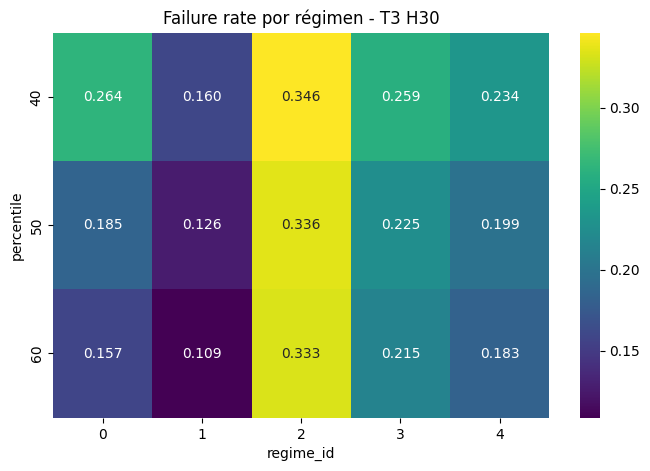

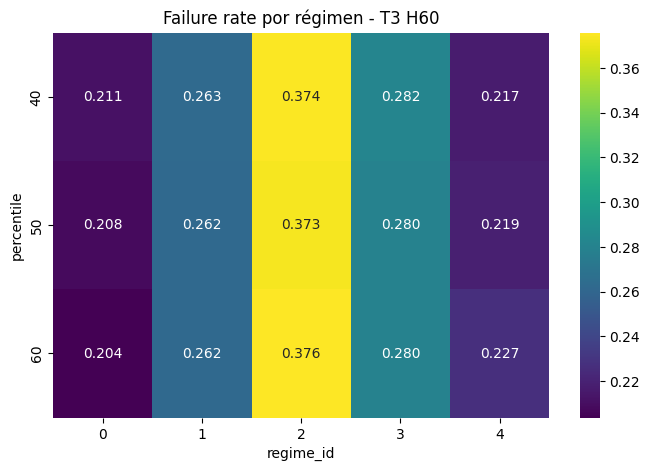

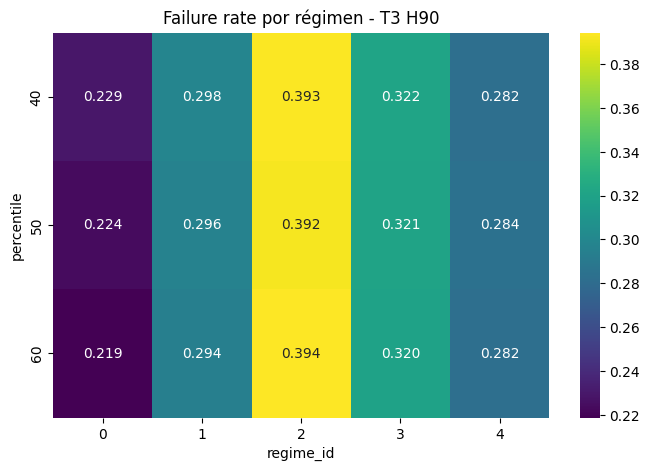

In [57]:
# =========================================================
# 5.6.3 Success rate por régimen - T3
# =========================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# =========================================================
# Construcción tabla por régimen
# =========================================================

t3_regime_success_rows = []

for col in t3_cols:

    parts = col.split("_")

    percentile = int(parts[2].replace("p", ""))
    horizon = int(parts[3].replace("h", ""))

    for regime in sorted(df_t3["regime_id"].dropna().unique()):

        subset = df_t3.loc[
            df_t3["regime_id"] == regime,
            col
        ]

        valid = subset.dropna()

        if len(valid) == 0:
            continue

        success_rate = (valid == 1).mean()
        failure_rate = (valid == 0).mean()

        t3_regime_success_rows.append({
            "regime_id": regime,
            "target": col,
            "horizon": horizon,
            "percentile": percentile,
            "successful_trades": (valid == 1).sum(),
            "failed_trades": (valid == 0).sum(),
            "success_rate": success_rate,
            "failure_rate": failure_rate
        })

df_t3_regime_success = pd.DataFrame(
    t3_regime_success_rows
)

print("\nSuccess rate por régimen - T3")
display(df_t3_regime_success)

# =========================================================
# Resumen compacto
# =========================================================

summary_regime_success = (
    df_t3_regime_success[
        [
            "regime_id",
            "target",
            "horizon",
            "percentile",
            "success_rate",
            "failure_rate"
        ]
    ]
    .sort_values(
        ["horizon", "percentile", "regime_id"]
    )
)

print("\nResumen compacto - Success rate por régimen")
display(summary_regime_success)

# =========================================================
# Gráfico Success Rate
# =========================================================

for H in sorted(summary_regime_success["horizon"].unique()):

    temp = summary_regime_success[
        summary_regime_success["horizon"] == H
    ]

    plt.figure(figsize=(10,5))

    for p in sorted(temp["percentile"].unique()):

        x = temp[temp["percentile"] == p]

        plt.plot(
            x["regime_id"],
            x["success_rate"],
            marker="o",
            label=f"P{p}"
        )

    plt.title(
        f"T3 - Success rate por régimen | H{H}"
    )

    plt.xlabel("Regime ID")
    plt.ylabel("Success rate")

    plt.grid(alpha=0.3)
    plt.legend()

    plt.show()

# =========================================================
# Gráfico Failure Rate
# =========================================================

for H in sorted(summary_regime_success["horizon"].unique()):

    temp = summary_regime_success[
        summary_regime_success["horizon"] == H
    ]

    plt.figure(figsize=(10,5))

    for p in sorted(temp["percentile"].unique()):

        x = temp[temp["percentile"] == p]

        plt.plot(
            x["regime_id"],
            x["failure_rate"],
            marker="o",
            label=f"P{p}"
        )

    plt.title(
        f"T3 - Failure rate por régimen | H{H}"
    )

    plt.xlabel("Regime ID")
    plt.ylabel("Failure rate")

    plt.grid(alpha=0.3)
    plt.legend()

    plt.show()

# =========================================================
# Heatmap Success Rate
# =========================================================

for H in sorted(summary_regime_success["horizon"].unique()):

    temp = summary_regime_success[
        summary_regime_success["horizon"] == H
    ]

    pivot = temp.pivot(
        index="percentile",
        columns="regime_id",
        values="success_rate"
    )

    plt.figure(figsize=(8,5))

    sns.heatmap(
        pivot,
        annot=True,
        fmt=".3f",
        cmap="viridis"
    )

    plt.title(
        f"Success rate por régimen - T3 H{H}"
    )

    plt.show()

# =========================================================
# Heatmap Failure Rate
# =========================================================

for H in sorted(summary_regime_success["horizon"].unique()):

    temp = summary_regime_success[
        summary_regime_success["horizon"] == H
    ]

    pivot = temp.pivot(
        index="percentile",
        columns="regime_id",
        values="failure_rate"
    )

    plt.figure(figsize=(8,5))

    sns.heatmap(
        pivot,
        annot=True,
        fmt=".3f",
        cmap="viridis"
    )

    plt.title(
        f"Failure rate por régimen - T3 H{H}"
    )

    plt.show()

**Observaciones — 5.6.3 Success rate por régimen**

* El régimen intradiario tiene un impacto muy importante sobre la calidad de los trades en T3.

* El **régimen 2** es sistemáticamente el peor de todos los escenarios analizados. Independientemente del horizonte o percentil utilizado, presenta los menores success rates, ubicándose aproximadamente entre **60% y 67%**.

* El **régimen 1** es el mejor régimen para H30, alcanzando los mayores success rates de todo el estudio. En la configuración H30-P60 llega a valores cercanos al **89% de trades exitosos**.

* Para horizontes H60 y H90 el comportamiento cambia ligeramente:

  * el liderazgo pasa al **régimen 0**
  * el régimen 4 permanece entre los mejores
  * el régimen 1 pierde parte de la ventaja observada en H30.

* El orden de calidad de los regímenes resulta notablemente estable:

| Ranking aproximado | Regímenes |
| ------------------ | --------- |
| Mejor              | 0, 1 y 4  |
| Intermedio         | 3         |
| Peor               | 2         |

* A medida que aumenta el horizonte de análisis:

  * el success rate promedio disminuye;
  * las diferencias entre regímenes se reducen;
  * las curvas se vuelven más planas.

* En H30 las diferencias son muy marcadas:

  * mejor régimen ≈ 89%
  * peor régimen ≈ 66%
  * diferencia cercana a 23 puntos porcentuales.

* En H90 las diferencias siguen existiendo, pero se reducen:

  * mejor régimen ≈ 78%
  * peor régimen ≈ 61%
  * diferencia cercana a 17 puntos porcentuales.

* El incremento del percentil produce un efecto consistente en H30:

  * aumenta el success rate en prácticamente todos los regímenes;
  * la mejora es especialmente visible en los regímenes 0, 1 y 4.

* En H60 y H90 el efecto del percentil es mucho más débil. Las curvas para P40, P50 y P60 son casi idénticas, indicando que la calidad del trade depende más del régimen que del nivel de selectividad.

* Los heatmaps muestran una estructura muy estable:

  * zonas de alta calidad concentradas en regímenes 0, 1 y 4;
  * zona persistentemente débil en régimen 2;
  * comportamiento intermedio en régimen 3.

* Los gráficos de failure rate confirman exactamente la misma conclusión desde la perspectiva opuesta:

  * régimen 2 concentra las mayores tasas de fracaso;
  * regímenes 0, 1 y 4 presentan las menores probabilidades de pérdida.

**Conclusión**

El análisis por régimen revela que la calidad de las oportunidades de trading no es homogénea durante la sesión. Los regímenes 0, 1 y 4 concentran las señales de mayor probabilidad de éxito, mientras que el régimen 2 constituye de forma consistente la zona menos favorable. Este comportamiento aparece en todas las combinaciones de horizonte y percentil, lo que sugiere que el régimen intradiario es una variable explicativa relevante para futuras etapas de modelado y filtrado operativo.


**5.6.4. Comparación entre horizontes y percentiles**


Hasta este punto se analizaron por separado la distribución de clases, la frecuencia operativa y el success rate para cada régimen intradiario. Sin embargo, resulta útil integrar todas estas dimensiones para identificar qué combinación de horizonte y percentil produce el mejor comportamiento operativo dentro de cada régimen.

El objetivo de esta sección es comparar simultáneamente:

* success rate por régimen
* failure rate por régimen
* trade rate por régimen
* sensibilidad frente al percentil
* sensibilidad frente al horizonte

Esto permite determinar si existen configuraciones que mantengan un comportamiento robusto independientemente del régimen intradiario, así como identificar aquellos escenarios donde la calidad de los trades se deteriora significativamente.

## Comparación entre horizontes y percentiles - T3

## Heatmap success rate por horizonte - T3

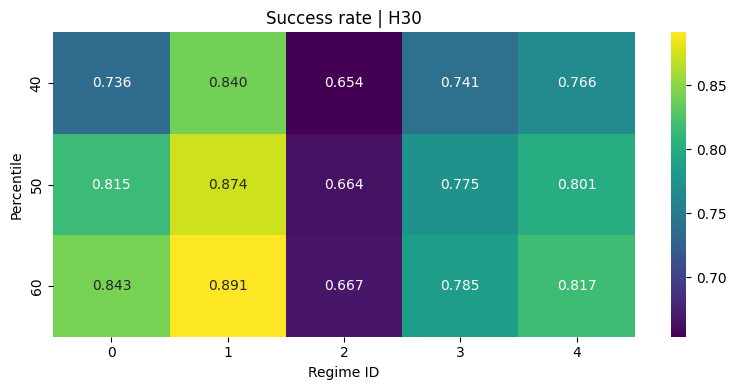

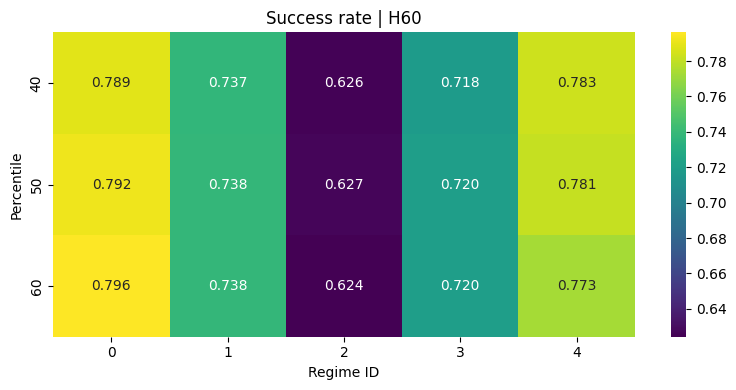

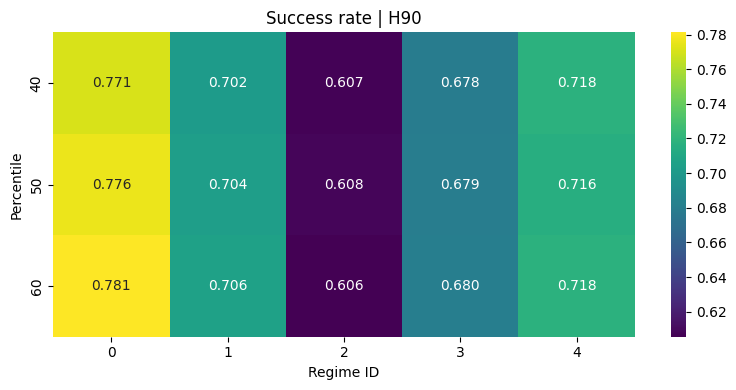

## Heatmap failure rate por horizonte - T3

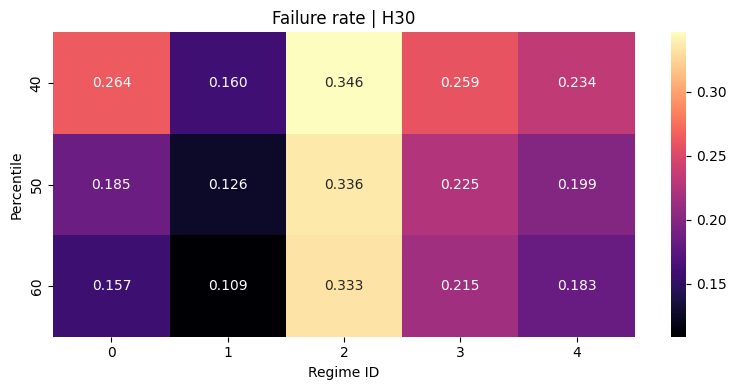

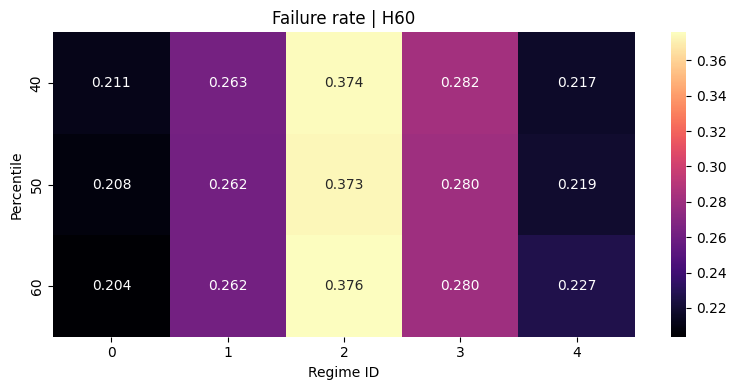

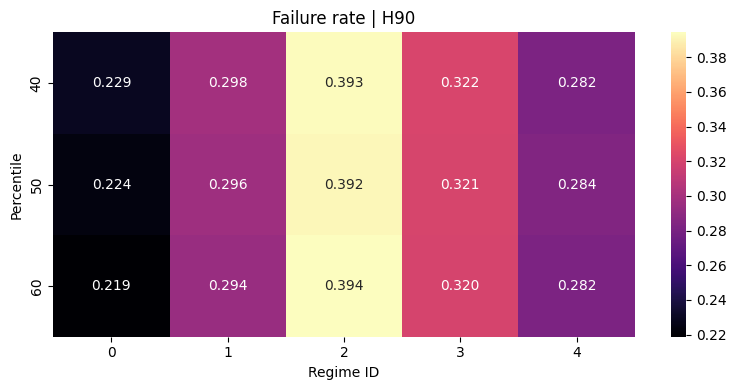

## Comparación success rate por percentil - T3

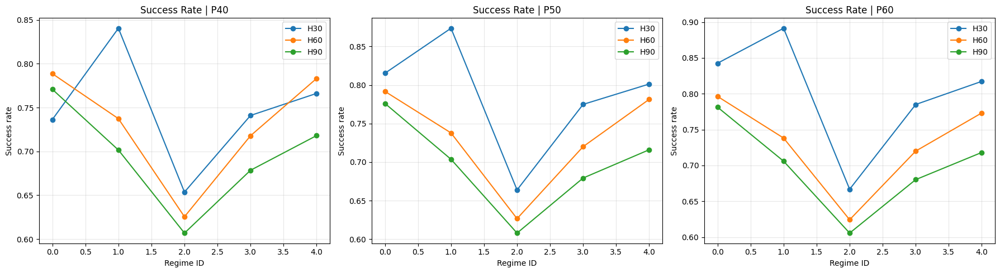

## Comparación trade rate por percentil - T3

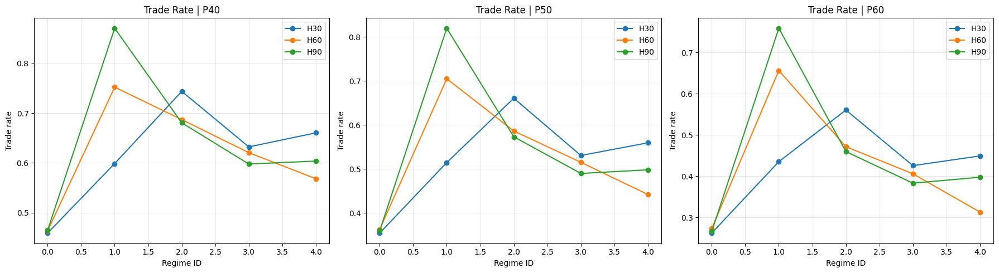

## Comparación global success rate - T3

,horizon,percentile,mean_success_rate,std_success_rate,min_success_rate,max_success_rate,mean_failure_rate
0,30,40,0.747478,0.067001,0.653610,0.840386,0.252522
1,30,50,0.785806,0.077164,0.663874,0.873677,0.214194
2,30,60,0.800576,0.084290,0.666780,0.891331,0.199424
3,60,40,0.730480,0.065907,0.625506,0.788599,0.269520
4,60,50,0.731540,0.065751,0.626624,0.791745,0.268460
5,60,60,0.730366,0.066357,0.624216,0.796264,0.269634
6,90,40,0.695141,0.059901,0.606873,0.770766,0.304859
7,90,50,0.696606,0.061078,0.607890,0.776143,0.303394
8,90,60,0.698218,0.063741,0.605613,0.781265,0.301782


## Comparación global trade rate - T3

,horizon,percentile,mean_trade_rate,std_trade_rate,min_trade_rate,max_trade_rate,mean_no_trade_rate
0,30,40,0.618767,0.104276,0.458906,0.743771,0.381233
1,30,50,0.524026,0.110398,0.354623,0.660634,0.475974
2,30,60,0.426449,0.106704,0.262073,0.560365,0.573551
3,60,40,0.618270,0.110956,0.463265,0.752330,0.381730
4,60,50,0.522298,0.131648,0.362893,0.704929,0.477702
5,60,60,0.423896,0.151324,0.273042,0.656190,0.576104
6,90,40,0.643430,0.148888,0.464544,0.870639,0.356570
7,90,50,0.548086,0.170007,0.359732,0.819446,0.451914
8,90,60,0.452954,0.184654,0.265948,0.758587,0.547046


## Comparación integrada horizonte-percentil - T3

,horizon,percentile,mean_success_rate,std_success_rate,min_success_rate,max_success_rate,mean_failure_rate,mean_trade_rate,std_trade_rate,min_trade_rate,max_trade_rate,mean_no_trade_rate
0,30,40,0.747478,0.067001,0.653610,0.840386,0.252522,0.618767,0.104276,0.458906,0.743771,0.381233
1,30,50,0.785806,0.077164,0.663874,0.873677,0.214194,0.524026,0.110398,0.354623,0.660634,0.475974
2,30,60,0.800576,0.084290,0.666780,0.891331,0.199424,0.426449,0.106704,0.262073,0.560365,0.573551
3,60,40,0.730480,0.065907,0.625506,0.788599,0.269520,0.618270,0.110956,0.463265,0.752330,0.381730
4,60,50,0.731540,0.065751,0.626624,0.791745,0.268460,0.522298,0.131648,0.362893,0.704929,0.477702
5,60,60,0.730366,0.066357,0.624216,0.796264,0.269634,0.423896,0.151324,0.273042,0.656190,0.576104
6,90,40,0.695141,0.059901,0.606873,0.770766,0.304859,0.643430,0.148888,0.464544,0.870639,0.356570
7,90,50,0.696606,0.061078,0.607890,0.776143,0.303394,0.548086,0.170007,0.359732,0.819446,0.451914
8,90,60,0.698218,0.063741,0.605613,0.781265,0.301782,0.452954,0.184654,0.265948,0.758587,0.547046


In [58]:
# ==========================================================
# 5.6.4 Comparación entre horizontes y percentiles - T3
# ==========================================================

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

# ==========================================================
# 0. Copias de trabajo desde DataFrames ya creados
# ==========================================================

df_success = summary_regime_success.copy()
df_trade = summary_regime_frequency_t3.copy()

display(Markdown("## Comparación entre horizontes y percentiles - T3"))

# ==========================================================
# 1. Heatmap Success Rate
# ==========================================================

display(Markdown("## Heatmap success rate por horizonte - T3"))

for horizon in sorted(df_success["horizon"].unique()):

    pivot_sr = (
        df_success[df_success["horizon"] == horizon]
        .pivot(
            index="percentile",
            columns="regime_id",
            values="success_rate"
        )
        .sort_index()
    )

    plt.figure(figsize=(8, 4))

    sns.heatmap(
        pivot_sr,
        annot=True,
        fmt=".3f",
        cmap="viridis"
    )

    plt.title(f"Success rate | H{horizon}")
    plt.xlabel("Regime ID")
    plt.ylabel("Percentile")
    plt.tight_layout()
    plt.show()

# ==========================================================
# 2. Heatmap Failure Rate
# ==========================================================

display(Markdown("## Heatmap failure rate por horizonte - T3"))

for horizon in sorted(df_success["horizon"].unique()):

    pivot_fr = (
        df_success[df_success["horizon"] == horizon]
        .pivot(
            index="percentile",
            columns="regime_id",
            values="failure_rate"
        )
        .sort_index()
    )

    plt.figure(figsize=(8, 4))

    sns.heatmap(
        pivot_fr,
        annot=True,
        fmt=".3f",
        cmap="magma"
    )

    plt.title(f"Failure rate | H{horizon}")
    plt.xlabel("Regime ID")
    plt.ylabel("Percentile")
    plt.tight_layout()
    plt.show()

# ==========================================================
# 3. Comparación Success Rate por percentil
# ==========================================================

display(Markdown("## Comparación success rate por percentil - T3"))

percentiles_available = sorted(df_success["percentile"].unique())

fig, axes = plt.subplots(
    1,
    len(percentiles_available),
    figsize=(6 * len(percentiles_available), 5),
    squeeze=False
)

axes = axes.flatten()

for ax, percentile in zip(axes, percentiles_available):

    temp_p = df_success[
        df_success["percentile"] == percentile
    ]

    for horizon in sorted(temp_p["horizon"].unique()):

        d = (
            temp_p[temp_p["horizon"] == horizon]
            .sort_values("regime_id")
        )

        ax.plot(
            d["regime_id"],
            d["success_rate"],
            marker="o",
            label=f"H{horizon}"
        )

    ax.set_title(f"Success Rate | P{percentile}")
    ax.set_xlabel("Regime ID")
    ax.set_ylabel("Success rate")
    ax.grid(alpha=0.3)
    ax.legend()

plt.tight_layout()
plt.show()

# ==========================================================
# 4. Comparación Trade Rate por percentil
# ==========================================================

display(Markdown("## Comparación trade rate por percentil - T3"))

percentiles_trade = sorted(df_trade["percentile"].unique())

fig, axes = plt.subplots(
    1,
    len(percentiles_trade),
    figsize=(6 * len(percentiles_trade), 5),
    squeeze=False
)

axes = axes.flatten()

for ax, percentile in zip(axes, percentiles_trade):

    temp_p = df_trade[
        df_trade["percentile"] == percentile
    ]

    for horizon in sorted(temp_p["horizon"].unique()):

        d = (
            temp_p[temp_p["horizon"] == horizon]
            .sort_values("regime_id")
        )

        ax.plot(
            d["regime_id"],
            d["trade_rate"],
            marker="o",
            label=f"H{horizon}"
        )

    ax.set_title(f"Trade Rate | P{percentile}")
    ax.set_xlabel("Regime ID")
    ax.set_ylabel("Trade rate")
    ax.grid(alpha=0.3)
    ax.legend()

plt.tight_layout()
plt.show()

# ==========================================================
# 5. Tabla resumen global Success Rate
# ==========================================================

comparison_success_summary = (
    df_success
    .groupby(
        ["horizon", "percentile"],
        as_index=False
    )
    .agg(
        mean_success_rate=("success_rate", "mean"),
        std_success_rate=("success_rate", "std"),
        min_success_rate=("success_rate", "min"),
        max_success_rate=("success_rate", "max"),
        mean_failure_rate=("failure_rate", "mean")
    )
    .sort_values(
        ["horizon", "percentile"]
    )
)

display(Markdown("## Comparación global success rate - T3"))
display(comparison_success_summary)

# ==========================================================
# 6. Tabla resumen global Trade Rate
# ==========================================================

comparison_trade_summary = (
    df_trade
    .groupby(
        ["horizon", "percentile"],
        as_index=False
    )
    .agg(
        mean_trade_rate=("trade_rate", "mean"),
        std_trade_rate=("trade_rate", "std"),
        min_trade_rate=("trade_rate", "min"),
        max_trade_rate=("trade_rate", "max"),
        mean_no_trade_rate=("no_trade_rate", "mean")
    )
    .sort_values(
        ["horizon", "percentile"]
    )
)

display(Markdown("## Comparación global trade rate - T3"))
display(comparison_trade_summary)

# ==========================================================
# 7. Tabla integrada
# ==========================================================

comparison_integrated_t3 = comparison_success_summary.merge(
    comparison_trade_summary,
    on=["horizon", "percentile"],
    how="left"
)

display(Markdown("## Comparación integrada horizonte-percentil - T3"))
display(comparison_integrated_t3)

**Observaciones**

* El comportamiento del target T3 es consistente en todos los análisis realizados: a medida que aumenta el percentil, el success rate aumenta, pero la frecuencia operativa disminuye.

* El conjunto **H30-P60** presenta el mayor success rate promedio de todo el estudio (**80.1%**), acompañado por la menor tasa de fallo (**19.9%**). Sin embargo, también es el escenario con menor cantidad de operaciones (**42.6% de trade rate promedio**).

* El conjunto **H90-P40** muestra la mayor frecuencia operativa (**64.3% de trade rate promedio**), pero también uno de los menores success rate (**69.5%**). Esto confirma el compromiso natural entre cantidad de señales y calidad de señales.

* Los horizontes largos (H90) generan más oportunidades de operación, especialmente en determinados regímenes, pero reducen la probabilidad de éxito de los trades.

* Los horizontes cortos (H30) producen menos operaciones, pero con una calidad significativamente superior, alcanzando niveles cercanos al 90% de éxito en algunos regímenes.

* El horizonte **H60** aparece como una alternativa intermedia. Su success rate se mantiene alrededor del 73% y presenta una frecuencia operativa similar a H30 para cada percentil.

* El incremento del percentil afecta principalmente la frecuencia operativa y tiene poco impacto sobre los horizontes H60 y H90. En cambio, en H30 el aumento del percentil mejora claramente la calidad de los trades.

* Los heatmaps muestran que los mejores resultados se concentran en los regímenes 0, 1 y 4 para H30, mientras que el régimen 2 es sistemáticamente el más difícil para todos los horizontes.

* La dispersión entre regímenes (std_success_rate) es mayor en H30, indicando que la calidad de las señales depende más del contexto intradiario. En H60 y H90 las diferencias entre regímenes son más homogéneas.

* El régimen 2 mantiene simultáneamente:

  * menor success rate,
  * mayor failure rate,
  * mayor frecuencia operativa.

  Esto sugiere que dicho régimen genera muchas oportunidades, pero con menor calidad predictiva.

**Conclusión**

La comparación conjunta entre horizontes, percentiles y regímenes confirma que la configuración más atractiva para continuar la investigación es **H30-P60**.

Esta configuración ofrece:

* el mayor success rate promedio del estudio (80.1%),
* la menor tasa de fallo (19.9%),
* una clara separación entre trades exitosos y no exitosos,
* una estructura consistente en prácticamente todos los regímenes intradiarios.

El costo asociado es una reducción importante en la frecuencia operativa, pasando de aproximadamente 62% de trades en P40 a 43% en P60. No obstante, desde la perspectiva de modelado y selección de señales, esta reducción parece justificarse por la mejora significativa en la calidad del target.

Como resultado, **H30-P60 emerge como el candidato principal para el desarrollo posterior de modelos predictivos sobre T3**, mientras que **H30-P50** puede conservarse como alternativa intermedia si se desea equilibrar calidad de señal y cantidad de operaciones.


### **5.7. Observaciones e interpretación**

El análisis estadístico realizado sobre los targets T3 permite extraer varias conclusiones relevantes respecto a la calidad, estabilidad y viabilidad operativa de este enfoque de etiquetado.

En primer lugar, T3 presenta una característica particularmente atractiva para el desarrollo de modelos de machine learning: la clase positiva (trade exitoso) domina ampliamente en todas las configuraciones analizadas. Dependiendo del horizonte y percentil utilizado, el success rate oscila aproximadamente entre 70% y 80%, alcanzando valores cercanos al 90% en determinados regímenes intradiarios.

La sensibilidad paramétrica muestra que el percentil utilizado para construir el target tiene un impacto significativo. A medida que aumenta el percentil:

* disminuye la cantidad de operaciones disponibles;
* aumenta la proporción de trades exitosos;
* mejora la separación entre operaciones exitosas y no exitosas.

Esto implica un intercambio natural entre frecuencia operativa y calidad de señal.

Respecto al horizonte temporal, se observa un comportamiento consistente:

* H30 produce los mayores success rate del estudio;
* H60 presenta resultados intermedios;
* H90 genera más operaciones, pero con menor calidad promedio.

En consecuencia, horizontes más cortos parecen capturar movimientos más limpios y predecibles dentro de la estructura del mercado intradiario.

El análisis temporal evidencia además que los targets mantienen una notable estabilidad a lo largo de todo el período analizado. Aunque existen fluctuaciones mensuales asociadas a distintos regímenes de volatilidad del mercado, no se observan cambios estructurales que comprometan la validez del target en determinados años o ciclos de mercado.

La segmentación por régimen intradiario revela que el comportamiento del target no es homogéneo durante toda la sesión.

Se identifican regímenes claramente favorables donde:

* aumenta el success rate;
* disminuye el failure rate;
* se mantiene una frecuencia operativa razonable.

También aparecen regímenes menos eficientes, especialmente el régimen 2, que combina alta actividad operativa con menores tasas de éxito. Este resultado sugiere que la calidad de las señales depende fuertemente del contexto intradiario en el que se generan.

La combinación de los distintos análisis permite concluir que T3 no solo genera etiquetas coherentes desde el punto de vista estadístico, sino que además refleja una lógica operativa realista para trading. El target está directamente alineado con el resultado económico de una operación y no únicamente con la dirección futura del mercado.

Como síntesis general:

* T3 presenta una estructura estable en el tiempo.
* Los trades exitosos predominan ampliamente sobre los no exitosos.
* El percentil controla eficazmente el compromiso entre cantidad y calidad de señales.
* Los horizontes cortos producen las señales de mayor calidad.
* Existen diferencias relevantes entre regímenes intradiarios que podrían aprovecharse posteriormente durante el modelado.
* La configuración H30-P60 emerge como la alternativa de mayor calidad estadística.
* La configuración H30-P50 constituye una opción equilibrada entre calidad de señal y frecuencia operativa.

En conjunto, los resultados obtenidos validan a T3 como un candidato sólido para el entrenamiento de modelos predictivos orientados a identificar oportunidades de trading con probabilidad elevada de éxito, justificando avanzar hacia la etapa de modelado y posteriormente hacia el desarrollo y análisis de los targets T4.


## **6. T4 - Investigación estadística**

6.1. Construcción práctica de T4

    6.1.1 Definición de parámetros operativos

    6.1.2 Construcción de las barreras

    6.1.3 Construcción de los targets T4

    Observaciones preliminares sobre la construcción de T4

    6.1.4 Validación de la construcción de T4

    Observaciones de validación de T4

    6.1.5 Resumen de targets generados

6.2. Distribución global de clases

6.3. Balance de clases

6.4. Estabilidad temporal

6.5. Sensibilidad paramétrica

6.6. Análisis por régimen intradiario

    6.6.1 Distribución de clases por régimen

    6.6.2 Frecuencia operativa por régimen

    6.6.3 Success rate por régimen

    6.6.4 Comparación entre horizontes y percentiles

6.7. Observaciones e interpretación

### **6.1. Construcción práctica de T4**

Una vez definida la formulación conceptual del target T4, es necesario describir detalladamente el procedimiento utilizado para su construcción sobre los datos históricos.

A diferencia de T1, T2 y T3, donde la etiqueta depende principalmente del retorno observado al final de un horizonte futuro, T4 requiere analizar la trayectoria completa del precio dentro de dicho horizonte para determinar qué evento ocurre primero.

Para cada observación se construye un conjunto de barreras futuras compuesto por:

* una barrera superior (*Take Profit*);
* una barrera inferior (*Stop Loss*);
* una barrera temporal definida por el horizonte de análisis.

La etiqueta final se asigna según la primera barrera alcanzada por el precio.

De esta forma, T4 transforma el problema de predicción de retornos en un problema de predicción de eventos, aproximándose mucho más a la lógica utilizada posteriormente durante el backtesting y la ejecución real de estrategias de trading.

La construcción práctica de T4 se desarrolla en las siguientes etapas:

* definición de parámetros operativos;
* construcción de las barreras;
* generación de las etiquetas T4;
* validación de consistencia;
* resumen estadístico de los targets generados.

El objetivo es garantizar que las etiquetas obtenidas representen de forma consistente escenarios reales de operación y permitan posteriormente entrenar modelos alineados con decisiones efectivas de trading.



#### **6.1.1. Definición de parámetros operativos**


La construcción de T4 requiere definir previamente un conjunto de parámetros que determinan tanto la amplitud de las barreras como el período máximo disponible para que ocurra un evento.

Al igual que en T2 y T3, se utilizan tres horizontes de análisis:

* H30
* H60
* H90

donde cada horizonte representa la cantidad máxima de barras futuras utilizadas para evaluar la evolución del precio.

Asimismo, se consideran tres niveles de movimiento mínimo obtenidos mediante percentiles de la distribución histórica de retornos forward:

* P40
* P50
* P60

Estos percentiles permiten adaptar dinámicamente la distancia de las barreras a las condiciones reales de volatilidad observadas en el mercado.

Para cada combinación horizonte-percentil se construyen dos niveles operativos:

* Take Profit (TP)
* Stop Loss (SL)

En esta investigación se adopta una relación simétrica:

$$ TP = SL $$

de modo que riesgo y recompensa poseen inicialmente la misma magnitud.

Esta decisión permite aislar el efecto estadístico del movimiento del mercado sin introducir sesgos derivados de relaciones riesgo-beneficio asimétricas.

Finalmente, cada observación dispone de una barrera temporal asociada al horizonte seleccionado. Si ninguna de las barreras de precio es alcanzada antes de finalizar dicho horizonte, la observación se clasifica como un evento neutro (*No Event*).

La configuración utilizada durante la construcción de T4 se resume en la siguiente tabla:

| Parámetro                 | Valores             |
| ------------------------- | ------------------- |
| Horizontes                | H30, H60, H90       |
| Percentiles               | P40, P50, P60       |
| Take Profit               | TP = threshold(H,P) |
| Stop Loss                 | SL = threshold(H,P) |
| Relación riesgo-beneficio | 1:1                 |
| Barrera temporal          | Horizonte H         |

Esta configuración genera nueve variantes de T4, equivalentes a las combinaciones utilizadas previamente en T2 y T3, permitiendo realizar comparaciones consistentes entre los distintos enfoques de construcción de targets.


#### **6.1.2. Construcción de las barreras**


Una vez definidos los parámetros operativos, el siguiente paso consiste en construir las barreras que determinarán la ocurrencia de los eventos futuros.

Para cada observación (t), se utiliza el precio de cierre actual como punto de referencia y se proyectan dos niveles de precio:

* una barrera superior (*Take Profit*);
* una barrera inferior (*Stop Loss*).

La distancia entre el precio actual y cada barrera se calcula utilizando el umbral asociado a la combinación horizonte-percentil seleccionada.

Sea:

$$
P_t
$$

el precio de cierre en el instante (t), y

$$
threshold_{H,p}
$$

el umbral calculado para el horizonte (H) y percentil (p).

Las barreras se definen como:

$$
TP_t = P_t \cdot (1 + threshold_{H,p})
$$

$$
SL_t = P_t \cdot (1 - threshold_{H,p})
$$

donde:

* $TP_t$ representa la barrera superior;
* $SL_t$ representa la barrera inferior.

De esta manera, cada observación queda asociada a una ventana de observación futura compuesta por:

* una barrera de ganancia;
* una barrera de pérdida;
* una barrera temporal.

---

**Evaluación de eventos**

Una vez construidas las barreras, se analiza la evolución futura del precio durante las siguientes $H$ barras.

Para cada barra futura se verifica si:

$$
High_{t+i} \ge TP_t
$$

o si:

$$
Low_{t+i} \le SL_t
$$

siendo:

$$
i = 1,2,\ldots,H
$$

El objetivo no es determinar únicamente si alguna barrera fue alcanzada, sino identificar cuál fue la primera barrera alcanzada dentro de la ventana temporal.

Este aspecto introduce una dependencia explícita de la trayectoria del precio (*path dependency*), ya que dos observaciones con el mismo retorno final pueden recibir etiquetas diferentes dependiendo del orden en que ocurren los eventos.

---

**Barrera temporal**

Además de las barreras de precio, cada observación posee una barrera temporal definida por el horizonte de análisis.

La barrera temporal limita la búsqueda de eventos a las siguientes:

* 30 barras para H30;
* 60 barras para H60;
* 90 barras para H90.

Si al finalizar dicho período ninguna barrera de precio fue alcanzada, la observación será clasificada posteriormente como un evento neutro (*No Event*).

---

**Representación conceptual**

La estructura utilizada para cada observación puede representarse de forma simplificada como:

```text
                TP
                │
                │
                │
P_t ────────────┼────────────► tiempo
                │
                │
                │
                SL

          Horizonte H
```

Durante la ventana futura comprendida entre $t+1$ y $t+H$, se registra el primer evento alcanzado por el precio. Dicho evento será utilizado en la etapa siguiente para asignar la etiqueta final del target T4.


#### **6.1.3 Construcción de los targets T4**

Una vez definidas las barreras y evaluada la trayectoria futura del precio, se procede a asignar la etiqueta correspondiente a cada observación.

La lógica de construcción de T4 se basa exclusivamente en el primer evento alcanzado dentro de la ventana temporal definida por el horizonte (H).

Para cada observación se analiza secuencialmente la evolución futura del precio hasta que ocurra una de las siguientes situaciones:

1. El precio alcanza primero la barrera superior (*Take Profit*).
2. El precio alcanza primero la barrera inferior (*Stop Loss*).
3. Ninguna barrera es alcanzada antes de finalizar el horizonte.

La etiqueta final se define como:

$$
T4 =
\begin{cases}
1, & \text{TP alcanzado primero} \
-1, & \text{SL alcanzado primero} \
0, & \text{ninguna barrera alcanzada}
\end{cases}
$$

donde:

* **1** representa un evento favorable;
* **-1** representa un evento desfavorable;
* **0** representa ausencia de evento dentro del horizonte.

---

**Evaluación secuencial**

La característica distintiva de T4 es que el orden de ocurrencia de los eventos resulta fundamental.

Por ejemplo, si durante la ventana futura el precio alcanza tanto el nivel TP como el nivel SL, la etiqueta no depende de cuál barrera se alcanzó finalmente, sino de cuál fue alcanzada primero.

Considérese la siguiente situación:

```text
t+5  → TP alcanzado
t+12 → SL alcanzado
```

La observación recibe la etiqueta:

$$
T4 = 1
$$

porque el primer evento observado fue el Take Profit.

De forma análoga:

```text
t+4  → SL alcanzado
t+10 → TP alcanzado
```

produce:

$$
T4 = -1
$$

porque la primera barrera alcanzada fue el Stop Loss.

---

**Caso sin evento**

También puede ocurrir que el precio permanezca dentro de ambas barreras durante toda la ventana de observación.

En este caso:

```text
SL < Precio < TP
```

para todo:

$$
t+1,\ldots,t+H
$$

y la observación recibe la etiqueta:

$$
T4 = 0
$$

Este tercer estado permite distinguir entre:

* movimientos suficientemente fuertes para activar una señal;
* movimientos insuficientes para generar un evento operativo.

---

**Interpretación operativa**

Desde la perspectiva de trading, cada clase puede interpretarse como:

| Clase | Interpretación                                                            |
| ----- | ------------------------------------------------------------------------- |
| 1     | El mercado alcanzó el objetivo de beneficio antes que el nivel de pérdida |
| -1    | El mercado alcanzó el nivel de pérdida antes que el objetivo              |
| 0     | No se produjo ningún evento dentro del horizonte definido                 |

Esta formulación aproxima el problema de aprendizaje a una decisión real de ejecución, donde el interés principal no es únicamente conocer la dirección futura del mercado, sino determinar cuál resultado operativo tiene mayor probabilidad de ocurrir primero.

---

**Targets generados**

Combinando los tres horizontes y los tres percentiles definidos previamente se generan nueve variantes de T4:

| Target     | Horizonte | Percentil |
| ---------- | --------- | --------- |
| T4-P40-H30 | H30       | P40       |
| T4-P50-H30 | H30       | P50       |
| T4-P60-H30 | H30       | P60       |
| T4-P40-H60 | H60       | P40       |
| T4-P50-H60 | H60       | P50       |
| T4-P60-H60 | H60       | P60       |
| T4-P40-H90 | H90       | P40       |
| T4-P50-H90 | H90       | P50       |
| T4-P60-H90 | H90       | P60       |

Estas configuraciones serán analizadas estadísticamente en las secciones siguientes para evaluar su distribución de clases, estabilidad temporal y comportamiento operativo.


In [59]:
# =========================================================
# 6.1.3 Construcción de los targets T4
# =========================================================

import numpy as np
import pandas as pd
from IPython.display import display, Markdown

# Copia de trabajo desde df_t2 o mnq_intraday
df_t4 = df_t2.copy()

# Configuraciones a evaluar
horizons_t4 = [30, 60, 90]
percentiles_t4 = [40, 50, 60]

# Usamos los thresholds ya calculados en T2
# df_t2_thresholds debe contener:
# horizon, percentile, threshold_pts
threshold_lookup = {
    (int(row["horizon"]), int(row["percentile"])): float(row["threshold_pts"])
    for _, row in df_t2_thresholds.iterrows()
}

# =========================================================
# Función para construir T4
# =========================================================

def build_t4_target(df, horizon, threshold_pts):
    """
    Construye T4 según lógica de triple barrier:

    1  = TP alcanzado primero
    -1 = SL alcanzado primero
    0  = ninguna barrera alcanzada dentro del horizonte
    """

    close = df["close"].to_numpy()
    high = df["high"].to_numpy()
    low = df["low"].to_numpy()

    target = np.full(len(df), np.nan)

    for i in range(len(df) - horizon):

        entry = close[i]

        tp_level = entry + threshold_pts
        sl_level = entry - threshold_pts

        future_high = high[i + 1:i + horizon + 1]
        future_low = low[i + 1:i + horizon + 1]

        hit_tp = np.where(future_high >= tp_level)[0]
        hit_sl = np.where(future_low <= sl_level)[0]

        first_tp = hit_tp[0] if len(hit_tp) > 0 else np.inf
        first_sl = hit_sl[0] if len(hit_sl) > 0 else np.inf

        if first_tp < first_sl:
            target[i] = 1

        elif first_sl < first_tp:
            target[i] = -1

        else:
            target[i] = 0

    return target

# =========================================================
# Construcción de targets T4
# =========================================================

t4_cols = []

for H in horizons_t4:

    for p in percentiles_t4:

        threshold_pts = threshold_lookup[(H, p)]

        target_col = f"t4_p{p}_h{H}"

        df_t4[target_col] = build_t4_target(
            df=df_t4,
            horizon=H,
            threshold_pts=threshold_pts
        )

        t4_cols.append(target_col)

# =========================================================
# Resumen inicial de targets T4
# =========================================================

summary_t4_rows = []

for col in t4_cols:

    valid_data = df_t4[col].dropna()

    counts = valid_data.value_counts().sort_index()
    ratios = valid_data.value_counts(normalize=True).sort_index()

    parts = col.split("_")
    percentile = int(parts[1][1:])
    horizon = int(parts[2][1:])

    summary_t4_rows.append({
        "target": col,
        "horizon": horizon,
        "percentile": percentile,
        "valid_rows": len(valid_data),
        "class_-1_count": counts.get(-1, 0),
        "class_0_count": counts.get(0, 0),
        "class_1_count": counts.get(1, 0),
        "class_-1_ratio": ratios.get(-1, 0),
        "class_0_ratio": ratios.get(0, 0),
        "class_1_ratio": ratios.get(1, 0),
    })

df_t4_initial_summary = pd.DataFrame(summary_t4_rows)

display(Markdown("## Resumen inicial de targets T4 construidos"))
display(df_t4_initial_summary)

display(Markdown("## Revisión inicial del dataset T4"))
display(df_t4[["date", "close"] + t4_cols].head())

## Resumen inicial de targets T4 construidos

,target,horizon,percentile,valid_rows,class_-1_count,class_0_count,class_1_count,class_-1_ratio,class_0_ratio,class_1_ratio
0,t4_p40_h30,30,40,892044,439653,52101,400290,0.492860,0.058406,0.448733
1,t4_p50_h30,30,50,892044,411339,112940,367765,0.461120,0.126608,0.412272
2,t4_p60_h30,30,60,892044,358450,212511,321083,0.401830,0.238229,0.359941
3,t4_p40_h60,60,40,892014,445672,54126,392216,0.499624,0.060678,0.439697
4,t4_p50_h60,60,50,892014,406756,124371,360887,0.455997,0.139427,0.404575
5,t4_p60_h60,60,60,892014,348458,231943,311613,0.390642,0.260022,0.349336
6,t4_p40_h90,90,40,891984,444165,58492,389327,0.497952,0.065575,0.436473
7,t4_p50_h90,90,50,891984,401965,134752,355267,0.450641,0.151070,0.398289
8,t4_p60_h90,90,60,891984,340635,244611,306738,0.381885,0.274232,0.343883


## Revisión inicial del dataset T4

,date,close,t4_p40_h30,t4_p50_h30,t4_p60_h30,t4_p40_h60,t4_p50_h60,t4_p60_h60,t4_p40_h90,t4_p50_h90,t4_p60_h90
0,2020-01-02,8818.75,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,2020-01-02,8837.50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2020-01-02,8838.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2020-01-02,8841.50,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0
4,2020-01-02,8842.00,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,0.0,0.0


##### **Observaciones preliminares sobre la construcción de T4**


* La construcción de T4 fue exitosa para las nueve configuraciones analizadas, generando aproximadamente **892 mil observaciones válidas** por target.

* A diferencia de T3, T4 produce una distribución mucho más equilibrada entre eventos favorables (**TP primero**) y desfavorables (**SL primero**), especialmente para los percentiles más bajos.

* Para las configuraciones **P40**, las clases TP y SL aparecen en proporciones muy similares:

  * H30: 44.9% TP vs 49.3% SL
  * H60: 44.0% TP vs 50.0% SL
  * H90: 43.6% TP vs 49.8% SL

  Esto sugiere un target relativamente balanceado y potencialmente atractivo para clasificación supervisada.

* A medida que aumenta el percentil (P40 → P50 → P60), crece la proporción de observaciones clasificadas como **No Event (0)**:

  * aproximadamente 6% en P40,
  * entre 13% y 15% en P50,
  * entre 24% y 27% en P60.

  Este comportamiento es consistente con la lógica de barreras más exigentes, que requieren movimientos de mayor magnitud para activar un evento.

* Tanto los eventos TP como los eventos SL disminuyen al aumentar el percentil, aunque la reducción es más pronunciada para los TP, provocando un ligero sesgo hacia la clase SL.

* El horizonte tiene un impacto relativamente menor que el percentil. Las distribuciones observadas para H30, H60 y H90 son bastante similares dentro de cada percentil.

* En todas las configuraciones la clase **SL primero (-1)** resulta ligeramente dominante respecto a **TP primero (+1)**, indicando que el mercado alcanza con algo más de frecuencia la barrera inferior antes que la superior bajo la parametrización actual.

* La clase **No Event** permanece moderada incluso para P60, lo cual es una señal positiva porque evita que el target quede excesivamente dominado por observaciones neutrales.

**Conclusión preliminar**

Los primeros resultados muestran que T4 genera una estructura estadística interesante para modelado, con tres clases claramente diferenciadas, una proporción relativamente equilibrada entre TP y SL, y un nivel controlado de eventos neutrales. Además, el percentil emerge como el principal parámetro de control de la selectividad del target, mientras que el horizonte parece ejercer una influencia secundaria sobre la distribución global de clases.


#### **6.1.4 Validación de la construcción de T4**

El objetivo de esta validación es confirmar que las etiquetas asignadas por T4 respetan correctamente la lógica de eventos:

* `1`: TP alcanzado primero
* `-1`: SL alcanzado primero
* `0`: ninguna barrera alcanzada dentro del horizonte
* `NaN`: no existe suficiente información futura

In [60]:
# =========================================================
# 6.1.4 Validación de la construcción de T4
# =========================================================

import numpy as np
import pandas as pd
from IPython.display import display, Markdown

validation_rows_t4 = []

for H in horizons_t4:

    for p in percentiles_t4:

        target_col = f"t4_p{p}_h{H}"
        threshold_pts = threshold_lookup[(H, p)]

        valid_data = df_t4[target_col].dropna()

        n_tp = (valid_data == 1).sum()
        n_sl = (valid_data == -1).sum()
        n_no_event = (valid_data == 0).sum()

        total_valid = len(valid_data)

        validation_rows_t4.append({
            "target": target_col,
            "horizon": H,
            "percentile": p,
            "threshold_pts": threshold_pts,
            "threshold_usd": threshold_pts * 2,

            "total_valid": total_valid,
            "n_tp_first": n_tp,
            "n_sl_first": n_sl,
            "n_no_event": n_no_event,

            "tp_ratio": n_tp / total_valid if total_valid else np.nan,
            "sl_ratio": n_sl / total_valid if total_valid else np.nan,
            "no_event_ratio": n_no_event / total_valid if total_valid else np.nan,

            "check_total": n_tp + n_sl + n_no_event,
            "is_consistent": total_valid == (n_tp + n_sl + n_no_event)
        })

df_t4_validation = pd.DataFrame(validation_rows_t4)

display(Markdown("## Validación de la construcción de T4"))
display(df_t4_validation)

# =========================================================
# Validación de valores únicos por target
# =========================================================

unique_rows_t4 = []

for col in t4_cols:

    unique_values = sorted(df_t4[col].dropna().unique())

    unique_rows_t4.append({
        "target": col,
        "unique_values": unique_values,
        "valid_values_only": set(unique_values).issubset({-1, 0, 1})
    })

df_t4_unique_values = pd.DataFrame(unique_rows_t4)

display(Markdown("## Validación de valores únicos - T4"))
display(df_t4_unique_values)

# =========================================================
# Validación de filas finales sin horizonte suficiente
# =========================================================

nan_rows_t4 = []

for H in horizons_t4:

    for p in percentiles_t4:

        target_col = f"t4_p{p}_h{H}"

        n_nan = df_t4[target_col].isna().sum()

        nan_rows_t4.append({
            "target": target_col,
            "horizon": H,
            "percentile": p,
            "n_nan": n_nan,
            "expected_nan": H,
            "is_expected": n_nan == H
        })

df_t4_nan_validation = pd.DataFrame(nan_rows_t4)

display(Markdown("## Validación de NaN finales - T4"))
display(df_t4_nan_validation)


## Validación de la construcción de T4

,target,horizon,percentile,threshold_pts,threshold_usd,total_valid,n_tp_first,n_sl_first,n_no_event,tp_ratio,sl_ratio,no_event_ratio,check_total,is_consistent
0,t4_p40_h30,30,40,16.25,32.5,892044,400290,439653,52101,0.448733,0.492860,0.058406,892044,True
1,t4_p50_h30,30,50,23.00,46.0,892044,367765,411339,112940,0.412272,0.461120,0.126608,892044,True
2,t4_p60_h30,30,60,32.25,64.5,892044,321083,358450,212511,0.359941,0.401830,0.238229,892044,True
3,t4_p40_h60,60,40,25.50,51.0,892014,392216,445672,54126,0.439697,0.499624,0.060678,892014,True
4,t4_p50_h60,60,50,36.00,72.0,892014,360887,406756,124371,0.404575,0.455997,0.139427,892014,True
5,t4_p60_h60,60,60,50.75,101.5,892014,311613,348458,231943,0.349336,0.390642,0.260022,892014,True
6,t4_p40_h90,90,40,34.50,69.0,891984,389327,444165,58492,0.436473,0.497952,0.065575,891984,True
7,t4_p50_h90,90,50,48.75,97.5,891984,355267,401965,134752,0.398289,0.450641,0.151070,891984,True
8,t4_p60_h90,90,60,67.25,134.5,891984,306738,340635,244611,0.343883,0.381885,0.274232,891984,True


## Validación de valores únicos - T4

,target,unique_values,valid_values_only
0,t4_p40_h30,"[-1.0, 0.0, 1.0]",True
1,t4_p50_h30,"[-1.0, 0.0, 1.0]",True
2,t4_p60_h30,"[-1.0, 0.0, 1.0]",True
3,t4_p40_h60,"[-1.0, 0.0, 1.0]",True
4,t4_p50_h60,"[-1.0, 0.0, 1.0]",True
5,t4_p60_h60,"[-1.0, 0.0, 1.0]",True
6,t4_p40_h90,"[-1.0, 0.0, 1.0]",True
7,t4_p50_h90,"[-1.0, 0.0, 1.0]",True
8,t4_p60_h90,"[-1.0, 0.0, 1.0]",True


## Validación de NaN finales - T4

,target,horizon,percentile,n_nan,expected_nan,is_expected
0,t4_p40_h30,30,40,30,30,True
1,t4_p50_h30,30,50,30,30,True
2,t4_p60_h30,30,60,30,30,True
3,t4_p40_h60,60,40,60,60,True
4,t4_p50_h60,60,50,60,60,True
5,t4_p60_h60,60,60,60,60,True
6,t4_p40_h90,90,40,90,90,True
7,t4_p50_h90,90,50,90,90,True
8,t4_p60_h90,90,60,90,90,True



Con esto validas tres cosas importantes:

* que las clases suman correctamente;
* que sólo existen valores `-1`, `0`, `1`;
* que los `NaN` corresponden únicamente a las últimas filas sin horizonte futuro suficiente.


##### **Observaciones de validación de T4**


Los resultados obtenidos permiten confirmar que la construcción de los targets T4 fue realizada correctamente y que las etiquetas generadas respetan la lógica definida mediante barreras de eventos.

* Todas las configuraciones presentan `is_consistent = True`, lo que verifica que la suma de eventos TP, SL y No Event coincide exactamente con el número total de observaciones válidas.

* La validación de valores únicos confirma que los targets contienen exclusivamente las tres clases esperadas:

  * `1` → TP alcanzado primero
  * `-1` → SL alcanzado primero
  * `0` → ninguna barrera alcanzada

  No se detectan etiquetas inválidas ni inconsistencias de codificación.

* La validación de observaciones sin horizonte futuro suficiente también resulta satisfactoria. Para cada configuración, el número de valores faltantes coincide exactamente con el horizonte utilizado:

  * H30 → 30 observaciones finales
  * H60 → 60 observaciones finales
  * H90 → 90 observaciones finales

  Esto confirma que las únicas filas descartadas corresponden al final de la serie temporal, donde no existe información futura suficiente para evaluar las barreras.

* La distribución de eventos muestra un comportamiento coherente con la construcción de T4:

  * al aumentar el percentil, disminuyen los eventos TP y SL;
  * aumenta progresivamente la clase No Event;
  * el porcentaje de observaciones neutrales crece desde aproximadamente 6% en P40 hasta valores cercanos al 27% en P60.

* En todas las configuraciones la clase SL presenta una frecuencia ligeramente superior a la clase TP. Este comportamiento es consistente a través de todos los horizontes y sugiere una leve asimetría bajista en la dinámica histórica observada bajo las barreras definidas.

* El impacto del horizonte sobre la distribución de eventos es relativamente reducido en comparación con el efecto del percentil. Las principales diferencias observadas provienen de la amplitud de las barreras y no del tiempo disponible para alcanzarlas.

**Conclusión**

La validación confirma que los nueve targets T4 fueron construidos correctamente y cumplen con todas las reglas definidas durante la etapa de diseño. No se detectan inconsistencias en las etiquetas, problemas de codificación ni errores asociados al manejo de horizontes futuros.

En consecuencia, los targets T4 quedan validados y listos para iniciar el análisis estadístico formal, comenzando por el estudio de la distribución global de clases.


#### **6.1.5 Resumen de targets generados**


Una vez completada la construcción y validación de los targets T4, resulta conveniente consolidar en una única tabla las principales características de cada configuración generada.

El objetivo de este resumen es disponer de una visión global de:

* horizonte utilizado;
* percentil utilizado;
* amplitud de las barreras;
* cantidad de observaciones válidas;
* distribución de eventos TP;
* distribución de eventos SL;
* proporción de observaciones sin evento.

Esta información servirá como punto de partida para las siguientes etapas del análisis estadístico, permitiendo comparar rápidamente las distintas configuraciones de T4 antes de estudiar su distribución de clases, estabilidad temporal y comportamiento por régimen intradiario.

In [61]:
# =========================================================
# 6.1.5 Resumen de targets generados - T4
# =========================================================

import pandas as pd
from IPython.display import display, Markdown

summary_t4_targets = (
    df_t4_validation[
        [
            "target",
            "horizon",
            "percentile",
            "threshold_pts",
            "threshold_usd",
            "total_valid",
            "n_tp_first",
            "n_sl_first",
            "n_no_event",
            "tp_ratio",
            "sl_ratio",
            "no_event_ratio"
        ]
    ]
    .sort_values(
        ["horizon", "percentile"]
    )
    .reset_index(drop=True)
)

display(Markdown("## Resumen de targets generados - T4"))
display(summary_t4_targets)

## Resumen de targets generados - T4

,target,horizon,percentile,threshold_pts,threshold_usd,total_valid,n_tp_first,n_sl_first,n_no_event,tp_ratio,sl_ratio,no_event_ratio
0,t4_p40_h30,30,40,16.25,32.5,892044,400290,439653,52101,0.448733,0.492860,0.058406
1,t4_p50_h30,30,50,23.00,46.0,892044,367765,411339,112940,0.412272,0.461120,0.126608
2,t4_p60_h30,30,60,32.25,64.5,892044,321083,358450,212511,0.359941,0.401830,0.238229
3,t4_p40_h60,60,40,25.50,51.0,892014,392216,445672,54126,0.439697,0.499624,0.060678
4,t4_p50_h60,60,50,36.00,72.0,892014,360887,406756,124371,0.404575,0.455997,0.139427
5,t4_p60_h60,60,60,50.75,101.5,892014,311613,348458,231943,0.349336,0.390642,0.260022
6,t4_p40_h90,90,40,34.50,69.0,891984,389327,444165,58492,0.436473,0.497952,0.065575
7,t4_p50_h90,90,50,48.75,97.5,891984,355267,401965,134752,0.398289,0.450641,0.151070
8,t4_p60_h90,90,60,67.25,134.5,891984,306738,340635,244611,0.343883,0.381885,0.274232


**Observaciones preliminares**

* Se generaron **nueve variantes de T4**, correspondientes a todas las combinaciones entre:

  * H30, H60 y H90;
  * P40, P50 y P60.

* Las configuraciones P40 presentan la mayor proporción de eventos (TP o SL) y la menor cantidad de observaciones neutrales.

* Las configuraciones P60 son las más selectivas, generando una proporción considerablemente mayor de eventos No Event.

* En todas las variantes, los eventos TP y SL representan la mayor parte de las observaciones, lo que garantiza una cantidad suficiente de ejemplos para futuras tareas de clasificación.

* El incremento del percentil produce una reducción progresiva de eventos alcanzados, comportamiento coherente con el aumento de la distancia entre barreras.

* Las diferencias entre horizontes son relativamente moderadas, mientras que el percentil aparece nuevamente como el principal factor de control de la selectividad del target.

**Conclusión**

La construcción de T4 produce un conjunto de targets estadísticamente consistentes, con suficiente cantidad de observaciones y una estructura de clases claramente definida. Estas nueve configuraciones constituyen la base sobre la cual se desarrollará el análisis estadístico detallado de las siguientes secciones.


### **6.2. Distribución de clases**

Una vez construidos y validados los targets T4, el primer paso del análisis estadístico consiste en estudiar la distribución de sus clases.

A diferencia de T1 y T3, que representan problemas binarios, T4 introduce una estructura ternaria compuesta por:

* **1 → TP alcanzado primero**
* **-1 → SL alcanzado primero**
* **0 → ninguna barrera alcanzada (No Event)**

La distribución de estas tres clases resulta especialmente importante porque determina:

* el nivel de balance estadístico del target;
* la frecuencia relativa de eventos favorables y desfavorables;
* la proporción de observaciones neutrales;
* la dificultad potencial del problema de clasificación.

Asimismo, el análisis permitirá evaluar cómo los distintos horizontes y percentiles afectan la composición del target.

En particular se estudiarán:

* distribución global de TP, SL y No Event;
* frecuencia relativa de cada clase;
* balance TP vs SL;
* evolución de la distribución según horizonte y percentil.

#### **Distribución global de clases**

## Distribución de clases - T4

,target,horizon,percentile,valid_rows,class_-1_count,class_0_count,class_1_count,class_-1_ratio,class_0_ratio,class_1_ratio,event_ratio,no_event_ratio,tp_sl_gap
0,t4_p40_h30,30,40,892044,439653,52101,400290,0.492860,0.058406,0.448733,0.941594,0.058406,0.044127
1,t4_p50_h30,30,50,892044,411339,112940,367765,0.461120,0.126608,0.412272,0.873392,0.126608,0.048847
2,t4_p60_h30,30,60,892044,358450,212511,321083,0.401830,0.238229,0.359941,0.761771,0.238229,0.041889
3,t4_p40_h60,60,40,892014,445672,54126,392216,0.499624,0.060678,0.439697,0.939322,0.060678,0.059927
4,t4_p50_h60,60,50,892014,406756,124371,360887,0.455997,0.139427,0.404575,0.860573,0.139427,0.051422
5,t4_p60_h60,60,60,892014,348458,231943,311613,0.390642,0.260022,0.349336,0.739978,0.260022,0.041305
6,t4_p40_h90,90,40,891984,444165,58492,389327,0.497952,0.065575,0.436473,0.934425,0.065575,0.061479
7,t4_p50_h90,90,50,891984,401965,134752,355267,0.450641,0.151070,0.398289,0.848930,0.151070,0.052353
8,t4_p60_h90,90,60,891984,340635,244611,306738,0.381885,0.274232,0.343883,0.725768,0.274232,0.038002


## Resumen compacto de distribución - T4

,target,horizon,percentile,class_-1_ratio,class_0_ratio,class_1_ratio,event_ratio,no_event_ratio,tp_sl_gap
0,t4_p40_h30,30,40,0.492860,0.058406,0.448733,0.941594,0.058406,0.044127
1,t4_p50_h30,30,50,0.461120,0.126608,0.412272,0.873392,0.126608,0.048847
2,t4_p60_h30,30,60,0.401830,0.238229,0.359941,0.761771,0.238229,0.041889
3,t4_p40_h60,60,40,0.499624,0.060678,0.439697,0.939322,0.060678,0.059927
4,t4_p50_h60,60,50,0.455997,0.139427,0.404575,0.860573,0.139427,0.051422
5,t4_p60_h60,60,60,0.390642,0.260022,0.349336,0.739978,0.260022,0.041305
6,t4_p40_h90,90,40,0.497952,0.065575,0.436473,0.934425,0.065575,0.061479
7,t4_p50_h90,90,50,0.450641,0.151070,0.398289,0.848930,0.151070,0.052353
8,t4_p60_h90,90,60,0.381885,0.274232,0.343883,0.725768,0.274232,0.038002


## Distribución de clases según percentil - T4

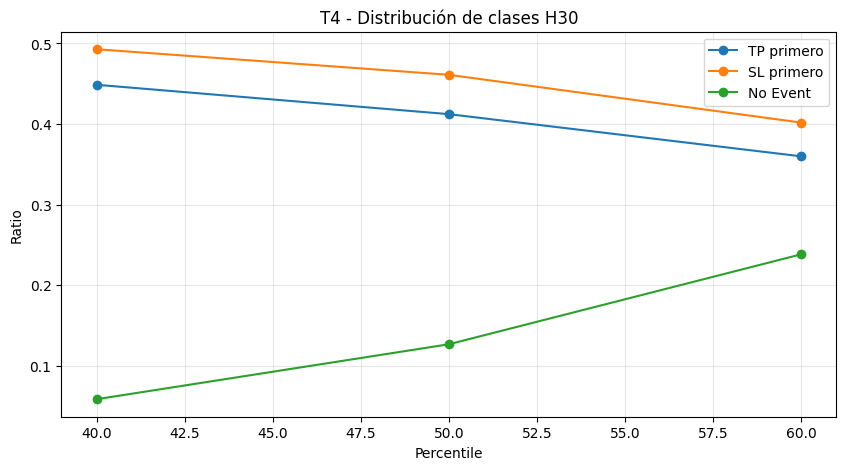

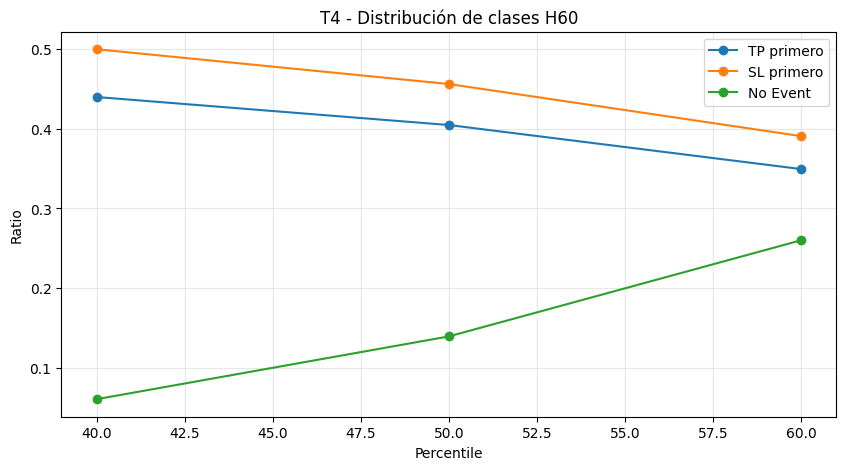

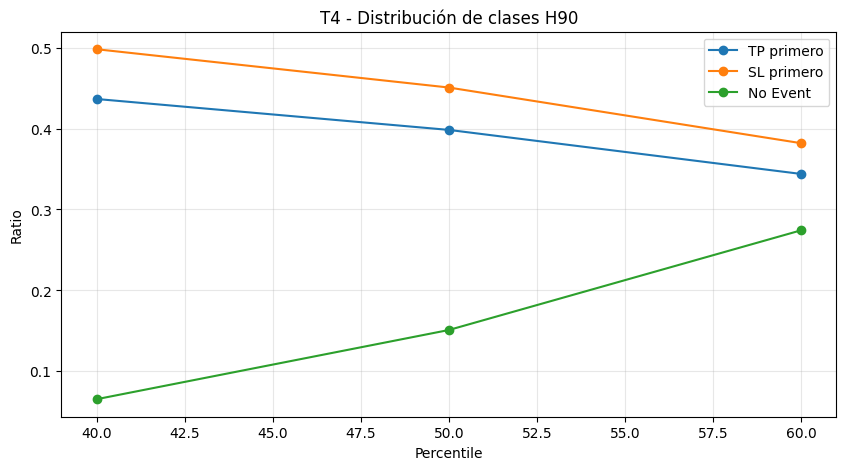

## Balance TP vs SL - T4

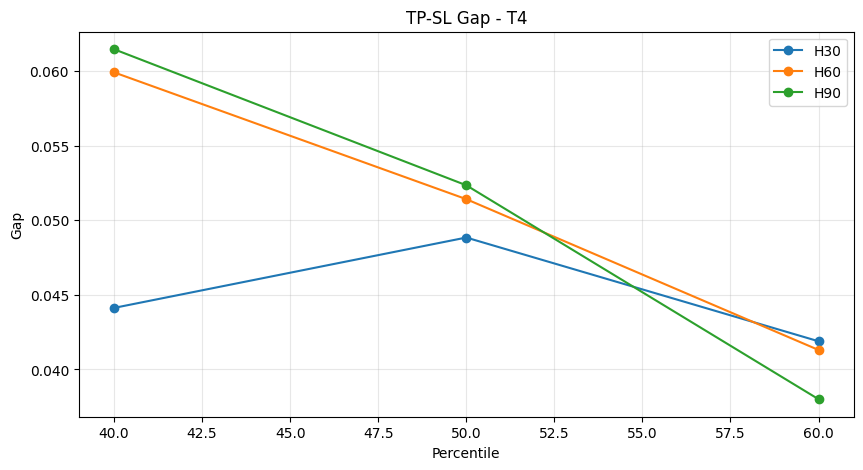

In [62]:
# =========================================================
# 6.2 Distribución de clases - T4
# =========================================================

import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

t4_distribution_rows = []

for col in t4_cols:

    valid_data = df_t4[col].dropna()

    counts = (
        valid_data
        .value_counts()
        .sort_index()
    )

    ratios = (
        valid_data
        .value_counts(normalize=True)
        .sort_index()
    )

    parts = col.split("_")

    percentile = int(parts[1].replace("p", ""))
    horizon = int(parts[2].replace("h", ""))

    t4_distribution_rows.append({

        "target": col,
        "horizon": horizon,
        "percentile": percentile,

        "valid_rows": len(valid_data),

        "class_-1_count": counts.get(-1, 0),
        "class_0_count": counts.get(0, 0),
        "class_1_count": counts.get(1, 0),

        "class_-1_ratio": ratios.get(-1, 0),
        "class_0_ratio": ratios.get(0, 0),
        "class_1_ratio": ratios.get(1, 0),

        "event_ratio": (
            ratios.get(-1, 0)
            + ratios.get(1, 0)
        ),

        "no_event_ratio": ratios.get(0, 0),

        "tp_sl_gap": abs(
            ratios.get(1, 0)
            - ratios.get(-1, 0)
        )
    })

df_t4_class_distribution = pd.DataFrame(
    t4_distribution_rows
)

display(Markdown("## Distribución de clases - T4"))
display(df_t4_class_distribution)

# =========================================================
# Resumen compacto
# =========================================================

summary_t4_distribution = (
    df_t4_class_distribution[
        [
            "target",
            "horizon",
            "percentile",
            "class_-1_ratio",
            "class_0_ratio",
            "class_1_ratio",
            "event_ratio",
            "no_event_ratio",
            "tp_sl_gap"
        ]
    ]
)

display(Markdown("## Resumen compacto de distribución - T4"))
display(summary_t4_distribution)

# =========================================================
# Evolución de clases por percentil
# =========================================================

display(Markdown("## Distribución de clases según percentil - T4"))

for H in sorted(summary_t4_distribution["horizon"].unique()):

    temp = summary_t4_distribution[
        summary_t4_distribution["horizon"] == H
    ]

    plt.figure(figsize=(10,5))

    plt.plot(
        temp["percentile"],
        temp["class_1_ratio"],
        marker="o",
        label="TP primero"
    )

    plt.plot(
        temp["percentile"],
        temp["class_-1_ratio"],
        marker="o",
        label="SL primero"
    )

    plt.plot(
        temp["percentile"],
        temp["class_0_ratio"],
        marker="o",
        label="No Event"
    )

    plt.title(
        f"T4 - Distribución de clases H{H}"
    )

    plt.xlabel("Percentile")
    plt.ylabel("Ratio")

    plt.grid(alpha=0.3)
    plt.legend()

    plt.show()

# =========================================================
# Balance TP vs SL
# =========================================================

display(Markdown("## Balance TP vs SL - T4"))

plt.figure(figsize=(10,5))

for H in sorted(summary_t4_distribution["horizon"].unique()):

    temp = summary_t4_distribution[
        summary_t4_distribution["horizon"] == H
    ]

    plt.plot(
        temp["percentile"],
        temp["tp_sl_gap"],
        marker="o",
        label=f"H{H}"
    )

plt.title("TP-SL Gap - T4")

plt.xlabel("Percentile")
plt.ylabel("Gap")

plt.grid(alpha=0.3)
plt.legend()

plt.show()


Con este bloque obtendrás exactamente la misma estructura metodológica que utilizaste para:

* T2 → distribución de clases ternaria.
* T3 → distribución de clases binaria.

y luego podremos redactar las observaciones del punto 6.2 a partir de las tablas y gráficos obtenidos.


#### **Observaciones sobre la distribución de clases de T4**



* En todas las configuraciones, las clases **TP primero** y **SL primero** concentran la mayor parte de las observaciones. La clase **No Event** representa una fracción significativamente menor del dataset.

* Existe una ligera predominancia de la clase **SL primero** sobre **TP primero** en todos los horizontes y percentiles. Esta diferencia es relativamente pequeña, con valores de `tp_sl_gap` entre aproximadamente 4% y 6%.

* El balance entre TP y SL es considerablemente mejor que el observado en T3. Ninguna de las dos clases domina claramente al target, lo que resulta favorable para futuros modelos de clasificación.

* A medida que aumenta el percentil (P40 → P50 → P60), la proporción de eventos TP y SL disminuye gradualmente, mientras que la clase **No Event** aumenta de forma consistente.

* Este comportamiento es esperado porque las barreras se vuelven más amplias al aumentar el percentil, haciendo más difícil que el precio alcance TP o SL dentro del horizonte disponible.

* Para H30, la clase No Event pasa de aproximadamente 6% en P40 a casi 24% en P60.

* Para H60, la clase No Event crece desde aproximadamente 6% hasta 26%.

* Para H90, la clase No Event aumenta desde aproximadamente 7% hasta 27%.

* Incluso en la configuración más exigente (H90-P60), más del 72% de las observaciones siguen correspondiendo a eventos TP o SL, por lo que el target mantiene una elevada cantidad de ejemplos operativos.

**Observaciones sobre el efecto del horizonte**

* El horizonte tiene un impacto menor que el percentil sobre la distribución de clases.

* Las diferencias entre H30, H60 y H90 son relativamente reducidas para un mismo percentil.

* Esto indica que la amplitud de las barreras es el principal factor que determina la composición del target, mientras que el horizonte actúa como un ajuste secundario.

**Observaciones sobre el balance TP vs SL**

* El gráfico **TP-SL Gap** muestra que la diferencia entre eventos positivos y negativos permanece siempre reducida.

* En todas las configuraciones el gap se mantiene por debajo de 6.2%.

* El mejor equilibrio se observa en:

  * H90-P60 → gap ≈ 3.8%
  * H60-P60 → gap ≈ 4.1%
  * H30-P60 → gap ≈ 4.2%

* Esto sugiere que los percentiles más altos producen targets más balanceados entre TP y SL.

**Conclusión**

La distribución de clases de T4 presenta una estructura estadísticamente saludable para tareas de clasificación. Las clases TP y SL se encuentran relativamente equilibradas, la proporción de eventos continúa siendo elevada incluso con barreras amplias y el crecimiento de la clase No Event sigue una lógica consistente con la construcción del target. En conjunto, T4 muestra un balance de clases más favorable que T3 y una alineación más directa con la lógica operativa de trading basada en eventos de ejecución.


### **6.3 Frecuencia operativa**


Mientras que la sección anterior analizó la distribución de las clases generadas por T4, en esta etapa se estudia la frecuencia con la que aparecen eventos operables dentro del dataset.

Desde una perspectiva de trading, no todas las observaciones poseen el mismo valor operativo. Un target puede estar bien balanceado estadísticamente, pero generar muy pocas oportunidades de ejecución. Del mismo modo, puede producir una gran cantidad de eventos a costa de reducir la calidad de las señales.

En el caso de T4, la frecuencia operativa está directamente asociada a la probabilidad de que el precio alcance alguna de las barreras definidas dentro del horizonte futuro.

Por este motivo se analizarán:

* frecuencia total de eventos (TP o SL);
* frecuencia de observaciones sin evento;
* impacto del horizonte;
* impacto del percentil;
* estabilidad de la frecuencia operativa entre configuraciones.

#### **6.3.1. Event rate vs No Event rate**


In [63]:
# ==========================================================
# 6.3.1 Event rate vs No Event rate - T4
# ==========================================================

import pandas as pd
import matplotlib.pyplot as plt

event_rate_rows = []

for _, row in df_t4_class_distribution.iterrows():

    event_rate_rows.append({
        "target": row["target"],
        "horizon": row["horizon"],
        "percentile": row["percentile"],
        "event_rate": row["event_ratio"],
        "no_event_rate": row["no_event_ratio"]
    })

df_t4_event_rate = pd.DataFrame(event_rate_rows)

display(df_t4_event_rate)

,target,horizon,percentile,event_rate,no_event_rate
0,t4_p40_h30,30,40,0.941594,0.058406
1,t4_p50_h30,30,50,0.873392,0.126608
2,t4_p60_h30,30,60,0.761771,0.238229
3,t4_p40_h60,60,40,0.939322,0.060678
4,t4_p50_h60,60,50,0.860573,0.139427
5,t4_p60_h60,60,60,0.739978,0.260022
6,t4_p40_h90,90,40,0.934425,0.065575
7,t4_p50_h90,90,50,0.848930,0.151070
8,t4_p60_h90,90,60,0.725768,0.274232


##### **Evolución por percentil**


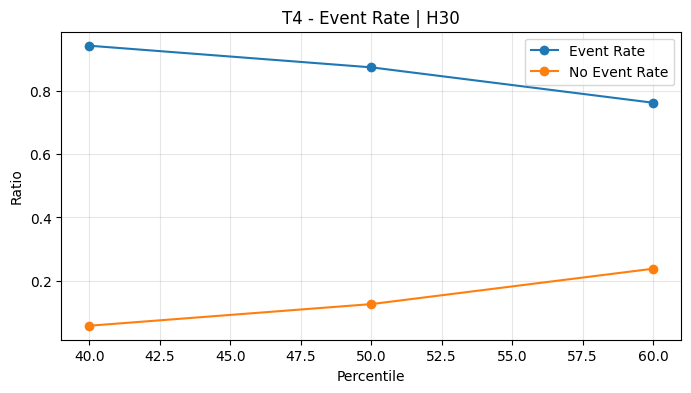

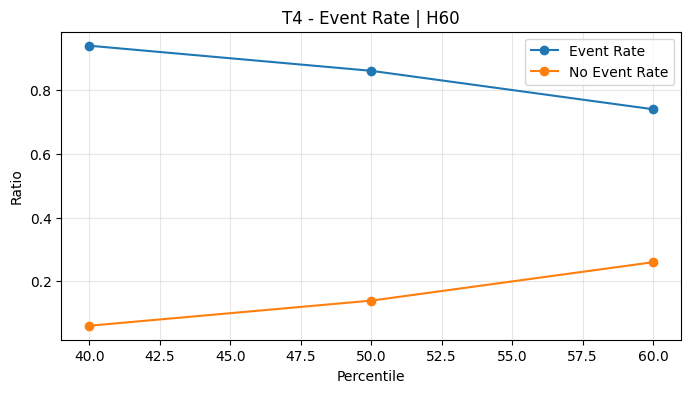

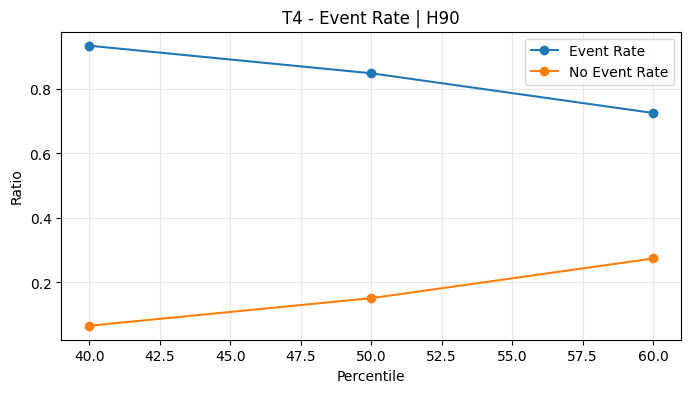

In [64]:
# ==========================================================
# Event Rate por percentil
# ==========================================================

for H in sorted(df_t4_event_rate["horizon"].unique()):

    temp = df_t4_event_rate[
        df_t4_event_rate["horizon"] == H
    ]

    plt.figure(figsize=(8,4))

    plt.plot(
        temp["percentile"],
        temp["event_rate"],
        marker="o",
        label="Event Rate"
    )

    plt.plot(
        temp["percentile"],
        temp["no_event_rate"],
        marker="o",
        label="No Event Rate"
    )

    plt.title(f"T4 - Event Rate | H{H}")
    plt.xlabel("Percentile")
    plt.ylabel("Ratio")
    plt.grid(alpha=0.3)
    plt.legend()

    plt.show()

##### **Heatmap de frecuencia operativa**

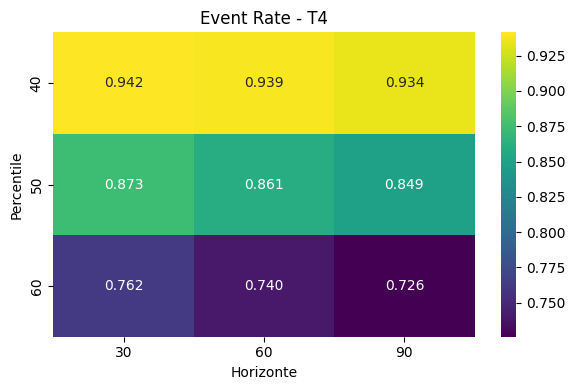

In [65]:
# ==========================================================
# Heatmap Event Rate
# ==========================================================

import seaborn as sns

pivot_event = (
    df_t4_event_rate
    .pivot(
        index="percentile",
        columns="horizon",
        values="event_rate"
    )
    .sort_index()
)

plt.figure(figsize=(6,4))

sns.heatmap(
    pivot_event,
    annot=True,
    fmt=".3f",
    cmap="viridis"
)

plt.title("Event Rate - T4")
plt.xlabel("Horizonte")
plt.ylabel("Percentile")

plt.tight_layout()
plt.show()

##### **Resumen operativo**

In [66]:
# ==========================================================
# Resumen operativo
# ==========================================================

event_summary_t4 = (
    df_t4_event_rate
    .groupby(
        ["horizon", "percentile"],
        as_index=False
    )
    .agg(
        event_rate=("event_rate", "mean"),
        no_event_rate=("no_event_rate", "mean")
    )
)

display(event_summary_t4)

,horizon,percentile,event_rate,no_event_rate
0,30,40,0.941594,0.058406
1,30,50,0.873392,0.126608
2,30,60,0.761771,0.238229
3,60,40,0.939322,0.060678
4,60,50,0.860573,0.139427
5,60,60,0.739978,0.260022
6,90,40,0.934425,0.065575
7,90,50,0.848930,0.151070
8,90,60,0.725768,0.274232


Con esto obtenemos exactamente el equivalente al análisis de **trade rate / no trade rate** realizado en T3, pero adaptado a la lógica de T4:

* **Event Rate** = TP + SL
* **No Event Rate** = clase 0

Luego podremos redactar las observaciones del punto 6.3 a partir de los resultados y gráficos generados.


##### **Observaciones sobre la frecuencia operativa de T4**



* T4 presenta una frecuencia operativa muy elevada en todas las configuraciones analizadas.

* Incluso en el escenario más exigente (**H90-P60**), aproximadamente el **72.6%** de las observaciones alcanzan alguna barrera (TP o SL), mientras que solo el **27.4%** permanecen como No Event.

* El principal factor que afecta la frecuencia operativa es el **percentil**.

  * P40 genera entre **93% y 94%** de eventos.
  * P50 genera entre **85% y 87%** de eventos.
  * P60 genera entre **72% y 76%** de eventos.

* A medida que aumenta el percentil, las barreras se vuelven más amplias y resulta más difícil que el precio alcance TP o SL dentro del horizonte disponible. Como consecuencia, aumenta progresivamente la proporción de observaciones No Event.

* El efecto del horizonte es mucho más reducido que el efecto del percentil.

  Por ejemplo:

  * P40:

    * H30 → 94.2%
    * H60 → 93.9%
    * H90 → 93.4%

  * P50:

    * H30 → 87.3%
    * H60 → 86.1%
    * H90 → 84.9%

  * P60:

    * H30 → 76.2%
    * H60 → 74.0%
    * H90 → 72.6%

* El heatmap confirma que la frecuencia operativa disminuye gradualmente tanto al aumentar el percentil como al aumentar el horizonte, aunque la caída asociada al percentil es claramente más pronunciada.

**Comparación con T3**

* T4 genera una cantidad de señales operativas considerablemente superior a T3.

* Mientras que en T3 las configuraciones más exigentes podían reducir significativamente el número de trades válidos, en T4 la gran mayoría de las observaciones terminan resolviéndose mediante alguna barrera.

* Esto implica que T4 aprovecha una porción mucho mayor del dataset disponible para entrenamiento.

**Conclusión**

La frecuencia operativa de T4 es una de sus principales fortalezas. La mayoría de las observaciones terminan produciendo un evento TP o SL, incluso bajo configuraciones conservadoras. El percentil actúa como el principal mecanismo de control de la selectividad del target, mientras que el horizonte tiene una influencia secundaria. En conjunto, T4 ofrece una elevada densidad de eventos operativos y una utilización muy eficiente de la información disponible en el mercado.


#### **6.3.2. Sensibilidad parametrica**

Una vez analizada la frecuencia operativa global de T4, resulta conveniente estudiar cómo varía dicha frecuencia al modificar los parámetros utilizados durante la construcción del target.

En particular, interesa comprender el efecto de:

* horizonte futuro (H30, H60 y H90);
* percentil utilizado para definir las barreras (P40, P50 y P60).

Este análisis permite cuantificar el impacto de cada parámetro sobre la cantidad de eventos observados y sobre la proporción de observaciones que permanecen sin alcanzar ninguna barrera.

El objetivo es identificar qué parámetro ejerce la mayor influencia sobre la frecuencia operativa del target.

##### **Sensibilidad del Event Rate**

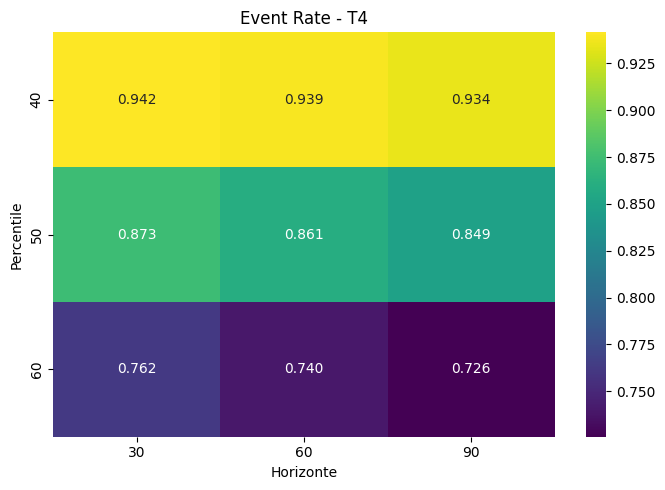

In [69]:
# ==========================================================
# 6.3.2 Sensibilidad paramétrica - T4
# ==========================================================

import seaborn as sns
import matplotlib.pyplot as plt

df = df_t4_event_rate.copy()

# ==========================================================
# Heatmap Event Rate
# ==========================================================

pivot_event = (
    df
    .pivot(
        index="percentile",
        columns="horizon",
        values="event_rate"
    )
    .sort_index()
)

plt.figure(figsize=(7,5))

sns.heatmap(
    pivot_event,
    annot=True,
    fmt=".3f",
    cmap="viridis"
)

plt.title("Event Rate - T4")
plt.xlabel("Horizonte")
plt.ylabel("Percentile")

plt.tight_layout()
plt.show()

##### **Sensibilidad del No Event Rate**

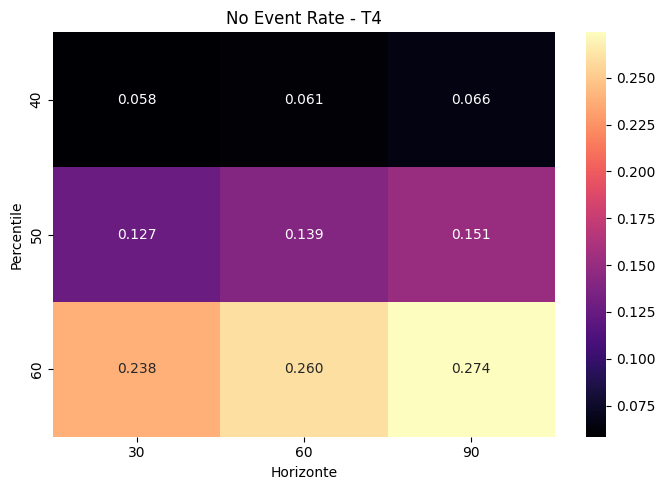

In [70]:
# ==========================================================
# Heatmap No Event Rate
# ==========================================================

pivot_no_event = (
    df
    .pivot(
        index="percentile",
        columns="horizon",
        values="no_event_rate"
    )
    .sort_index()
)

plt.figure(figsize=(7,5))

sns.heatmap(
    pivot_no_event,
    annot=True,
    fmt=".3f",
    cmap="magma"
)

plt.title("No Event Rate - T4")
plt.xlabel("Horizonte")
plt.ylabel("Percentile")

plt.tight_layout()
plt.show()

##### **Evolución del Event Rate por percentil**


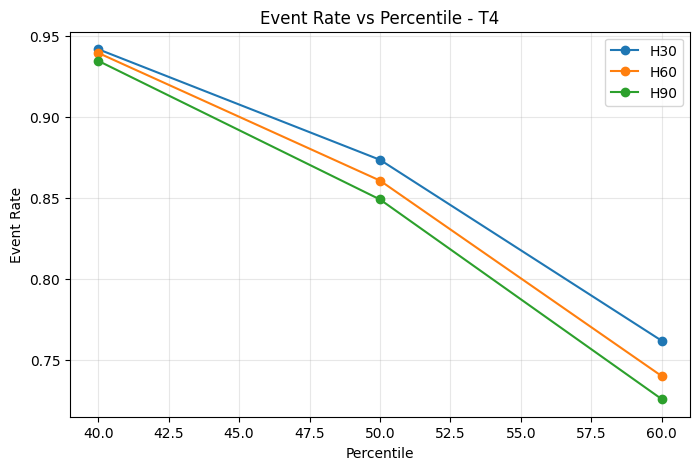

In [71]:
# ==========================================================
# Evolución paramétrica del Event Rate
# ==========================================================

plt.figure(figsize=(8,5))

for horizon in sorted(df["horizon"].unique()):

    temp = df[
        df["horizon"] == horizon
    ]

    plt.plot(
        temp["percentile"],
        temp["event_rate"],
        marker="o",
        label=f"H{horizon}"
    )

plt.title("Event Rate vs Percentile - T4")
plt.xlabel("Percentile")
plt.ylabel("Event Rate")

plt.grid(alpha=0.3)
plt.legend()

plt.show()

##### **Evolución del No Event Rate por percentil**


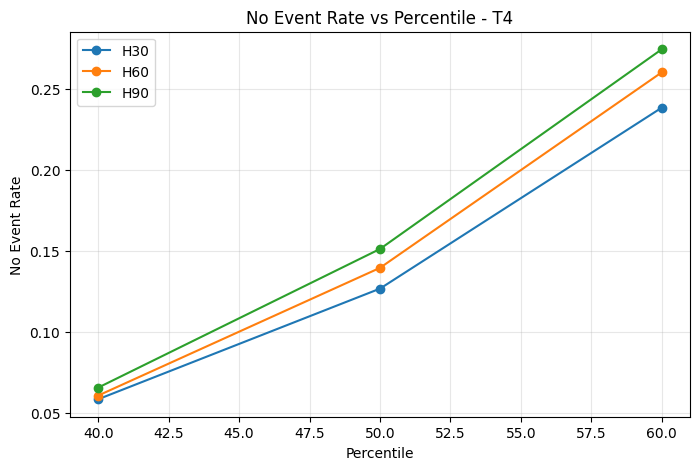

In [72]:
# ==========================================================
# Evolución paramétrica del No Event Rate
# ==========================================================

plt.figure(figsize=(8,5))

for horizon in sorted(df["horizon"].unique()):

    temp = df[
        df["horizon"] == horizon
    ]

    plt.plot(
        temp["percentile"],
        temp["no_event_rate"],
        marker="o",
        label=f"H{horizon}"
    )

plt.title("No Event Rate vs Percentile - T4")
plt.xlabel("Percentile")
plt.ylabel("No Event Rate")

plt.grid(alpha=0.3)
plt.legend()

plt.show()

##### **Resumen de sensibilidad paramétrica**

In [73]:
# ==========================================================
# Resumen sensibilidad paramétrica
# ==========================================================

sensitivity_t4 = (
    df[
        [
            "horizon",
            "percentile",
            "event_rate",
            "no_event_rate"
        ]
    ]
    .sort_values(
        ["horizon", "percentile"]
    )
    .reset_index(drop=True)
)

display(sensitivity_t4)

,horizon,percentile,event_rate,no_event_rate
0,30,40,0.941594,0.058406
1,30,50,0.873392,0.126608
2,30,60,0.761771,0.238229
3,60,40,0.939322,0.060678
4,60,50,0.860573,0.139427
5,60,60,0.739978,0.260022
6,90,40,0.934425,0.065575
7,90,50,0.848930,0.151070
8,90,60,0.725768,0.274232


**Objetivo del análisis**

Al igual que en T3, este apartado permitirá responder las siguientes preguntas:

* ¿Qué parámetro tiene mayor impacto sobre la frecuencia operativa?
* ¿La reducción de eventos proviene principalmente del horizonte o del percentil?
* ¿Qué configuraciones producen la mayor cantidad de eventos?
* ¿Qué configuraciones generan una mayor proporción de observaciones neutrales?

Posteriormente, en el punto **6.3.3 Observaciones e interpretación**, se analizarán los resultados obtenidos y se identificarán las configuraciones más relevantes desde el punto de vista operativo.


#### **6.3.3. Observaciones e interpretación**



Los resultados muestran que la frecuencia operativa de T4 está fuertemente determinada por el percentil utilizado para construir las barreras, mientras que el horizonte tiene una influencia considerablemente menor.

A medida que aumenta el percentil, las barreras se alejan progresivamente del precio de entrada, lo que reduce la probabilidad de que el mercado alcance alguna de ellas dentro del horizonte disponible. Como consecuencia, disminuye el porcentaje de eventos observados y aumenta la proporción de casos clasificados como "No Event".

Para el percentil 40, la frecuencia operativa es extremadamente elevada. Entre el 93% y el 94% de las observaciones alcanzan alguna barrera, independientemente del horizonte utilizado. Esto implica que prácticamente todas las muestras generan un evento válido de TP o SL.

En el percentil 50 la frecuencia operativa continúa siendo alta, aunque se observa una reducción moderada. El Event Rate se ubica entre 84% y 87%, mientras que la proporción de No Event aumenta hasta aproximadamente 13%-15%.

El cambio más significativo aparece en el percentil 60. En este caso el Event Rate cae hasta valores comprendidos entre 72% y 76%, mientras que los casos sin evento aumentan hasta aproximadamente 24%-27%. Esto indica que una fracción importante del mercado ya no alcanza ninguna de las barreras dentro del horizonte considerado.

El horizonte también afecta la frecuencia operativa, aunque con una magnitud menor. Para un mismo percentil, al pasar de H30 a H90 se observa una reducción gradual del Event Rate. Por ejemplo:

* P40: 94.2% → 93.4%
* P50: 87.3% → 84.9%
* P60: 76.2% → 72.6%

La disminución existe, pero resulta mucho menos pronunciada que la generada por el cambio de percentil.

Desde una perspectiva práctica, el percentil actúa como el principal regulador de la cantidad de eventos disponibles para entrenamiento:

* Percentiles bajos generan una gran cantidad de eventos.
* Percentiles altos generan menos eventos pero exigen movimientos de mayor magnitud.
* El horizonte modifica la frecuencia operativa de forma secundaria.

En términos de diseño experimental, T4 presenta una característica especialmente favorable: incluso en la configuración más exigente (P60-H90), más del 72% de las observaciones siguen generando un evento válido. Esto implica que la pérdida de muestras es relativamente baja y que el target conserva una elevada densidad de información para entrenamiento.

Como conclusión, el análisis de sensibilidad paramétrica muestra que el percentil es el parámetro dominante en la construcción de T4, mientras que el horizonte introduce ajustes más finos sobre la frecuencia operativa. Esta propiedad proporciona un mecanismo simple y controlable para regular el equilibrio entre cantidad de eventos y exigencia del movimiento requerido para activar las barreras.


### **6.4. Estabilidad Temporal**


Una vez analizada la distribución global de clases y la sensibilidad de los parámetros operativos, resulta necesario estudiar la estabilidad temporal de los targets T4.

El objetivo de esta etapa es verificar si la frecuencia de eventos, la distribución entre Take Profit y Stop Loss, y la presencia de observaciones sin evento permanecen relativamente constantes a lo largo del tiempo o si presentan cambios estructurales importantes.

La estabilidad temporal es una propiedad deseable porque permite entrenar modelos sobre patrones que continúan siendo representativos en distintos períodos de mercado.

En el caso de T4, además, este análisis permite identificar si determinadas configuraciones generan targets excesivamente dependientes del régimen de volatilidad vigente.

#### **6.4.1 Distribución temporal de clases**

En primer lugar se analiza cómo evoluciona la proporción de las tres clases del target a lo largo del tiempo:

- TP alcanzado primero (1)
- SL alcanzado primero (-1)
- No Event (0)

Para ello se calcula la distribución mensual de clases para cada configuración de horizonte y percentil.

## Distribución temporal de clases - T4

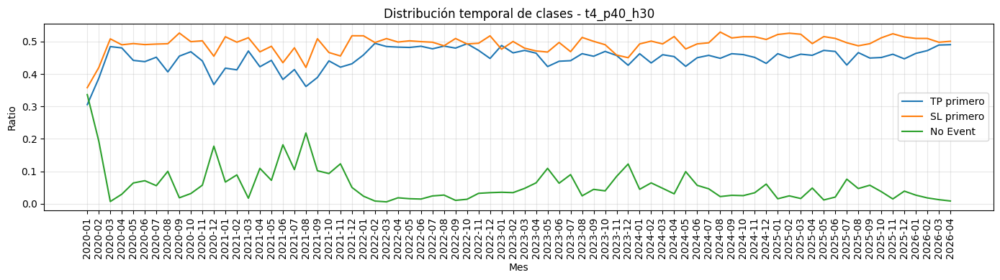

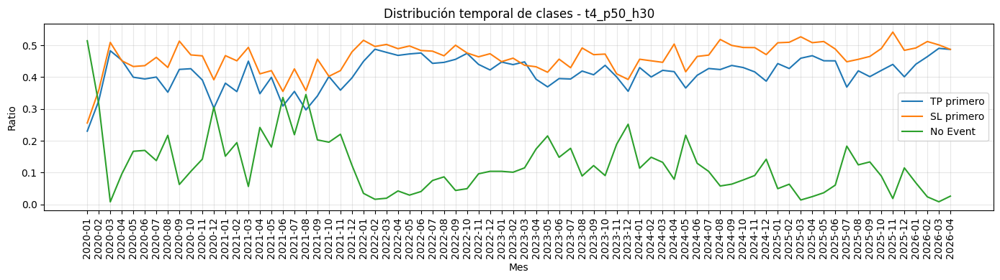

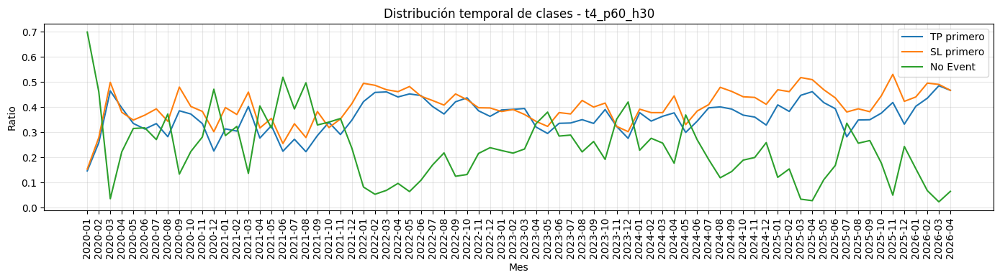

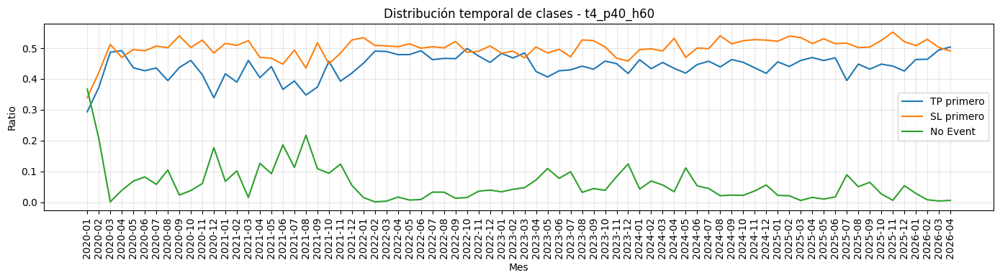

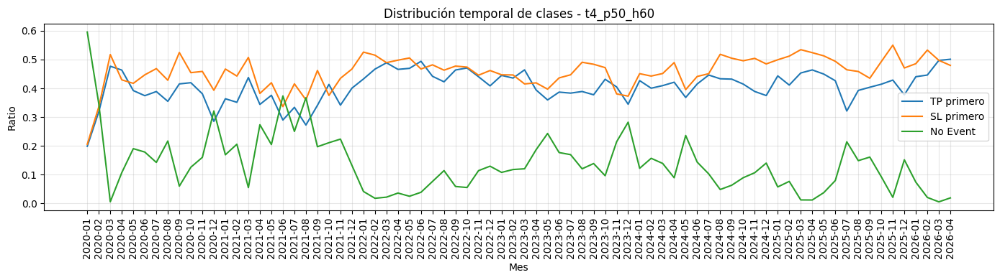

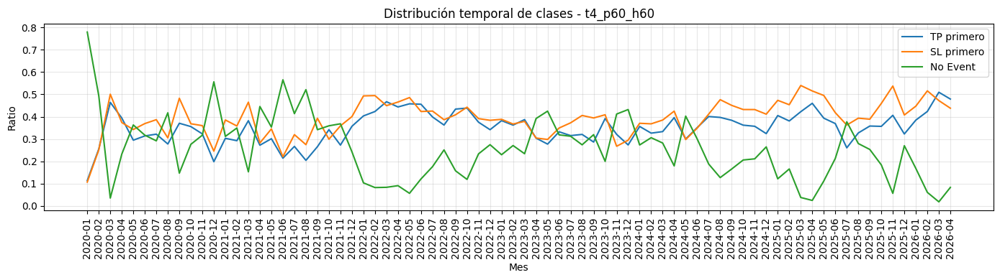

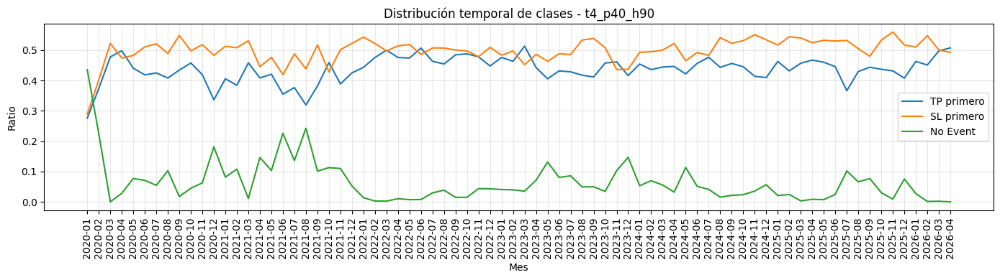

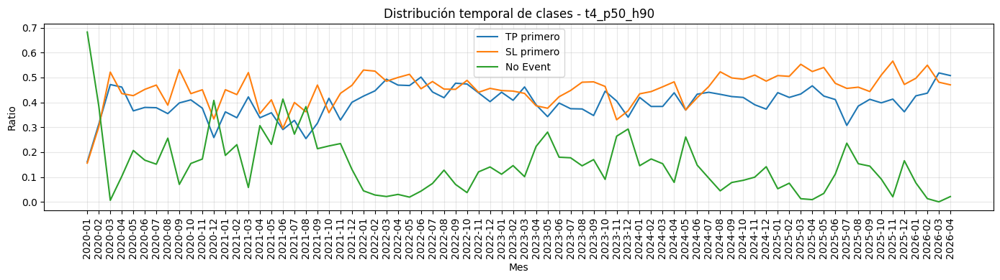

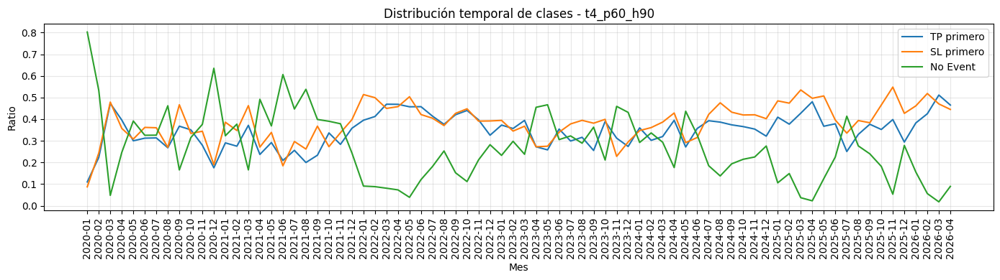

## Tabla temporal de distribución - T4

,month,class_-1_ratio,class_0_ratio,class_1_ratio,target,horizon,percentile,event_rate,no_event_rate
0,2020-01,0.357934,0.336497,0.305569,t4_p40_h30,30,40,0.663503,0.336497
1,2020-02,0.420003,0.193216,0.386781,t4_p40_h30,30,40,0.806784,0.193216
2,2020-03,0.508543,0.006763,0.484694,t4_p40_h30,30,40,0.993237,0.006763
3,2020-04,0.490199,0.029236,0.480565,t4_p40_h30,30,40,0.970764,0.029236
4,2020-05,0.493937,0.063953,0.442110,t4_p40_h30,30,40,0.936047,0.063953


In [79]:
# ==========================================================
# 6.4 Estabilidad temporal - T4
# ==========================================================

import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

# Copia de trabajo desde df_t4, no desde mnq_intraday
df_t4_time = df_t4.copy()

df_t4_time["date"] = pd.to_datetime(df_t4_time["date"])
df_t4_time["month"] = df_t4_time["date"].dt.to_period("M").astype(str)

targets_t4 = t4_cols.copy()

# ==========================================================
# 6.4.1 Distribución temporal de clases - T4
# ==========================================================

display(Markdown("## Distribución temporal de clases - T4"))

t4_temporal_distribution_rows = []

for target in targets_t4:

    parts = target.split("_")
    percentile = int(parts[1].replace("p", ""))
    horizon = int(parts[2].replace("h", ""))

    tmp = df_t4_time[["month", target]].dropna().copy()

    monthly = (
        tmp
        .groupby("month")[target]
        .value_counts(normalize=True)
        .unstack(fill_value=0)
        .reset_index()
    )

    for cls in [-1, 0, 1]:
        if cls not in monthly.columns:
            monthly[cls] = 0.0

    monthly["target"] = target
    monthly["horizon"] = horizon
    monthly["percentile"] = percentile

    monthly = monthly.rename(
        columns={
            -1: "class_-1_ratio",
            0: "class_0_ratio",
            1: "class_1_ratio"
        }
    )

    monthly["event_rate"] = (
        monthly["class_-1_ratio"] +
        monthly["class_1_ratio"]
    )

    monthly["no_event_rate"] = monthly["class_0_ratio"]

    t4_temporal_distribution_rows.append(monthly)

    plt.figure(figsize=(14, 4))

    plt.plot(
        monthly["month"],
        monthly["class_1_ratio"],
        label="TP primero"
    )

    plt.plot(
        monthly["month"],
        monthly["class_-1_ratio"],
        label="SL primero"
    )

    plt.plot(
        monthly["month"],
        monthly["class_0_ratio"],
        label="No Event"
    )

    plt.title(f"Distribución temporal de clases - {target}")
    plt.xlabel("Mes")
    plt.ylabel("Ratio")

    plt.xticks(rotation=90)
    plt.grid(alpha=0.3)
    plt.legend()

    plt.tight_layout()
    plt.show()

df_t4_temporal_distribution = pd.concat(
    t4_temporal_distribution_rows,
    ignore_index=True
)

display(Markdown("## Tabla temporal de distribución - T4"))
display(df_t4_temporal_distribution.head())



##### **Observaciones preliminares sobre la distribución temporal de clases de T4**

* La distribución de clases muestra una estructura relativamente estable a lo largo del tiempo, especialmente a partir de 2022.

* En prácticamente todos los targets, las clases **TP primero (1)** y **SL primero (-1)** se mantienen como las clases dominantes, mientras que la clase **No Event (0)** representa una proporción menor de observaciones.

* Se observa una mayor variabilidad durante los primeros meses de 2020, probablemente asociada al menor tamaño muestral disponible al inicio de la serie y al fuerte régimen de volatilidad de ese período.

* A medida que aumenta el percentil (P40 → P50 → P60), la frecuencia de la clase **No Event** aumenta de forma visible en todos los horizontes, coherentemente con el uso de barreras más amplias.

* Las configuraciones P40 presentan una proporción muy baja y estable de observaciones sin evento, mientras que en P60 la participación de esta clase se vuelve significativamente más relevante.

* La relación entre **TP primero** y **SL primero** permanece relativamente equilibrada durante todo el período analizado, sin observarse dominancia permanente de una de las dos clases.

* Los horizontes H30, H60 y H90 exhiben patrones temporales muy similares, lo que sugiere que la estructura básica del target T4 es robusta frente a cambios en el horizonte de evaluación.

* No se identifican cambios estructurales permanentes en la distribución de clases, lo que constituye una señal favorable para el posterior entrenamiento de modelos supervisados.

**Conclusión parcial**

Los targets T4 presentan una distribución temporal razonablemente estable durante todo el período analizado. La principal fuente de variación proviene del percentil utilizado para construir las barreras, mientras que el efecto del horizonte resulta considerablemente menor. En términos generales, la estructura de clases de T4 muestra un comportamiento consistente en el tiempo y no evidencia problemas evidentes de deriva temporal (target drift).


#### **6.4.2 Estabilidad temporal del Event Rate**

Además de observar las clases individualmente, resulta útil analizar la estabilidad temporal del Event Rate.

Recordemos que:

$$
Event\ Rate = P(T4 \neq 0)
$$

Esta métrica indica qué porcentaje de observaciones genera un evento válido (TP o SL).

Una configuración estable debería mantener valores relativamente consistentes a lo largo del tiempo.



## Event Rate temporal - T4

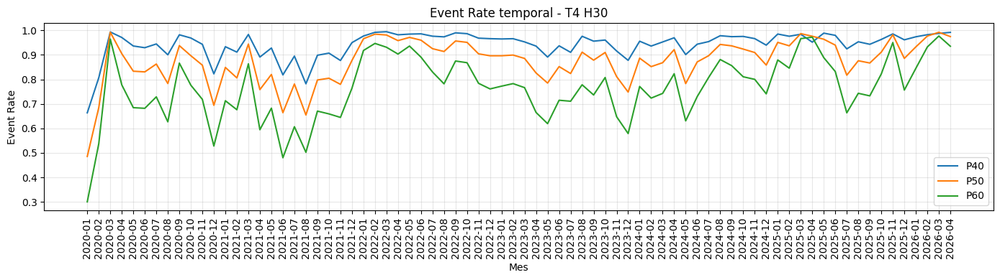

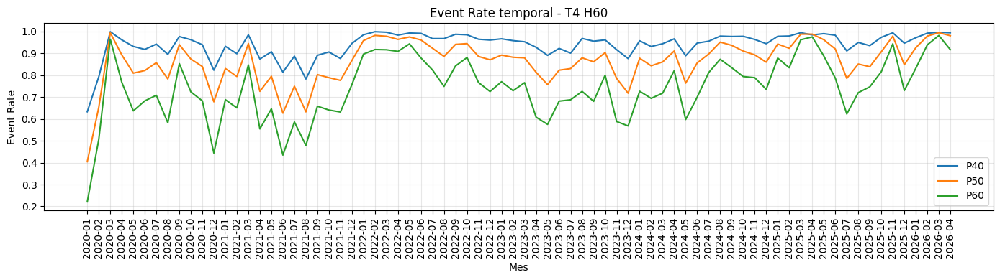

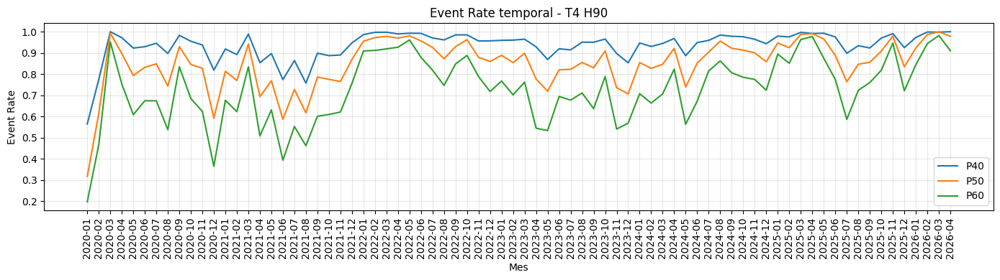

In [77]:
# ==========================================================
# 6.4.2 Event Rate temporal - T4
# ==========================================================

display(Markdown("## Event Rate temporal - T4"))

for H in sorted(df_t4_temporal_distribution["horizon"].unique()):

    plt.figure(figsize=(14, 4))

    temp_h = df_t4_temporal_distribution[
        df_t4_temporal_distribution["horizon"] == H
    ]

    for p in sorted(temp_h["percentile"].unique()):

        temp = temp_h[
            temp_h["percentile"] == p
        ]

        plt.plot(
            temp["month"],
            temp["event_rate"],
            label=f"P{p}"
        )

    plt.title(f"Event Rate temporal - T4 H{H}")
    plt.xlabel("Mes")
    plt.ylabel("Event Rate")

    plt.xticks(rotation=90)
    plt.grid(alpha=0.3)
    plt.legend()

    plt.tight_layout()
    plt.show()



##### **Observaciones**

* El comportamiento observado es consistente con el análisis de frecuencia operativa realizado anteriormente: los targets P40 presentan sistemáticamente los mayores Event Rate, mientras que P60 presenta los menores.

* A lo largo de todo el período 2020–2026, el orden entre percentiles se mantiene prácticamente inalterado:

$$
P40 > P50 > P60
$$

lo que indica una relación estable entre el tamaño de las barreras y la frecuencia de ocurrencia de eventos.

* Los targets P40 mantienen Event Rate muy elevados durante casi todo el período, generalmente por encima de 0.90 y frecuentemente cercanos a 1.0. Esto confirma que barreras relativamente pequeñas son alcanzadas por el precio en la gran mayoría de los casos.

* Los targets P50 presentan una reducción moderada del Event Rate, aunque continúan mostrando valores elevados y estables, normalmente entre 0.80 y 0.95.

* Los targets P60 exhiben mayor variabilidad temporal, con períodos donde el Event Rate cae significativamente. Este comportamiento es esperable debido a que las barreras son más amplias y requieren movimientos de mercado más extensos para generar un evento.

* Se observan fluctuaciones temporales asociadas a distintos regímenes de volatilidad del mercado. Durante algunos períodos el Event Rate aumenta simultáneamente para todos los percentiles, mientras que en otros disminuye. Sin embargo, estas variaciones afectan principalmente el nivel de la serie y no alteran su estructura general.

* No se identifican rupturas estructurales, cambios permanentes de comportamiento ni períodos prolongados donde el Event Rate colapse hacia valores bajos. Esto sugiere que la definición de T4 es robusta frente a distintos contextos de mercado.

**Conclusión**

El Event Rate de los targets T4 muestra una elevada estabilidad temporal durante todo el período analizado. La principal fuente de variación proviene del percentil seleccionado, mientras que los cambios en el entorno de mercado generan fluctuaciones moderadas pero no alteran la estructura general del target. En consecuencia, T4 conserva una frecuencia operativa consistente a lo largo del tiempo y no presenta evidencias de degradación estructural.


#### **6.4.3 Variabilidad temporal del Event Rate**

Finalmente se resume la estabilidad temporal mediante estadísticas descriptivas.

Un menor desvío estándar implica una frecuencia operativa más estable a lo largo del tiempo.

In [81]:
# ==========================================================
# 6.4.3 Variabilidad temporal del Event Rate - T4
# ==========================================================

from IPython.display import display, Markdown

df_t4_event_stability = (
    df_t4_temporal_distribution
    .groupby(
        ["target", "horizon", "percentile"],
        as_index=False
    )
    .agg(
        mean_event_rate=("event_rate", "mean"),
        std_event_rate=("event_rate", "std"),
        min_event_rate=("event_rate", "min"),
        max_event_rate=("event_rate", "max"),
    )
    .sort_values(
        ["horizon", "percentile"]
    )
    .reset_index(drop=True)
)

display(Markdown("## Variabilidad temporal del Event Rate - T4"))
display(df_t4_event_stability)

## Variabilidad temporal del Event Rate - T4

,target,horizon,percentile,mean_event_rate,std_event_rate,min_event_rate,max_event_rate
0,t4_p40_h30,30,40,0.942388,0.055413,0.663503,0.994262
1,t4_p50_h30,30,50,0.875058,0.091820,0.485683,0.992288
2,t4_p60_h30,30,60,0.764583,0.130204,0.300506,0.976744
3,t4_p40_h60,60,40,0.940259,0.059829,0.633049,0.998951
4,t4_p50_h60,60,50,0.862547,0.102415,0.404525,0.994352
5,t4_p60_h60,60,60,0.742759,0.143691,0.220930,0.981561
6,t4_p40_h90,90,40,0.935613,0.069101,0.564705,0.999644
7,t4_p50_h90,90,50,0.850868,0.117267,0.317671,0.999336
8,t4_p60_h90,90,60,0.728346,0.157977,0.197754,0.981728


##### **Observaciones**



* El Event Rate promedio disminuye de forma consistente al aumentar el percentil para todos los horizontes analizados.

* Los targets P40 presentan la mayor frecuencia operativa y también la mayor estabilidad temporal, con Event Rate promedio cercano a 0.94 y desvíos estándar inferiores a 0.07.

* Los targets P50 muestran una reducción moderada del Event Rate promedio, acompañado por un aumento de la variabilidad temporal.

* Los targets P60 exhiben los menores Event Rate promedio y la mayor volatilidad temporal. Esto indica una mayor sensibilidad a los cambios en las condiciones de mercado.

* Para un mismo percentil, la estabilidad disminuye levemente al aumentar el horizonte. Por ejemplo, el desvío estándar del Event Rate para P40 pasa de 0.055 en H30 a 0.069 en H90.

* El incremento de la variabilidad es más evidente en los percentiles altos. En P60 el desvío estándar aumenta desde 0.130 en H30 hasta 0.158 en H90.

* Los valores mínimos observados muestran que algunos períodos presentan una reducción importante en la frecuencia de eventos, especialmente para configuraciones más exigentes como P60-H90.

* A pesar de estas fluctuaciones, ninguna configuración muestra colapso permanente del Event Rate. Los máximos observados permanecen cercanos a 1.0 para todos los targets, indicando que existen períodos donde prácticamente todas las observaciones alcanzan alguna barrera.

**Conclusión**

La estabilidad temporal del Event Rate depende principalmente del percentil utilizado. Los targets basados en P40 presentan la mayor robustez y consistencia a lo largo del tiempo, mientras que los targets P60 son más sensibles a los cambios de volatilidad del mercado. El horizonte también influye en la estabilidad, aunque en menor medida que el tamaño de las barreras. En conjunto, los resultados sugieren que las configuraciones P40 y P50 ofrecen un mejor compromiso entre frecuencia operativa y estabilidad temporal.


#### **6.4.4 Observaciones e interpretación**

El análisis temporal muestra que los targets T4 mantienen una estructura relativamente estable a lo largo de todo el período analizado.

La distribución de clases conserva un comportamiento consistente en el tiempo, donde las clases correspondientes a eventos (TP primero y SL primero) continúan siendo predominantes, mientras que la clase No Event permanece minoritaria para la mayoría de las configuraciones.

El Event Rate exhibe una elevada persistencia temporal. Aunque se observan fluctuaciones asociadas a distintos entornos de volatilidad y dinámica de mercado, no se identifican cambios estructurales permanentes ni deterioros prolongados de la frecuencia operativa.

La principal fuente de variación proviene de la parametrización del target. A medida que aumenta el percentil utilizado para construir las barreras, disminuye la frecuencia de eventos y aumenta la variabilidad temporal observada. Este comportamiento es consistente con la lógica del método, ya que barreras más amplias requieren movimientos de precio más extremos para ser alcanzadas.

Los horizontes más largos también presentan una ligera reducción de estabilidad respecto a horizontes cortos, aunque este efecto resulta considerablemente menor que el producido por el cambio de percentil.

Las configuraciones basadas en percentiles P40 muestran los mayores niveles de estabilidad temporal, manteniendo Event Rate elevados y relativamente constantes durante todo el período. Por el contrario, las configuraciones P60 presentan una mayor sensibilidad a las condiciones de mercado y una variabilidad temporal más pronunciada.

En conjunto, los resultados sugieren que los targets T4 poseen una estructura temporal robusta y consistente, sin evidencias de degradación significativa a lo largo del tiempo. Esto constituye una característica favorable para etapas posteriores de modelado supervisado y validación fuera de muestra, ya que reduce el riesgo de que los patrones aprendidos dependan exclusivamente de un régimen de mercado específico.


### **6.5. Sensibilidad paramétrica - T4**


La sensibilidad paramétrica permite analizar cómo cambian las propiedades estadísticas del target T4 al modificar los parámetros utilizados para su construcción.

En este caso, los dos parámetros principales son:

* el horizonte temporal;
* el percentil utilizado para definir la distancia de las barreras.

El objetivo de esta sección consiste en evaluar cómo estas decisiones afectan:

* frecuencia de eventos;
* proporción de observaciones sin evento;
* balance entre TP y SL;
* distribución de clases;
* robustez del target frente a distintas configuraciones.

Un target robusto debería mostrar cambios graduales y explicables ante modificaciones de horizonte o percentil, evitando comportamientos erráticos o saltos bruscos en su estructura estadística.



#### **6.5.1 Bloque de código**


## Resumen de sensibilidad paramétrica - T4

,target,horizon,percentile,class_-1_ratio,class_0_ratio,class_1_ratio,event_ratio,no_event_ratio,tp_sl_gap
0,t4_p40_h30,30,40,0.492860,0.058406,0.448733,0.941594,0.058406,0.044127
1,t4_p50_h30,30,50,0.461120,0.126608,0.412272,0.873392,0.126608,0.048847
2,t4_p60_h30,30,60,0.401830,0.238229,0.359941,0.761771,0.238229,0.041889
3,t4_p40_h60,60,40,0.499624,0.060678,0.439697,0.939322,0.060678,0.059927
4,t4_p50_h60,60,50,0.455997,0.139427,0.404575,0.860573,0.139427,0.051422
5,t4_p60_h60,60,60,0.390642,0.260022,0.349336,0.739978,0.260022,0.041305
6,t4_p40_h90,90,40,0.497952,0.065575,0.436473,0.934425,0.065575,0.061479
7,t4_p50_h90,90,50,0.450641,0.151070,0.398289,0.848930,0.151070,0.052353
8,t4_p60_h90,90,60,0.381885,0.274232,0.343883,0.725768,0.274232,0.038002


## Heatmap Event Rate - T4

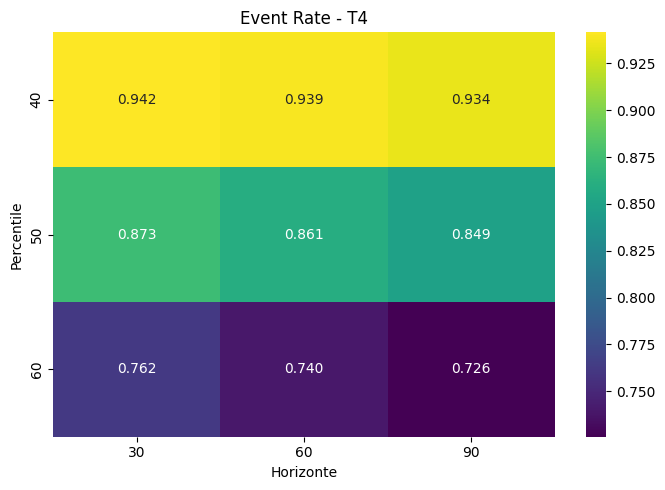

## Heatmap No Event Rate - T4

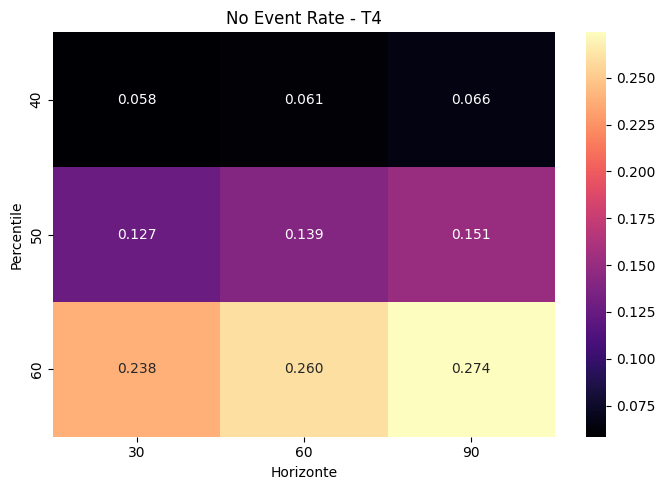

## Heatmap TP-SL Gap - T4

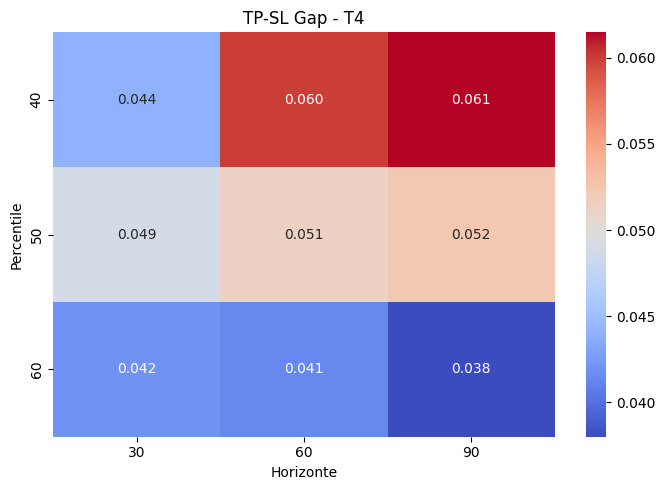

## Evolución paramétrica del Event Rate - T4

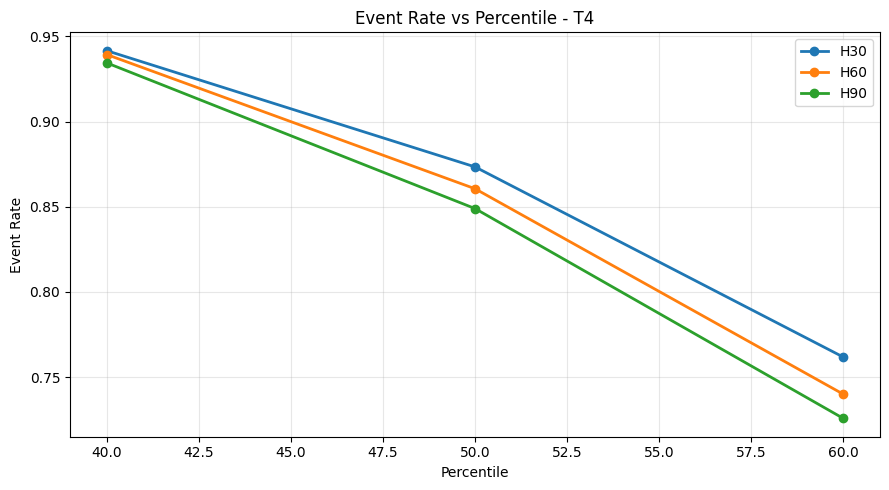

## Evolución paramétrica del No Event Rate - T4

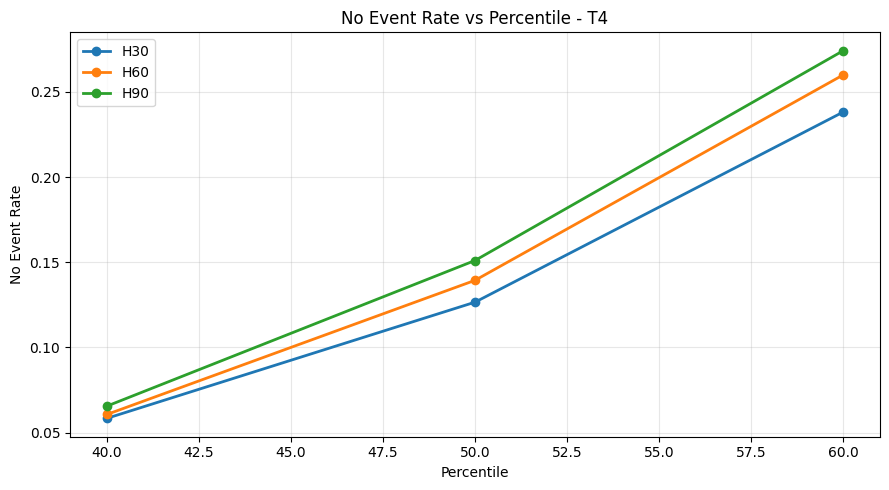

## Evolución paramétrica del balance TP-SL - T4

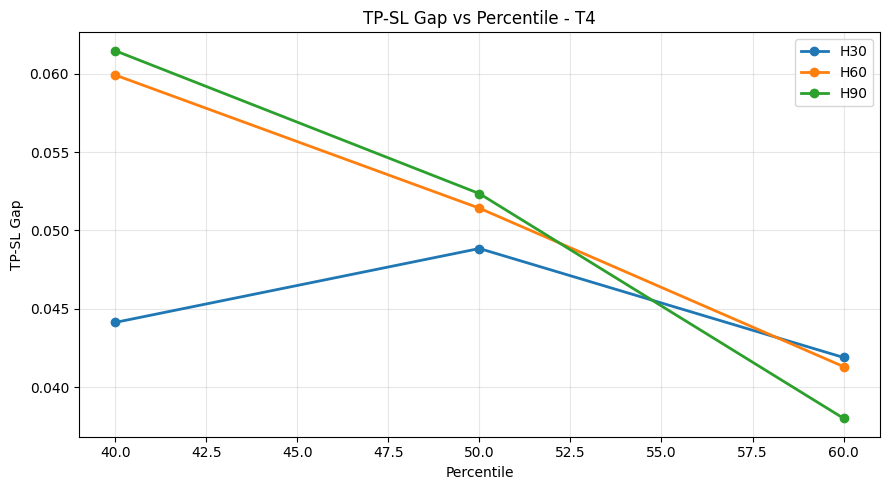

## Distribución de clases por configuración - T4

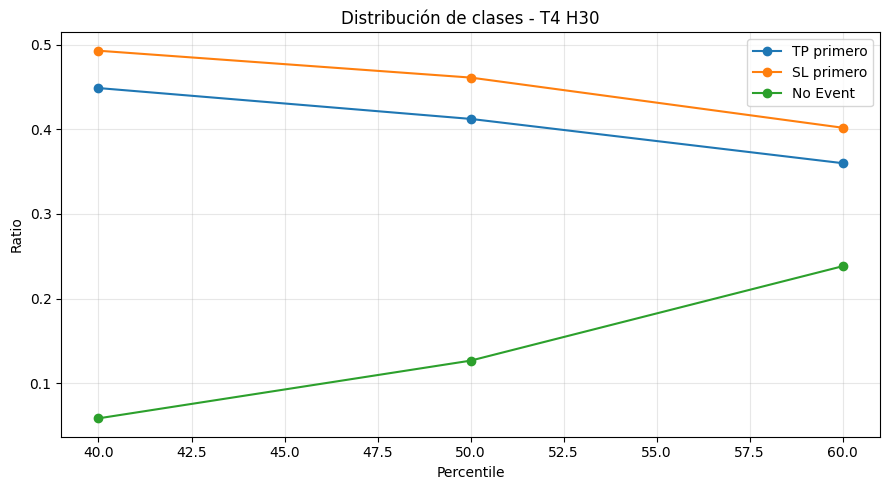

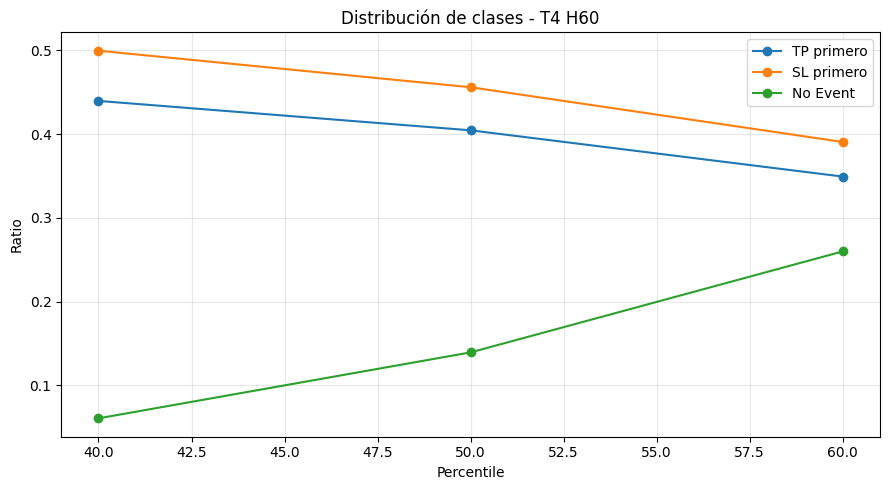

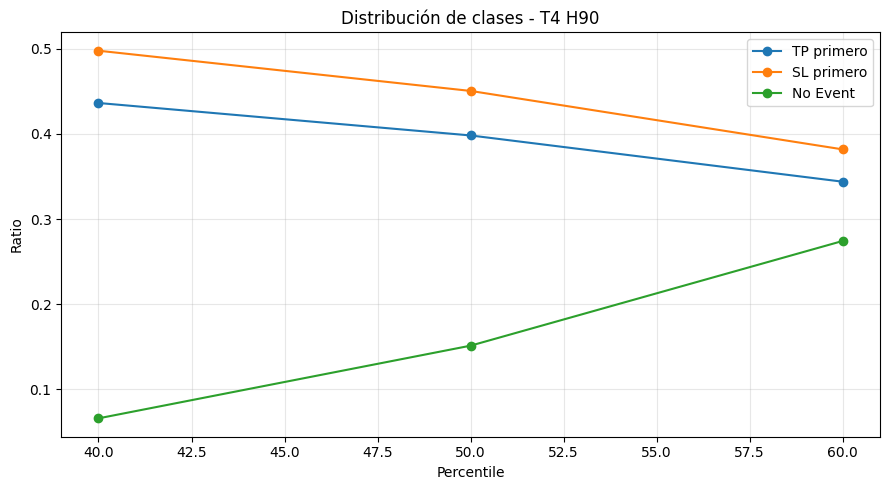

In [82]:
# ==========================================================
# 6.5 Sensibilidad paramétrica - T4
# ==========================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, Markdown

# ==========================================================
# 1) Dataset base de sensibilidad
# ==========================================================

df_t4_sensitivity = (
    df_t4_class_distribution[
        [
            "target",
            "horizon",
            "percentile",
            "class_-1_ratio",
            "class_0_ratio",
            "class_1_ratio",
            "event_ratio",
            "no_event_ratio",
            "tp_sl_gap"
        ]
    ]
    .sort_values(
        ["horizon", "percentile"]
    )
    .reset_index(drop=True)
)

display(Markdown("## Resumen de sensibilidad paramétrica - T4"))
display(df_t4_sensitivity)

# ==========================================================
# 2) Heatmap Event Rate
# ==========================================================

display(Markdown("## Heatmap Event Rate - T4"))

pivot_event = (
    df_t4_sensitivity
    .pivot(
        index="percentile",
        columns="horizon",
        values="event_ratio"
    )
    .sort_index()
)

plt.figure(figsize=(7, 5))

sns.heatmap(
    pivot_event,
    annot=True,
    fmt=".3f",
    cmap="viridis"
)

plt.title("Event Rate - T4")
plt.xlabel("Horizonte")
plt.ylabel("Percentile")

plt.tight_layout()
plt.show()

# ==========================================================
# 3) Heatmap No Event Rate
# ==========================================================

display(Markdown("## Heatmap No Event Rate - T4"))

pivot_no_event = (
    df_t4_sensitivity
    .pivot(
        index="percentile",
        columns="horizon",
        values="no_event_ratio"
    )
    .sort_index()
)

plt.figure(figsize=(7, 5))

sns.heatmap(
    pivot_no_event,
    annot=True,
    fmt=".3f",
    cmap="magma"
)

plt.title("No Event Rate - T4")
plt.xlabel("Horizonte")
plt.ylabel("Percentile")

plt.tight_layout()
plt.show()

# ==========================================================
# 4) Heatmap TP-SL Gap
# ==========================================================

display(Markdown("## Heatmap TP-SL Gap - T4"))

pivot_gap = (
    df_t4_sensitivity
    .pivot(
        index="percentile",
        columns="horizon",
        values="tp_sl_gap"
    )
    .sort_index()
)

plt.figure(figsize=(7, 5))

sns.heatmap(
    pivot_gap,
    annot=True,
    fmt=".3f",
    cmap="coolwarm"
)

plt.title("TP-SL Gap - T4")
plt.xlabel("Horizonte")
plt.ylabel("Percentile")

plt.tight_layout()
plt.show()

# ==========================================================
# 5) Evolución del Event Rate
# ==========================================================

display(Markdown("## Evolución paramétrica del Event Rate - T4"))

plt.figure(figsize=(9, 5))

for H in sorted(df_t4_sensitivity["horizon"].unique()):

    temp = (
        df_t4_sensitivity[
            df_t4_sensitivity["horizon"] == H
        ]
        .sort_values("percentile")
    )

    plt.plot(
        temp["percentile"],
        temp["event_ratio"],
        marker="o",
        linewidth=2,
        label=f"H{H}"
    )

plt.title("Event Rate vs Percentile - T4")
plt.xlabel("Percentile")
plt.ylabel("Event Rate")

plt.grid(alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()

# ==========================================================
# 6) Evolución del No Event Rate
# ==========================================================

display(Markdown("## Evolución paramétrica del No Event Rate - T4"))

plt.figure(figsize=(9, 5))

for H in sorted(df_t4_sensitivity["horizon"].unique()):

    temp = (
        df_t4_sensitivity[
            df_t4_sensitivity["horizon"] == H
        ]
        .sort_values("percentile")
    )

    plt.plot(
        temp["percentile"],
        temp["no_event_ratio"],
        marker="o",
        linewidth=2,
        label=f"H{H}"
    )

plt.title("No Event Rate vs Percentile - T4")
plt.xlabel("Percentile")
plt.ylabel("No Event Rate")

plt.grid(alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()

# ==========================================================
# 7) Evolución del balance TP vs SL
# ==========================================================

display(Markdown("## Evolución paramétrica del balance TP-SL - T4"))

plt.figure(figsize=(9, 5))

for H in sorted(df_t4_sensitivity["horizon"].unique()):

    temp = (
        df_t4_sensitivity[
            df_t4_sensitivity["horizon"] == H
        ]
        .sort_values("percentile")
    )

    plt.plot(
        temp["percentile"],
        temp["tp_sl_gap"],
        marker="o",
        linewidth=2,
        label=f"H{H}"
    )

plt.title("TP-SL Gap vs Percentile - T4")
plt.xlabel("Percentile")
plt.ylabel("TP-SL Gap")

plt.grid(alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()

# ==========================================================
# 8) Distribución de clases por configuración
# ==========================================================

display(Markdown("## Distribución de clases por configuración - T4"))

for H in sorted(df_t4_sensitivity["horizon"].unique()):

    temp = (
        df_t4_sensitivity[
            df_t4_sensitivity["horizon"] == H
        ]
        .sort_values("percentile")
    )

    plt.figure(figsize=(9, 5))

    plt.plot(
        temp["percentile"],
        temp["class_1_ratio"],
        marker="o",
        label="TP primero"
    )

    plt.plot(
        temp["percentile"],
        temp["class_-1_ratio"],
        marker="o",
        label="SL primero"
    )

    plt.plot(
        temp["percentile"],
        temp["class_0_ratio"],
        marker="o",
        label="No Event"
    )

    plt.title(f"Distribución de clases - T4 H{H}")
    plt.xlabel("Percentile")
    plt.ylabel("Ratio")

    plt.grid(alpha=0.3)
    plt.legend()

    plt.tight_layout()
    plt.show()

#### **6.5.2 Observaciones sobre la sensibilidad paramétrica de T4**


**Impacto del percentil sobre la frecuencia de eventos**

El percentil es el parámetro que genera el mayor efecto sobre la estructura estadística de T4.

Al aumentar el percentil de 40 a 60, las barreras se vuelven progresivamente más exigentes, lo que reduce la probabilidad de que el precio alcance un TP o un SL dentro del horizonte considerado.

Como consecuencia:

* El *Event Rate* disminuye sistemáticamente.
* El *No Event Rate* aumenta de forma consistente.
* Se reduce la cantidad de observaciones con resolución explícita del trade.

Por ejemplo, para H30:

* P40 → Event Rate = 94.2%
* P50 → Event Rate = 87.3%
* P60 → Event Rate = 76.2%

Este mismo comportamiento se observa en todos los horizontes analizados.

---

**Impacto del horizonte temporal**

El horizonte tiene un efecto secundario respecto al percentil.

Para un mismo percentil, al aumentar el horizonte de 30 a 90 barras se observa:

* una leve disminución del Event Rate;
* un aumento moderado del No Event Rate.

La diferencia existe, pero resulta significativamente menor que la producida por cambios en el percentil.

Por ejemplo, para P50:

* H30 → Event Rate = 87.3%
* H60 → Event Rate = 86.1%
* H90 → Event Rate = 84.9%

Esto indica que la distancia de las barreras explica una mayor proporción de la variabilidad que la duración del horizonte.

---

**Balance entre TP y SL**

En todas las configuraciones analizadas se observa una ligera predominancia de eventos SL respecto de eventos TP.

Sin embargo, el desbalance es reducido.

Los valores de TP-SL Gap oscilan aproximadamente entre:

* 3.8%
* 6.1%

Estos niveles son considerablemente menores que los desequilibrios observados habitualmente en problemas de clasificación financiera.

Por lo tanto, T4 presenta una estructura naturalmente balanceada entre eventos favorables y desfavorables.

---

**Comportamiento de la clase No Event**

La clase 0 es la principal responsable de las diferencias entre configuraciones.

A medida que aumenta el percentil:

* crece la proporción de observaciones sin resolución;
* disminuye la frecuencia de TP;
* disminuye la frecuencia de SL.

El crecimiento de la clase No Event es prácticamente monotónico en todos los horizontes.

Por ejemplo:

| Configuración | No Event |
| ------------- | -------: |
| P40-H30       |     5.8% |
| P50-H30       |    12.7% |
| P60-H30       |    23.8% |
| P60-H90       |    27.4% |

Esto confirma que la exigencia de las barreras es el principal determinante de la frecuencia operativa del target.

---

**Consistencia entre horizontes**

Las curvas obtenidas para H30, H60 y H90 muestran formas muy similares.

No se observan cambios abruptos ni inversiones de tendencia al modificar el horizonte.

Esta consistencia indica que la construcción del target responde de manera estable y predecible a las variaciones de parámetros.

---

**Conclusiones de sensibilidad paramétrica**

El análisis muestra que T4 posee una estructura estadística robusta frente a las distintas configuraciones evaluadas.

Las principales conclusiones son:

* El percentil es el parámetro con mayor influencia sobre la frecuencia de eventos.
* Horizontes más largos producen un incremento moderado de observaciones sin resolución.
* El balance entre TP y SL se mantiene relativamente estable en todas las configuraciones.
* No se observan comportamientos erráticos ni cambios bruscos en la distribución de clases.
* Las configuraciones P40 generan la mayor frecuencia operativa.
* Las configuraciones P60 generan eventos más exigentes, pero incrementan significativamente la proporción de observaciones sin evento.

En conjunto, los resultados sugieren que las nueve variantes de T4 construidas presentan un comportamiento coherente y consistente, proporcionando un conjunto adecuado de targets para las etapas posteriores de modelado y evaluación predictiva.


### **6.6. Análisis por régimen intradiario**


Este análisis busca evaluar si el comportamiento de T4 cambia según el régimen intradiario. En particular, se analiza si la ocurrencia de eventos TP, SL y No Event depende del momento operativo del mercado.

#### **6.6.1. Bloque de código**

## Distribución por régimen intradiario - T4

,target,horizon,percentile,regime_id,class_-1_ratio,class_0_ratio,class_1_ratio,event_rate,no_event_rate,tp_sl_gap
0,t4_p40_h30,30,40,0,0.441193,0.143335,0.415472,0.856665,0.143335,0.025721
1,t4_p40_h30,30,40,1,0.481533,0.021292,0.497175,0.978708,0.021292,0.015643
2,t4_p40_h30,30,40,2,0.506699,0.015232,0.478068,0.984768,0.015232,0.028631
3,t4_p40_h30,30,40,3,0.514748,0.035074,0.450178,0.964926,0.035074,0.064570
4,t4_p40_h30,30,40,4,0.530747,0.021907,0.447346,0.978093,0.021907,0.083401
5,t4_p50_h30,30,50,0,0.373822,0.276451,0.349726,0.723549,0.276451,0.024096
6,t4_p50_h30,30,50,1,0.465969,0.050585,0.483446,0.949415,0.050585,0.017477
7,t4_p50_h30,30,50,2,0.509073,0.021949,0.468978,0.978051,0.021949,0.040095
8,t4_p50_h30,30,50,3,0.489078,0.093092,0.417830,0.906908,0.093092,0.071248
9,t4_p50_h30,30,50,4,0.518286,0.063743,0.417971,0.936257,0.063743,0.100315


## Distribución de clases por régimen - T4

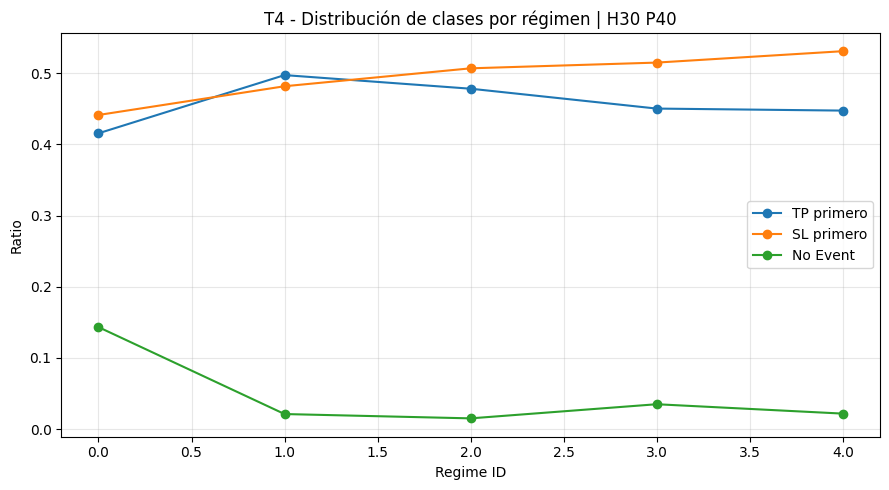

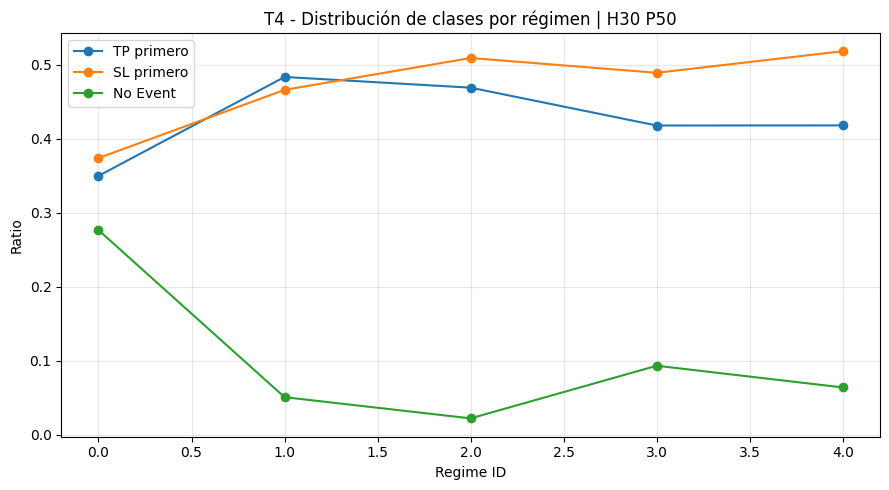

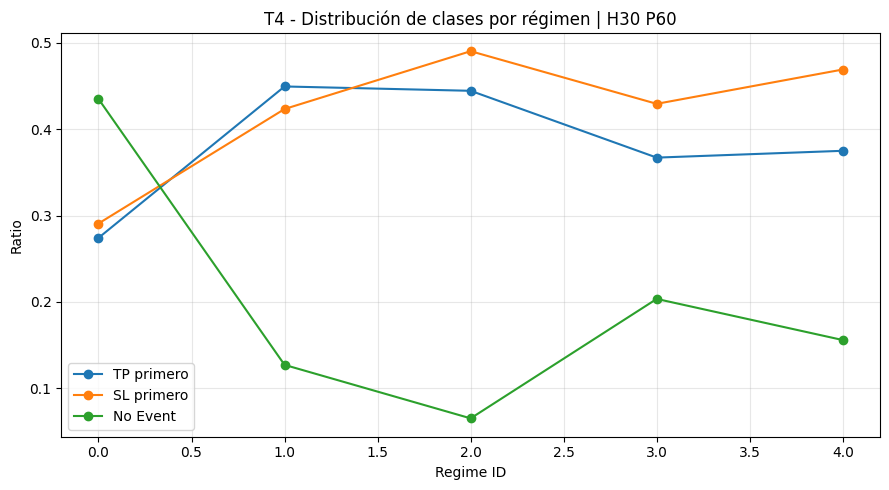

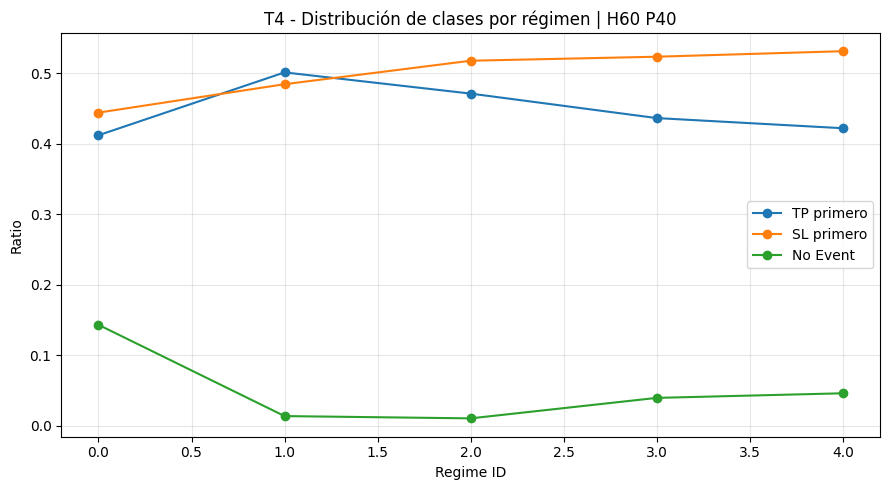

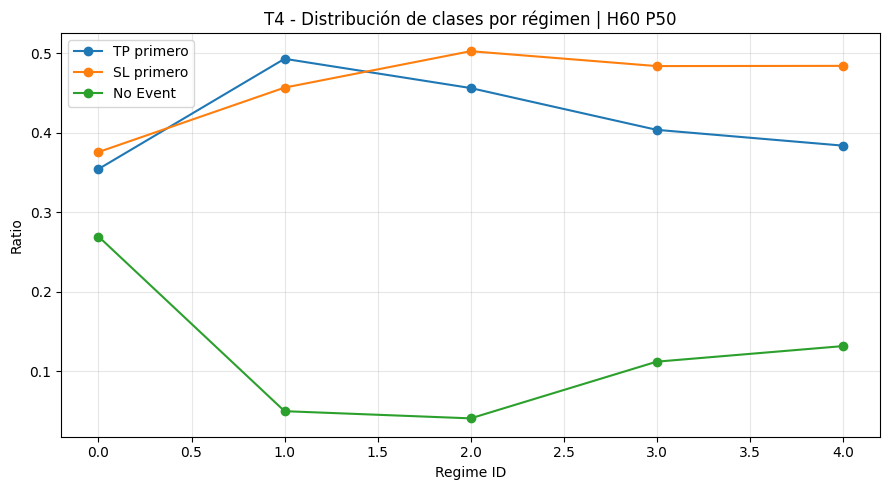

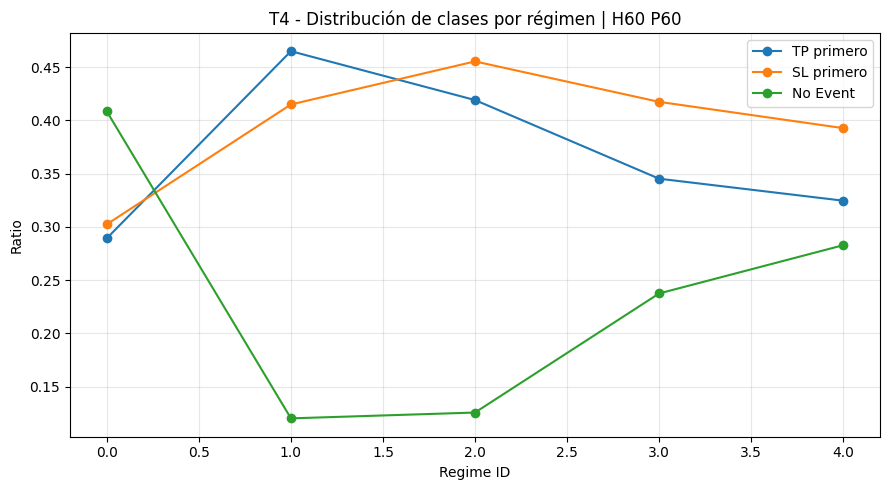

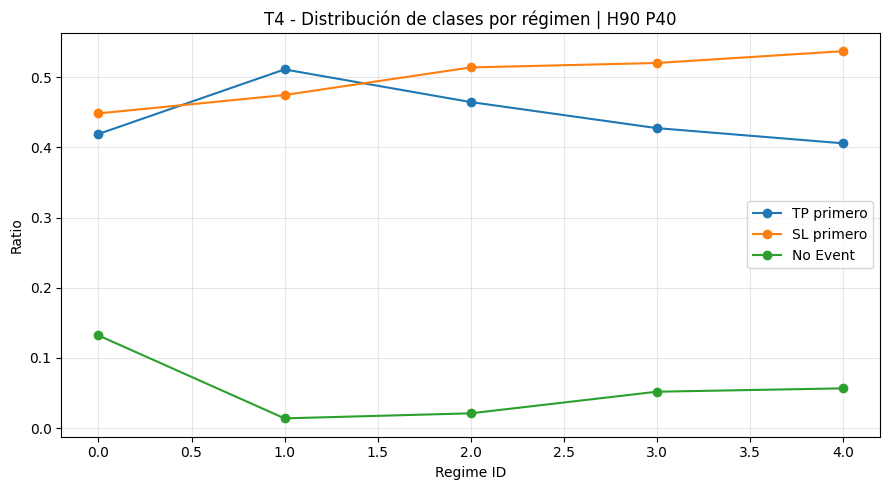

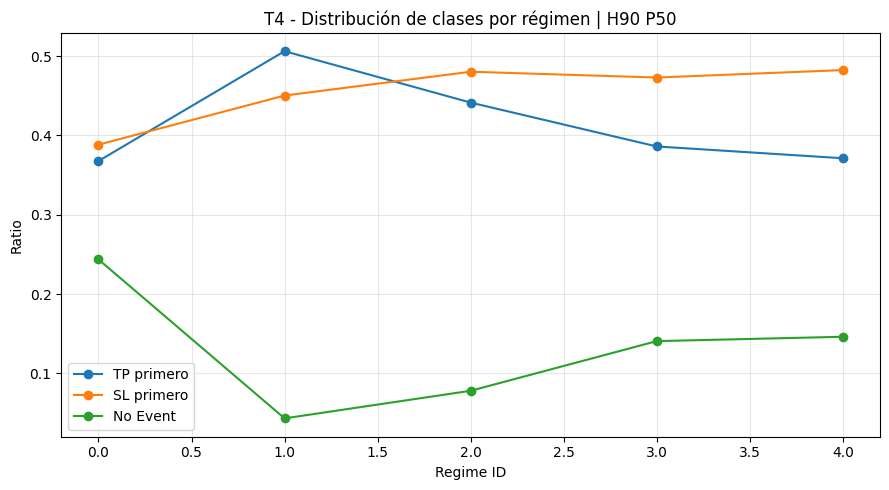

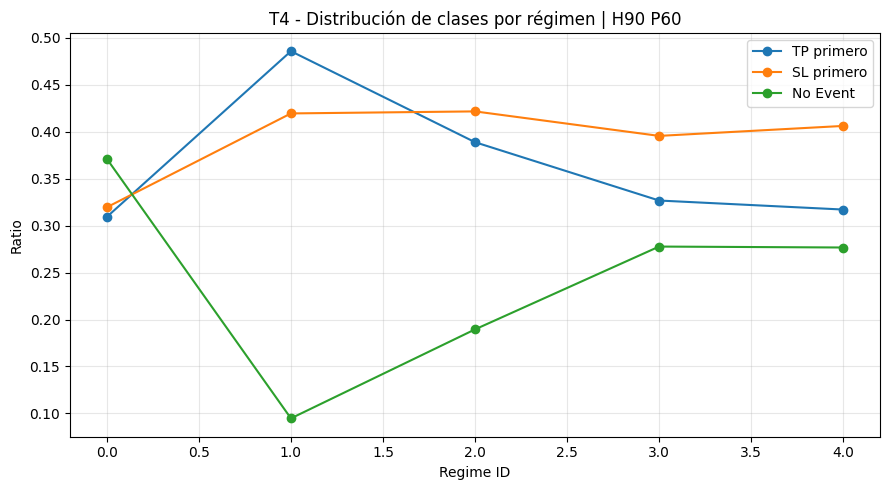

## Event Rate por régimen - T4

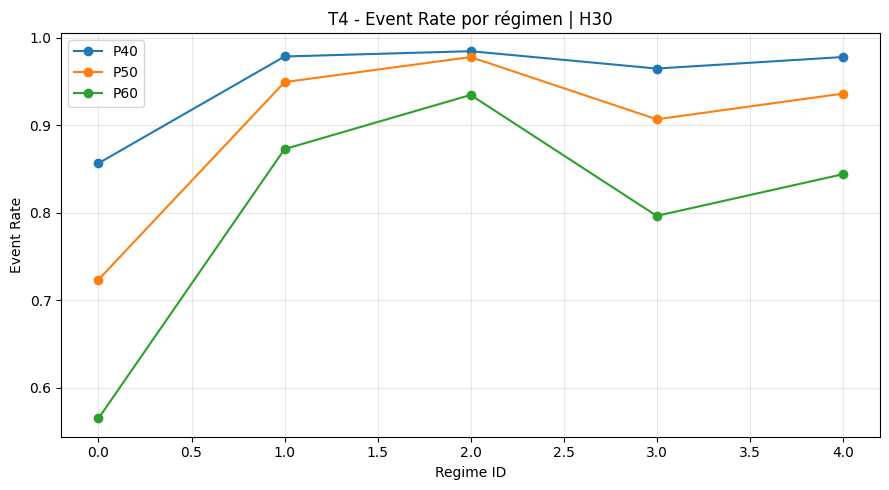

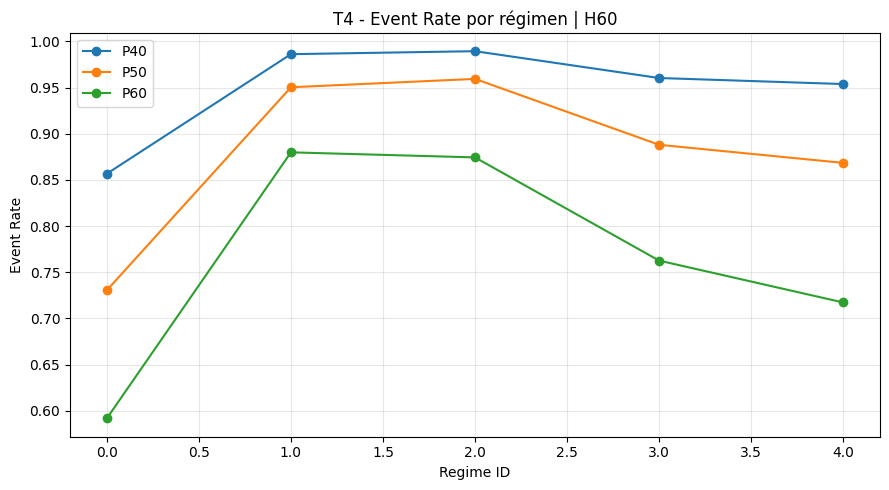

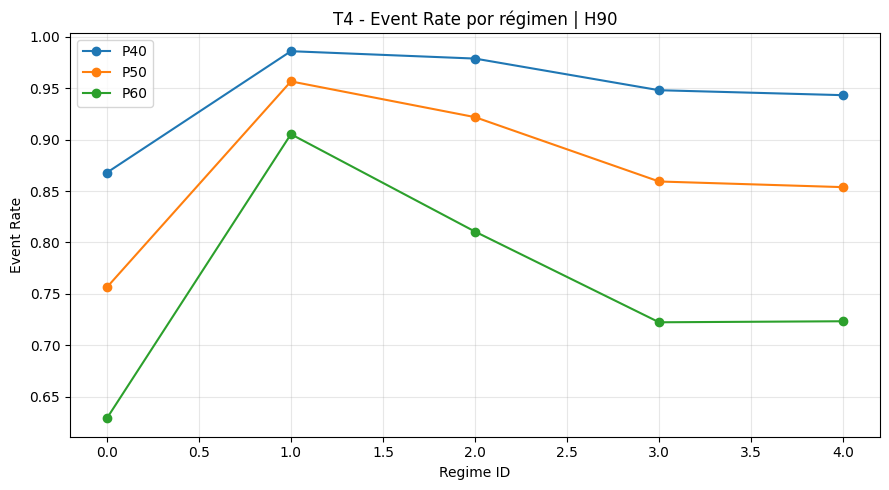

## No Event Rate por régimen - T4

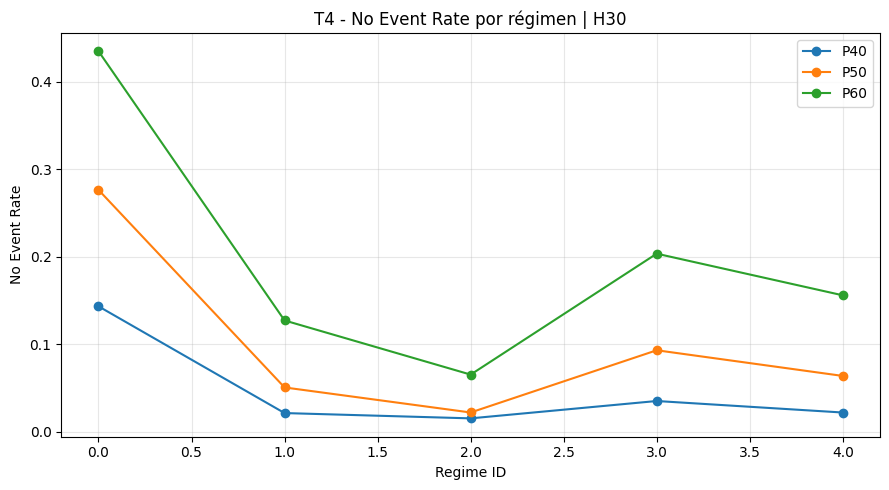

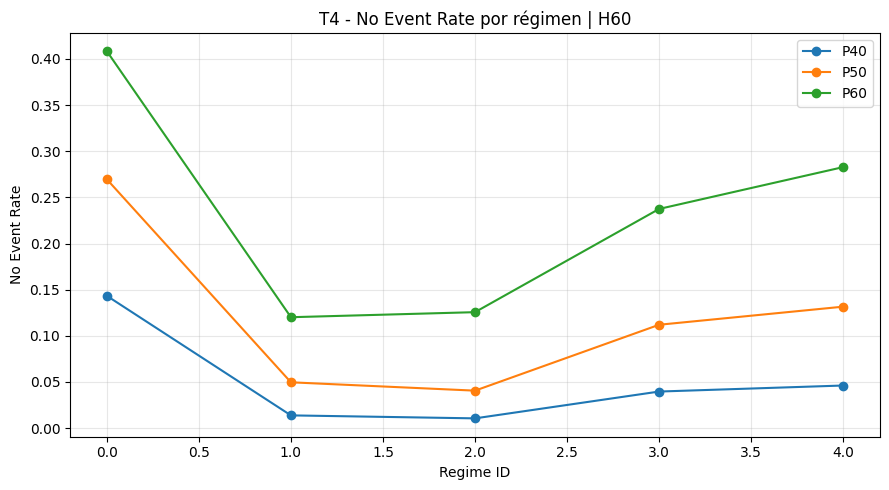

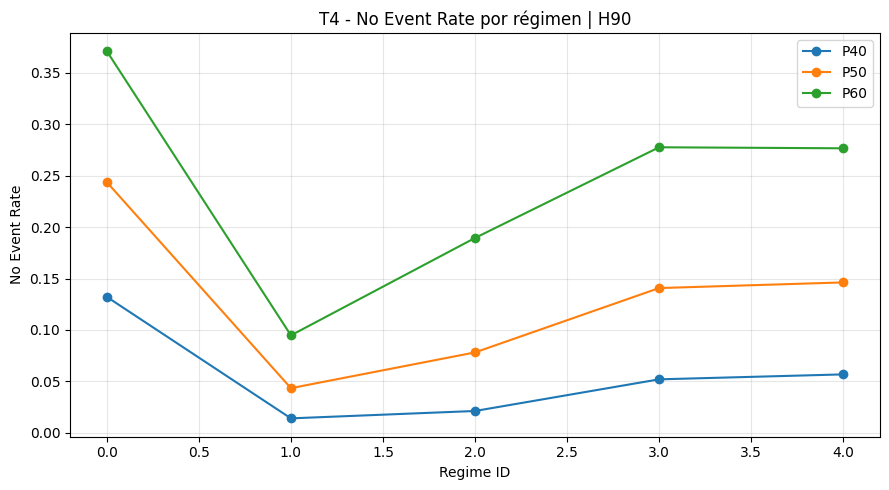

## TP-SL Gap por régimen - T4

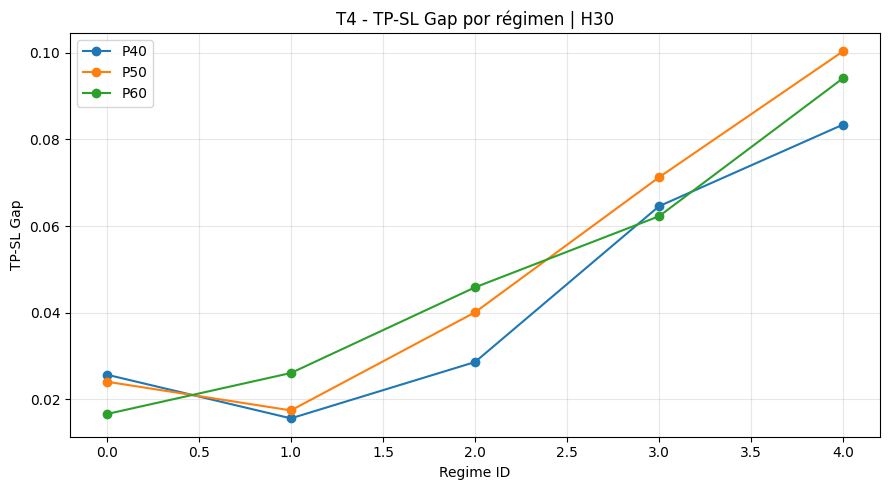

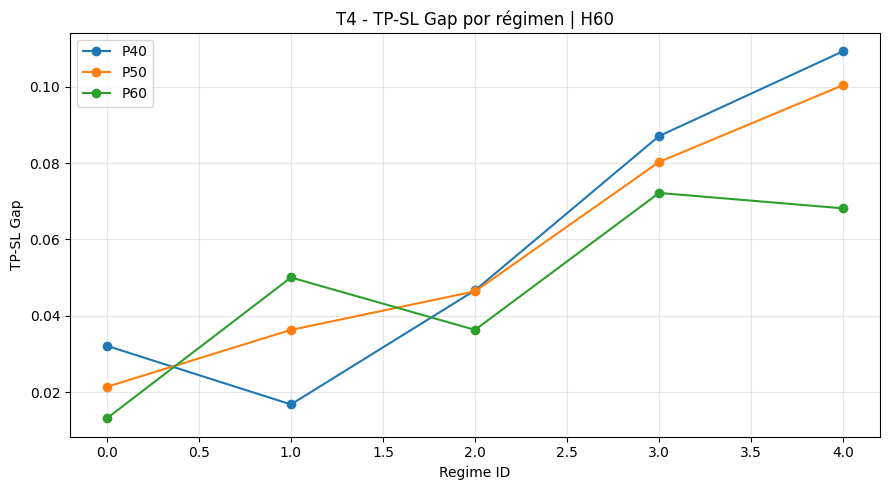

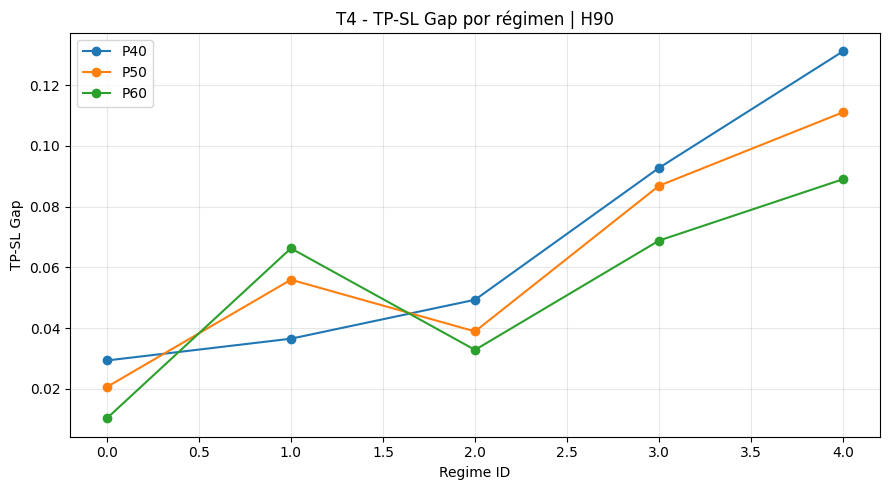

## Heatmaps Event Rate por régimen - T4

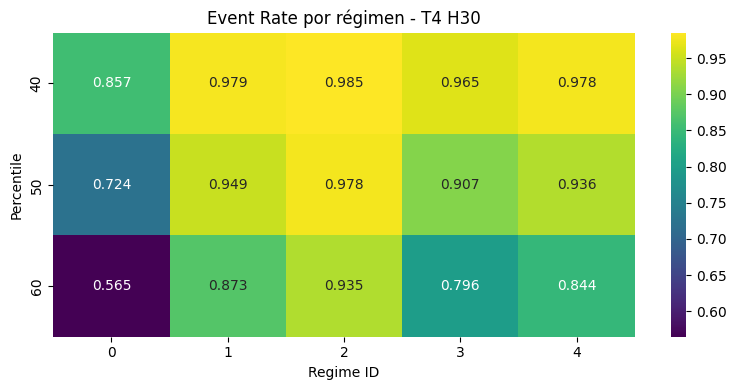

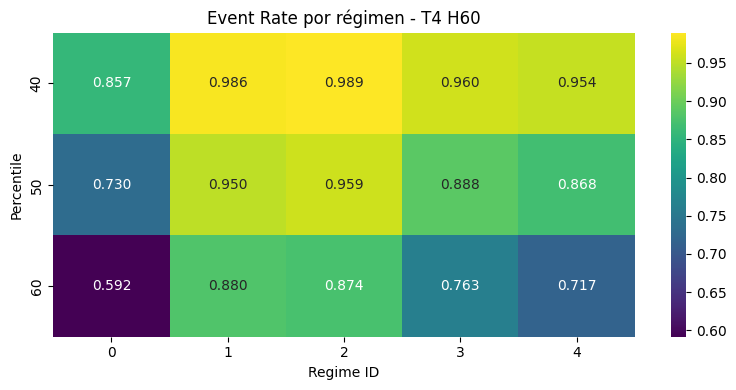

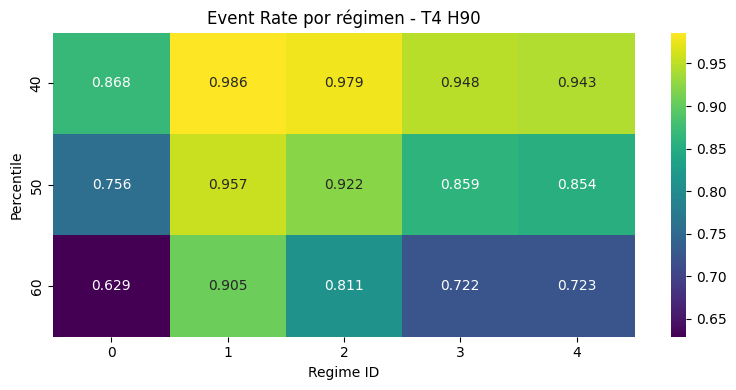

## Heatmaps No Event Rate por régimen - T4

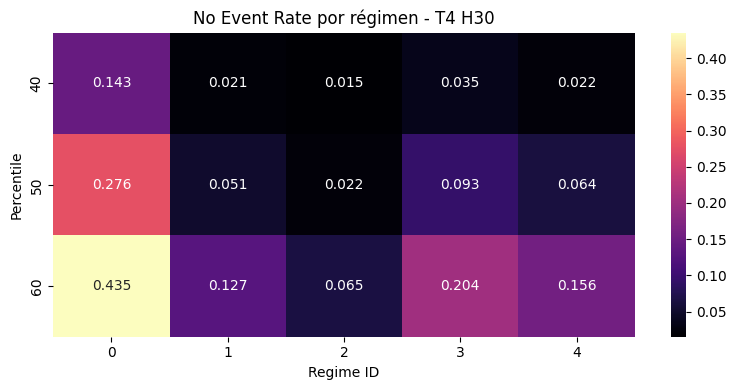

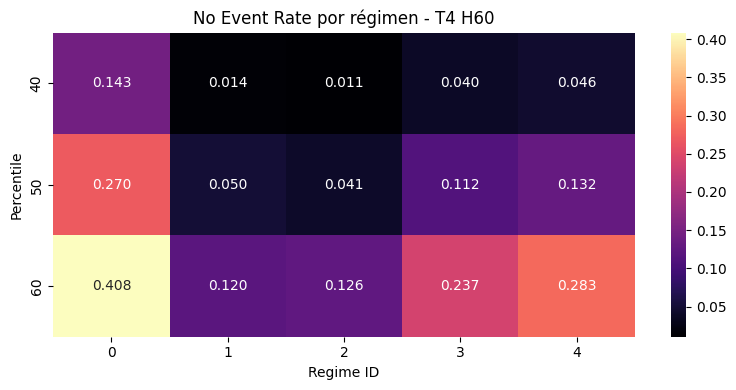

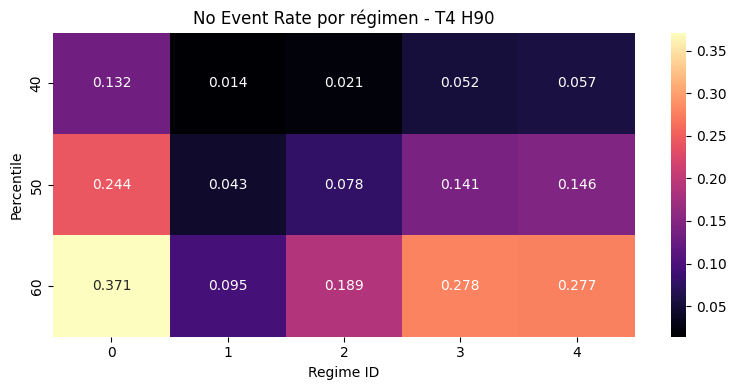

In [83]:
# ==========================================================
# 6.6 Análisis por régimen intradiario - T4
# ==========================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, Markdown

# ==========================================================
# 1) Preparación del dataset
# ==========================================================

df_t4_regime = df_t4.copy()

# Asegurar regime_id
if "regime_id" not in df_t4_regime.columns:
    df_t4_regime["regime_id"] = mnq_intraday["regime_id"].values

targets_t4 = t4_cols.copy()

t4_regime_rows = []

# ==========================================================
# 2) Cálculo de distribución por régimen
# ==========================================================

for target in targets_t4:

    parts = target.split("_")
    percentile = int(parts[1].replace("p", ""))
    horizon = int(parts[2].replace("h", ""))

    tmp = df_t4_regime[["regime_id", target]].dropna().copy()

    grouped = (
        tmp
        .groupby("regime_id")[target]
        .value_counts(normalize=True)
        .unstack(fill_value=0)
        .reset_index()
    )

    for cls in [-1, 0, 1]:
        if cls not in grouped.columns:
            grouped[cls] = 0.0

    grouped = grouped.rename(
        columns={
            -1: "class_-1_ratio",
            0: "class_0_ratio",
            1: "class_1_ratio"
        }
    )

    grouped["target"] = target
    grouped["horizon"] = horizon
    grouped["percentile"] = percentile

    grouped["event_rate"] = (
        grouped["class_-1_ratio"] +
        grouped["class_1_ratio"]
    )

    grouped["no_event_rate"] = grouped["class_0_ratio"]

    grouped["tp_sl_gap"] = abs(
        grouped["class_1_ratio"] -
        grouped["class_-1_ratio"]
    )

    t4_regime_rows.append(grouped)

df_t4_regime_summary = pd.concat(
    t4_regime_rows,
    ignore_index=True
)

df_t4_regime_summary = df_t4_regime_summary[
    [
        "target",
        "horizon",
        "percentile",
        "regime_id",
        "class_-1_ratio",
        "class_0_ratio",
        "class_1_ratio",
        "event_rate",
        "no_event_rate",
        "tp_sl_gap"
    ]
].sort_values(
    ["horizon", "percentile", "regime_id"]
).reset_index(drop=True)

display(Markdown("## Distribución por régimen intradiario - T4"))
display(df_t4_regime_summary)

# ==========================================================
# 3) Distribución de clases por régimen
# ==========================================================

display(Markdown("## Distribución de clases por régimen - T4"))

for H in sorted(df_t4_regime_summary["horizon"].unique()):

    temp_h = df_t4_regime_summary[
        df_t4_regime_summary["horizon"] == H
    ]

    for p in sorted(temp_h["percentile"].unique()):

        temp = temp_h[
            temp_h["percentile"] == p
        ]

        plt.figure(figsize=(9, 5))

        plt.plot(
            temp["regime_id"],
            temp["class_1_ratio"],
            marker="o",
            label="TP primero"
        )

        plt.plot(
            temp["regime_id"],
            temp["class_-1_ratio"],
            marker="o",
            label="SL primero"
        )

        plt.plot(
            temp["regime_id"],
            temp["class_0_ratio"],
            marker="o",
            label="No Event"
        )

        plt.title(f"T4 - Distribución de clases por régimen | H{H} P{p}")
        plt.xlabel("Regime ID")
        plt.ylabel("Ratio")

        plt.grid(alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

# ==========================================================
# 4) Event Rate por régimen
# ==========================================================

display(Markdown("## Event Rate por régimen - T4"))

for H in sorted(df_t4_regime_summary["horizon"].unique()):

    plt.figure(figsize=(9, 5))

    temp_h = df_t4_regime_summary[
        df_t4_regime_summary["horizon"] == H
    ]

    for p in sorted(temp_h["percentile"].unique()):

        temp = temp_h[
            temp_h["percentile"] == p
        ]

        plt.plot(
            temp["regime_id"],
            temp["event_rate"],
            marker="o",
            label=f"P{p}"
        )

    plt.title(f"T4 - Event Rate por régimen | H{H}")
    plt.xlabel("Regime ID")
    plt.ylabel("Event Rate")

    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

# ==========================================================
# 5) No Event Rate por régimen
# ==========================================================

display(Markdown("## No Event Rate por régimen - T4"))

for H in sorted(df_t4_regime_summary["horizon"].unique()):

    plt.figure(figsize=(9, 5))

    temp_h = df_t4_regime_summary[
        df_t4_regime_summary["horizon"] == H
    ]

    for p in sorted(temp_h["percentile"].unique()):

        temp = temp_h[
            temp_h["percentile"] == p
        ]

        plt.plot(
            temp["regime_id"],
            temp["no_event_rate"],
            marker="o",
            label=f"P{p}"
        )

    plt.title(f"T4 - No Event Rate por régimen | H{H}")
    plt.xlabel("Regime ID")
    plt.ylabel("No Event Rate")

    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

# ==========================================================
# 6) TP-SL Gap por régimen
# ==========================================================

display(Markdown("## TP-SL Gap por régimen - T4"))

for H in sorted(df_t4_regime_summary["horizon"].unique()):

    plt.figure(figsize=(9, 5))

    temp_h = df_t4_regime_summary[
        df_t4_regime_summary["horizon"] == H
    ]

    for p in sorted(temp_h["percentile"].unique()):

        temp = temp_h[
            temp_h["percentile"] == p
        ]

        plt.plot(
            temp["regime_id"],
            temp["tp_sl_gap"],
            marker="o",
            label=f"P{p}"
        )

    plt.title(f"T4 - TP-SL Gap por régimen | H{H}")
    plt.xlabel("Regime ID")
    plt.ylabel("TP-SL Gap")

    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

# ==========================================================
# 7) Heatmaps Event Rate por régimen
# ==========================================================

display(Markdown("## Heatmaps Event Rate por régimen - T4"))

for H in sorted(df_t4_regime_summary["horizon"].unique()):

    temp_h = df_t4_regime_summary[
        df_t4_regime_summary["horizon"] == H
    ]

    pivot_event = (
        temp_h
        .pivot(
            index="percentile",
            columns="regime_id",
            values="event_rate"
        )
        .sort_index()
    )

    plt.figure(figsize=(8, 4))

    sns.heatmap(
        pivot_event,
        annot=True,
        fmt=".3f",
        cmap="viridis"
    )

    plt.title(f"Event Rate por régimen - T4 H{H}")
    plt.xlabel("Regime ID")
    plt.ylabel("Percentile")

    plt.tight_layout()
    plt.show()

# ==========================================================
# 8) Heatmaps No Event Rate por régimen
# ==========================================================

display(Markdown("## Heatmaps No Event Rate por régimen - T4"))

for H in sorted(df_t4_regime_summary["horizon"].unique()):

    temp_h = df_t4_regime_summary[
        df_t4_regime_summary["horizon"] == H
    ]

    pivot_no_event = (
        temp_h
        .pivot(
            index="percentile",
            columns="regime_id",
            values="no_event_rate"
        )
        .sort_index()
    )

    plt.figure(figsize=(8, 4))

    sns.heatmap(
        pivot_no_event,
        annot=True,
        fmt=".3f",
        cmap="magma"
    )

    plt.title(f"No Event Rate por régimen - T4 H{H}")
    plt.xlabel("Regime ID")
    plt.ylabel("Percentile")

    plt.tight_layout()
    plt.show()

#### **6.6.2. Observaciones — Análisis por régimen intradiario (T4)**

**Event Rate fuertemente dependiente del régimen**

Los heatmaps muestran que la frecuencia de eventos válidos no es homogénea a lo largo de la sesión.

Para las configuraciones P40 y P50, los regímenes **1 y 2** presentan consistentemente los mayores Event Rate, alcanzando valores entre **0.95 y 0.99** en prácticamente todos los horizontes.

Esto implica que durante estos períodos casi todas las observaciones terminan resolviéndose mediante alguna barrera (TP o SL).

Por el contrario, el régimen **0** presenta sistemáticamente los menores Event Rate, especialmente para P50 y P60.

---

**El régimen 0 concentra la mayor cantidad de No Events**

Los heatmaps de No Event Rate muestran un patrón extremadamente consistente.

Para todas las configuraciones:

* Régimen 0 → máximo No Event Rate.
* Régimen 1 → mínimo No Event Rate.
* Régimen 2 → segundo mínimo No Event Rate.

Ejemplos:

| Configuración | Reg.0 | Reg.1 |
| ------------- | ----- | ----- |
| H30 P60       | 43.5% | 12.7% |
| H60 P60       | 40.8% | 12.0% |
| H90 P60       | 37.1% | 9.5%  |

La diferencia es muy significativa y sugiere que el régimen 0 corresponde a una etapa del mercado con menor capacidad para alcanzar las barreras definidas.

---

**El régimen 2 aparece como el más eficiente**

Considerando simultáneamente:

* alto Event Rate,
* bajo No Event Rate,
* balance razonable entre TP y SL,

el régimen 2 emerge como el entorno más favorable para la generación de eventos.

Por ejemplo:

| Configuración | Event Rate |
| ------------- | ---------- |
| H30 P40       | 98.5%      |
| H60 P40       | 98.9%      |
| H90 P40       | 97.9%      |

Además, el No Event Rate permanece cercano a cero para P40 y muy reducido para P50.

---

**El aumento del percentil afecta principalmente a los regímenes extremos**

Al pasar de P40 a P60:

* disminuye el Event Rate en todos los regímenes;
* aumenta el No Event Rate en todos los regímenes.

Sin embargo, el deterioro es mucho más pronunciado en:

* régimen 0,
* régimen 3,
* régimen 4.

Mientras tanto, los regímenes 1 y 2 conservan tasas de evento elevadas incluso bajo configuraciones más exigentes.

---

**Los horizontes largos penalizan especialmente a P60**

Para P60 se observa una caída progresiva del Event Rate al aumentar el horizonte:

| Régimen | H30   | H60   | H90   |
| ------- | ----- | ----- | ----- |
| 2       | 0.935 | 0.874 | 0.811 |
| 3       | 0.796 | 0.763 | 0.722 |
| 4       | 0.844 | 0.717 | 0.723 |

Esto indica que las barreras asociadas a percentiles altos pierden capacidad de resolución conforme aumenta el horizonte de observación.

---

**El balance TP-SL cambia con el régimen**

Los gráficos de TP-SL Gap muestran una tendencia clara:

* Regímenes 0 y 1 presentan gaps muy pequeños.
* Regímenes 3 y 4 presentan los mayores gaps.

En particular:

* H90 P40 alcanza un gap cercano a **0.13** en el régimen 4.
* H60 P40 alcanza aproximadamente **0.11** en el régimen 4.

Esto indica que en los regímenes finales de la sesión la distribución entre TP y SL deja de ser simétrica y comienza a favorecer sistemáticamente una de las dos barreras.

---

**Consistencia transversal entre horizontes**

Uno de los hallazgos más importantes es que los patrones observados se repiten en:

* H30,
* H60,
* H90.

La jerarquía de regímenes prácticamente no cambia:

1. Régimen 2 → mejor comportamiento.
2. Régimen 1 → muy favorable.
3. Régimen 3 → intermedio.
4. Régimen 4 → más dependiente del percentil.
5. Régimen 0 → peor comportamiento.

La repetición de esta estructura en todos los horizontes sugiere que el efecto régimen constituye una característica robusta del mercado y no una particularidad de una configuración específica de T4.


### **6.7. Observaciones e interpretación**

El análisis desarrollado sobre los targets T4 permitió caracterizar el comportamiento operativo de las configuraciones basadas en barreras de Take Profit (TP) y Stop Loss (SL), evaluando su frecuencia de activación, estabilidad temporal y sensibilidad frente a distintos horizontes, percentiles y regímenes intradiarios.

Los resultados muestran que T4 genera una proporción muy elevada de eventos válidos para la mayoría de las configuraciones analizadas. En particular, las configuraciones asociadas al percentil 40 presentan Event Rates superiores al 93% para todos los horizontes, mientras que incluso las configuraciones más exigentes (percentil 60) mantienen tasas de evento entre 72% y 76%. Esto indica que la gran mayoría de las observaciones terminan resolviéndose mediante alguna de las barreras definidas.

Desde el punto de vista operativo, esto constituye una característica favorable para el entrenamiento de modelos, ya que reduce significativamente la cantidad de muestras ambiguas o sin resolución. A diferencia de otros enfoques de etiquetado donde una fracción importante de los datos puede quedar sin clasificar, T4 genera señales operativas sobre la mayor parte del conjunto de observaciones.

El análisis de sensibilidad paramétrica mostró además un comportamiento altamente consistente. El aumento del percentil produce una reducción sistemática del Event Rate y un incremento equivalente del No Event Rate, mientras que el aumento del horizonte genera un efecto secundario de menor magnitud. En términos prácticos, el percentil aparece como el parámetro dominante en la frecuencia de activación del target.

La distribución interna de eventos revela otro aspecto relevante. En todas las configuraciones existe un predominio moderado de eventos SL respecto de eventos TP. Sin embargo, la diferencia observada es relativamente pequeña. Los valores de TP-SL Gap permanecen generalmente por debajo de 0.10 y, en la mayoría de los casos, cercanos a 0.05. Esto indica que el target mantiene un balance razonable entre ambas clases operativas y evita situaciones de fuerte desbalance estructural.

La estabilidad temporal también resulta satisfactoria. A lo largo del período analizado no se observan cambios permanentes en la distribución de clases ni quiebres de régimen que alteren significativamente el comportamiento general del target. Las fluctuaciones observadas se concentran principalmente en la clase No Event, especialmente para configuraciones con percentiles elevados, pero sin modificar la estructura general del problema.

El análisis de variabilidad temporal confirma esta conclusión. Las configuraciones P40 presentan los menores niveles de dispersión temporal y los Event Rates más estables. A medida que aumenta el percentil, la variabilidad se incrementa gradualmente debido a la reducción del número de eventos generados, aunque sin comprometer la coherencia global del target.

El estudio por régimen intradiario aporta evidencia adicional sobre la naturaleza operativa de T4. Los regímenes 1 y 2 concentran los mayores Event Rates y los menores No Event Rates para prácticamente todas las configuraciones analizadas. En contraste, el régimen 0 exhibe sistemáticamente la mayor proporción de observaciones sin resolución. Esta diferencia se mantiene para todos los horizontes y percentiles evaluados, sugiriendo que la dinámica intradiaria influye de manera significativa en la probabilidad de activación de las barreras.

Asimismo, los regímenes finales de la sesión (3 y 4) muestran una tendencia a incrementar el TP-SL Gap, indicando que la distribución entre eventos TP y SL deja de ser completamente simétrica durante estos períodos. Este comportamiento se repite de manera consistente en los distintos horizontes analizados y constituye una característica estructural del mercado más que un fenómeno puntual.

En conjunto, los resultados permiten concluir que T4 constituye un target operacionalmente robusto. Presenta altas tasas de resolución, un balance adecuado entre clases, estabilidad temporal aceptable y patrones consistentes entre horizontes, percentiles y regímenes intradiarios. Estas propiedades lo convierten en un candidato sólido para las etapas posteriores de modelado, especialmente en aquellos enfoques donde el objetivo principal es predecir directamente el resultado de una operación expresado mediante reglas explícitas de TP y SL.

Finalmente, el análisis sugiere que las configuraciones asociadas al percentil 40 ofrecen el mejor compromiso entre frecuencia operativa, estabilidad temporal y disponibilidad de muestras, mientras que los percentiles más altos introducen un filtrado más estricto a costa de una menor cantidad de eventos y una mayor variabilidad temporal. Esta relación representa el principal trade-off observado dentro de la familia de targets T4.

## **7. Comparación estadística entre targets**


### **7.1 Objetivo de la comparación entre targets**

A lo largo de los capítulos anteriores se desarrollaron y analizaron cuatro familias de targets con diferentes niveles de complejidad y distintos grados de alineación con la toma de decisiones en trading.

Cada target representa una forma diferente de transformar la evolución futura del precio en un problema de Machine Learning. Como consecuencia, las características estadísticas de las clases generadas, la frecuencia operativa, la estabilidad temporal y la dificultad predictiva pueden variar significativamente entre ellos.

El objetivo de esta sección es realizar una comparación global entre T1, T2, T3 y T4, sintetizando los principales resultados obtenidos durante el análisis exploratorio.

La comparación se enfoca en cinco dimensiones fundamentales:

- **Balance de clases:** grado de equilibrio entre las categorías generadas por cada target.
- **Frecuencia operativa:** proporción de observaciones que producen señales utilizables para entrenamiento y operación.
- **Complejidad predictiva:** dificultad inherente del problema que deberá resolver el modelo.
- **Estabilidad temporal:** consistencia de la distribución de clases a lo largo del tiempo.
- **Interpretabilidad operativa:** facilidad para traducir las predicciones del modelo en decisiones reales de trading.

Esta evaluación permite identificar las fortalezas y limitaciones de cada enfoque, así como determinar cuáles presentan mejores condiciones para las etapas posteriores de modelado, validación y construcción de estrategias.

Más que seleccionar un único target "correcto", el propósito es comprender los compromisos existentes entre simplicidad, robustez estadística y utilidad operativa, estableciendo una base objetiva para las decisiones metodológicas que se adoptarán en los capítulos siguientes.

#### **Tabla resumen de características generales**



| Target | Descripción | Balance | Frecuencia operativa | Complejidad predictiva | Estabilidad temporal | Interpretabilidad |
|----------|----------|----------|----------|----------|----------|----------|
| T1 | Dirección simple | Alta | Muy alta | Baja | Muy alta | Media |
| T2 | Dirección con umbral | Media-Alta | Media | Media | Alta | Alta |
| T3 | Outcome de trade | Buena | Media | Media-Alta | Alta | Muy alta |
| T4 | TP vs SL primero | Buena | Alta | Alta | Alta | Muy alta |

#### **Tabla resumen de características operativas**


| Target | Nº clases | Balance | Frecuencia de eventos | Sensibilidad paramétrica | Dependencia de régimen | Uso recomendado |
|----------|----------|----------|----------|----------|----------|----------|
| T1 | 3 | Alto | Muy alta | Baja | Baja | Benchmark direccional |
| T2 | 3 | Medio | Media | Alta | Media | Predicción direccional filtrada |
| T3 | 2 | Bueno | Variable | Alta | Alta | Selección de oportunidades |
| T4 | 3 | Bueno | Alta | Media | Alta | Predicción TP vs SL |

Las tablas anteriores permiten sintetizar las principales diferencias entre las cuatro familias de targets analizadas.

- T1 representa el problema más simple y estable, constituyendo una referencia natural para comparar modelos y metodologías.

- T2 incorpora un criterio de relevancia económica mediante percentiles, reduciendo ruido de mercado a costa de una menor frecuencia operativa.

- T3 traslada el problema desde la predicción de dirección hacia la predicción de calidad de una operación, alineando el aprendizaje con la lógica real de trading.

- T4 constituye el enfoque más cercano al proceso de ejecución, ya que modela explícitamente la competencia entre las barreras de Take Profit y Stop Loss. Aunque presenta la mayor complejidad predictiva, también ofrece la interpretación operativa más directa.

### **7.2. Comparación por balance de clases**

El balance de clases constituye una de las propiedades más importantes de cualquier target utilizado en Machine Learning. Un target excesivamente desbalanceado puede inducir sesgos durante el entrenamiento, dificultar la convergencia de algunos algoritmos y producir métricas aparentemente buenas pero poco útiles desde el punto de vista operativo.

Por este motivo, resulta relevante comparar cómo se distribuyen las clases en cada una de las familias de targets analizadas.

**T1**

Los targets T1 presentan el mejor nivel de balance entre clases.

La construcción basada únicamente en la dirección futura del retorno genera distribuciones relativamente equilibradas entre movimientos alcistas, bajistas y neutrales, especialmente para percentiles intermedios.

Como consecuencia, T1 constituye el problema de clasificación más balanceado de todo el estudio y representa una referencia adecuada para evaluar el comportamiento base de los modelos.

**T2**

La introducción de thresholds de relevancia modifica significativamente la distribución de clases.

A medida que aumenta el percentil:

- disminuye la proporción de observaciones neutrales;
- aumenta la participación de movimientos direccionales;
- el balance entre largos y cortos continúa siendo razonablemente estable.

Aunque T2 presenta algo más de desbalance que T1, las diferencias entre clases permanecen controladas y no generan problemas significativos para el entrenamiento.

**T3**

Los targets T3 transforman el problema en una clasificación binaria entre trades exitosos y trades no exitosos.

En todas las configuraciones analizadas se observa una clara predominancia de la clase correspondiente a trades exitosos.

Las tasas de éxito se ubican aproximadamente entre:

- 69% y 79%

dependiendo de la configuración utilizada.

Como resultado, T3 presenta el mayor desbalance de clases de todo el estudio.

Sin embargo, este comportamiento es consistente con la forma en que fue construido el target y refleja directamente la lógica operativa utilizada para definir el éxito de una operación.

**T4**

Los targets T4 muestran una estructura particular compuesta por tres clases:

- TP alcanzado primero;
- SL alcanzado primero;
- No Event.

La principal característica observada es el elevado balance entre eventos TP y SL.

Las diferencias entre ambas clases son relativamente pequeñas en todas las configuraciones analizadas, con valores de TP-SL Gap generalmente inferiores al 10%.

La clase No Event aumenta gradualmente al incrementar el percentil, pero continúa siendo minoritaria para la mayoría de las configuraciones.

Como consecuencia, T4 presenta un balance general favorable y una distribución más equilibrada que T3.


#### **Comparación global**



Considerando conjuntamente todas las familias de targets, puede establecerse el siguiente orden aproximado en términos de balance estadístico:

| Ranking | Target | Balance de clases |
|----------|----------|----------|
| 1 | T1 | Muy alto |
| 2 | T4 | Alto |
| 3 | T2 | Medio-Alto |
| 4 | T3 | Medio |

T1 representa el escenario más favorable desde una perspectiva puramente estadística.

T4 mantiene un balance adecuado entre eventos TP y SL, conservando además una interpretación operativa directa.

T2 introduce un desbalance moderado derivado del filtrado de movimientos poco relevantes.

Finalmente, T3 presenta la mayor concentración de observaciones en una única clase, aunque este comportamiento refleja precisamente el objetivo operativo del target y no necesariamente constituye una limitación para su utilización posterior.

**Conclusión**

Desde el punto de vista del balance de clases, T1 y T4 constituyen los targets más favorables para el entrenamiento de modelos supervisados. T2 mantiene propiedades estadísticas aceptables mientras incorpora un filtrado de relevancia económica. T3 es el target más desbalanceado, pero al mismo tiempo es uno de los más alineados con la toma de decisiones reales de trading, por lo que el desbalance observado debe interpretarse como una característica inherente de su definición más que como un problema metodológico.

### **7.3 Comparación por frecuencia operativa**


La frecuencia operativa representa la proporción de observaciones que generan una señal potencialmente utilizable para entrenamiento o ejecución.

Desde una perspectiva práctica, este aspecto resulta especialmente relevante porque determina:

- la cantidad de muestras disponibles para entrenamiento;
- la frecuencia potencial de generación de señales;
- la densidad informativa del target;
- la capacidad de construir estrategias con suficiente actividad operativa.

A medida que los targets incorporan filtros adicionales o condiciones más exigentes, la frecuencia operativa tiende a disminuir. Sin embargo, esta reducción suele estar asociada a una mejora en la calidad o relevancia de las señales generadas.

**T1**

T1 constituye el target con mayor frecuencia operativa.

Prácticamente todas las observaciones del dataset reciben una etiqueta válida, ya que el target depende únicamente de la dirección futura del precio.

Como consecuencia:

- la utilización del dataset es máxima;
- la densidad de información es muy elevada;
- la cantidad de muestras disponibles para entrenamiento es la mayor de todo el estudio.

Desde el punto de vista operativo, T1 representa el escenario más activo.

**T2**

La introducción de thresholds de relevancia reduce deliberadamente la frecuencia operativa.

A medida que aumenta el percentil:

- crece la cantidad de observaciones clasificadas como neutrales;
- disminuye la cantidad de señales direccionales;
- aumenta la selectividad estadística del target.

Las configuraciones P40 mantienen aproximadamente un 60% de señales operativas, mientras que las configuraciones P60 reducen esta cifra hacia valores cercanos al 40%.

Esta reducción constituye precisamente uno de los objetivos de T2: eliminar movimientos de baja relevancia económica.

**T3**

T3 hereda directamente la frecuencia operativa de T2.

Esto ocurre porque solamente se construyen trades cuando previamente existe una señal direccional generada por T2.

Por lo tanto:

- P40 mantiene aproximadamente un 60% de trades válidos;
- P50 se sitúa alrededor del 50%;
- P60 desciende hacia el 40%.

La diferencia respecto de T2 es que ahora las observaciones válidas se transforman en ejemplos de éxito o fracaso operacional.

En consecuencia, T3 conserva una frecuencia operativa intermedia.

**T4**

T4 presenta la mayor frecuencia de resolución efectiva entre todos los targets operativos.

La construcción basada en barreras TP y SL genera eventos válidos sobre una proporción muy elevada de observaciones.

Los Event Rates observados se ubican aproximadamente entre:

- 94% para P40;
- 85% para P50;
- 73%-76% para P60.

Esto implica que la gran mayoría de las observaciones terminan alcanzando alguna de las barreras definidas.

Como resultado, T4 combina una elevada utilización del dataset con una representación mucho más cercana a la lógica real de ejecución.



#### **Comparación global**


La comparación de frecuencia operativa permite establecer el siguiente orden:

| Ranking | Target | Frecuencia operativa |
|----------|----------|----------|
| 1 | T1 | Muy alta |
| 2 | T4 | Alta |
| 3 | T2 | Media |
| 4 | T3 | Media |

T1 utiliza prácticamente la totalidad de las observaciones disponibles.

T4 mantiene tasas de resolución muy elevadas gracias al mecanismo de barreras.

T2 y T3 son más selectivos debido al filtrado introducido por los percentiles de relevancia.

**Conclusión**

La frecuencia operativa disminuye a medida que los targets incorporan criterios más estrictos para definir eventos relevantes. Sin embargo, esta reducción no debe interpretarse necesariamente como una desventaja. Mientras T1 maximiza la cantidad de muestras disponibles, T2 y T3 priorizan la relevancia económica de las señales. T4, por su parte, logra un equilibrio particularmente atractivo al mantener una elevada frecuencia de eventos sin renunciar a una representación explícita del proceso de ejecución mediante Take Profit y Stop Loss.

### **7.4 Comparación por complejidad predictiva**


La complejidad predictiva representa el grado de dificultad que enfrenta un modelo de Machine Learning para aprender la relación entre las variables explicativas y el target objetivo.

No todos los targets plantean el mismo problema de predicción. A medida que se incorporan restricciones operativas, condiciones de ejecución o dependencias temporales adicionales, el problema se vuelve progresivamente más complejo.

En términos generales, la complejidad predictiva aumenta cuando:

- disminuye la relación señal-ruido;
- aumenta la dependencia del contexto de mercado;
- intervienen múltiples eventos futuros;
- la definición del target depende del recorrido completo del precio y no solamente del resultado final.

**T1**

T1 constituye el problema predictivo más simple de todo el estudio.

El objetivo consiste únicamente en anticipar la dirección futura del precio.

La construcción depende exclusivamente del retorno observado al final del horizonte y no incorpora reglas operativas adicionales.

Desde la perspectiva del modelo, la tarea consiste en identificar patrones asociados a movimientos alcistas, bajistas o neutrales.

Por este motivo, T1 representa el benchmark natural sobre el cual comparar el resto de los targets.

**T2**

T2 introduce un nivel adicional de complejidad mediante la incorporación de thresholds de relevancia.

Ahora no basta con predecir la dirección del movimiento, sino que además dicho movimiento debe superar una magnitud mínima para ser considerado significativo.

Como consecuencia:

- disminuye la cantidad de observaciones clasificadas como direccionales;
- aumenta la selectividad del problema;
- la frontera de decisión se vuelve más exigente.

Aunque el objetivo sigue siendo direccional, el modelo debe distinguir entre movimientos relevantes y movimientos de baja magnitud.

**T3**

T3 representa un cambio conceptual importante respecto de T1 y T2.

El modelo deja de predecir directamente el mercado para comenzar a predecir el resultado de una posible operación.

Ahora la etiqueta depende de una lógica operativa definida mediante reglas de entrada, salida y evaluación del trade.

En consecuencia, la relación entre las variables de entrada y el target se vuelve más indirecta.

El modelo debe aprender patrones asociados a la probabilidad de éxito de una operación, lo que normalmente implica un problema predictivo más complejo que la simple predicción direccional.

**T4**

T4 constituye el target más complejo de toda la investigación.

La etiqueta ya no depende únicamente del retorno final ni del resultado agregado de una operación.

Ahora interviene explícitamente el recorrido completo del precio dentro del horizonte futuro.

El modelo debe anticipar cuál de los siguientes eventos ocurrirá primero:

- Take Profit;
- Stop Loss;
- ausencia de evento.

Esto introduce simultáneamente:

- dependencia temporal;
- dependencia del camino recorrido por el precio (path dependency);
- competencia entre eventos futuros.

Dos observaciones con retornos finales similares pueden generar etiquetas completamente distintas dependiendo de la secuencia de movimientos que ocurra dentro del horizonte analizado.

Como consecuencia, T4 representa el problema predictivo más exigente desde el punto de vista estadístico y operacional.



#### **Comparación global**


Considerando la información disponible al momento de construir cada target, puede establecerse el siguiente orden creciente de complejidad predictiva:

| Ranking | Target | Complejidad predictiva |
|----------|----------|----------|
| 1 | T1 | Baja |
| 2 | T2 | Media |
| 3 | T3 | Media-Alta |
| 4 | T4 | Alta |

Esta progresión refleja la evolución natural del estudio:

```text
T1 → Dirección del mercado

T2 → Dirección relevante

T3 → Calidad de una operación

T4 → Resultado de ejecución mediante TP/SL
````

Cada etapa incorpora una capa adicional de realismo operativo y, simultáneamente, incrementa la dificultad del problema que deberá resolver el modelo.

**Conclusión**

Existe un compromiso natural entre simplicidad predictiva y realismo operacional. Los targets más simples, como T1, son más fáciles de modelar pero presentan una conexión indirecta con la ejecución real. Por el contrario, T4 constituye una representación mucho más cercana al proceso operativo utilizado en trading, aunque exige al modelo aprender relaciones significativamente más complejas.

En este contexto, T3 y T4 representan los enfoques más alineados con la toma de decisiones reales, mientras que T1 y T2 continúan siendo referencias fundamentales para comprender la capacidad predictiva base de los modelos.


### **7.5 Comparación por estabilidad temporal**


La estabilidad temporal constituye una propiedad fundamental en cualquier problema de Machine Learning aplicado a mercados financieros.

Un target temporalmente estable mantiene una distribución de clases relativamente consistente a lo largo del tiempo, permitiendo que los patrones aprendidos durante el entrenamiento conserven validez en períodos futuros.

Por el contrario, cambios frecuentes en la estructura estadística del target pueden dificultar la generalización de los modelos y aumentar el riesgo de degradación fuera de muestra.

Durante los capítulos anteriores se analizó la estabilidad temporal de cada familia de targets mediante:

- evolución temporal de clases;
- frecuencia operativa;
- tasas de éxito;
- Event Rate;
- análisis por regímenes de mercado.

Los resultados permiten establecer diferencias claras entre los distintos enfoques.

**T1**

T1 presenta el mayor nivel de estabilidad temporal de todo el estudio.

La definición basada exclusivamente en la dirección futura del precio produce distribuciones de clases relativamente consistentes a lo largo del tiempo.

Las variaciones observadas responden principalmente a cambios normales en las condiciones de mercado y no a modificaciones estructurales del target.

Como consecuencia, T1 constituye la referencia más robusta desde el punto de vista temporal.

**T2**

T2 conserva gran parte de la estabilidad observada en T1.

La incorporación de thresholds introduce cambios en la frecuencia operativa, pero la estructura general de clases permanece estable durante todo el período analizado.

Las variaciones observadas se explican principalmente por diferencias de volatilidad entre distintos entornos de mercado.

Los patrones identificados para los distintos percentiles permanecen consistentes a lo largo del tiempo.

**T3**

T3 introduce una lógica operativa significativamente más compleja, basada en el éxito o fracaso de una operación.

A pesar de ello, los análisis temporales mostraron una estructura notablemente robusta.

Las tasas de éxito presentan fluctuaciones moderadas asociadas a distintos regímenes de mercado, pero mantienen una distribución relativamente consistente entre períodos.

Asimismo, la frecuencia operativa conserva patrones muy similares para cada configuración de horizonte y percentil.

En consecuencia, T3 logra preservar una estabilidad temporal elevada aun cuando la definición del target se encuentra mucho más próxima a la lógica real de trading.

**T4**

T4 constituye el target más complejo del estudio y el más dependiente de la dinámica futura del precio.

Sin embargo, los resultados muestran que mantiene una estabilidad temporal satisfactoria.

La distribución de clases, el Event Rate y la frecuencia de activación de barreras conservan patrones relativamente consistentes a lo largo del período analizado.

Las principales variaciones observadas aparecen asociadas a:

- cambios de volatilidad;
- modificaciones en la frecuencia de eventos;
- diferencias entre regímenes intradiarios.

No obstante, no se identificaron rupturas estructurales permanentes ni cambios que comprometan la coherencia general del target.

El análisis por régimen intradiario mostró diferencias sistemáticas entre distintos momentos de la sesión, pero dichas diferencias se mantuvieron estables para todos los horizontes y percentiles evaluados.


#### **Comparación global**




Considerando conjuntamente todos los análisis realizados, puede establecerse el siguiente orden de estabilidad temporal:

| Ranking | Target | Estabilidad temporal |
|----------|----------|----------|
| 1 | T1 | Muy alta |
| 2 | T2 | Alta |
| 3 | T3 | Alta |
| 4 | T4 | Moderadamente alta |

Es importante destacar que esta clasificación no implica que T4 sea un target inestable.

Por el contrario, T4 mantiene propiedades temporales sólidas pese a incorporar una complejidad operativa considerablemente superior a la de los demás targets.

La diferencia observada refleja principalmente el hecho de que T4 depende explícitamente de eventos futuros y de la trayectoria completa del precio.

### Conclusión

Los cuatro targets presentan niveles de estabilidad temporal compatibles con aplicaciones de Machine Learning supervisado.

T1 y T2 constituyen las alternativas más estables desde una perspectiva puramente estadística. T3 conserva una estructura temporal robusta pese a incorporar reglas operativas explícitas. Finalmente, T4 mantiene una estabilidad adecuada aun cuando representa el problema más complejo y más cercano a la lógica real de ejecución.

En conjunto, los resultados sugieren que ninguno de los targets analizados presenta problemas significativos de degradación temporal, permitiendo avanzar hacia las etapas de modelado con un nivel razonable de confianza en la consistencia estadística de las etiquetas generadas.

### **7.6 Conclusiones**

La comparación realizada entre T1, T2, T3 y T4 permitió evaluar de forma integrada las principales características estadísticas y operativas de cada familia de targets.

Los resultados muestran que no existe un target universalmente superior, sino diferentes compromisos entre simplicidad predictiva, frecuencia operativa, estabilidad temporal y alineación con la ejecución real.


#### **Resumen comparativo de targets**

| Target | Balance | Frecuencia operativa | Complejidad predictiva | Estabilidad temporal | Alineación operativa |
|----------|----------|----------|----------|----------|----------|
| T1 | Muy alta | Muy alta | Baja | Muy alta | Media |
| T2 | Alta | Media | Media | Alta | Alta |
| T3 | Media | Media | Media-Alta | Alta | Muy alta |
| T4 | Alta | Alta | Alta | Alta | Muy alta |

#### **Interpretación general**

T1 constituye el benchmark natural del estudio.

Su principal fortaleza radica en la simplicidad conceptual, el elevado balance de clases y la máxima estabilidad temporal observada. Sin embargo, su relación con la ejecución real de una estrategia de trading es indirecta, ya que únicamente modela la dirección futura del mercado.

T2 representa una evolución natural de T1 mediante la incorporación de thresholds de relevancia económica. Este enfoque permite eliminar movimientos pequeños potencialmente asociados a ruido de mercado, generando señales más selectivas y operativamente más útiles.

T3 introduce un cambio conceptual más profundo. El objetivo deja de ser la predicción del movimiento futuro del precio para centrarse en la predicción de la calidad de una operación. Esta formulación se encuentra mucho más alineada con el proceso real de toma de decisiones utilizado por un trader o por un sistema automático de ejecución.

T4 constituye el target más cercano al proceso real de trading. Su definición incorpora explícitamente la interacción entre riesgo y beneficio mediante las barreras de Take Profit y Stop Loss, modelando directamente el resultado potencial de una operación. Aunque representa el problema predictivo más complejo de toda la investigación, también ofrece la interpretación operativa más directa.

Los análisis desarrollados muestran además que tanto T3 como T4 mantienen niveles adecuados de estabilidad temporal, comportamiento consistente frente a cambios paramétricos y estructuras razonablemente robustas frente a distintos regímenes intradiarios.

#### **Conclusión final**


La evolución observada desde T1 hasta T4 puede interpretarse como una transición progresiva desde targets puramente estadísticos hacia targets crecientemente orientados a la ejecución real.

```text
T1 → Dirección del mercado

T2 → Dirección económicamente relevante

T3 → Calidad de una operación

T4 → Resultado operativo mediante TP y SL
```

Esta evolución incrementa gradualmente la complejidad predictiva, pero simultáneamente mejora la alineación entre el problema de Machine Learning y el objetivo final de trading.

Por este motivo, las siguientes etapas de la investigación se concentrarán principalmente en los targets T3 y T4, utilizando T1 y T2 como referencias comparativas y benchmarks estadísticos. El objetivo será evaluar hasta qué punto los modelos son capaces de capturar patrones predictivos útiles cuando el target se aproxima progresivamente a la lógica real de ejecución utilizada en una estrategia de trading.

## **8. Conclusiones del capítulo**

A lo largo de este capítulo se construyeron y analizaron cuatro familias de targets con distintos niveles de complejidad y alineación operativa.

Los resultados muestran que T1 es el target más balanceado y estable, constituyendo una referencia adecuada para evaluar la capacidad predictiva base de los modelos. Sin embargo, también es el más alejado de la lógica real de ejecución utilizada en trading.

T2 mejora esta situación al incorporar thresholds de relevancia económica, reduciendo parte del ruido asociado a movimientos pequeños y generando señales más selectivas. Esto permite un mejor equilibrio entre simplicidad estadística y utilidad operativa.

T3 representa un cambio de enfoque hacia la predicción de la calidad de una operación. Aunque presenta un mayor desbalance de clases y una complejidad superior a T1 y T2, ofrece una interpretación mucho más cercana al proceso real de toma de decisiones.

T4 constituye el target más avanzado y operativamente realista del estudio. Su construcción basada en barreras de Take Profit y Stop Loss permite modelar explícitamente el resultado potencial de una operación, incorporando conceptos de riesgo, recompensa y secuencia temporal de eventos. Esta ventaja viene acompañada de una mayor complejidad predictiva, aunque manteniendo niveles adecuados de estabilidad y balance.

En términos generales, los targets más simples resultan más fáciles de modelar y presentan mejores propiedades estadísticas, mientras que los targets más complejos ofrecen una conexión más directa con el objetivo final del trading algorítmico.

Por este motivo, las siguientes etapas de la investigación se concentrarán principalmente en T3 y T4. Ambos targets muestran un nivel adecuado de robustez estadística y, al mismo tiempo, permiten evaluar la capacidad de los modelos para generar señales con valor operativo real. T1 y T2 continuarán utilizándose como referencias comparativas y benchmarks durante el proceso de modelado.